# Analysis Script for Bright Flashes in the Target (Second Study)

### Imports 

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import src.json_parsing as parse
import src.light_event_detection as ld
import src.sound_event_detection as sd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

from src.analysis import analysis_rates, analysis_position, trial_by_trial_analysis, landing_position_analysis, response_density_analysis
from src.helper_funcs import scramble_columns_piecewise
from src.plotting import create_double_color_cols

def get_relevant_blocks(original_block_list, skipped_blocks, reloaded_blocks):
                
    if type(skipped_blocks) == str:
        drop_blocks = [int(x) for x in skipped_blocks.split(',')]
        include_blocks = [x for x in original_block_list if x not in drop_blocks]
    elif np.isnan(skipped_blocks):
        include_blocks = [x for x in original_block_list]
    
    add_blocks = []
    
    if type(reloaded_blocks) == str:
        add_blocks = [int(x) for x in reloaded_blocks.split(',')]
    elif np.isnan(reloaded_blocks):
        pass
    elif type(reloaded_blocks) == np.float64:
        add_blocks = [reloaded_blocks]
    else:
        print(type(reloaded_blocks))
    for b in add_blocks:
        include_blocks.append(b)
        
    include_blocks.sort()
    
    # replace double blocks with nans
    no_change = np.where(np.diff(include_blocks) == 0)[0]
    if len(no_change)>0:
        for n in no_change:
            include_blocks[n] = np.nan
    
    return include_blocks

In [3]:
study_name = 'target'
study_type = 'inlab'
data_path = f'../../../data/{study_type}/{study_name}'
results_path = f'../../../results/{study_type}/results_{study_name}'

condition_code = 'A'

### Parse Data

#### Define Parameters

In [4]:
# file paths
raw_input_path = f'{data_path}/raw/full_jatos_data_{study_name}.log' # here we put the exported data file from jatos 
complete_output_path = f'{data_path}/preprocessed/complete_remote_data_{study_name}.csv' # here we put the path where we want to save the output data 
clean_output_path = f'{data_path}/preprocessed/clean_remote_data_{study_name}.csv' # here we put the path where we want to save the output data 
pix2deg_output_path = f'{data_path}/preprocessed/px2deg_{study_name}.csv' # here we put the data path where we want to save the pixel to dva transformation
session2participant_output_path = f'{data_path}/preprocessed/session2participant_{study_name}.csv' # here we put the data path where we want to save the pixel to dva transformation
test_path_clean_data  = f'{data_path}/test_files/clean_data_test_{study_name}.csv' # this is a test file we create manually by saving the first version of the analysis testing for validity

extra_session_input_path = [] 
incomplete_session_paths = []


# data fragments to be filtered
filter_dict = {'component': 'Trials_Serial', 'test_part': 'trial'}
screen_parse_filter = {'component': 'Calibrate_Screen', 'test_part': 'virtual_chinrest'} 
session_parse_filter = {'component': 'Calibrate_Screen', 'test_part': 'virtual_chinrest'} 

# define the number of desired entries in cells with lists
desired_length_dict = {'flashOnTime': 1,
                       'flashOffTime': 1,
                       'flashTime': 1,
                       'scheduled_change_onset': 1,
                       'touchOn': 6, 
                       'touchOff': 6,
                       'touchX': 6, 
                       'touchY': 6,
                       'choiceOrder': 6, 
                       'position_x': 6, 
                       'position_y': 6, 
                       'shifted_position_x': 6,
                       'shifted_position_y': 6}

set_dtype_dict = {'position_x': float,
                  'position_y': float,
                  'shifted_position_x': float,
                  'shifted_position_y': float,
                  'touchX': float,
                  'touchY': float,
                  'windowWidth': float,
                  'windowHeight': float,
                  'startTime': float,
                  'endTime': float,
                  'flashOnTime': float,
                  'flashOffTime': float,
                  'touchOn': float,
                  'touchOff': float,
                  'scheduled_change_onset': float,
                  'flash_duration': float,
                  'change_onset': float,
                  'trial_duration': float,
                  'choiceOrder': int,
                  'touchOn_relative': float,
                  'touchOff_relative': float}

# columns with lists as entries that need to be expanded
explode_lists = [['flashOnTime', 'flashOffTime', 'flashTime', 'scheduled_change_onset'],
                 ['touchOn', 'touchOff', 'touchX', 'touchY', 'choiceOrder', 'position_x', 'position_y', 'shifted_position_x', 'shifted_position_y']]

# define column names
set_time_cols = ['touchOn', 'touchOff']
relative_to_cols = ['startTime', 'flashOnTime']
remove_false_cols = ['success']
session_code_col = 'subject'
id_col_name = 'participant_id'
session_col_name = 'session_number'
pix2deg_col = 'px2deg'
ses2part_col = 'session_code'


# column names and keys to be removed from the experiment
outlier_dict = {'subject': [18889, 17750, 17751]}

### Run Parsing

In [5]:
trial_data = parse.format_and_save_data_multiple_participants(raw_input_path, clean_output_path, 
                                                              filter_dict=filter_dict, 
                                                              length_dict=desired_length_dict, 
                                                              explode_lists=explode_lists,
                                                              set_time_cols = set_time_cols,
                                                              relative_to_cols = relative_to_cols,
                                                              remove_false_cols = remove_false_cols,
                                                              outlier_dict = outlier_dict,
                                                              format_dict = set_dtype_dict, 
                                                              incomplete_session_paths = [],
                                                              force_save_new = True)


pix2deg_dict =  parse.parse_screen_information(raw_input_path, 
                                               pix2deg_output_path, 
                                               screen_parse_filter, 
                                               outlier_dict, 
                                               session_code_col, 
                                               pix2deg_col)


# translate the session codes from the in-lab experiment into ids
session2part_dict = parse.parse_screen_information(raw_input_path, 
                                                   session2participant_output_path, 
                                                   session_parse_filter, 
                                                   outlier_dict, 
                                                   session_code_col, 
                                                   ses2part_col)

session2part_dict[20279] = 'P11A1'
session2part_dict[20290] = 'P13A1'
session2part_dict[20306] = 'P07A2'
session2part_dict[20173] = 'P09A1'
session2part_dict[20223] = 'P03A2'
session2part_dict[20251] = 'P04A2'
session2part_dict[20412] = 'P13A2'

trial_data = parse.add_participant_id(trial_data, 
                                      session2part_dict, 
                                      session_code_col, 
                                      condition_code, 
                                      id_col_name,
                                      session_col_name)

trial_data.to_csv(clean_output_path, index = False)

structure_data = pd.read_csv(pix2deg_output_path)
structure_data = parse.add_participant_id(structure_data, 
                                          session2part_dict, 
                                          session_code_col, 
                                          condition_code, 
                                          id_col_name,
                                          session_col_name)
structure_data.to_csv(pix2deg_output_path, index = False)

In [84]:
# save data without discarding wrong answers
no_false_cols = []
full_data = parse.format_and_save_data_multiple_participants(raw_input_path, complete_output_path, 
                                                              filter_dict=filter_dict, 
                                                              length_dict=desired_length_dict, 
                                                              explode_lists=explode_lists,
                                                              set_time_cols = set_time_cols,
                                                              relative_to_cols = relative_to_cols,
                                                              remove_false_cols = no_false_cols,
                                                              outlier_dict = outlier_dict,
                                                              format_dict = set_dtype_dict, 
                                                              incomplete_session_paths = [],
                                                              force_save_new = True)


full_data = parse.add_participant_id(full_data, 
                                      session2part_dict, 
                                      session_code_col, 
                                      condition_code, 
                                      id_col_name,
                                      session_col_name)
full_data = full_data.reset_index(drop = True)
full_data.to_csv(complete_output_path, index = False)

In [93]:
def parse_diode_information(path):
    all_data = parse.load_json(path)
    return all_data

complete_data = parse_diode_information(raw_input_path)
diode_setup_data = complete_data[complete_data['component'] == 'Trials_Serial']
diode_setup_data = diode_setup_data[diode_setup_data['trial_type'] == 'eye-tracker-calibration'].dropna(how = 'all', axis = 1)

diode_setup_data = parse.add_participant_id(diode_setup_data, 
                                              session2part_dict, 
                                              session_code_col, 
                                              condition_code, 
                                              id_col_name,
                                              session_col_name)


In [161]:
meta_path = f'../../../data/{study_type}/combined_meta'
meta_data = pd.read_csv(f'{meta_path}/gaze_meta_info.csv')

for p in np.unique(full_data.participant_id):
    participant_data = full_data[full_data.participant_id == p]
    participant_setup = diode_setup_data[diode_setup_data.participant_id == p]
    participant_meta = meta_data[meta_data.participant == f'P{str(int(p)).zfill(2)}']
    
    for s in np.unique(participant_data.session_number):
        session_data = participant_data[participant_data.session_number == s]
        session_events = session_data.drop_duplicates(subset = 'startTime')
        
        session_meta = participant_meta[participant_meta.session == f'{condition_code}{str(int(s))}']
        session_setup = participant_setup[participant_setup.session_number == s].reset_index(drop = True)


        block_times = np.unique(session_setup['startup_datetime'])
        block_times.sort()
        
        for block, start_time in enumerate(block_times):
            b = block + 1
            block_onset = session_meta.use_block_onset.iloc[0]
            if len(block_onset) > 1:
                block_onset = block_onset.split(',')[block].strip(',')
            
            jatos_block_start = session_setup.loc[session_setup.startup_datetime == start_time, 'change_timestamps'].iloc[0][int(block_onset)]

            block_events = session_events.loc[session_events.startup_datetime == start_time, :]
            assert len(block_events) > 0

            block_event_index = block_events.index
            session_events.loc[block_event_index, 'block_id']            = b
            session_events.loc[block_event_index, 'start_event_in_trial'] = session_events.loc[block_event_index, 'flashOnTime']/ 1000
            session_events.loc[block_event_index, 'duration']             = (session_events.loc[block_event_index, 
                                                                            'flashOffTime'] - session_events.loc[block_event_index, 
                                                                            'flashOnTime']) / 1000
            event_in_block = (session_events.loc[block_event_index, 
                              'flashOnTime'] + session_events.loc[block_event_index, 
                              'startTime'] - jatos_block_start) / 1000
            session_events.loc[block_event_index,  'start_event_in_block'] = event_in_block
            session_events.loc[block_event_index,  'start_trial_in_block'] = (session_events.loc[block_event_index, 
                                                                             'startTime'] - jatos_block_start) / 1000
            session_events.loc[block_event_index,  'end_trial_in_block'] = (session_events.loc[block_event_index, 'endTime'] - jatos_block_start) / 1000
            session_events.loc[block_event_index,  'flash']   = session_events.loc[block_event_index, 'flashShown']
            session_events.loc[block_event_index,  'shift']   = session_events.loc[block_event_index, 'stimJumped']
            session_events.loc[block_event_index,  'success'] = session_events.loc[block_event_index, 'success']
        session_events.loc[:,  'trial_n'] = np.arange(1, len(session_events)+1)

        # save the event file in the ppt and session folder 
        session_events.reset_index(drop = True)
        session_events.to_csv(f'{data_path}/raw/P{str(int(p)).zfill(2)}/{condition_code}{str(int(s))}/trial_events_jatos.csv', index = False)

In [90]:
diode_setup_data

,test_part,trial_type,trial_index,time_elapsed,internal_node_id,subject,component,startup_time,startup_datetime,change_timestamps,presented_colors,windowWidth,windowHeight,userInfo,platform
2,setup,eye-tracker-calibration,2,20823,0.0-1.0-1.0,20412,Trials_Serial,505.7,1.675355e+09,"[12517.406, 13530.829, 14544.363, 15557.575, 1...",[],823.0,412.0,Mozilla/5.0 (Linux; Android 11; FP3) AppleWebK...,Linux armv8l
2,setup,eye-tracker-calibration,2,20071,0.0-1.0-1.0,20412,Trials_Serial,522.8,1.675356e+09,"[11781.925, 12795.142, 13808.466, 14821.875, 1...",[],823.0,412.0,Mozilla/5.0 (Linux; Android 11; FP3) AppleWebK...,Linux armv8l
2,setup,eye-tracker-calibration,2,13428,0.0-1.0-1.0,20412,Trials_Serial,528.6,1.675356e+09,"[5185.278, 6198.395, 7211.867, 8225.174, 9238....",[],823.0,412.0,Mozilla/5.0 (Linux; Android 11; FP3) AppleWebK...,Linux armv8l
2,setup,eye-tracker-calibration,2,13551,0.0-1.0-1.0,21857,Trials_Serial,800.6,1.678958e+09,"[5581.922, 6586.339, 7590.859, 8595.442, 9600....",[],823.0,384.0,Mozilla/5.0 (Linux; Android 13; SAMSUNG SM-A52...,Linux aarch64
2,setup,eye-tracker-calibration,2,16460,0.0-1.0-1.0,21857,Trials_Serial,707.0,1.678958e+09,"[8398.215, 9402.525, 10406.892, 11411.324, 124...",[],823.0,384.0,Mozilla/5.0 (Linux; Android 13; SAMSUNG SM-A52...,Linux aarch64
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2,setup,eye-tracker-calibration,2,15791,0.0-1.0-1.0,20412,Trials_Serial,511.5,1.675355e+09,"[7491.064, 8504.617, 9518.355, 10531.841, 1154...",[],823.0,412.0,Mozilla/5.0 (Linux; Android 11; FP3) AppleWebK...,Linux armv8l
2,setup,eye-tracker-calibration,2,12482,0.0-1.0-1.0,20412,Trials_Serial,492.7,1.675355e+09,"[4178.821, 5192.605, 6206.29, 7219.744, 8233.1...",[],823.0,412.0,Mozilla/5.0 (Linux; Android 11; FP3) AppleWebK...,Linux armv8l
2,setup,eye-tracker-calibration,2,13988,0.0-1.0-1.0,20412,Trials_Serial,518.6,1.675355e+09,"[5716.787, 6730.67, 7744.228, 8757.565, 9771.0...",[],823.0,412.0,Mozilla/5.0 (Linux; Android 11; FP3) AppleWebK...,Linux armv8l
2,setup,eye-tracker-calibration,2,20981,0.0-1.0-1.0,20412,Trials_Serial,475.9,1.675355e+09,"[12656.544, 13670.374, 14684.505, 15698.437, 1...",[],823.0,412.0,Mozilla/5.0 (Linux; Android 11; FP3) AppleWebK...,Linux armv8l


In [52]:
no_relative_cols,

0         0
1         1
2         2
3         3
4         4
         ..
104221    1
104222    2
104223    3
104224    4
104225    5
Name: choiceOrder, Length: 104226, dtype: object

### Look at Data

In [7]:
trial_data.head()

,success,test_part,trial_type,trial_index,time_elapsed,internal_node_id,subject,component,startup_time,startup_datetime,...,tooManyTouches,screenInLandscape,flashTime,trialID,stimJumped,flashShown,touchOn_relative,touchOff_relative,participant_id,session_number
0,1.0,trial,canvas-mi-serial,4,24258,0.0-2.0-0.0-0.0,20412,Trials_Serial,505.7,1.675355e+09,...,0.0,1.0,270.641059,33.0,1.0,1.0,-284.268,-218.268,13.0,2.0
0,1.0,trial,canvas-mi-serial,4,24258,0.0-2.0-0.0-0.0,20412,Trials_Serial,505.7,1.675355e+09,...,0.0,1.0,270.641059,33.0,1.0,1.0,-85.268,-26.268,13.0,2.0
0,1.0,trial,canvas-mi-serial,4,24258,0.0-2.0-0.0-0.0,20412,Trials_Serial,505.7,1.675355e+09,...,0.0,1.0,270.641059,33.0,1.0,1.0,113.732,163.732,13.0,2.0
0,1.0,trial,canvas-mi-serial,4,24258,0.0-2.0-0.0-0.0,20412,Trials_Serial,505.7,1.675355e+09,...,0.0,1.0,270.641059,33.0,1.0,1.0,346.732,395.732,13.0,2.0
0,1.0,trial,canvas-mi-serial,4,24258,0.0-2.0-0.0-0.0,20412,Trials_Serial,505.7,1.675355e+09,...,0.0,1.0,270.641059,33.0,1.0,1.0,545.732,595.732,13.0,2.0


In [8]:
full_data.columns

Index(['success', 'test_part', 'trial_type', 'trial_index', 'time_elapsed',
       'internal_node_id', 'subject', 'component', 'startup_time',
       'startup_datetime', 'windowWidth', 'windowHeight', 'userInfo',
       'platform', 'startTime', 'endTime', 'flashOnTime', 'flashOffTime',
       'touchOn', 'touchOff', 'scheduled_change_onset', 'flash_duration',
       'change_onset', 'trial_duration', 'touchX', 'touchY', 'choiceOrder',
       'position_x', 'position_y', 'shifted_position_x', 'shifted_position_y',
       'lateResponse', 'orderResponse', 'tooManyTouches', 'screenInLandscape',
       'flashTime', 'trialID', 'stimJumped', 'flashShown', 'touchOn_relative',
       'touchOff_relative', 'participant_id', 'session_number'],
      dtype='object')

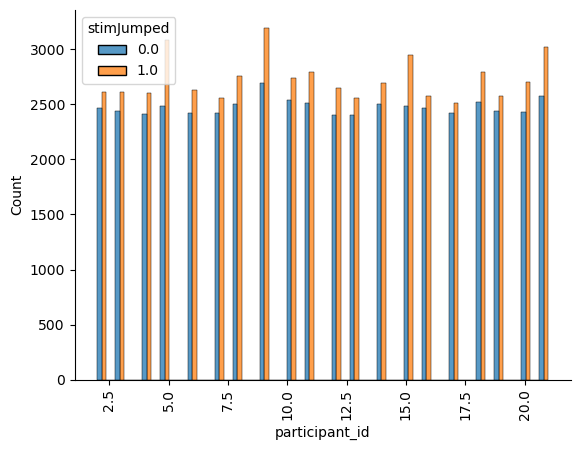

In [9]:
sns.histplot(data = full_data,
             x = 'participant_id',
             hue = 'stimJumped',
             multiple = 'dodge')
plt.xticks(rotation = 90);

### Show the distribution

In [10]:
participant_col = 'participant_id'
condition_col = 'condition_name'
jump_conds = ['no_jump', 'jump']
jump_col = 'stimJumped'
flash_conds = ['no_flash', 'flash']
flash_col = 'flashShown'

base_colors = ['3DA7B8', '333333', '777777', '3DA7B8']
shade_step_size = 0.01
time_col = 'touchOff_relative'

trial_data = trial_data.reset_index(drop = True)

### Show the distribution of each tap over time

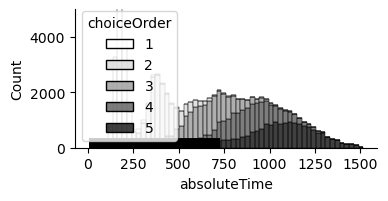

In [11]:
fig, axs = plt.subplots(1,1, figsize = (3.9, 1.8))
nonull_data = trial_data[trial_data.choiceOrder!=0]
nonull_data = nonull_data.reset_index(drop = True)
nonull_data['absoluteTime'] = nonull_data['touchOn'] + nonull_data['flashOnTime']
fig = sns.histplot(data=nonull_data,
                   x = 'absoluteTime',
                   hue = 'choiceOrder',
                   multiple='stack',
                   palette = 'Greys',
                   ax = axs);

plt.ylim([0,5000])

null_data = trial_data[trial_data.choiceOrder==0]
plt.hlines(100, min(null_data.flashOnTime), max(null_data.flashOnTime), color = 'black', linewidth = 10);
plt.savefig(f'{results_path}/movement_target_distribution.svg')

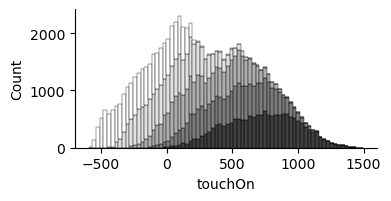

In [12]:
fig, axs = plt.subplots(1,1, figsize = (3.9, 1.8))
fig = sns.histplot(data=nonull_data,
                   x = 'touchOn',
                   hue = 'choiceOrder',
                   multiple='stack',
                   palette = 'Greys',
                   ax = axs,
                   legend = False);

plt.savefig(f'{results_path}/movement_target_distribution_after_event.svg')

### Typical duration of a trial

In [13]:
trial_durations = abs(trial_data[trial_data.choiceOrder == 0].touchOn.values - trial_data[trial_data.choiceOrder == 5].touchOn.values)

print(f'mean: {np.nanmean(trial_durations)}')
print(f'min: {np.nanmin(trial_durations)}')
print(f'max: {np.nanmax(trial_durations)}')
print(f'median: {np.nanmedian(trial_durations)}')      
print(f'std: {np.nanstd(trial_durations)}')      

mean: 1079.3515219701212
min: 611.0
max: 1516.0
median: 1084.0
std: 174.52943726720304


### Rate Analysis

#### Parameter Definition

In [14]:
# data file paths
movement_rate_metrics_path = f'{results_path}/movement_rate_metrics_{study_name}.csv' # here we put the path name for the rate metrics
movement_rate_figure_path = f'{results_path}/movement_rate_figure_{study_name}.svg' # here we put the path name for the rate metrics
movement_rate_test_path  = f'{data_path}/test_files/movement_rate_test_{study_name}.csv' # this is a test file we create manually by saving the first version of the analysis testing for validity
movement_rate_cluster_file = f'{results_path}/movement_rate_clusters_{study_name}.csv'
raw_movement_rate_file = f'{results_path}/raw_movement_rate_clusters_{study_name}.svg'

# define the conditions
conditions_rates = {
    'flash_jump': {'flashShown': 1,
                  'stimJumped': 1},
    'flash_no_jump': {'flashShown': 1,
                  'stimJumped': 0},
    'no_flash_jump': {'flashShown': 0,
                  'stimJumped': 1},
    'no_flash_no_jump': {'flashShown': 0,
                  'stimJumped': 0},
}

# define color scheme for plots
# define the conditions
conditions_rates = {
    'flash+ jump+': {'flashShown': 1,
                  'stimJumped': 1},
    'flash+ jump-': {'flashShown': 1,
                  'stimJumped': 0},
    'flash- jump+': {'flashShown': 0,
                  'stimJumped': 1},
    'flash- jump-': {'flashShown': 0,
                  'stimJumped': 0},
}

color_rates = {'flash+ jump+': '#C73E1D', 
          'flash+ jump-': '#C73E1D', 
          'flash- jump+': '#333333', 
          'flash- jump-': '#333333'}

linestyles = {
          'flash+ jump+': '-', 
          'flash+ jump-': '--', 
          'flash- jump+': '-', 
          'flash- jump-': '--'}

# set parameters for our analysis
rate_analysis_parameters = {'window_start': -700,
                            'window_end': 1500,
                            'search_start': 0,
                            'search_end': 700,
                            'baseline_start': -100,
                            'baseline_end': 0,
                            'alpha': 1/50}

# define column names for the analysis
move_offset_col = 'touchOn_relative' # touchOn marks the time participants tapped on the screen. This happens at the END of a movement
move_onset_col = 'touchOff_relative' # touchOff is the time participants lifted their finder from the screen. This is the ONSET of a movement
participant_col = 'participant_id'
touch_order_col = 'choiceOrder'

# define the condition name for the baseline
baseline_name = 'flash- jump-'

# ANOVA - define variables 
# We'll run one ANOVA per DV, with all IVs as input
dependent_variables = ['magnitude', 'latency']
independent_variables = ['flash_shown', 'stim_jumped']

#### Run Analysis

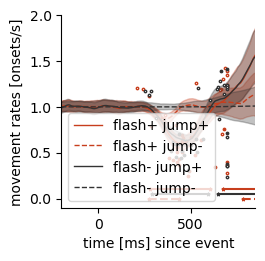

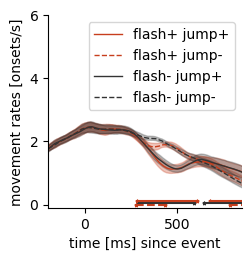

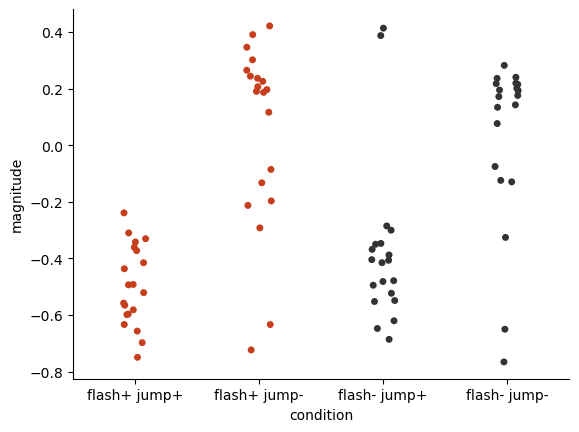

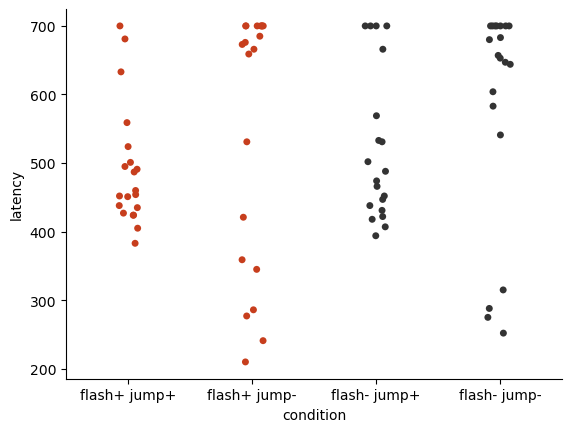

Results from ANOVA with 
DEPENDENT variable: MAGNITUDE; 
INDEPENDENT variables: ['FLASH_SHOWN', 'STIM_JUMPED'], 
GROUPED by: PARTICIPANT_ID


                        Anova
                        F Value Num DF  Den DF Pr > F
-----------------------------------------------------
flash_shown              2.2552 1.0000 19.0000 0.1496
stim_jumped             52.7648 1.0000 19.0000 0.0000
flash_shown:stim_jumped  3.3959 1.0000 19.0000 0.0810

Results from ANOVA with 
DEPENDENT variable: LATENCY; 
INDEPENDENT variables: ['FLASH_SHOWN', 'STIM_JUMPED'], 
GROUPED by: PARTICIPANT_ID


                        Anova
                        F Value Num DF  Den DF Pr > F
-----------------------------------------------------
flash_shown              3.9757 1.0000 19.0000 0.0607
stim_jumped              2.6499 1.0000 19.0000 0.1200
flash_shown:stim_jumped  0.0413 1.0000 19.0000 0.8412



In [15]:
analysis_rates(trial_data,
               move_offset_col,
               move_onset_col,
               participant_col,
               rate_analysis_parameters,
               touch_order_col,
               conditions_rates, 
               color_rates,
               linestyles,
               movement_rate_metrics_path,
               movement_rate_figure_path,
               raw_movement_rate_file,
               dependent_variables,
               independent_variables,
               baseline_name,
               results_path,
               movement_rate_cluster_file)

#### Test if the metrics changed

In [16]:
# parse.test_file_equality(movement_rate_metrics_path, movement_rate_test_path)

In [17]:
# Characterization of the raw movement rates
raw_rate_path = f'{results_path}/movement_rates_raw_{study_name}.csv'
raw_rates = pd.read_csv(raw_rate_path)
raw_rates_window = raw_rates[[str(x) for x in np.arange(-100, 0)]]
raw_rates['median_rate'] = raw_rates_window.median(axis = 1, numeric_only = True)
raw_rates = raw_rates[['participant', 'index', 'median_rate']]
describe_rates = raw_rates.groupby(['index']).describe()['median_rate']
describe_rates['sem'] = describe_rates['std']/np.sqrt(describe_rates['count'])
describe_rates

,count,mean,std,min,25%,50%,75%,max,sem
index,,,,,,,,,
flash+ jump+,20.0,4.877846,0.530838,4.264397,4.454666,4.763832,4.970798,6.302087,0.118699
flash+ jump-,20.0,4.924826,0.555972,4.328386,4.474074,4.813788,5.083055,6.354484,0.124319
flash- jump+,20.0,4.927882,0.559010,4.362531,4.585214,4.738638,5.062385,6.464918,0.124998
flash- jump-,20.0,4.880019,0.547693,4.156097,4.523630,4.794743,4.960930,6.391547,0.122468


### Obsersation in plot above:

*Type here* 

### Trial-by-Trial Analysis

- statistical comparison to baseline
- add distribution of trial numbers

In [18]:
figure_path = f'{results_path}/flight_rest_times_figure.svg' # Here we put the name of the figure where we want to save the movement duration analysis


conditions_dict = {
     'flash- jump-': {'flashShown': 0,
                  'stimJumped': 0},
     'flash- jump+': {'flashShown': 0,
                  'stimJumped': 1},
    'flash+ jump+': {'flashShown': 1,
                  'stimJumped': 1},
    'flash+ jump-': {'flashShown': 1,
                  'stimJumped': 0},
   
   
    }


baseline_condition_dict = {'flashShown': 0,
                  'stimJumped': 0}

touch_onset_col = 'touchOn'
touch_offset_col = 'touchOff'
touch_relative_col = 'touchOff_relative'

plot_columns = {'rest': 'rest_times', 'flight': 'flight_times'}

color_rates = {'flash+ jump+': '#C73E1D', 
          'flash+ jump-': '#C73E1D', 
          'flash- jump+': '#333333', 
          'flash- jump-': '#333333'}

linestyles = {
          'flash+ jump+': '-', 
          'flash+ jump-': '--', 
          'flash- jump+': '-', 
          'flash- jump-': '--'
    
}

smooth_window = 50

heatmap_parameters = {'n_col': 42, 'n_row': 20,  'x_min': -700,
                      'x_max': 1400, 'y_min': 0, 'y_max': 500}
heatmap_figure_path = f'{results_path}/heatmaps_latencies_figure.svg'
individual_heatmap_figure_path = f'{results_path}/heatmaps_individual_latencies_figure.svg'
cluster_1d_path = f'{results_path}/rest_flight_time_cluster.csv'
cluster_2d_path = f'{results_path}/heatmap_flight_cluster.csv'

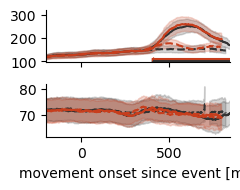

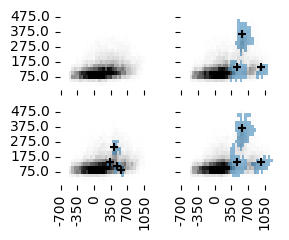

In [19]:
time, participant_timings = trial_by_trial_analysis(trial_data, 
                                                    touch_relative_col, 
                                                    plot_columns, 
                                                    conditions_dict, 
                                                    baseline_condition_dict, 
                                                    color_rates, 
                                                    linestyles,
                                                    participant_col, 
                                                    touch_onset_col, 
                                                    touch_offset_col, 
                                                    smooth_window, 
                                                    figure_path,
                                                    heatmap_parameters, 
                                                    heatmap_figure_path,
                                                    cluster_1d_path,
                                                    cluster_2d_path,
                                                    results_path)

### Response Position - Mixed or Distinct? 

In [20]:
conditions_dictionary = {'jump +': {'stimJumped': 1},
                         'jump -': {'stimJumped': 0}}

window_center_col = 'window_center'
touch_col = 'touch'
point_col = 'shifted_position'
origin_col = 'position'
dimensions = ['x', 'y']
rotation_degrees = 180
align_position_cols = ['shifted_position', 'centered_touch', 'position']
participant_col = 'participant_id'
heatmap_params = {
    'n_col': 105,
    'n_row': 30,
    'x_min': -700,
    'x_max': 1400,
    'y_min': -1,
    'y_max': 2
}

ci = 0.96
time_col = 'touchOff_relative'

window_width_col = 'windowWidth'
window_height_col = 'windowHeight'
tap_order_col = 'choiceOrder'
scrambled_col = 'scrambled_position'

cluster_table_path = f'{results_path}/landing_position_heatmap_cluster.csv'

# some data transforms
trial_data[f'{window_center_col}_x'] = trial_data[window_width_col]/2
trial_data[f'{window_center_col}_y'] = trial_data[window_height_col]/2

trial_data[f'{touch_col}_x'] = trial_data['touchX']
trial_data[f'{touch_col}_y'] = trial_data['touchY']

# create scrambled comparison for no_jump condition
scramble_data = scramble_columns_piecewise(trial_data, f'{point_col}_x', tap_order_col, f'{scrambled_col}_x', 'subject')
scramble_data = scramble_columns_piecewise(scramble_data, f'{point_col}_y', tap_order_col, f'{scrambled_col}_y', 'subject')
test_data = trial_data.copy(deep = True)
test_data.loc[test_data.stimJumped == 0, f'{point_col}_x'] = scramble_data[scramble_data.stimJumped == 0][f'{scrambled_col}_x'].values
test_data.loc[test_data.stimJumped == 0, f'{point_col}_y'] = scramble_data[scramble_data.stimJumped == 0][f'{scrambled_col}_y'].values

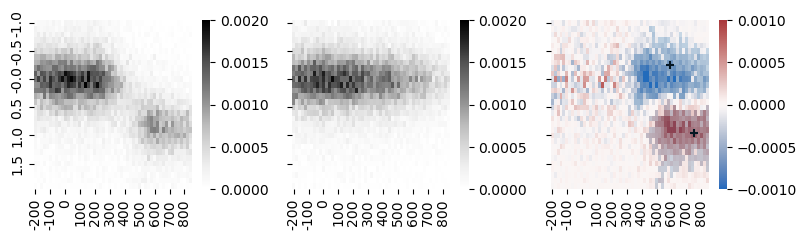

In [21]:
heatmap_dictionary = response_density_analysis(test_data, conditions_dictionary, 
                                               window_center_col, touch_col, 
                                               point_col, origin_col, 
                                               dimensions, rotation_degrees,
                                               align_position_cols, participant_col, 
                                               heatmap_params, time_col, ci, results_path,
                                               cluster_table_path)

## Parse Light Files

In [22]:
participants = ['P02', 'P03', 'P04', 'P05', 'P06', 'P07', 'P08', 'P09', 'P10', 'P11', 'P12', 'P13', 'P14', 'P15', 'P16', 'P17', 'P18', 'P19', 'P20', 'P21']
bad_participants = ['P01']

sessions = ['A1', 'A2']
recordings = ['01', '02', '03']

regular_blocks = np.arange(1, 11)

meta_path = f'../../../data/{study_type}/combined_meta'

In [55]:

#all_trial_data = complete_data[complete_data['component'] == 'Trials_Serial']
#all_trial_data = all_trial_data[all_trial_data['trial_type'] == 'canvas-mi-serial'].dropna(how = 'all', axis = 1).reset_index(drop = True)

In [25]:
calibration_data = parse_diode_information(raw_input_path)
calibration_data = calibration_data[calibration_data['component'] == 'Calibrate_Screen']
calibration_data = calibration_data[calibration_data['trial_type'] == 'virtual-chinrest'].dropna(how = 'all', axis = 1)
calibration_data = parse.add_participant_id(calibration_data, 
                                              session2part_dict, 
                                              session_code_col, 
                                              condition_code, 
                                              id_col_name,
                                              session_col_name)
calibration_data.dropna().to_csv(f'{data_path}/raw/calibration.csv', index = False)

P02 A1 01


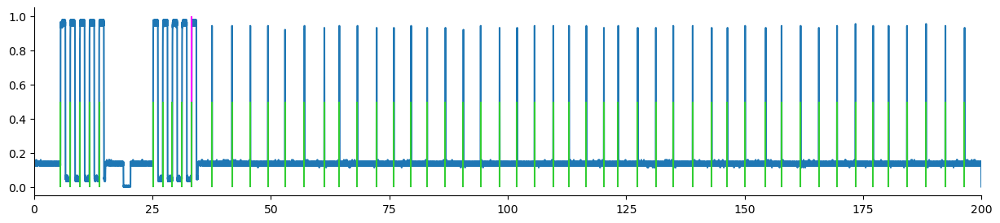

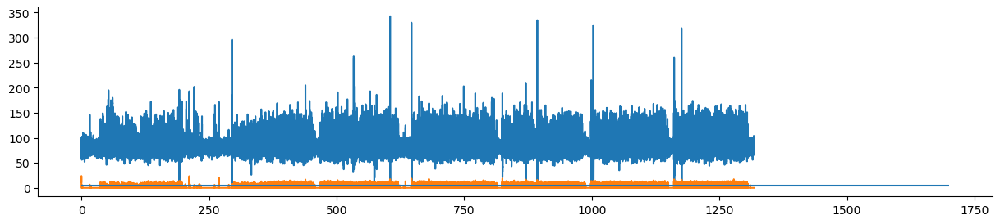

P02 A2 01


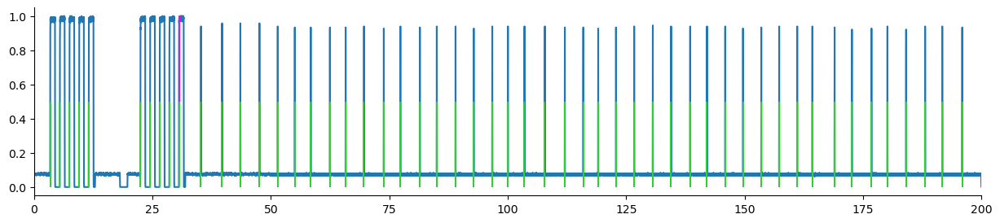

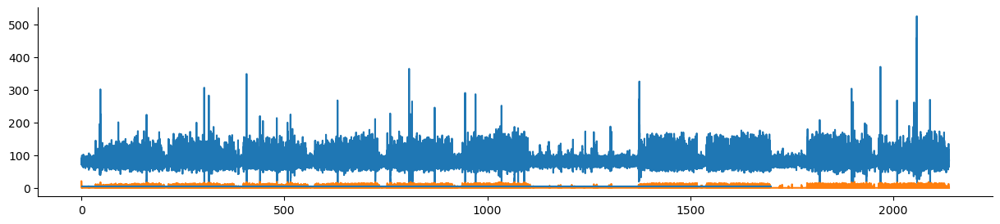

P03 A2 01


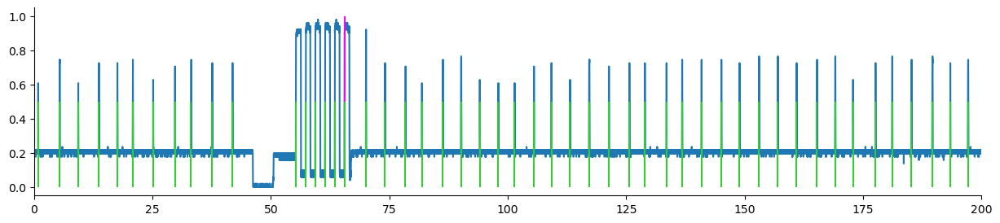

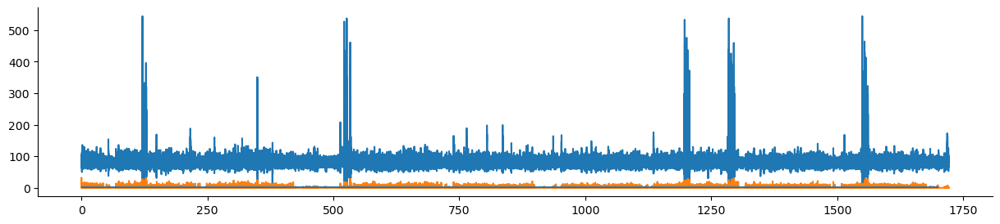

P04 A1 01


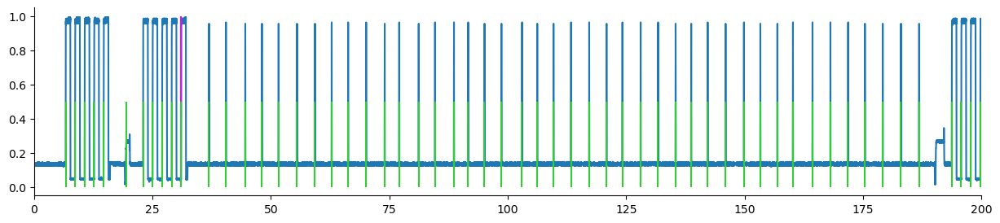

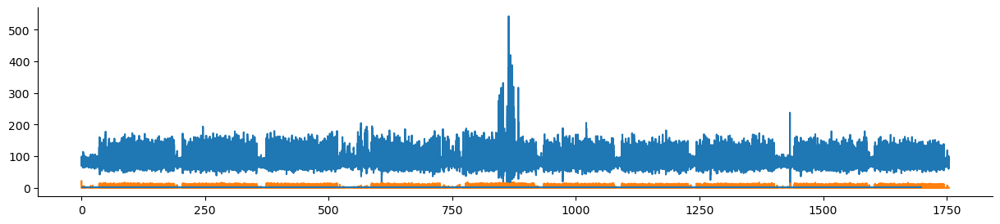

P04 A2 01


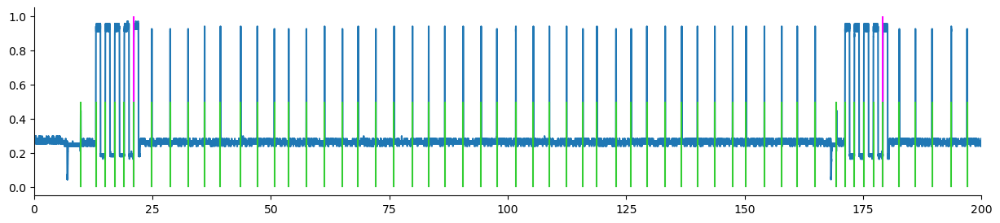

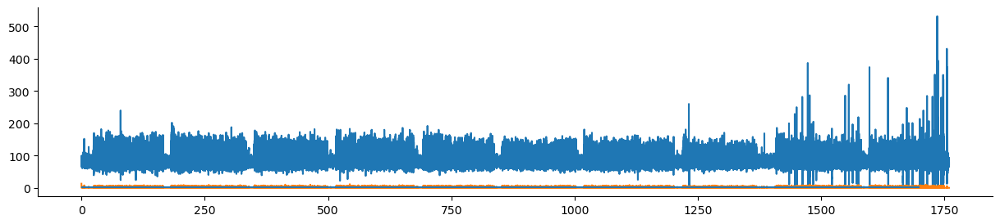

P05 A1 01


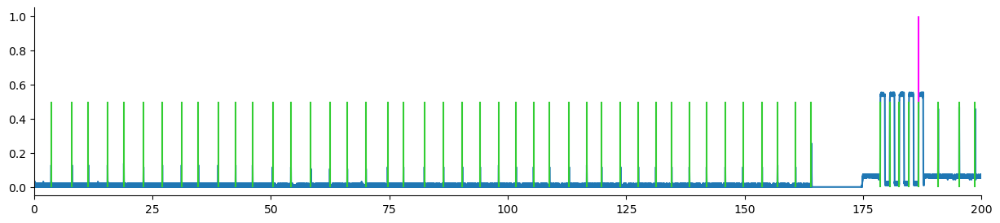

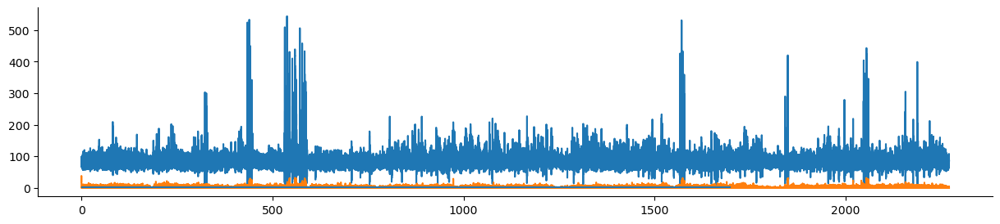

P05 A2 01


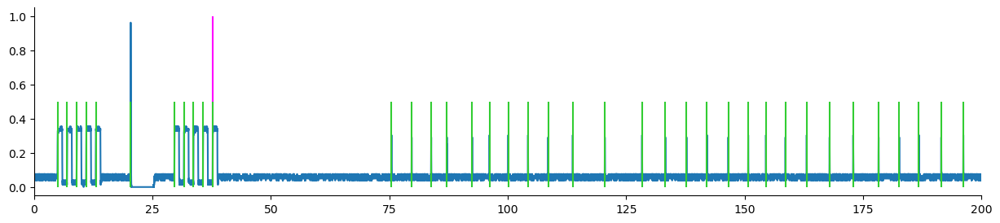

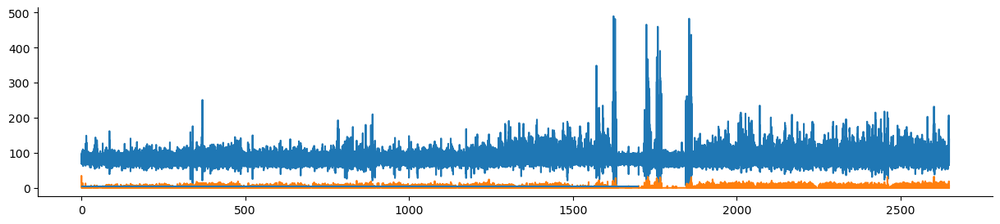

P07 A2 01


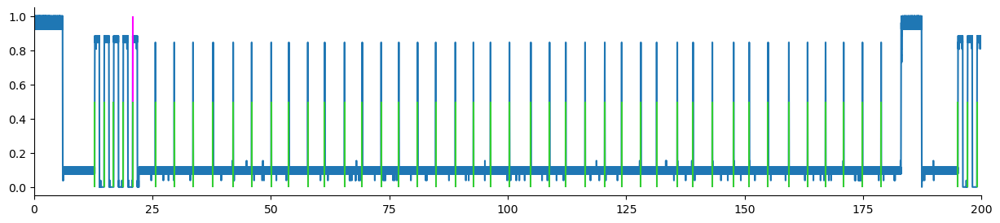

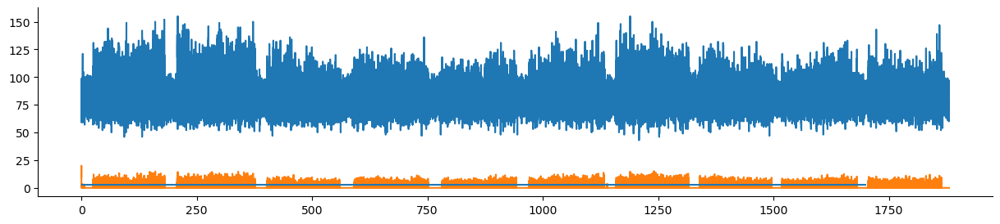

P08 A1 01


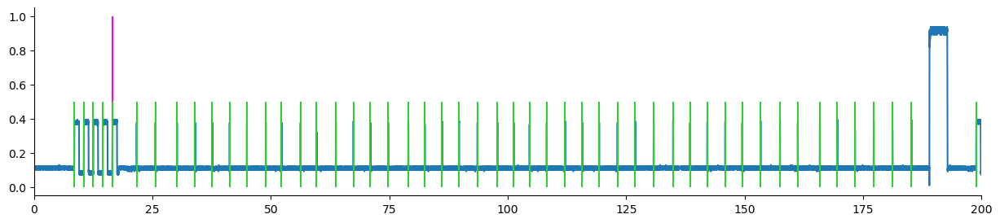

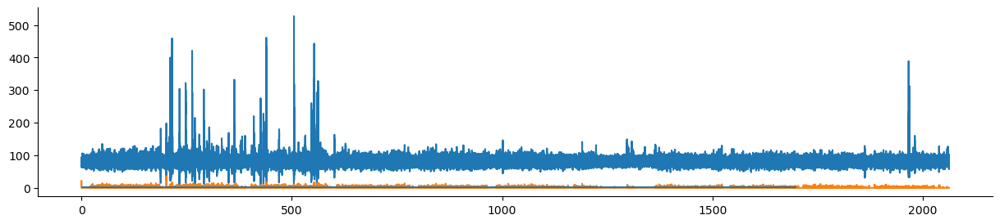

P08 A2 01


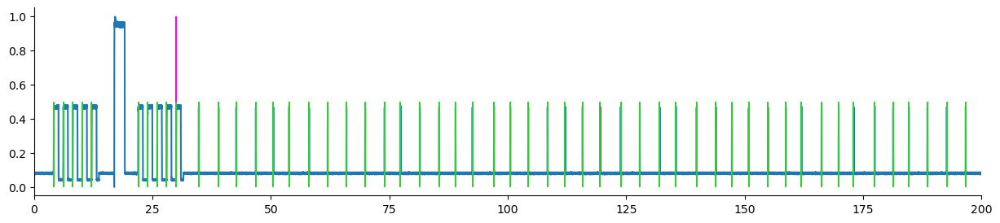

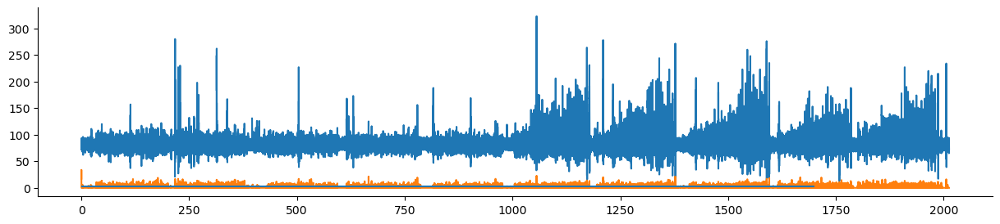

P09 A1 01


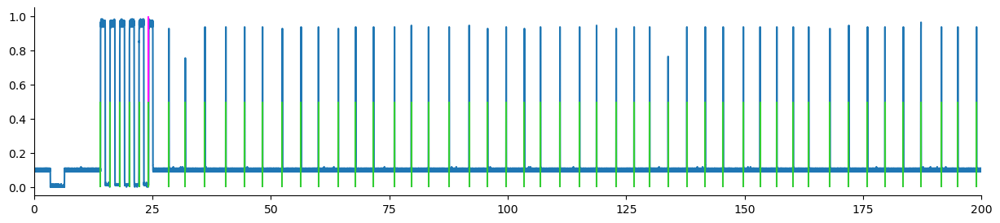

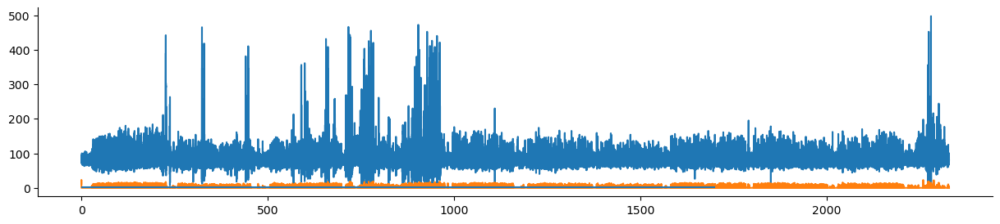

P09 A2 01


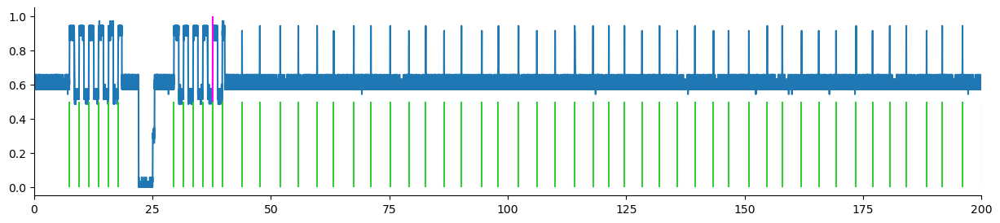

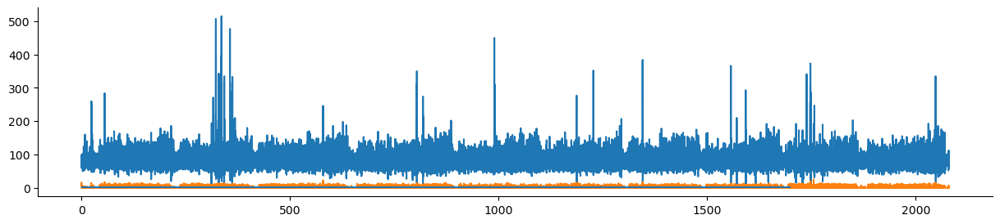

P10 A1 01


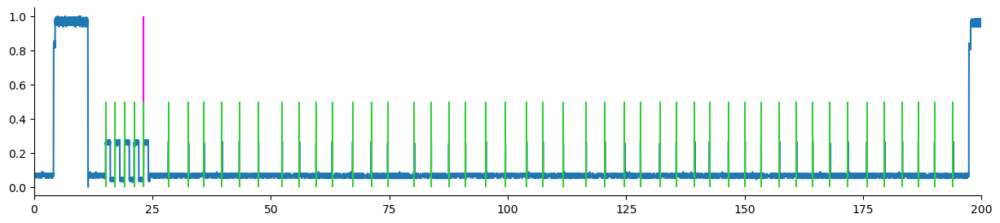

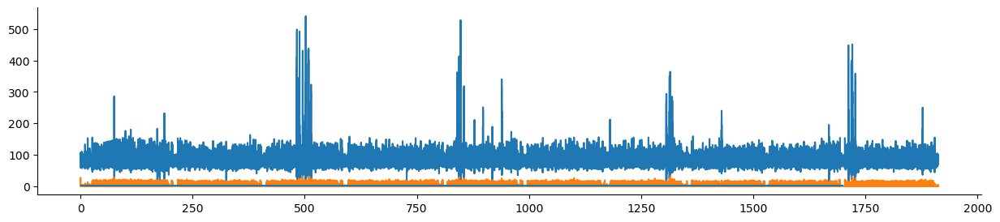

P10 A2 01


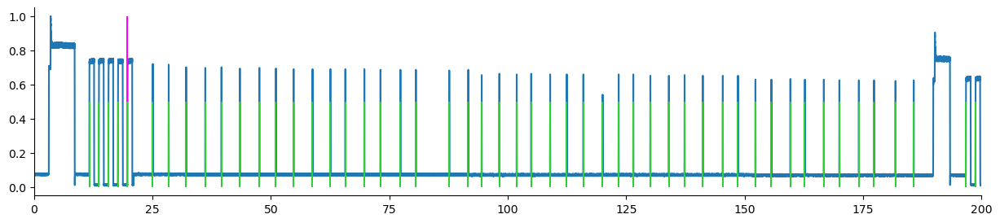

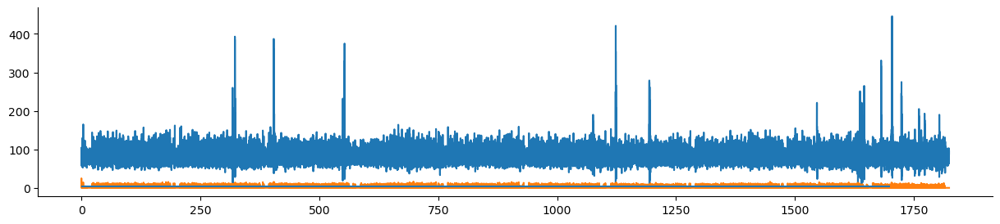

P11 A1 01


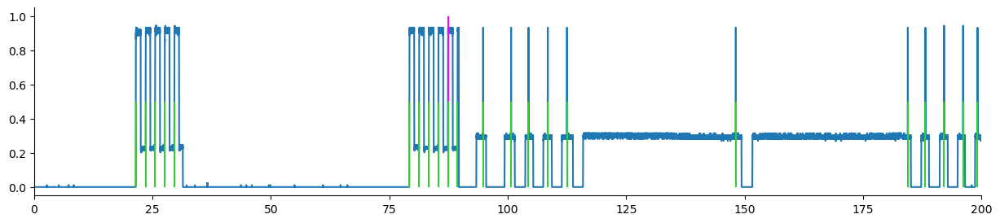

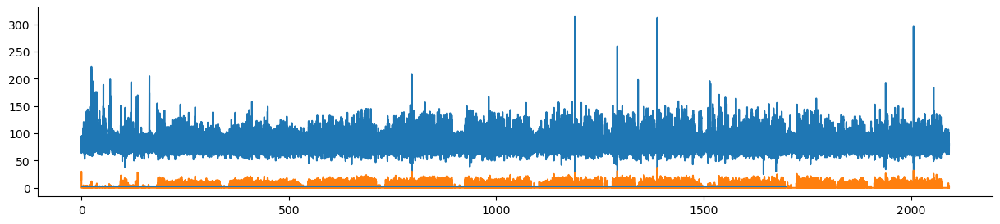

P11 A2 01


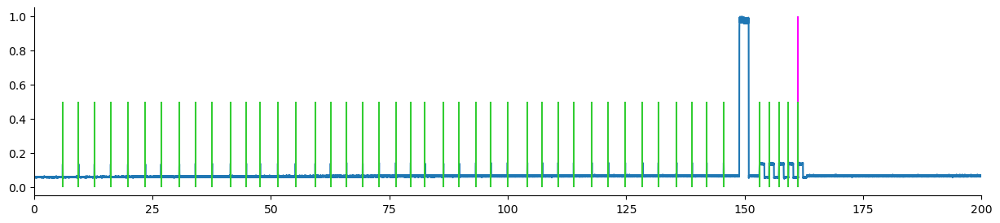

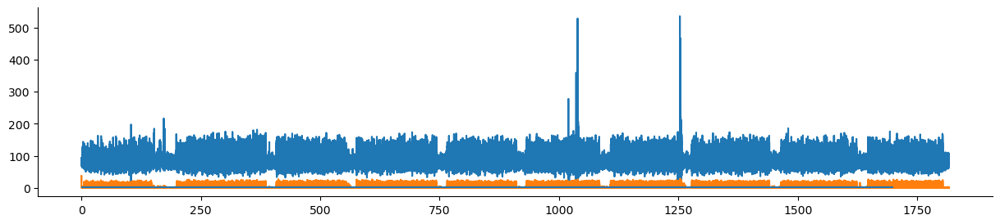

P12 A1 01


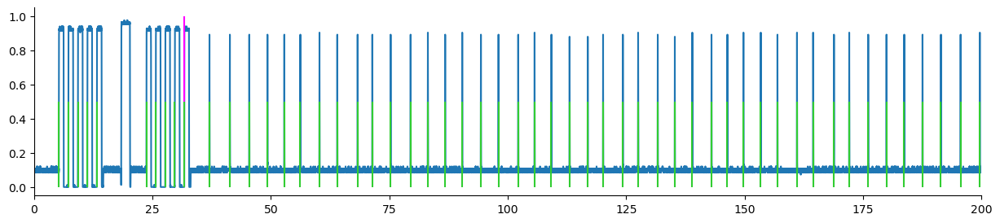

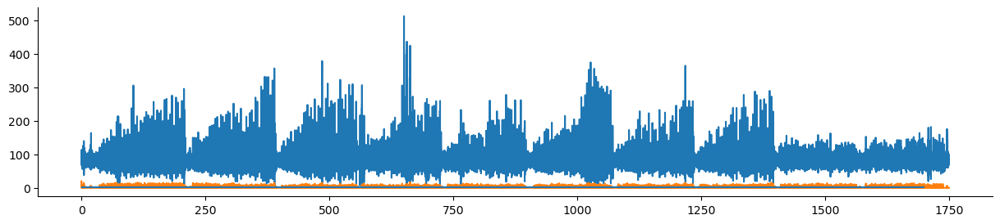

P12 A2 01


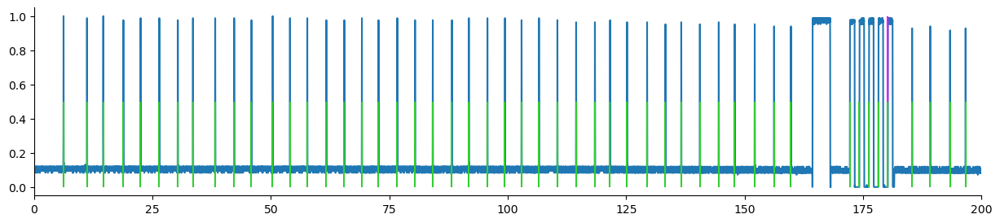

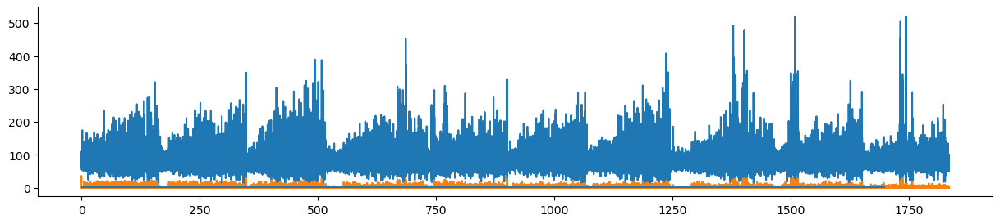

P13 A1 01


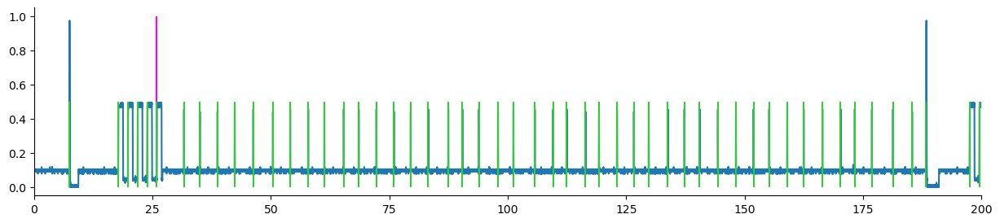

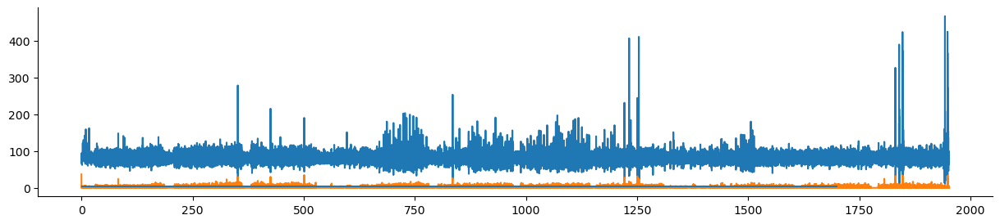

P13 A2 01


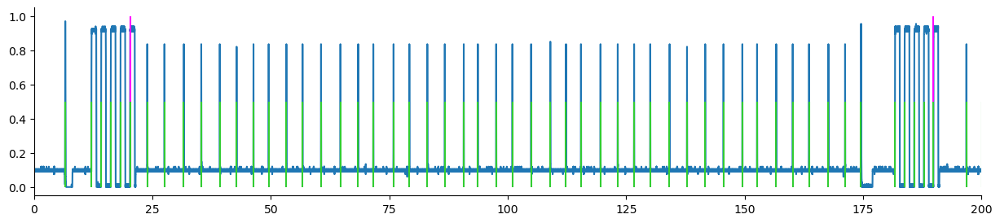

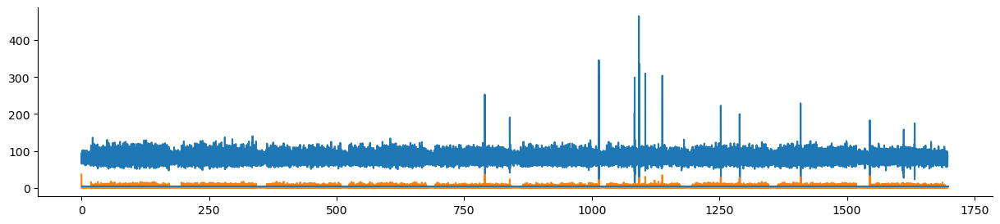

P14 A1 01


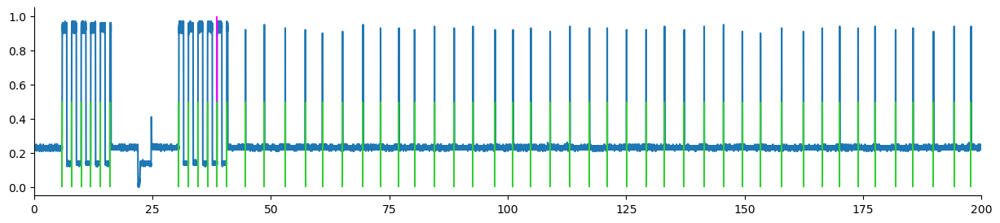

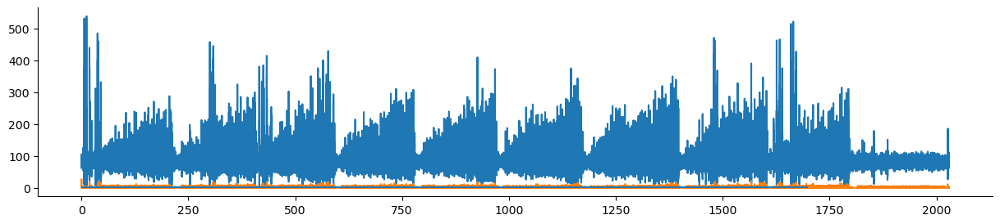

P14 A2 01


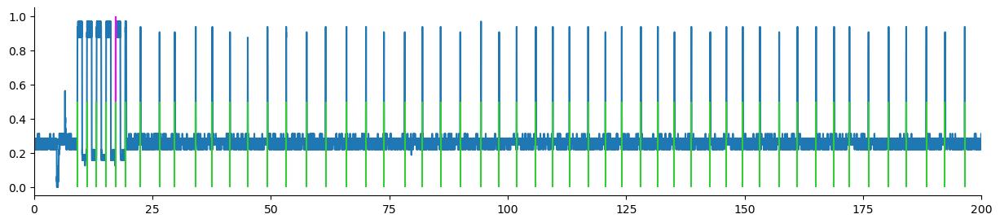

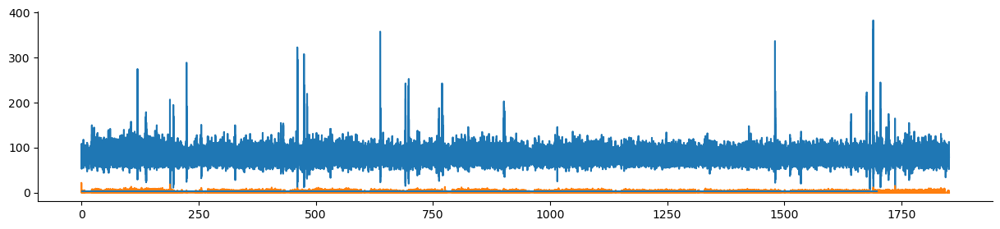

P15 A1 01


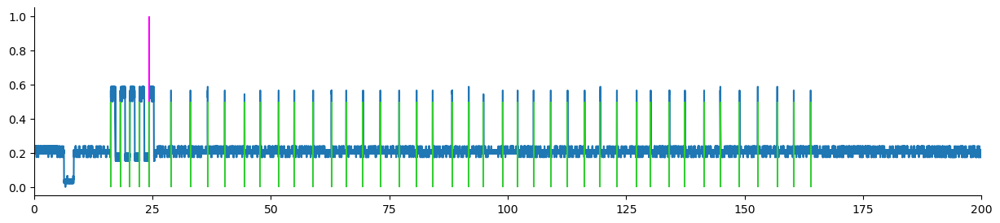

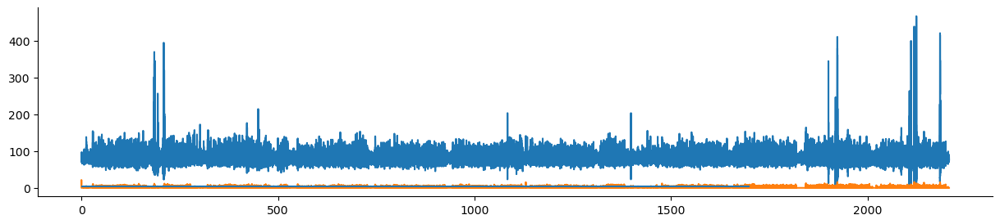

P16 A1 01


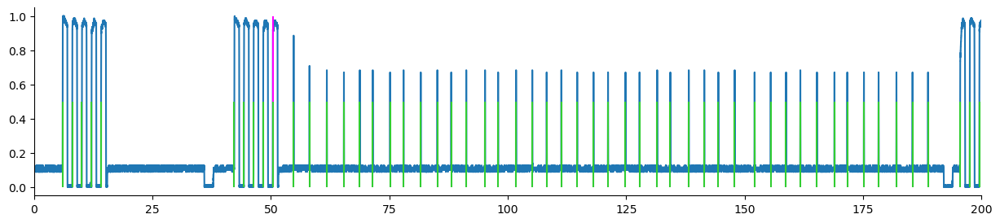

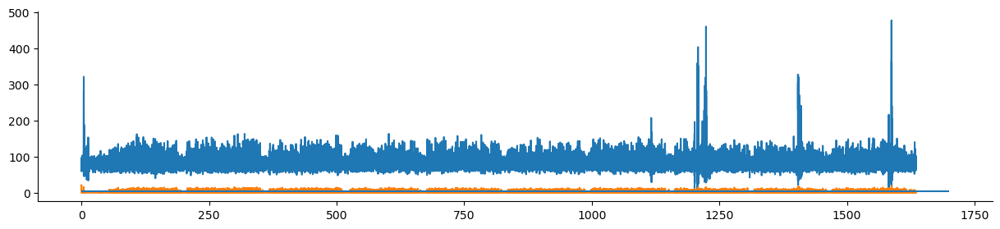

P16 A2 01


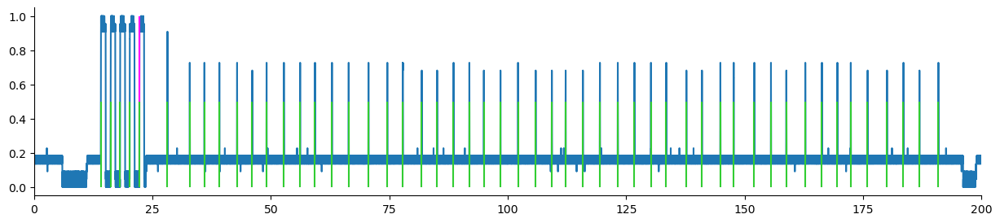

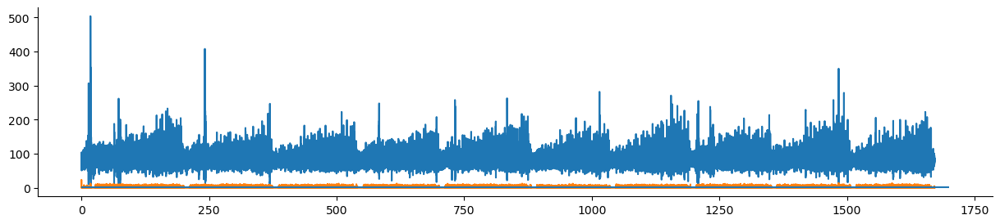

P17 A1 01


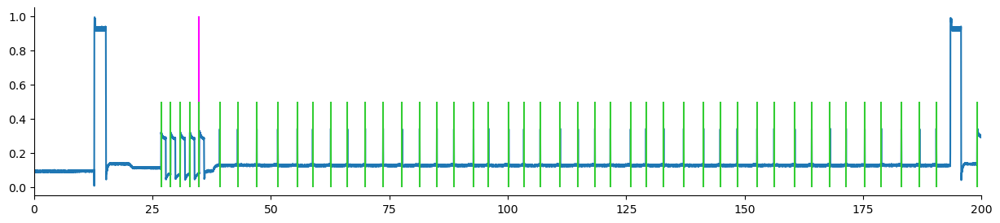

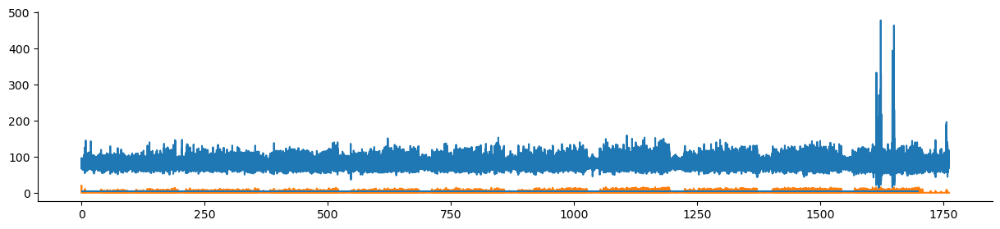

P17 A2 01


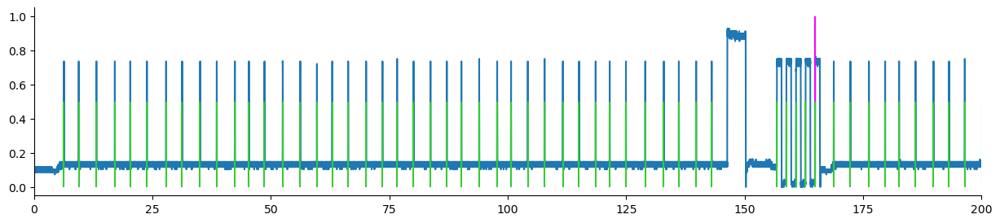

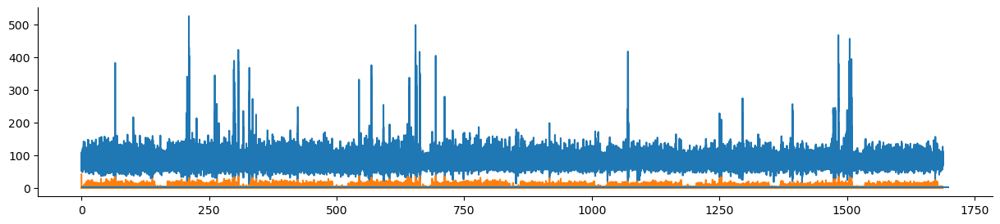

P18 A1 01


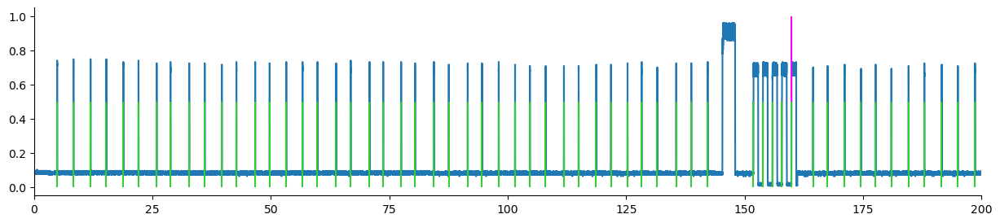

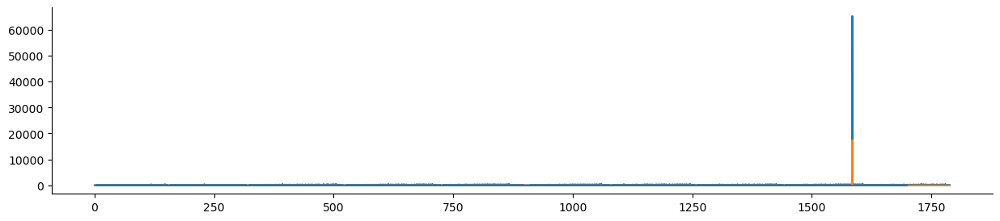

P18 A2 01


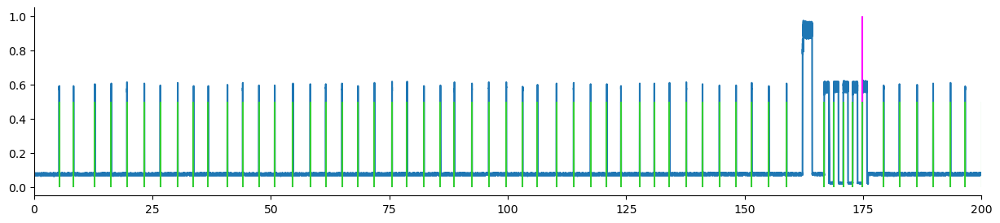

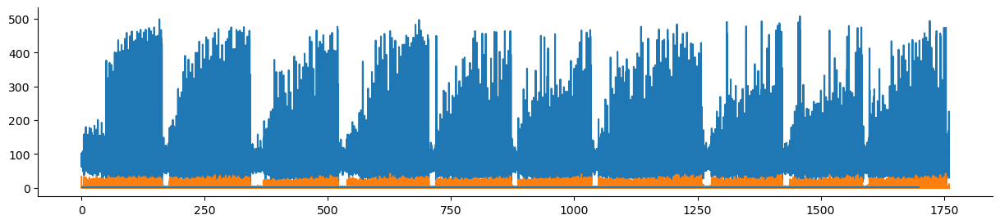

P19 A1 01


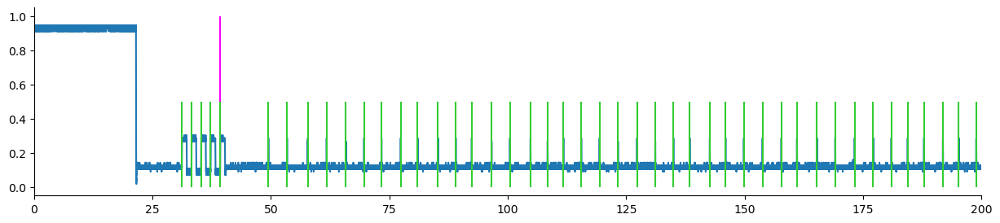

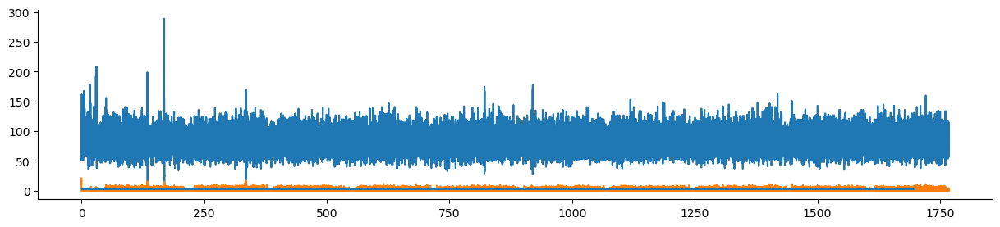

P19 A2 01


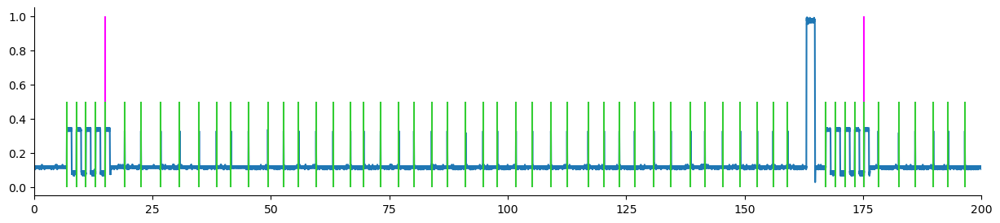

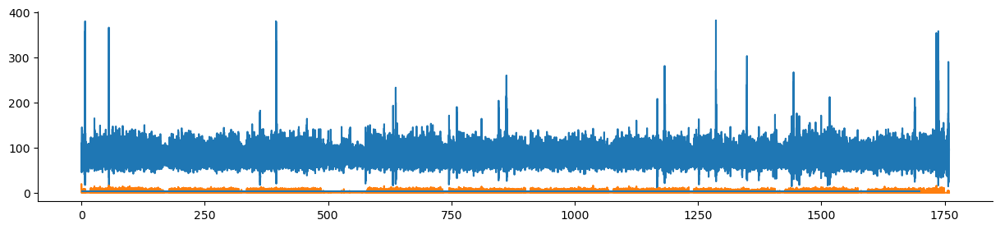

P20 A1 01


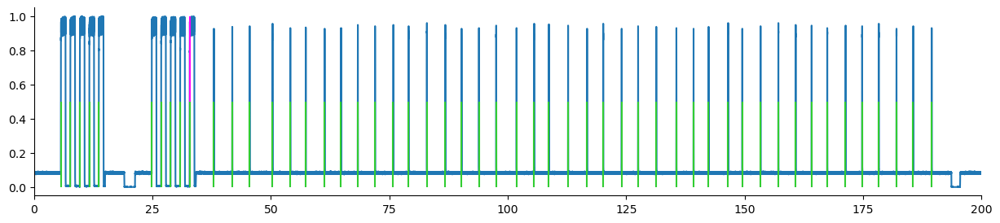

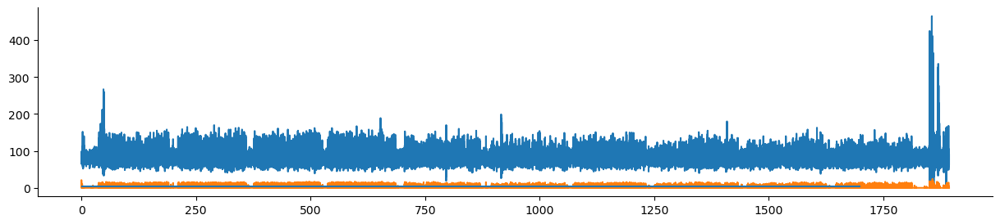

P20 A2 01


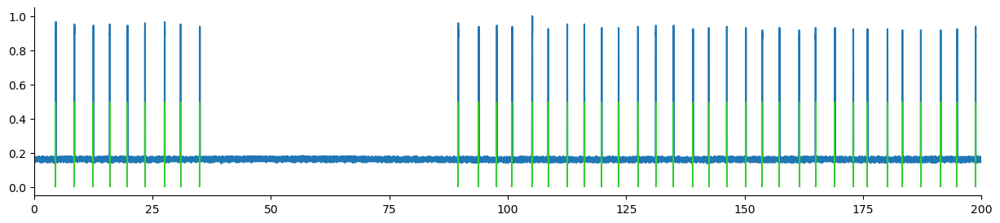

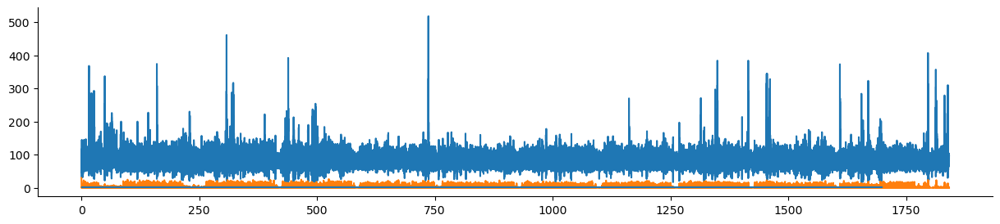

P21 A1 01


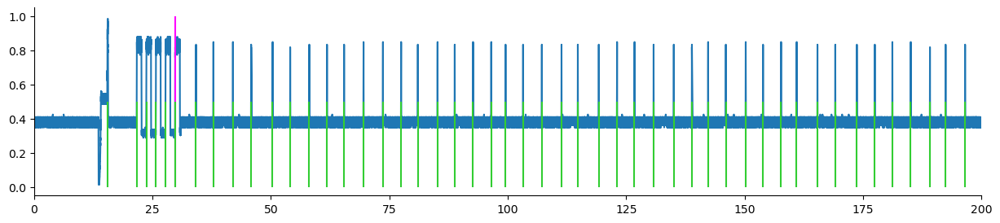

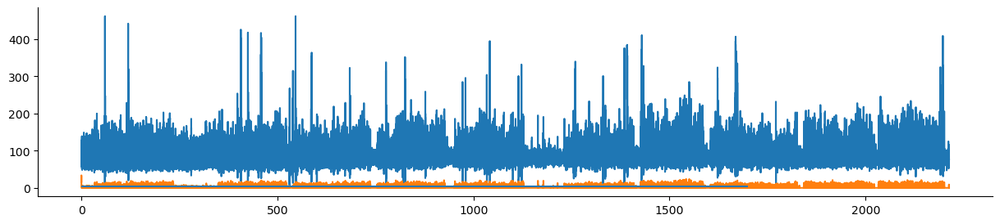

P21 A2 01


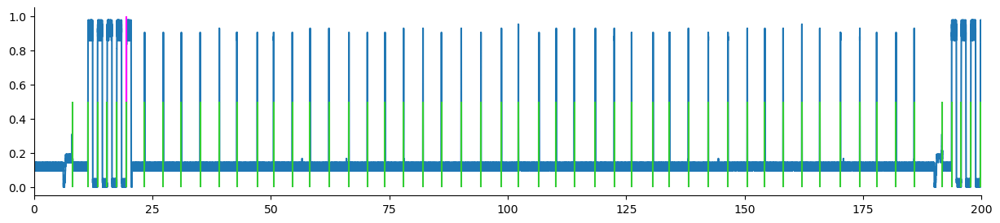

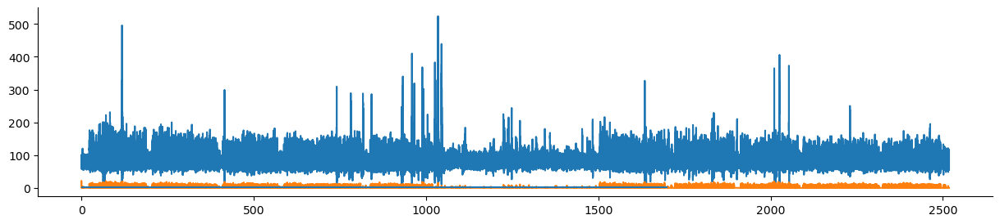

In [26]:
meta_info = pd.read_csv(f'{meta_path}/gaze_meta_info.csv')
# loop through all participants
all_blocks = pd.DataFrame()
all_events = pd.DataFrame()
all_taps = pd.DataFrame()

for p in participants:
    p_code = p.split('P')[1]
    p_info = meta_info[meta_info.participant == p]
    # loop through all sessions - this is one folder
    for s in sessions:
        s_info = p_info[p_info.session == s]
        # loop through recordings - this in one file
        for r in recordings:
            try:
                light_data = pd.read_csv(f'{data_path}/raw/{p}/{s}/{p_code}_{s}_{r}_light.csv')
                sound_data = pd.read_csv(f'{data_path}/raw/{p}/{s}/{p_code}_{s}_{r}_loud.csv')
                r_info = s_info[s_info.recording == int(r)]
                
                if r_info.parse.values:
                    print(p, s, r)
                    light_data['adjusted_timestamp'] = light_data[' timestamp']-light_data[' timestamp'][0]
                    light_data['adjusted_value'] = light_data[' light_value']/max(light_data[' light_value'])
                    sound_data['adjusted_timestamp'] = sound_data[' timestamp'] - sound_data[' timestamp'][0]
                    sound_data['adjusted_value'] = sound_data[' loud_value']

                    fig, axs = plt.subplots(1,1, figsize = (15, 3))
                    axs.plot(light_data['adjusted_timestamp'], light_data['adjusted_value'])
                    
                    events = ld.detect_change_signal(light_data['adjusted_timestamp'], light_data['adjusted_value'], threshold = r_info.detection_threshold.values)
                    events = events[events.duration <= 1.1].reset_index(drop = True)    
    
                    distance_to_next = pd.Series(events[0:-1]['end_time'].values - events['start_time'][1:].values, 
                                                 name = 'distance_to_next',
                                                index = events.index[0:-1])
    
                    events = pd.concat([events, distance_to_next], axis = 1)
                    events = events[abs(events.distance_to_next) >= 0.1].reset_index(drop = True)

                    if len(r_info) > 2:
                        print('r_info longer than 2!')
                        print(r_info)
                    
                    missing_blocks = r_info.missing_blocks.values[0]
                    original_block_list = np.arange(1, 11)
                    
                    include_blocks = get_relevant_blocks(original_block_list, missing_blocks, r_info.reloaded_blocks.values[0])
                    
                    try:
                        blocks = ld.get_block_onsets(events.start_time.values, events.duration.values, include_blocks)
                        events['block'] = np.nan
                        for idx in blocks.index:
                            block = blocks.loc[idx, 'block_number']
                            onset = blocks.loc[idx, 'onset']
                            axs.vlines(onset, 0, 1, color = 'magenta')
                            try:
                                offset = blocks.loc[idx+1, 'onset'] - 9
                            except KeyError:
                                offset = max(events.start_time)
                            blocks.loc[idx, 'offset'] = offset
    
                            events.loc[events.start_time.between(onset, offset),'block'] = block
                    except Error as e:
                        print(e)
                        pass
                    axs.vlines(events.start_time, 0, 0.5, color = 'limegreen')
                    axs.set_xlim(0,200)
                    plt.show()
                    events['potential_change_onset'] = events.duration < 0.2
                    
                    # sound
                    fig, axs = plt.subplots(1,1, figsize = (15, 3))
                    axs.plot(sound_data['adjusted_timestamp'], sound_data['adjusted_value'])
                    
                    fs = 1/np.median(np.diff(sound_data['adjusted_timestamp']))
                    lowcut = r_info.iloc[-1]['lowcut']
                    highcut = r_info.iloc[-1]['highcut']
                    noise_threshold = r_info.iloc[-1]['noise_threshold']

                    filtered_sound, raw_filtered = sd.filter_events(sound_data['adjusted_value'], lowcut, highcut, fs, threshold = noise_threshold)
                    sound_data['filtered_values'] = filtered_sound
                    axs.plot(sound_data['adjusted_timestamp'], filtered_sound)
                    axs.hlines(noise_threshold, 0, 1700)
                    
                    detected_touches = sd.detect_touch_events(sound_data['adjusted_timestamp'], sound_data['filtered_values'])

                    #axs.vlines(block_taps[block_taps.start_time.between(60, 90)].start_time, 0, 300, color = 'magenta')
                    
                    # block structure to both
                    for idx in blocks.index:
                        block = blocks.loc[idx, 'block_number']
                        block_events = events[events.start_time.between(blocks.loc[idx, 'onset'], blocks.loc[idx, 'offset'])]
                        block_sound = sound_data[sound_data.adjusted_timestamp.between(blocks.loc[idx, 'onset'] - 10, blocks.loc[idx, 'offset'])]
                        block_taps = detected_touches[detected_touches.start_time.between(blocks.loc[idx, 'onset'], blocks.loc[idx, 'offset'])]
                        block_light = light_data[light_data.adjusted_timestamp.between(blocks.loc[idx, 'onset'] - 10, blocks.loc[idx, 'offset'])]
                        detected_touches.loc[detected_touches.start_time.between(blocks.loc[idx, 'onset'] - 10, blocks.loc[idx, 'offset']), 'block_number'] = block
                        # axs.vlines(block_taps.start_time, 0, 300, color = 'magenta')
                    plt.show()
                    events['participant'] = p
                    events['session'] = s
                    events['recording'] = r

                    all_events = pd.concat([all_events, events], ignore_index = True)

                    blocks['participant'] = p
                    blocks['session'] = s
                    blocks['recording'] = r

                    all_blocks = pd.concat([all_blocks, blocks], ignore_index = True)

                    detected_touches['participant'] = p
                    detected_touches['session'] = s
                    detected_touches['recording'] = r

                    all_taps = pd.concat([all_taps, detected_touches], ignore_index = True)
            
            except FileNotFoundError as e:
                if r == '01':
                    print(e)
                pass

In [27]:
all_events.to_csv(f'{data_path}/preprocessed/light_diode_events.csv', index = False)
all_blocks.to_csv(f'{data_path}/preprocessed/light_diode_blocks.csv', index = False)
all_taps.to_csv(f'{data_path}/preprocessed/sound_sensor_taps.csv', index = False)

In [28]:
meta_info = pd.read_csv(f'{meta_path}/gaze_meta_info.csv')
full_data['event_onset_in_block'] = np.nan

P02 A1
1


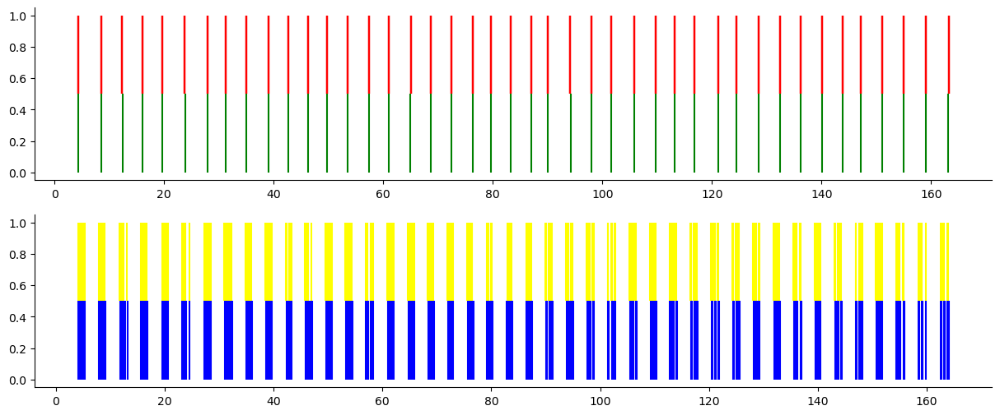

NAN percentage: 32%
2


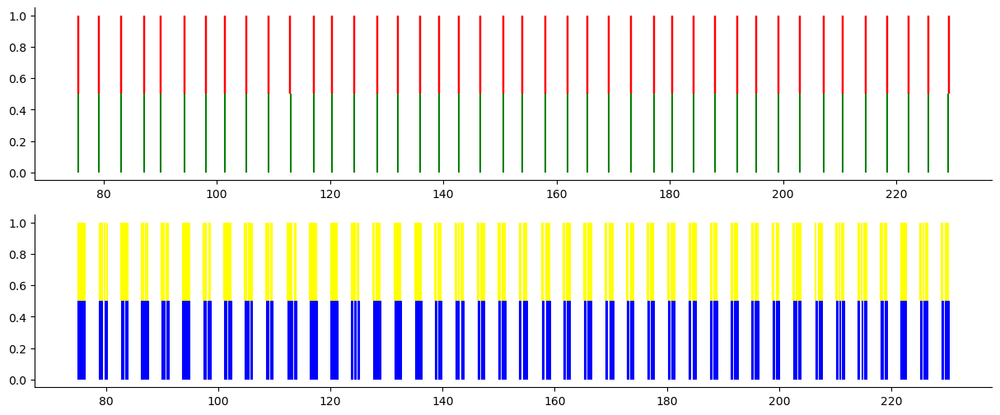

NAN percentage: 32%
3


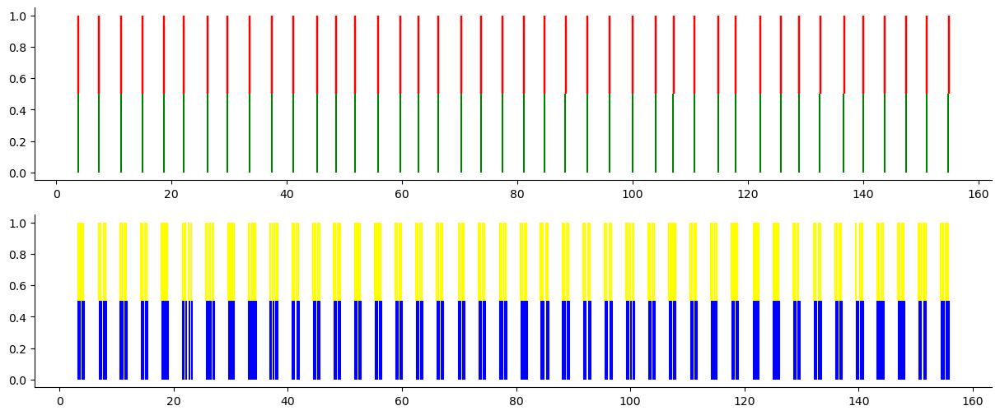

NAN percentage: 32%
4


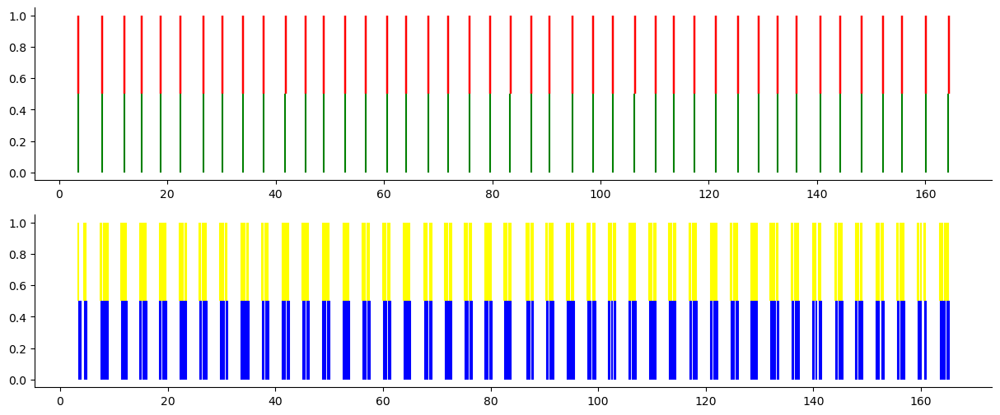

NAN percentage: 32%
5


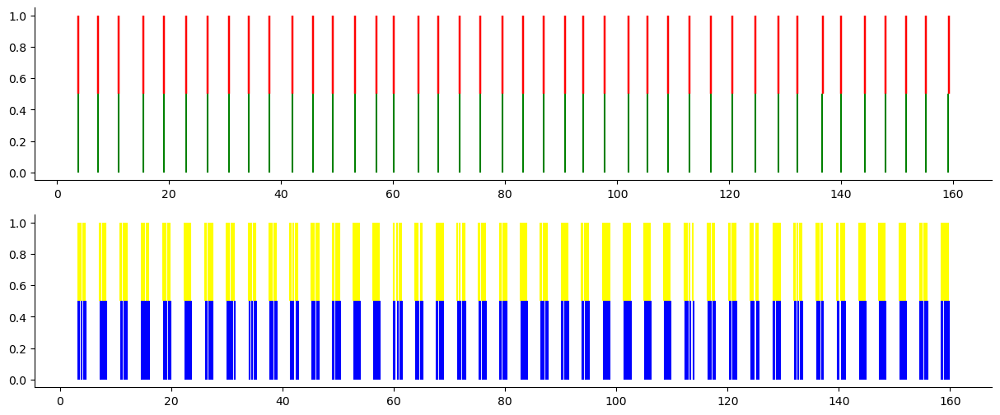

NAN percentage: 32%
6


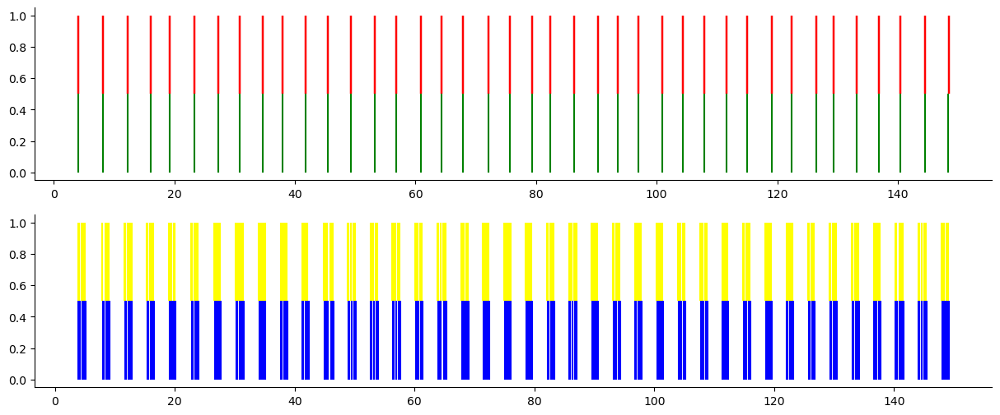

NAN percentage: 32%
7


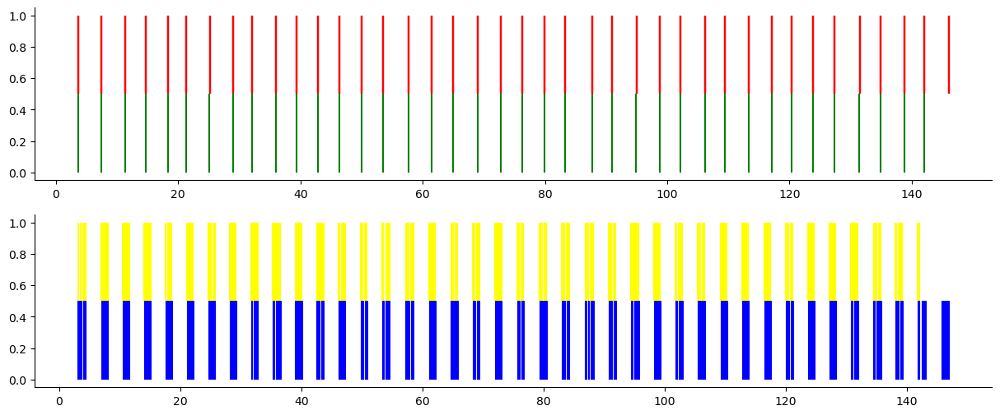

NAN percentage: 32%
P02 A2
1


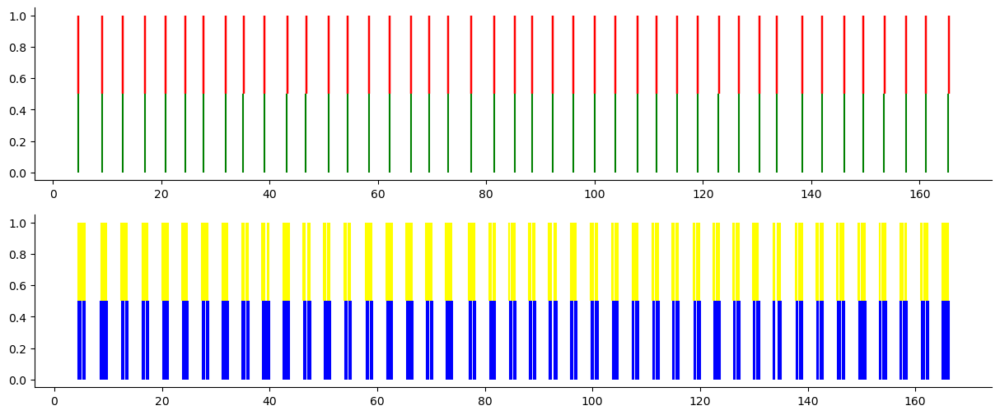

NAN percentage: 1%
2


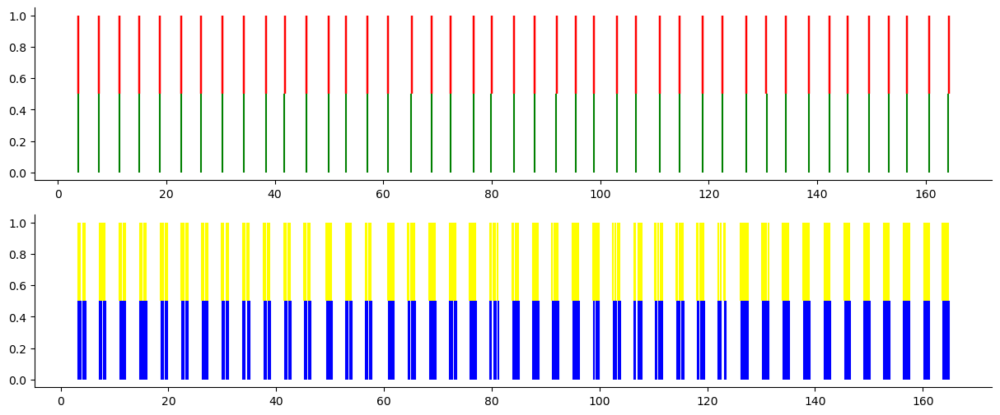

NAN percentage: 1%
3


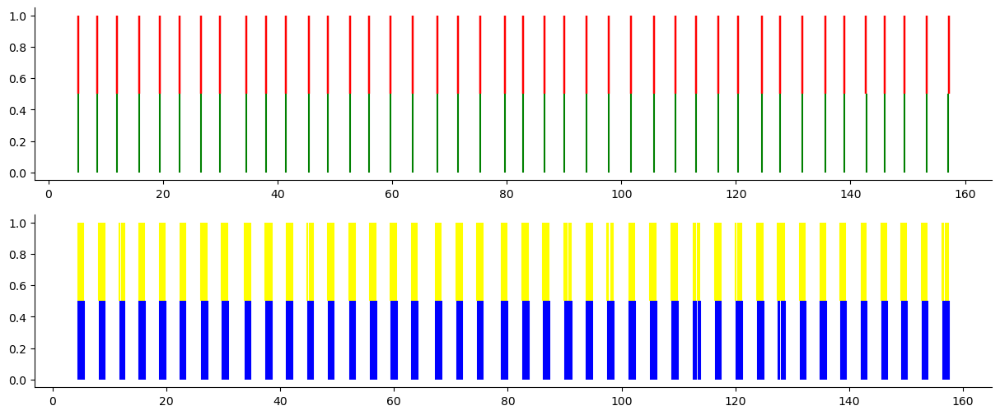

NAN percentage: 1%
4


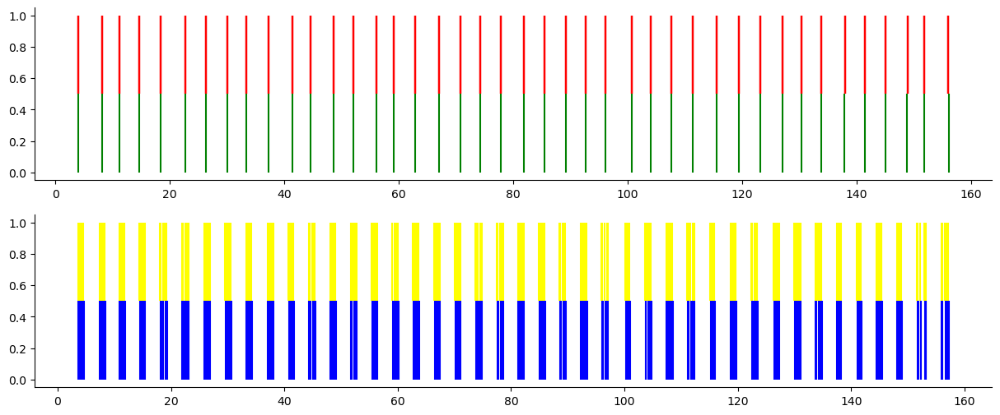

NAN percentage: 1%
5


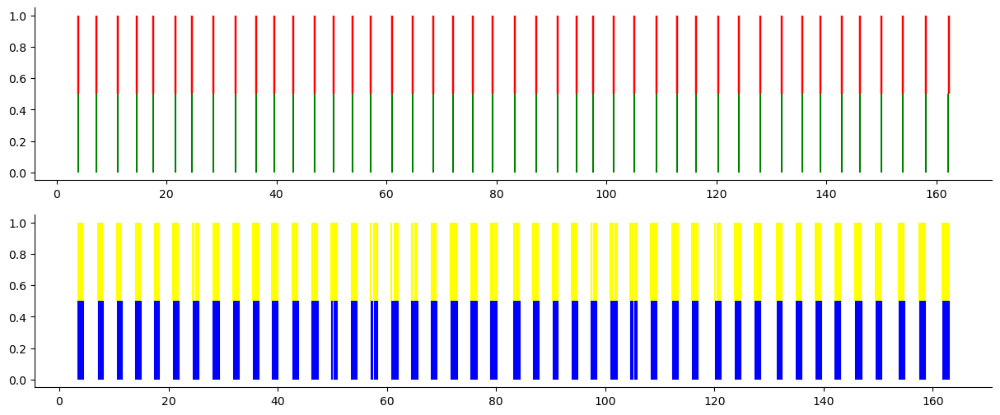

NAN percentage: 1%
6


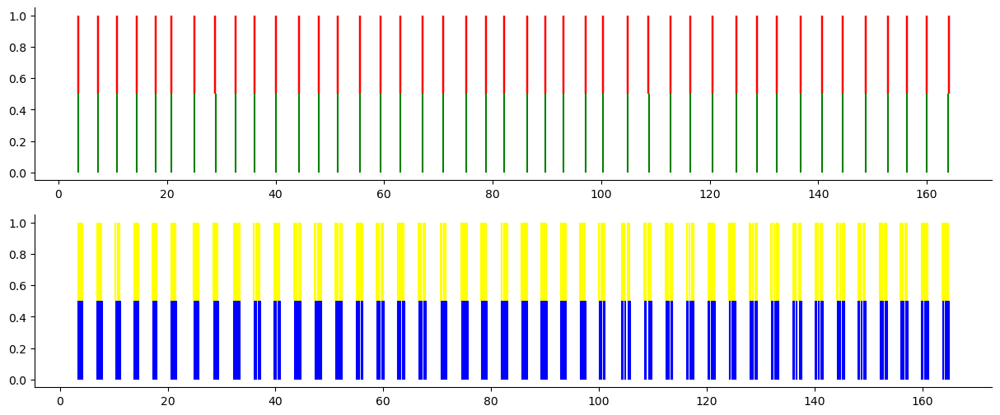

NAN percentage: 1%
7


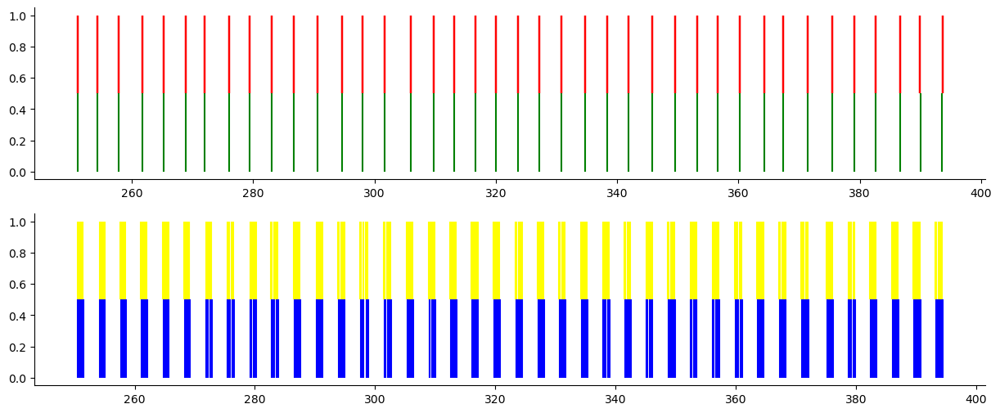

NAN percentage: 1%
8


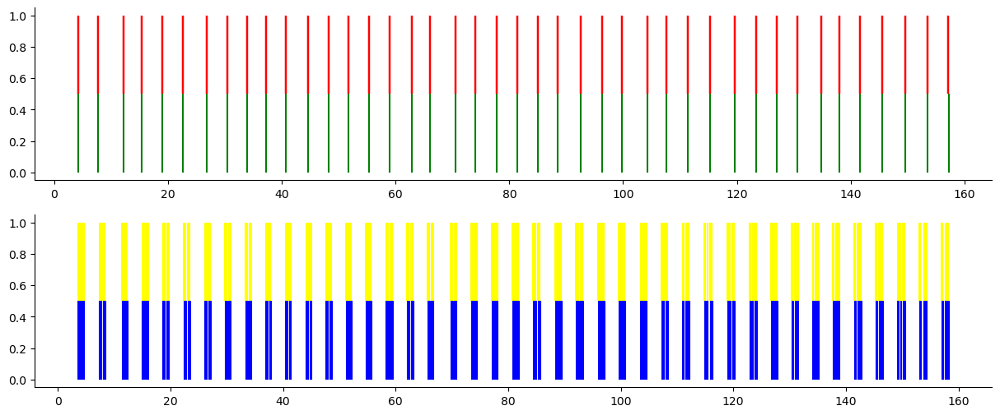

NAN percentage: 1%
9


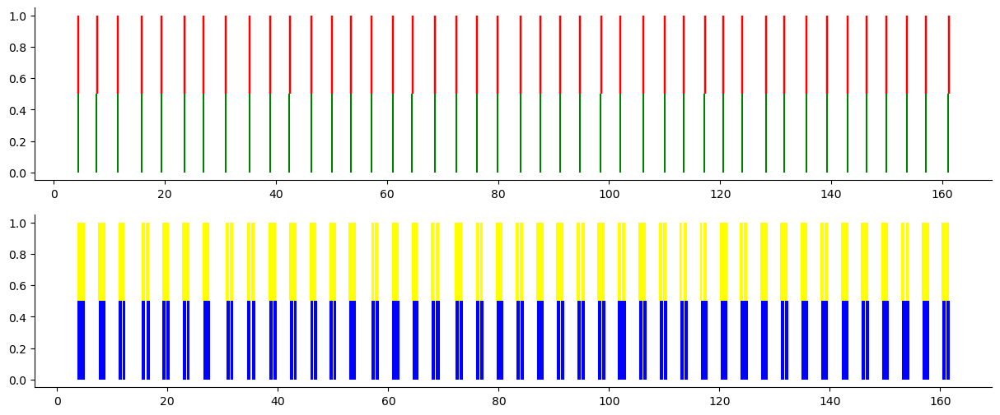

NAN percentage: 1%
10


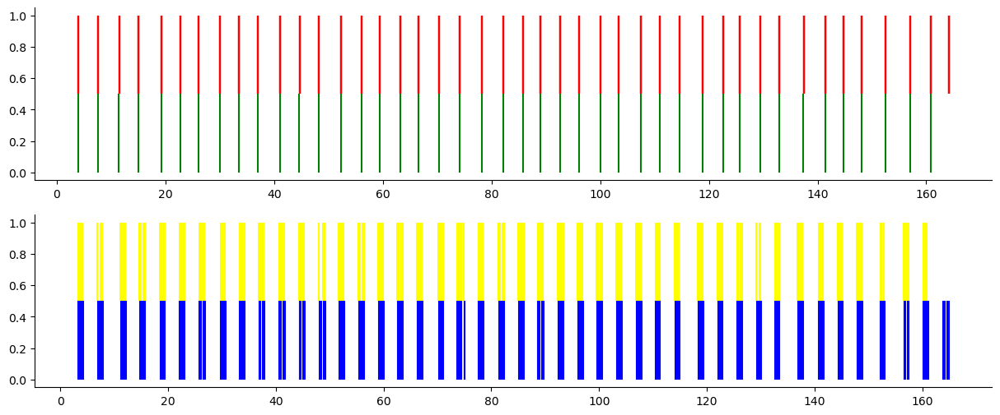

NAN percentage: 1%
P03 A1
1
P03, A1, 1, is unparsable.
NAN percentage: 100%
2
P03, A1, 2, is unparsable.
NAN percentage: 100%
3
P03, A1, 3, is unparsable.
NAN percentage: 100%
4
P03, A1, 4, is unparsable.
NAN percentage: 100%
5
P03, A1, 5, is unparsable.
NAN percentage: 100%
6
P03, A1, 6, is unparsable.
NAN percentage: 100%
7
P03, A1, 7, is unparsable.
NAN percentage: 100%
8
P03, A1, 8, is unparsable.
NAN percentage: 100%
9
P03, A1, 9, is unparsable.
NAN percentage: 100%
10
P03, A1, 10, is unparsable.
NAN percentage: 100%
P03 A2
3


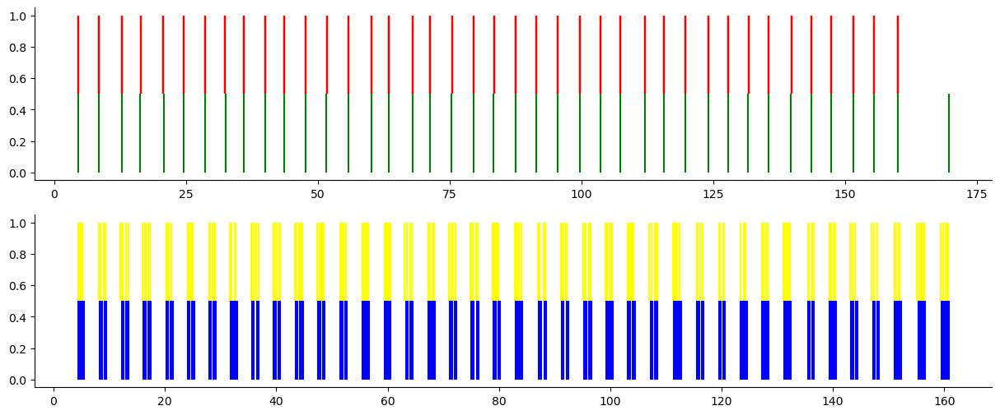

NAN percentage: 25%
4


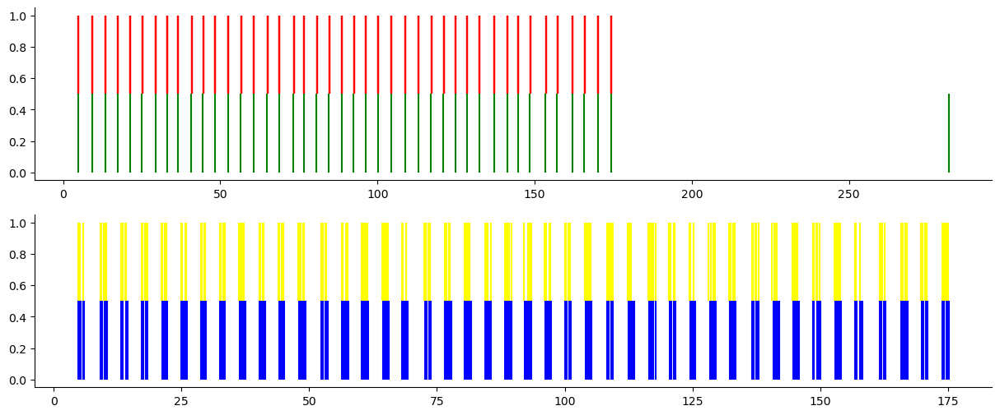

NAN percentage: 25%
5


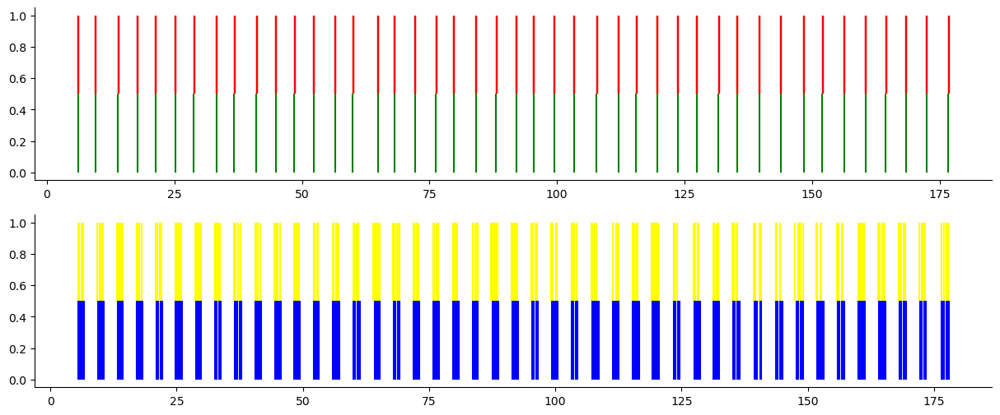

NAN percentage: 25%
6


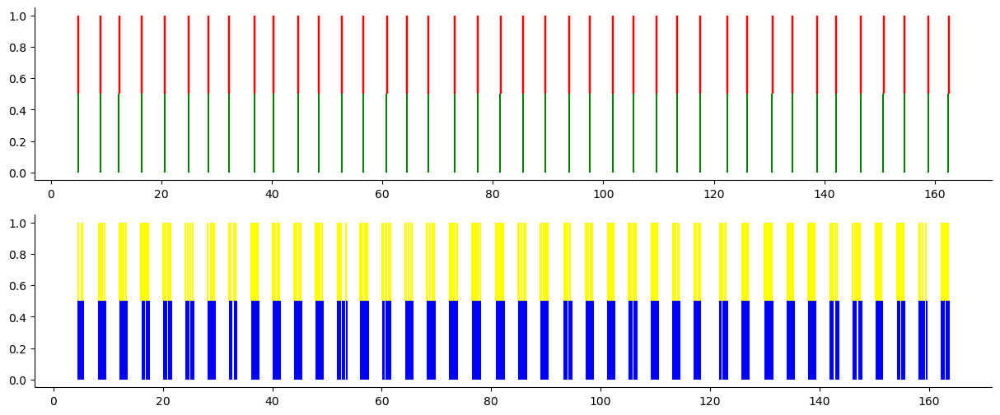

NAN percentage: 25%
7


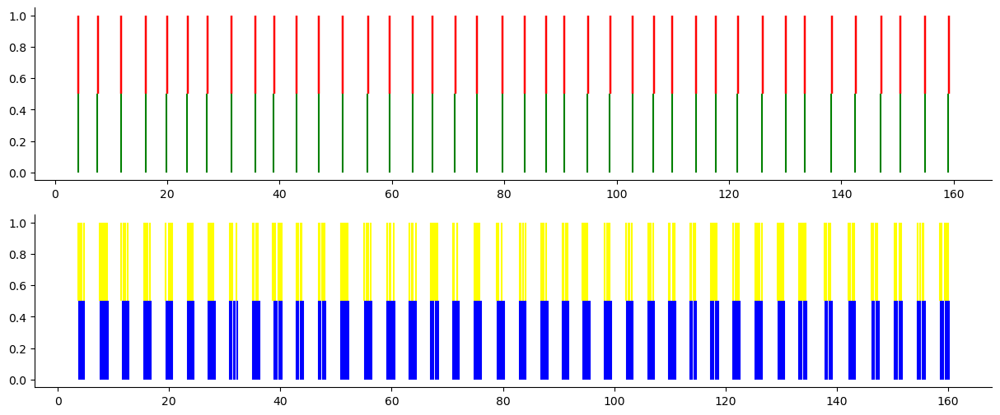

NAN percentage: 25%
8


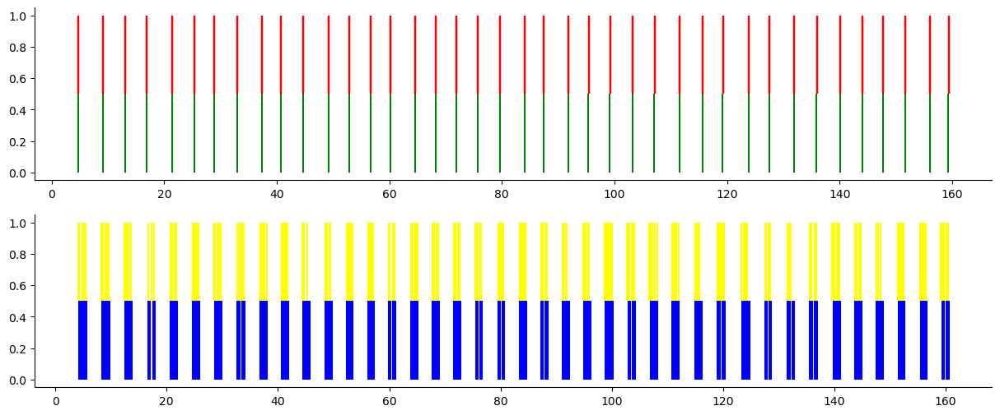

NAN percentage: 25%
9


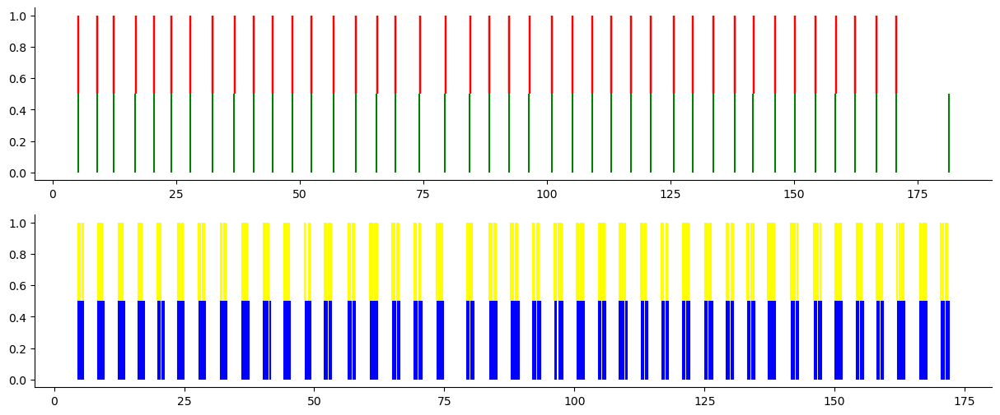

NAN percentage: 25%
10


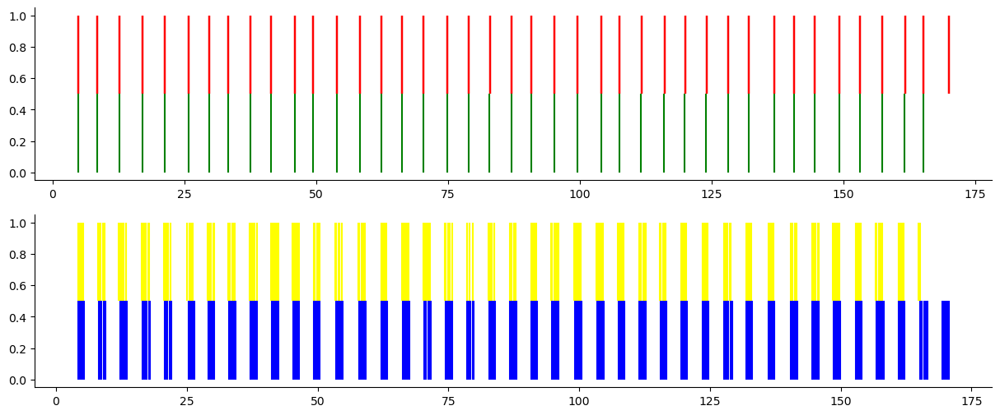

NAN percentage: 25%
P04 A1
1


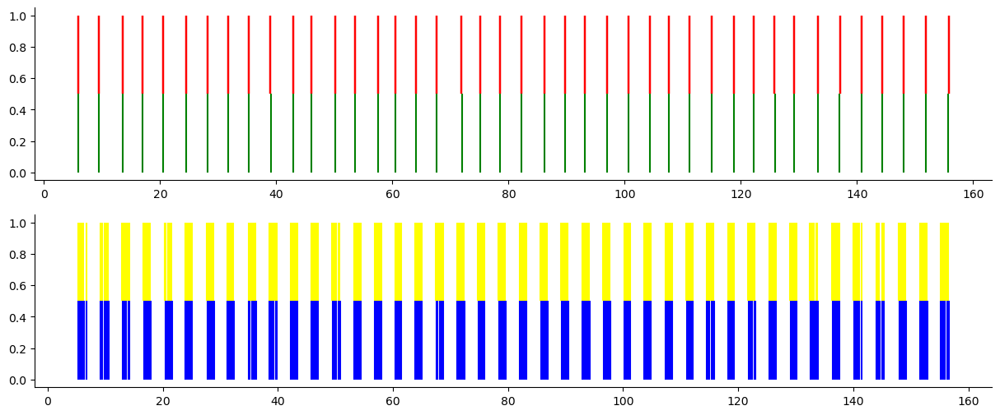

NAN percentage: 1%
2


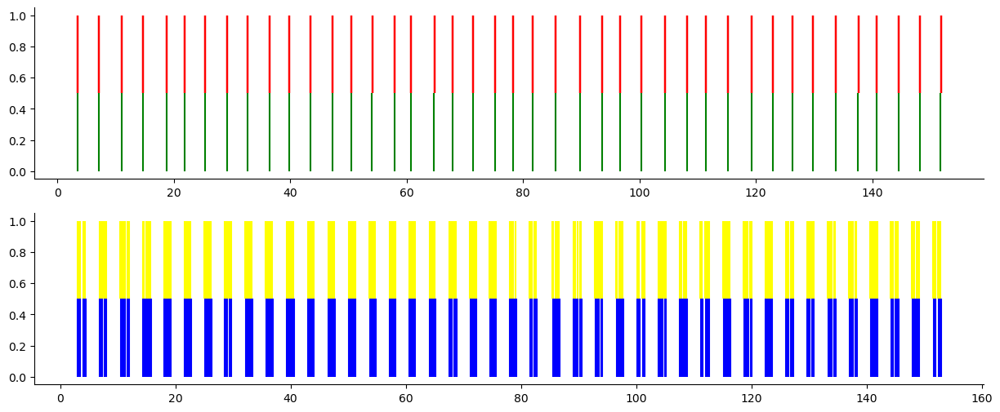

NAN percentage: 1%
3


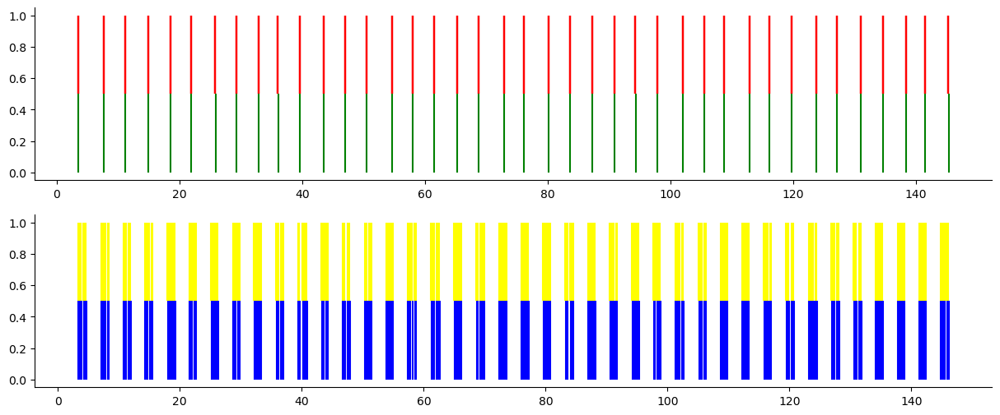

NAN percentage: 1%
4


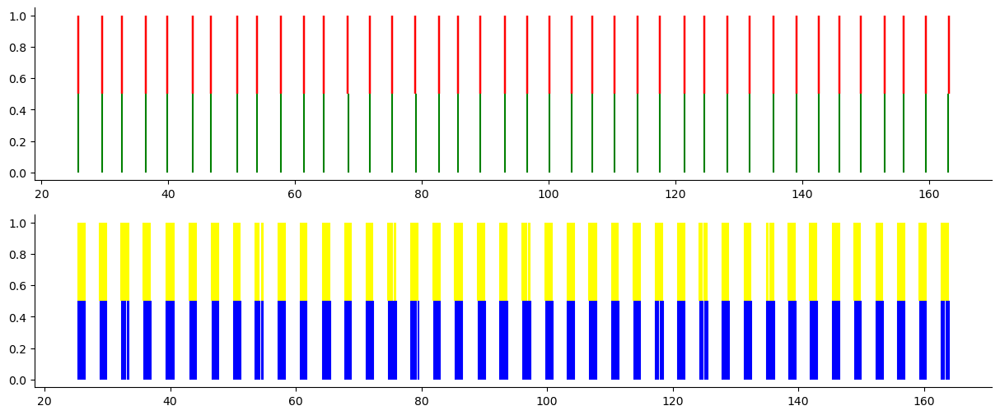

NAN percentage: 1%
5


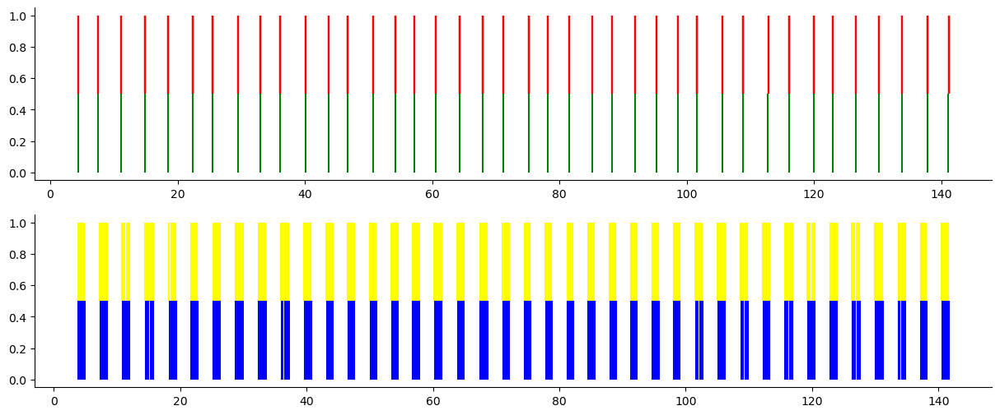

NAN percentage: 1%
6


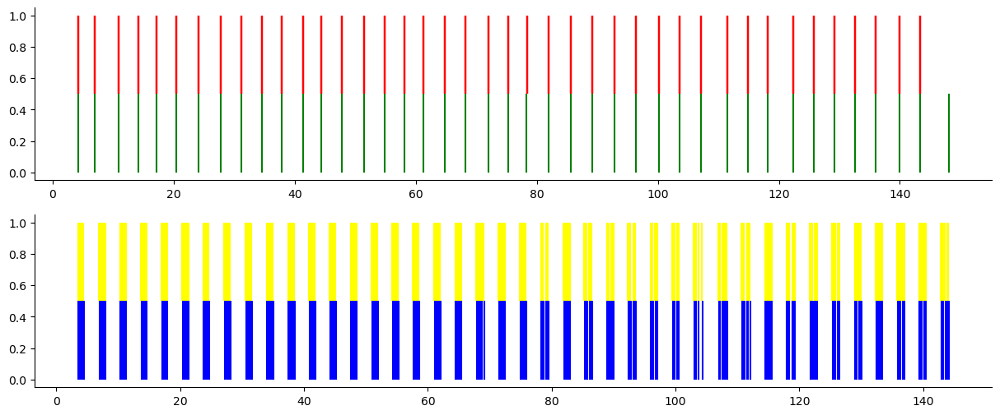

NAN percentage: 1%
7


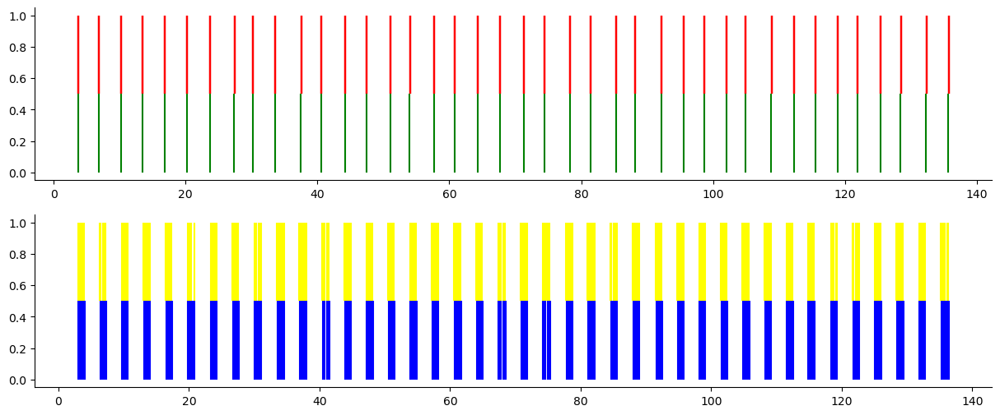

NAN percentage: 1%
8


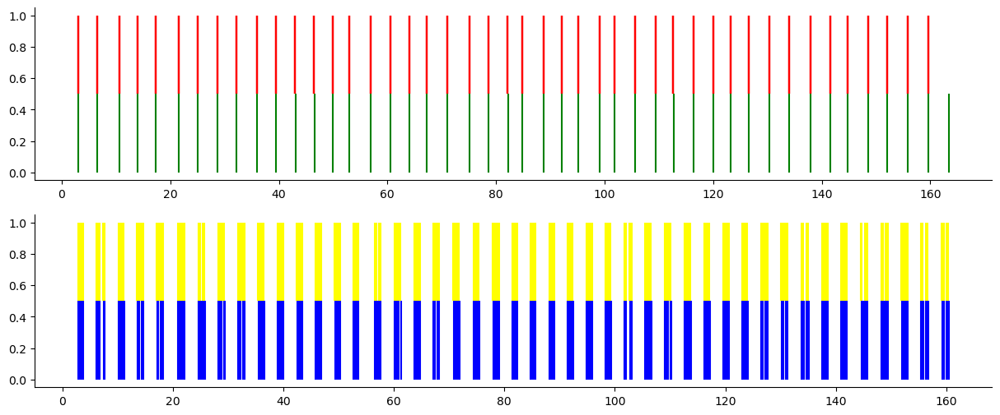

NAN percentage: 1%
9


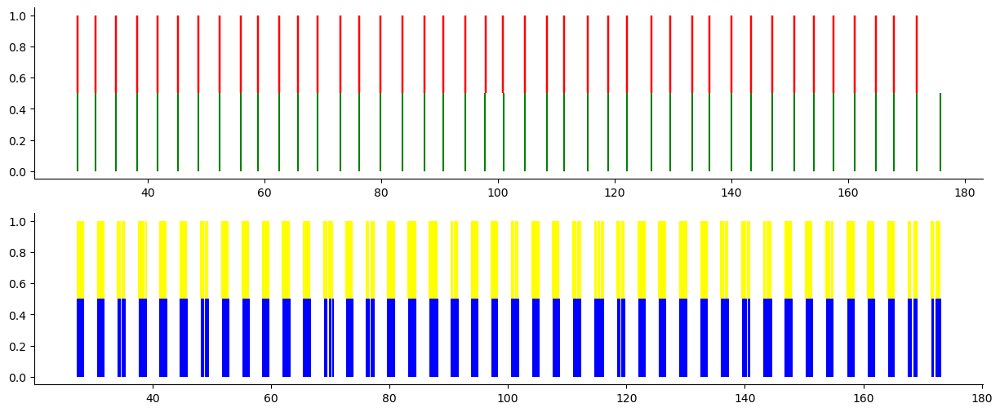

NAN percentage: 1%
10


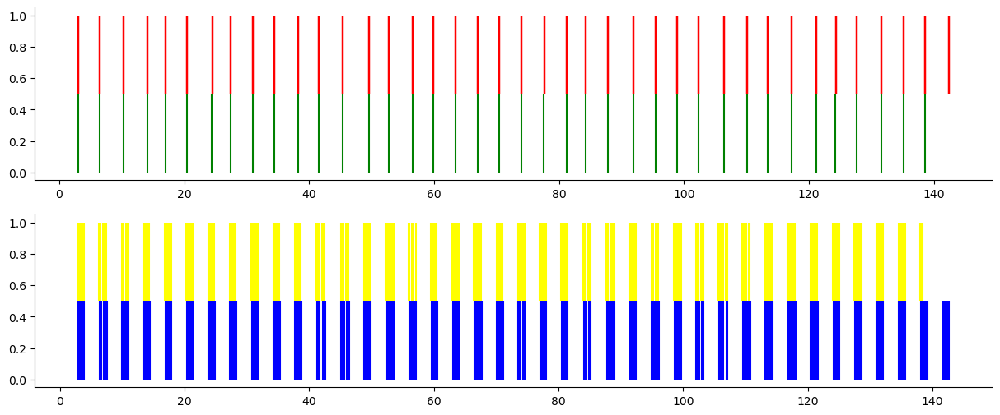

NAN percentage: 1%
P04 A2
1


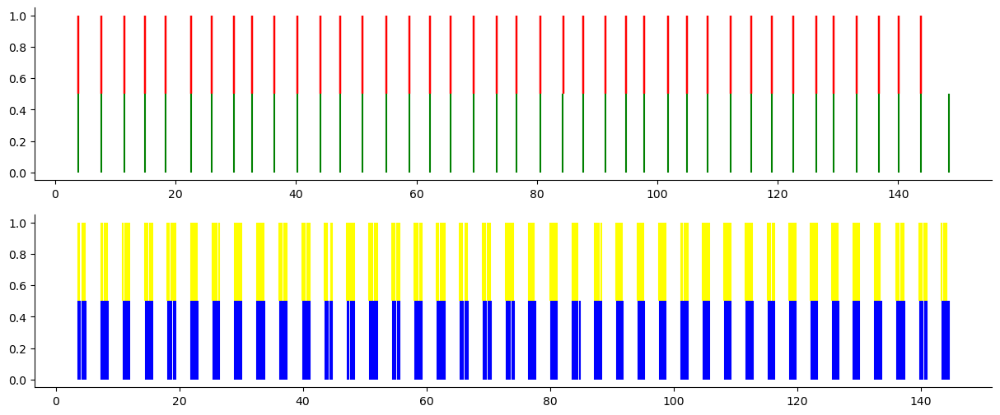

NAN percentage: 7%
2


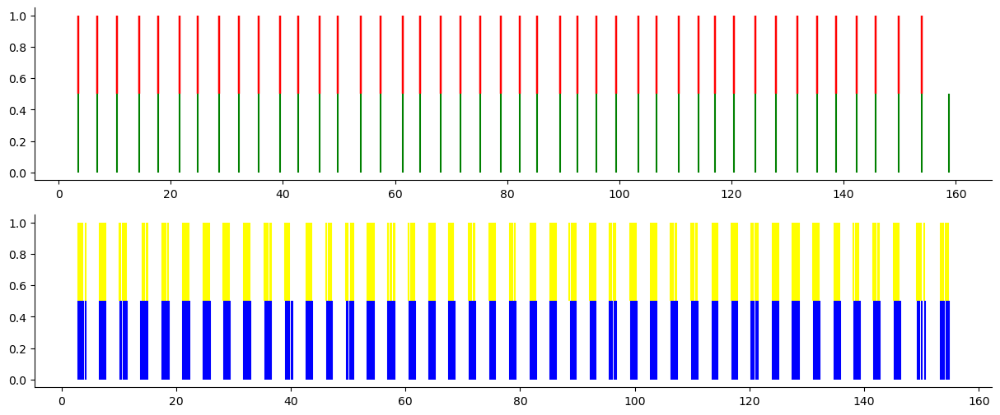

NAN percentage: 7%
3


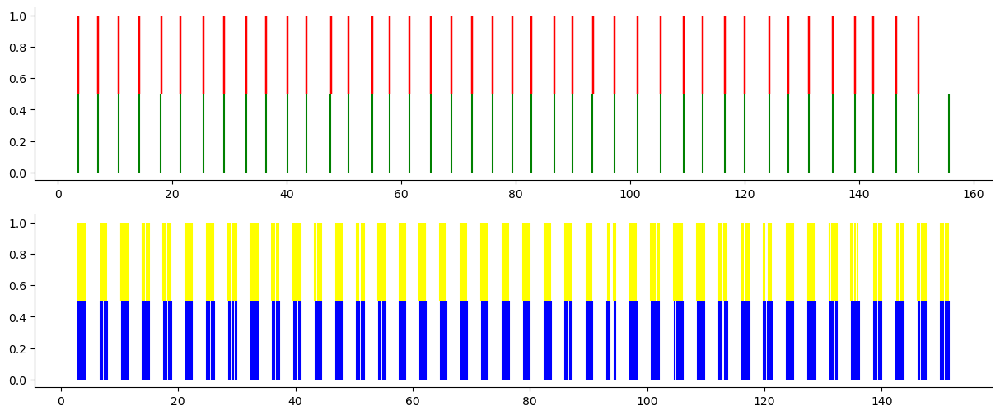

NAN percentage: 7%
4


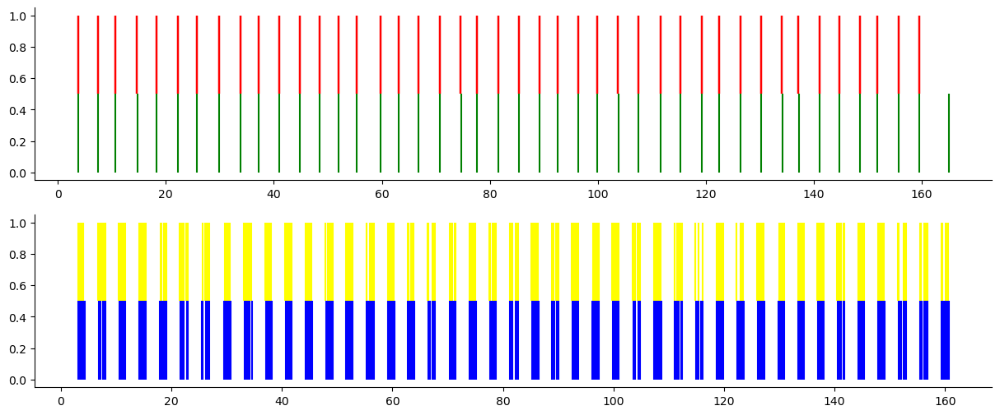

NAN percentage: 7%
5


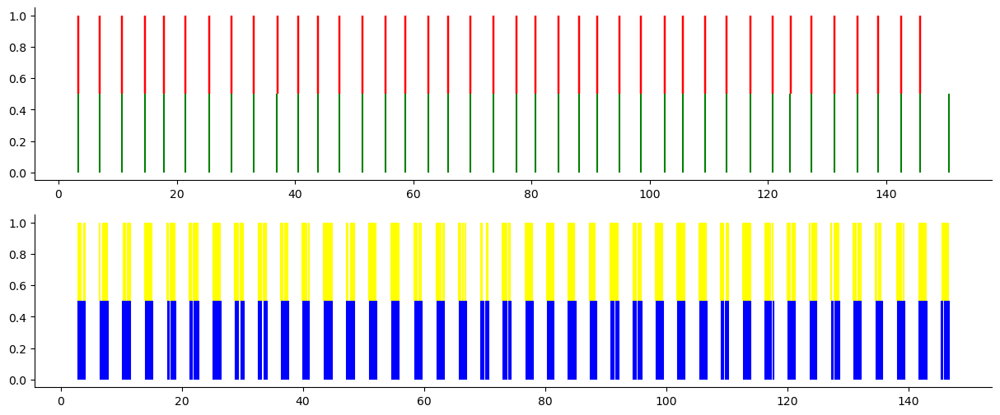

NAN percentage: 7%
6


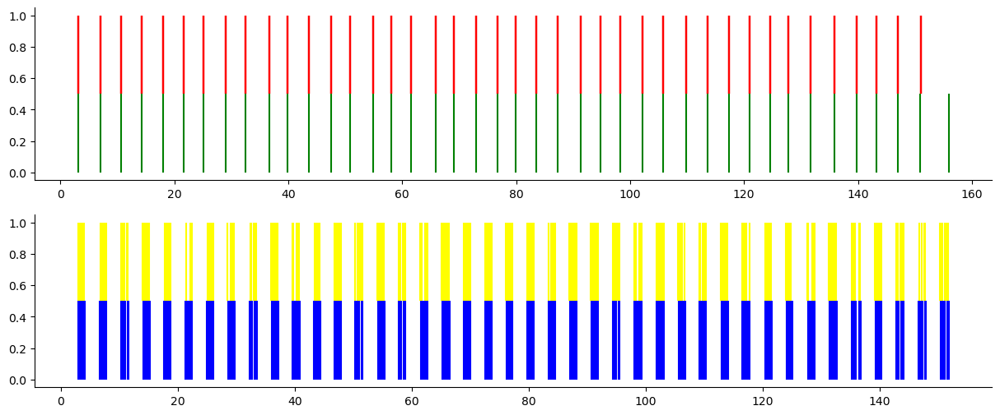

NAN percentage: 7%
7


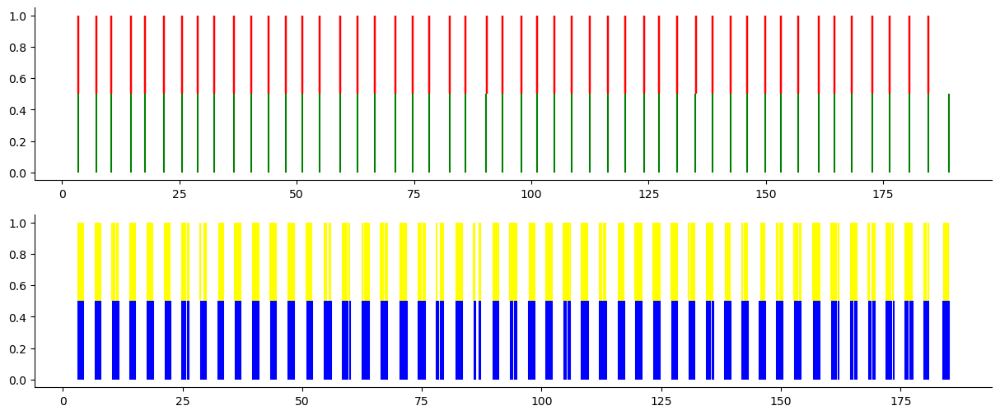

NAN percentage: 7%
8


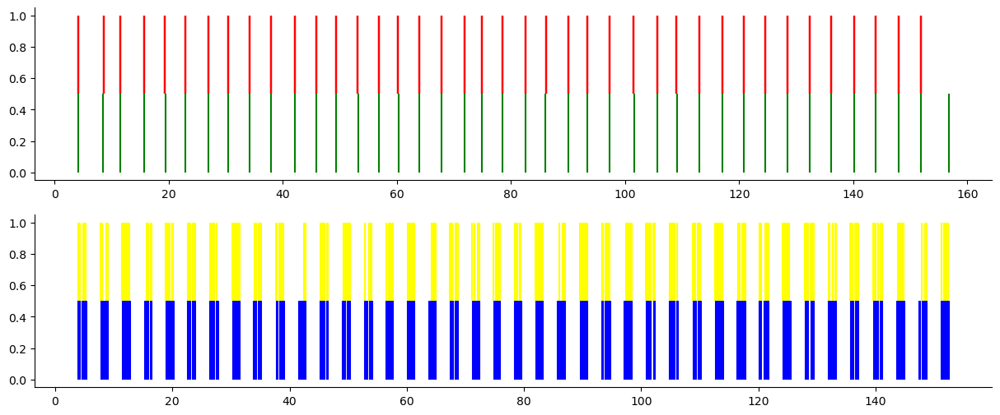

NAN percentage: 7%
9


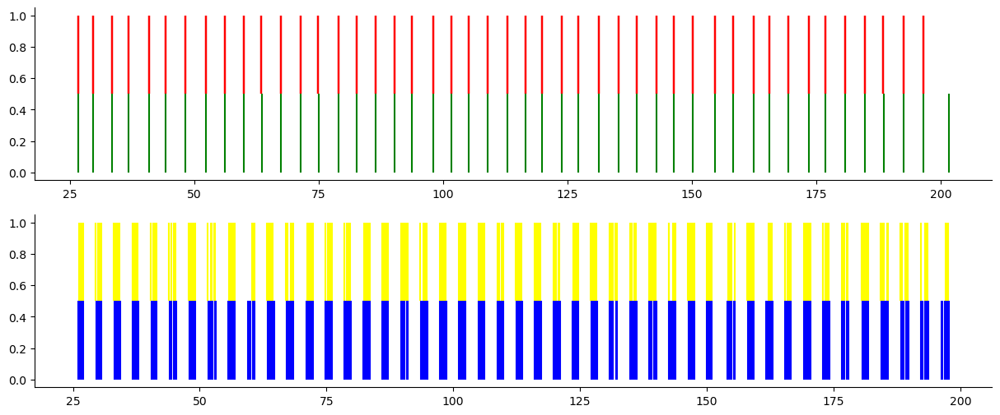

NAN percentage: 7%
10


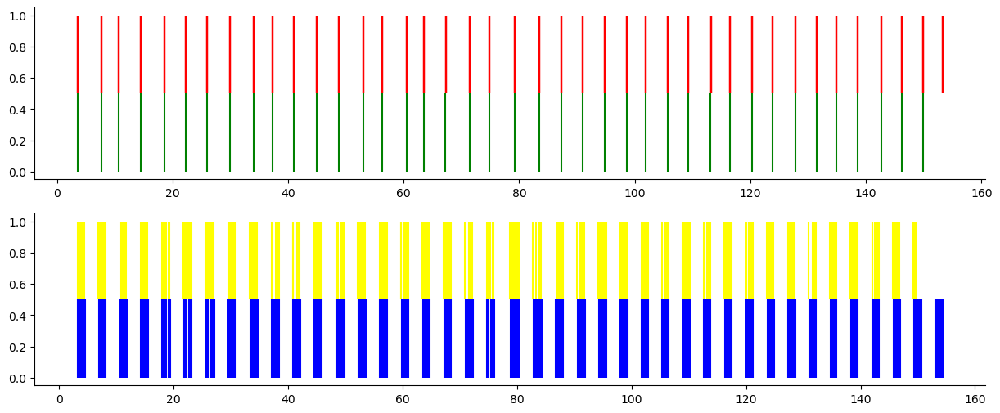

NAN percentage: 7%
P05 A1
2


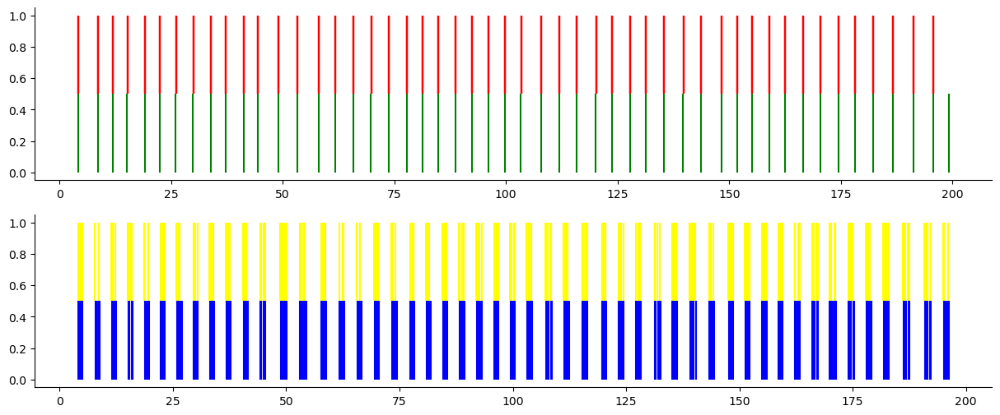

NAN percentage: 20%
3


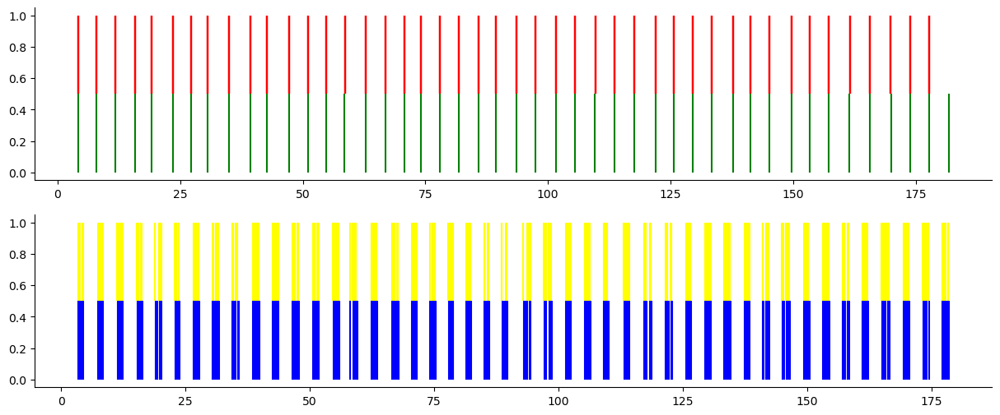

NAN percentage: 20%
4


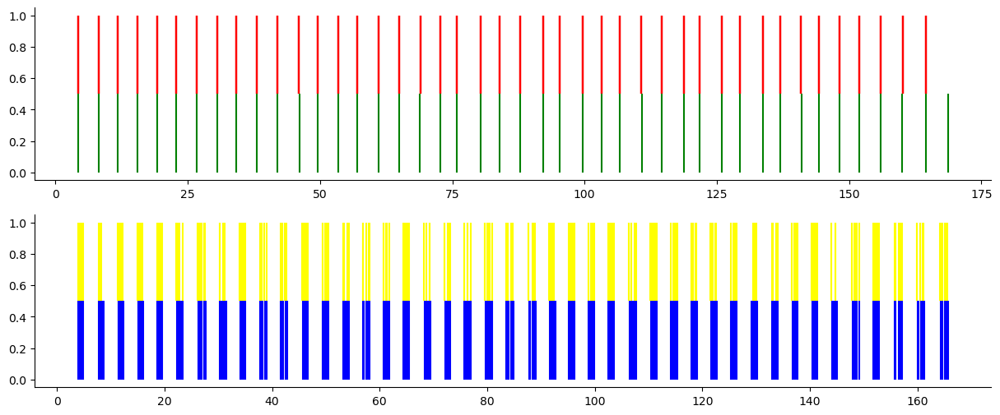

NAN percentage: 20%
5


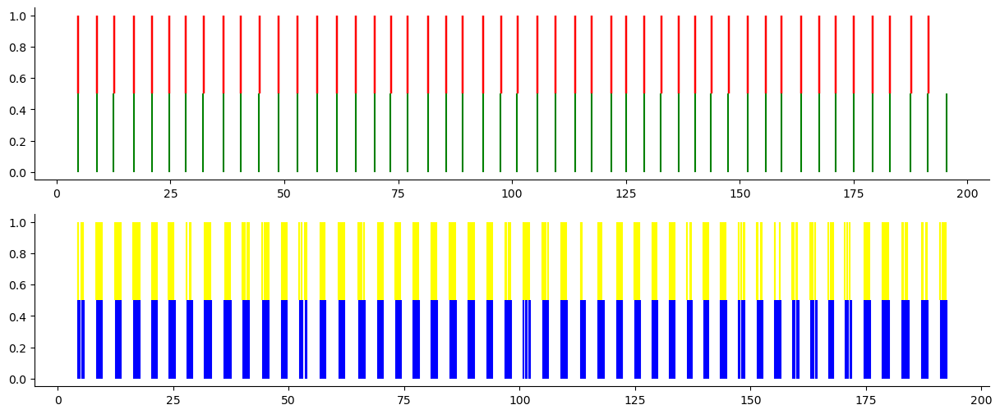

NAN percentage: 20%
6


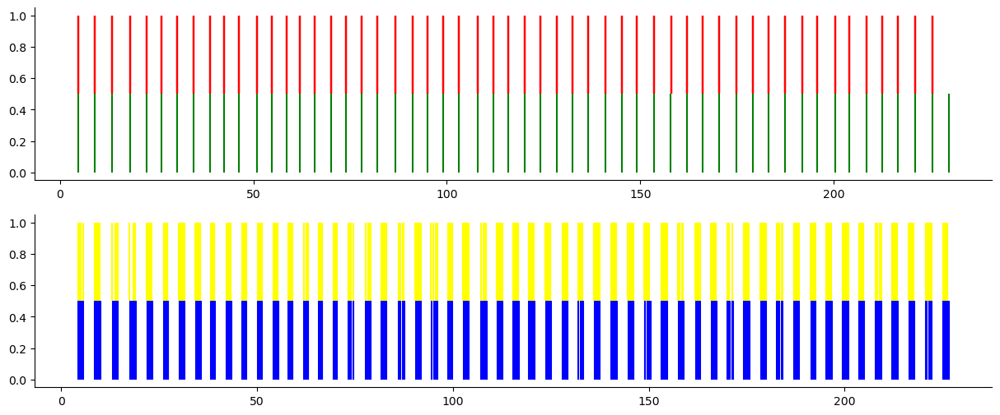

NAN percentage: 20%
7


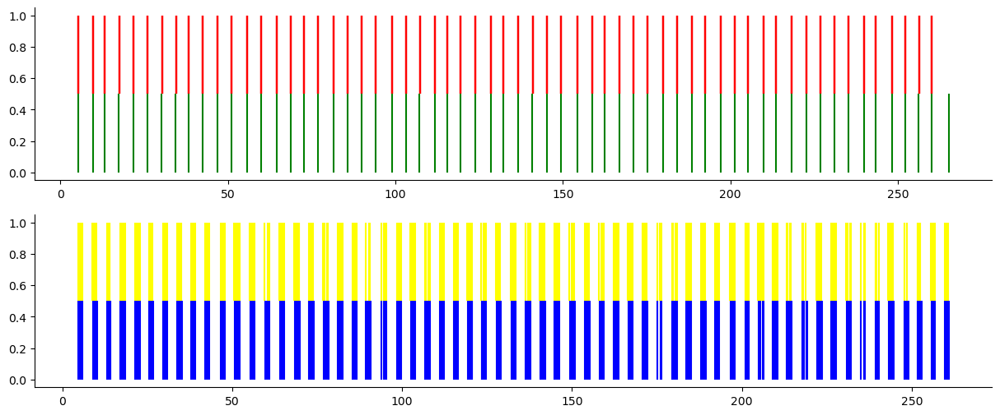

NAN percentage: 20%
8


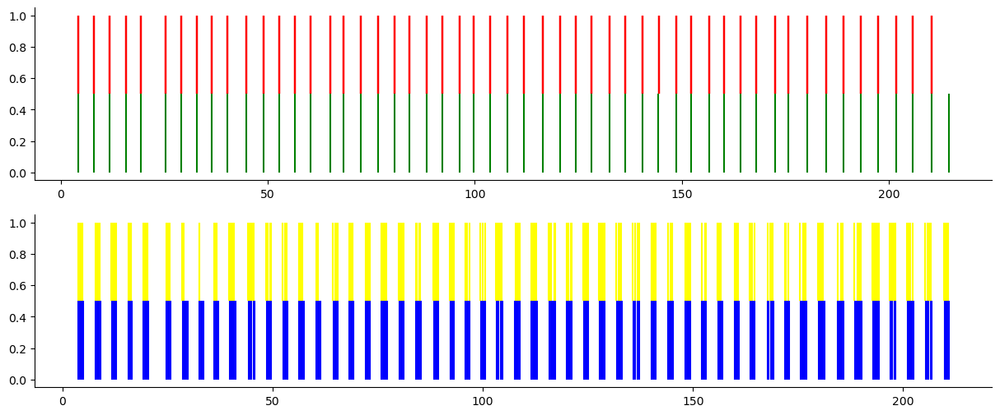

NAN percentage: 20%
9


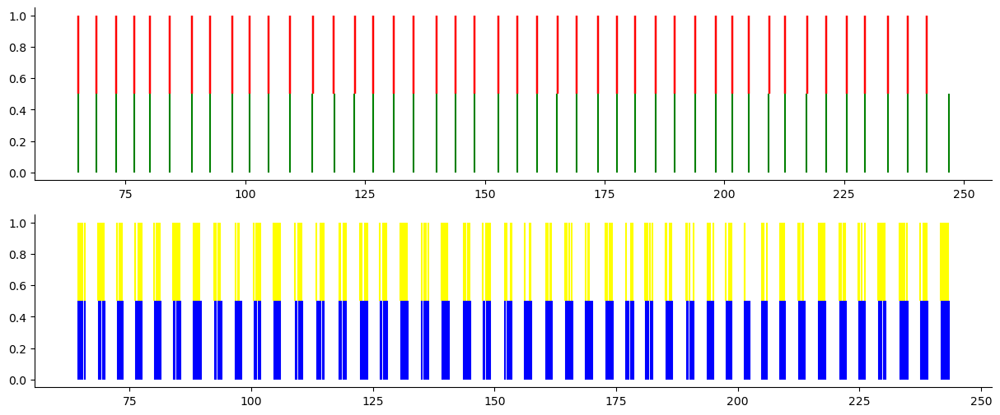

NAN percentage: 20%
10


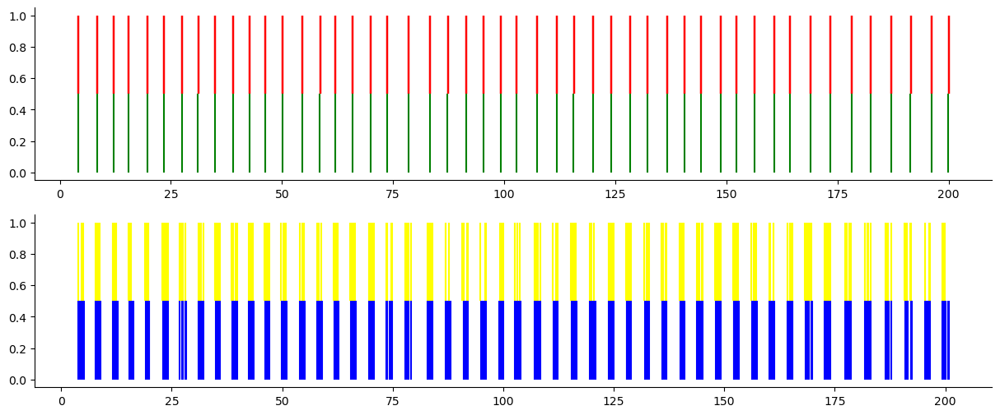

NAN percentage: 20%
P05 A2
1


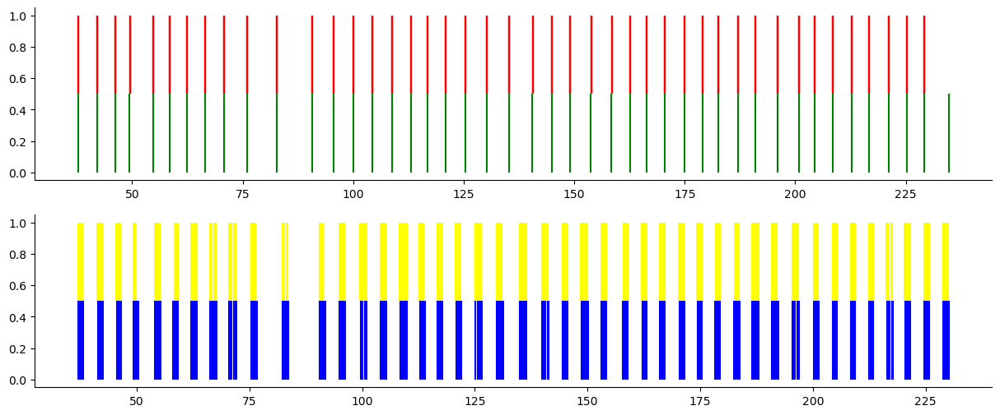

NAN percentage: 4%
2


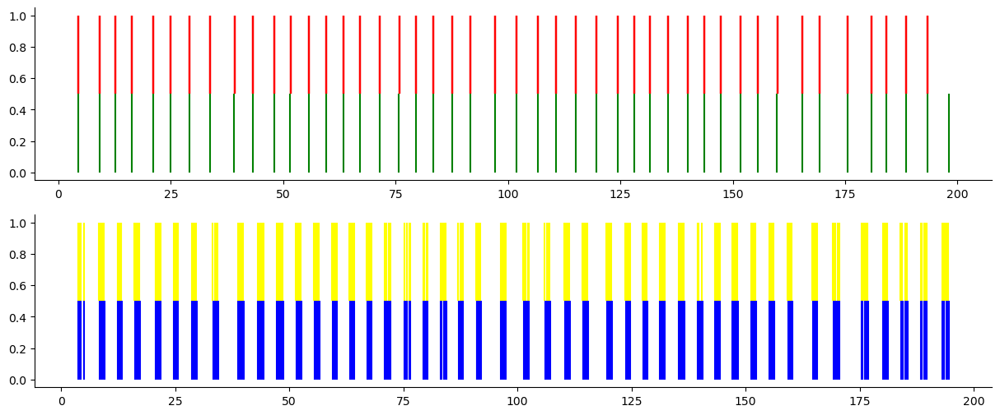

NAN percentage: 4%
3


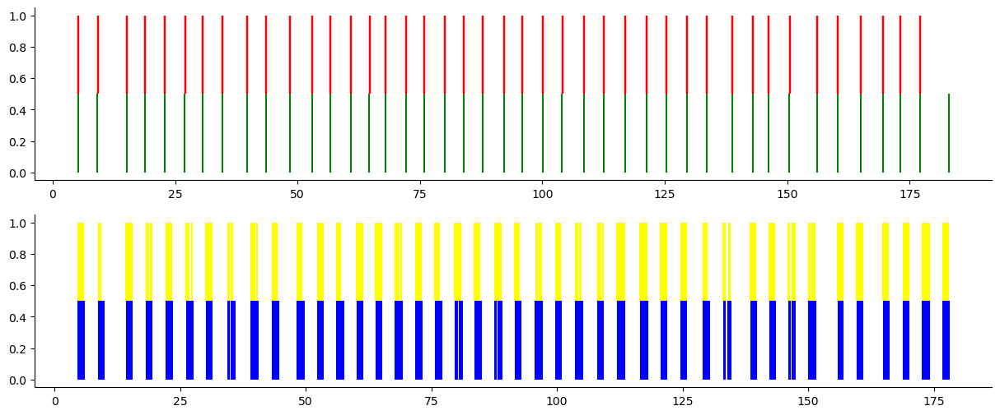

NAN percentage: 4%
4


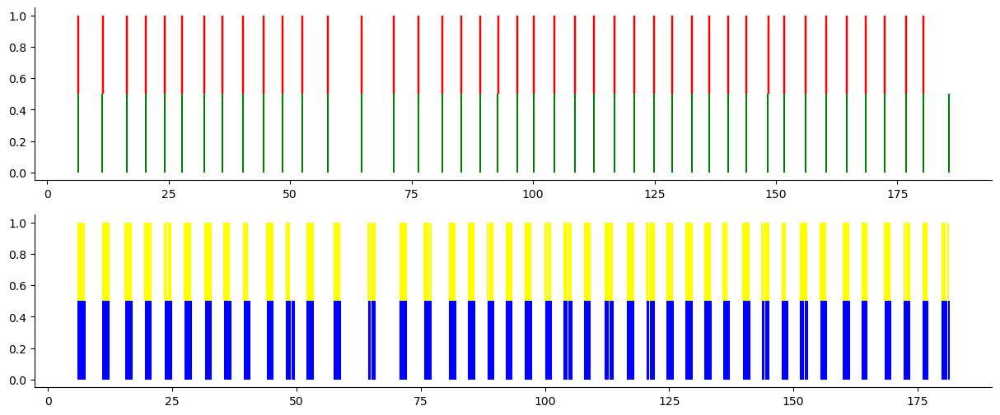

NAN percentage: 4%
5


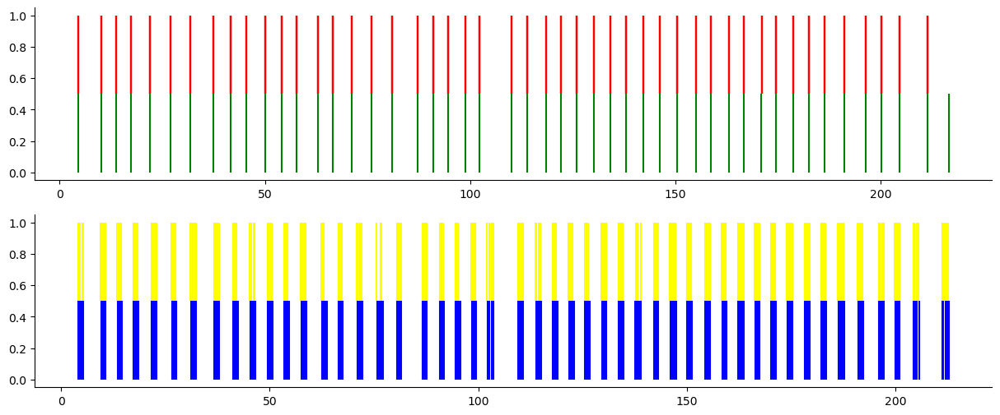

NAN percentage: 4%
6


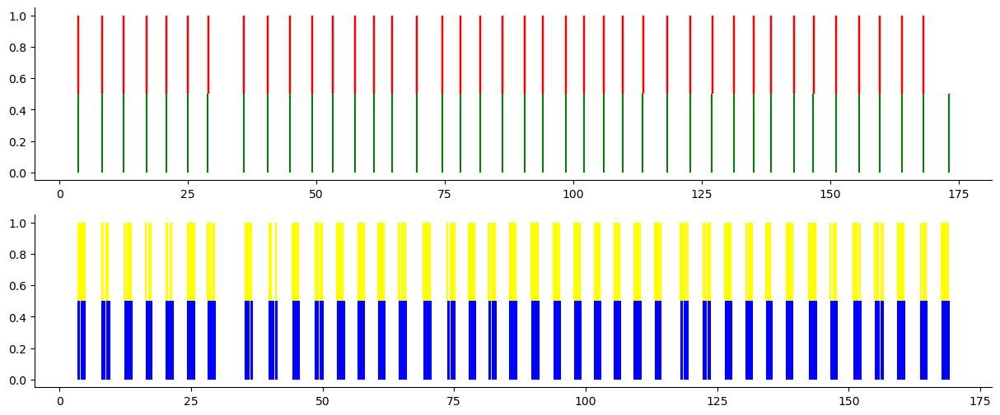

NAN percentage: 4%
7


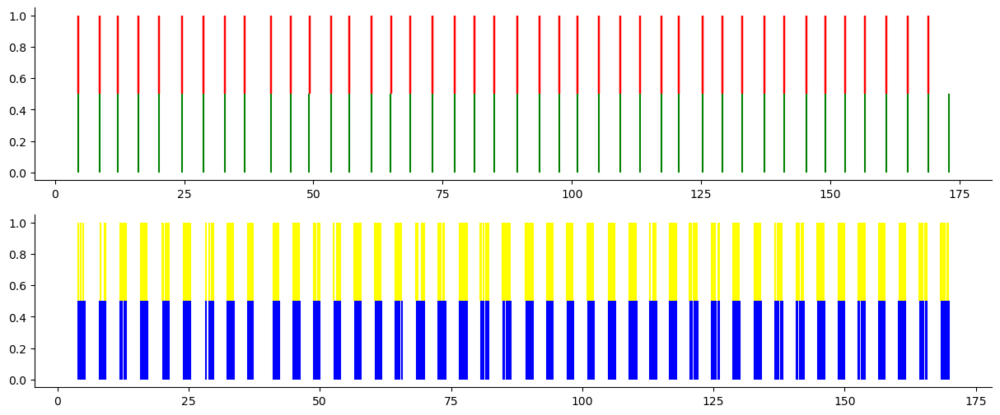

NAN percentage: 4%
8


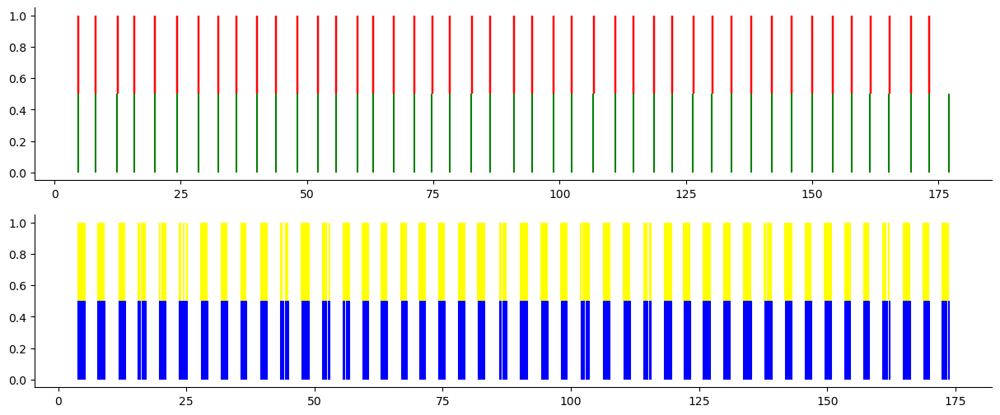

NAN percentage: 4%
9


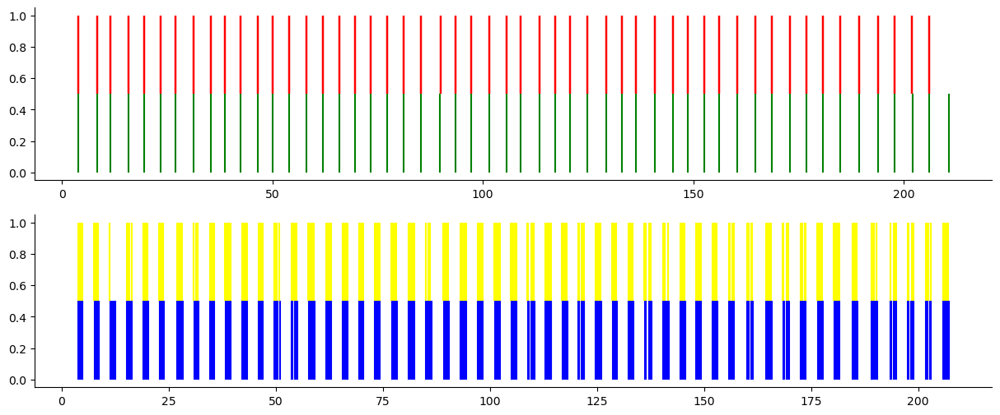

NAN percentage: 4%
10


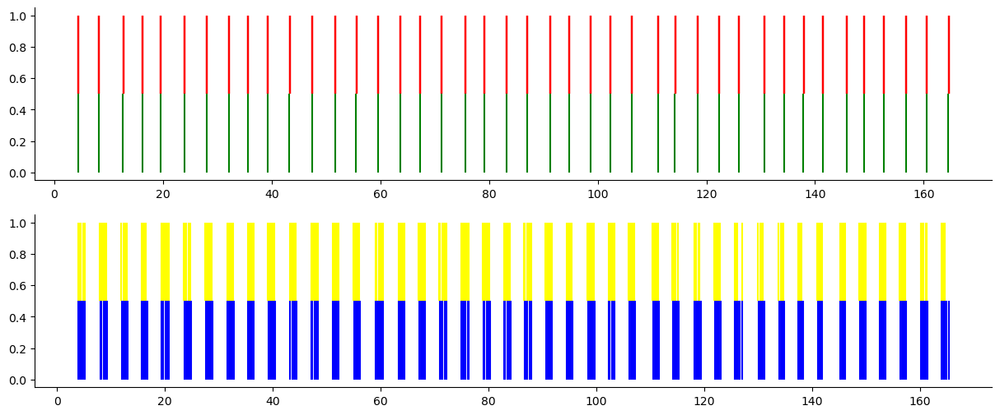

NAN percentage: 4%
P06 A1
2
P06, A1, 2, is unparsable.
NAN percentage: 100%
3
P06, A1, 3, is unparsable.
NAN percentage: 100%
4
P06, A1, 4, is unparsable.
NAN percentage: 100%
5
P06, A1, 5, is unparsable.
NAN percentage: 100%
6
P06, A1, 6, is unparsable.
NAN percentage: 100%
7
P06, A1, 7, is unparsable.
NAN percentage: 100%
8
P06, A1, 8, is unparsable.
NAN percentage: 100%
9
P06, A1, 9, is unparsable.
NAN percentage: 100%
10
P06, A1, 10, is unparsable.
NAN percentage: 100%
P06 A2
2
P06, A2, 2, is unparsable.
NAN percentage: 100%
3
P06, A2, 3, is unparsable.
NAN percentage: 100%
4
P06, A2, 4, is unparsable.
NAN percentage: 100%
5
P06, A2, 5, is unparsable.
NAN percentage: 100%
6
P06, A2, 6, is unparsable.
NAN percentage: 100%
7
P06, A2, 7, is unparsable.
NAN percentage: 100%
8
P06, A2, 8, is unparsable.
NAN percentage: 100%
9
P06, A2, 9, is unparsable.
NAN percentage: 100%
10
P06, A2, 10, is unparsable.
NAN percentage: 100%
P07 A1
2
P07, A1, 2, is unparsable.
NAN percentage: 100%
3
P07,

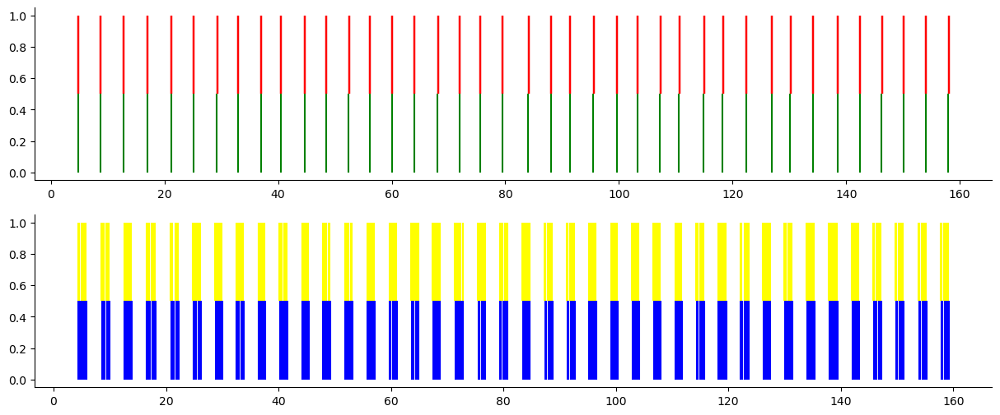

NAN percentage: 4%
2


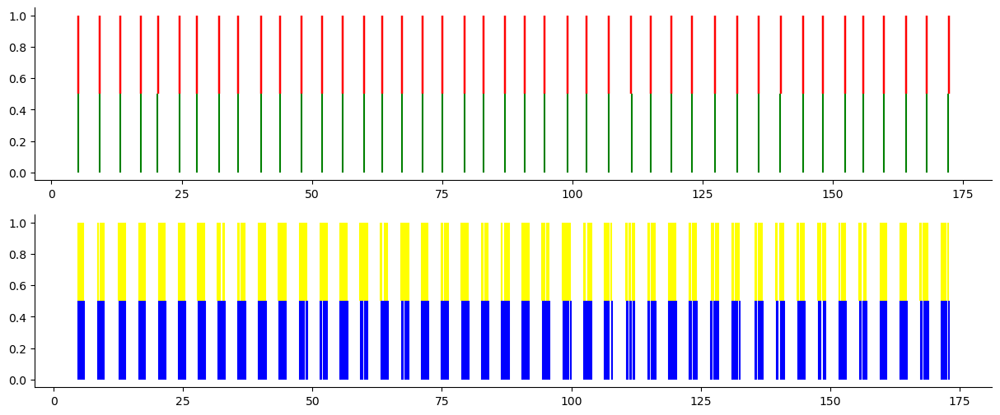

NAN percentage: 4%
3


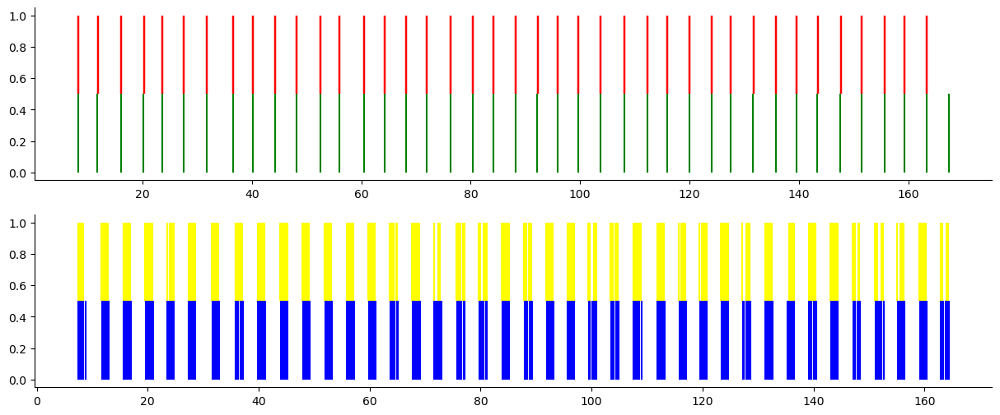

NAN percentage: 4%
4


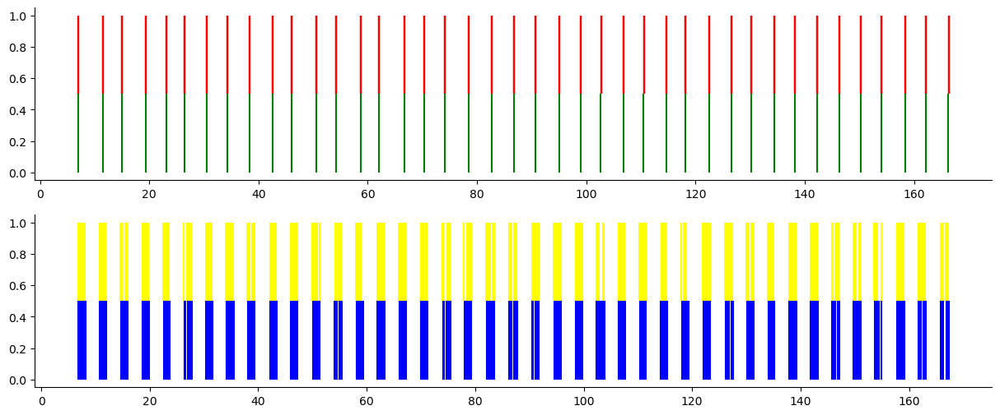

NAN percentage: 4%
5


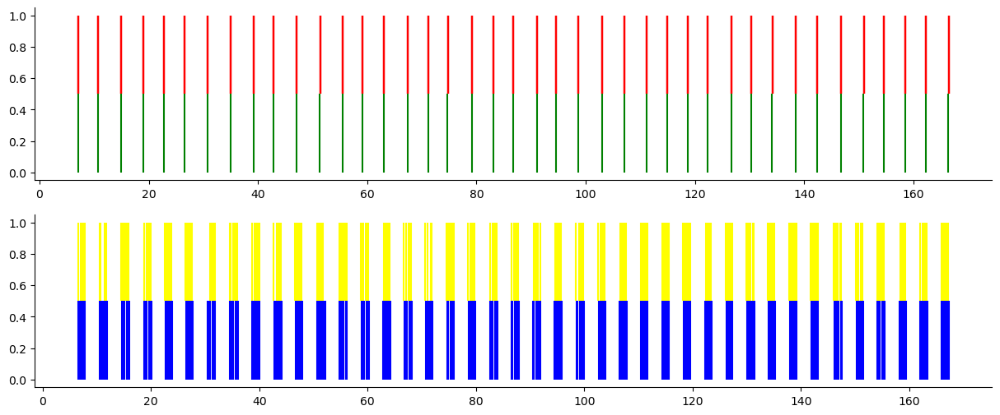

NAN percentage: 4%
6


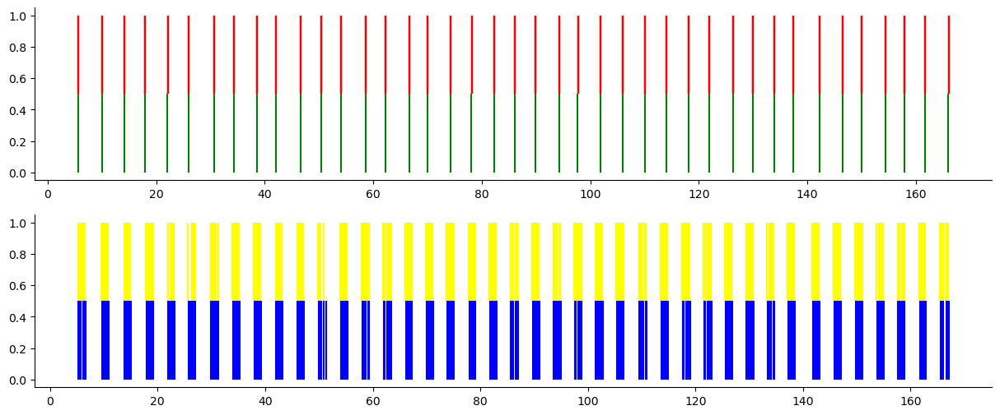

NAN percentage: 4%
7


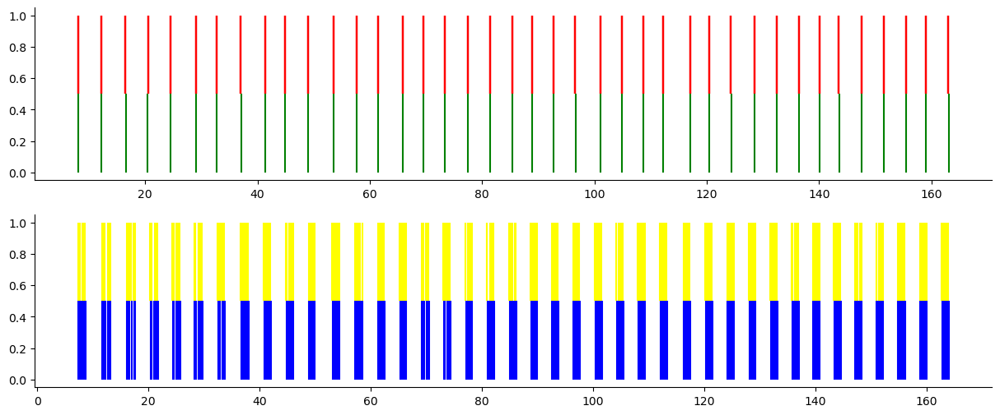

NAN percentage: 4%
8


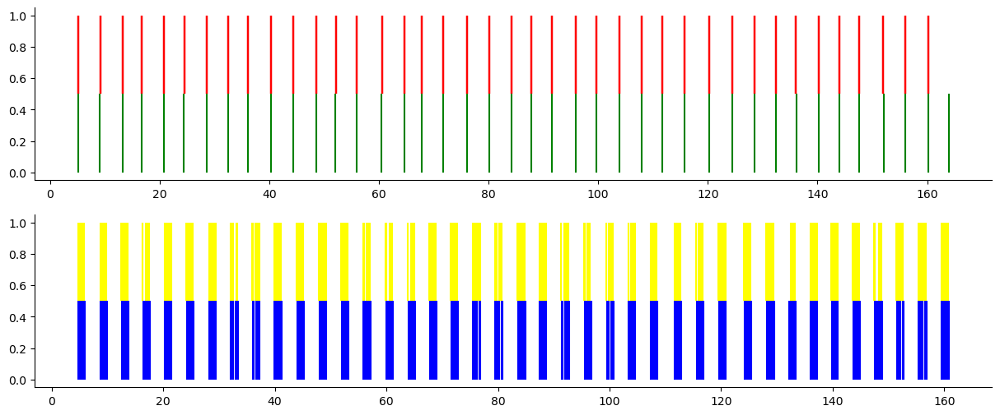

NAN percentage: 4%
9


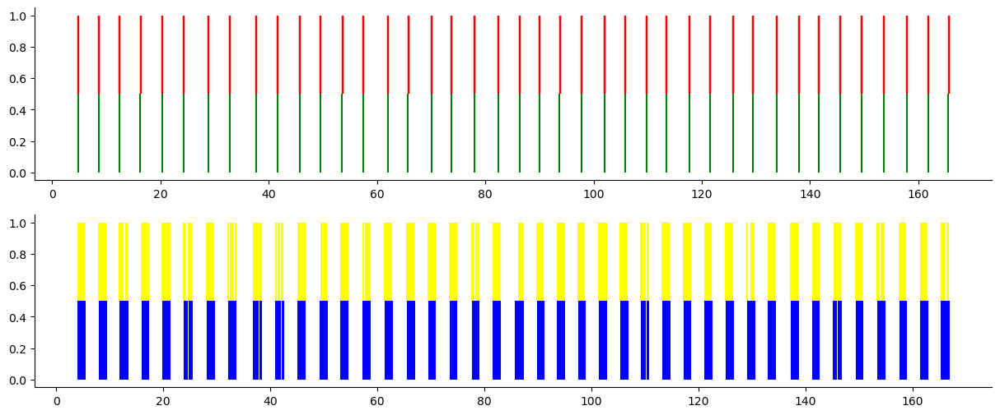

NAN percentage: 4%
10


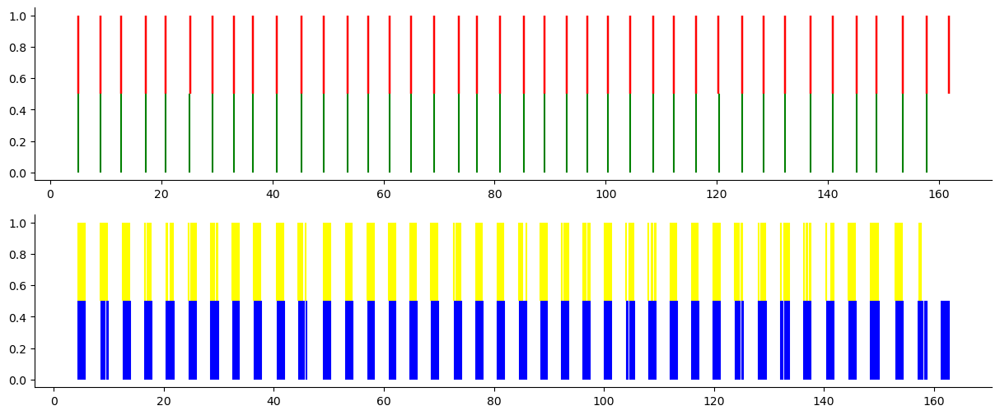

NAN percentage: 4%
P08 A1
1


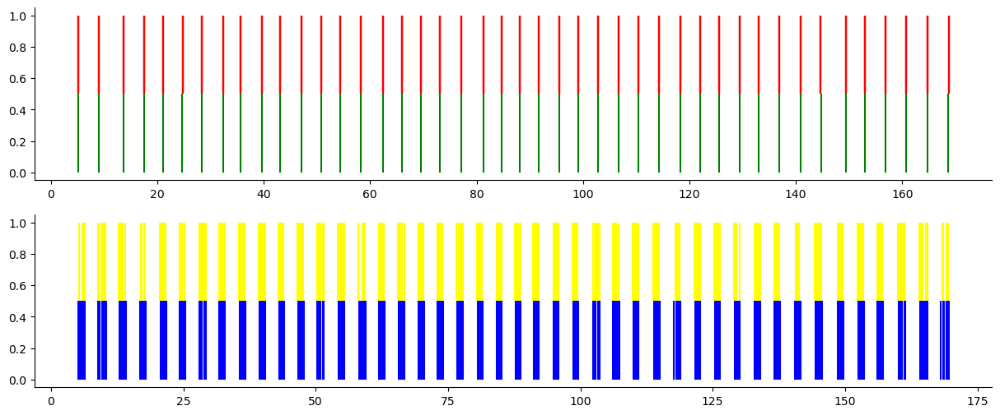

NAN percentage: 22%
2


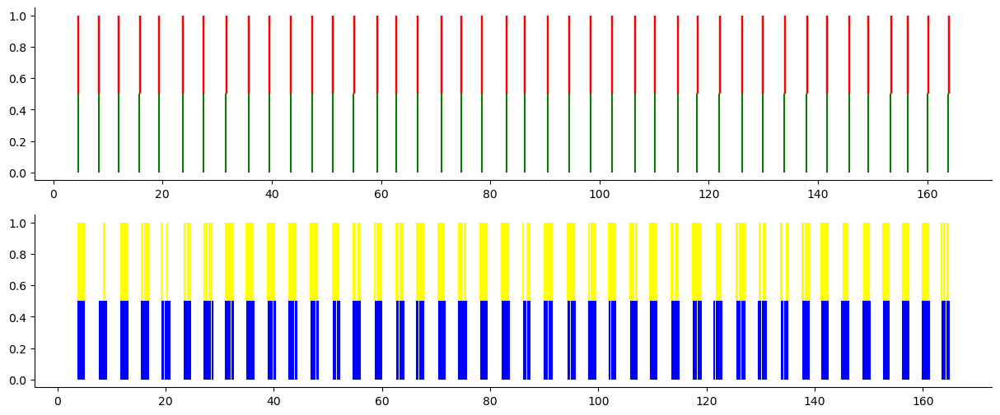

NAN percentage: 22%
3


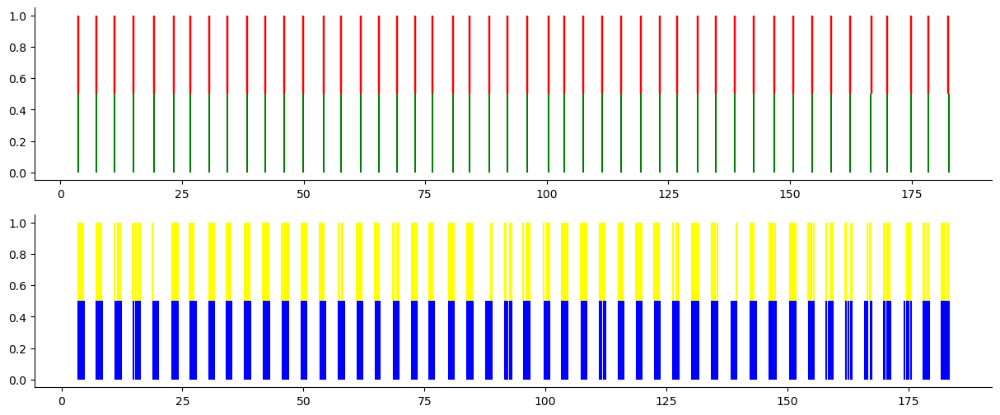

NAN percentage: 22%
4


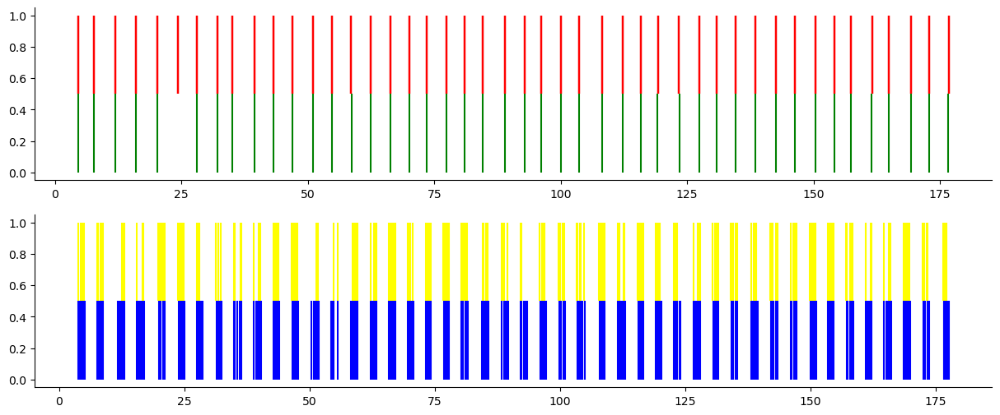

NAN percentage: 22%
5


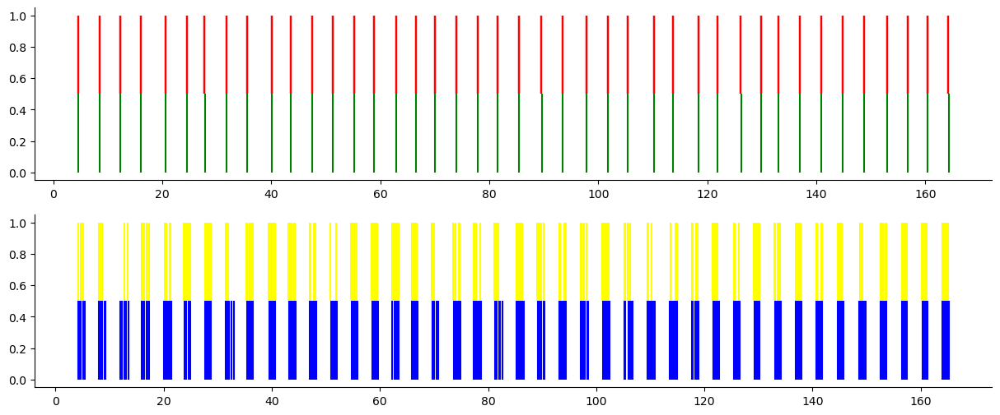

NAN percentage: 22%
6


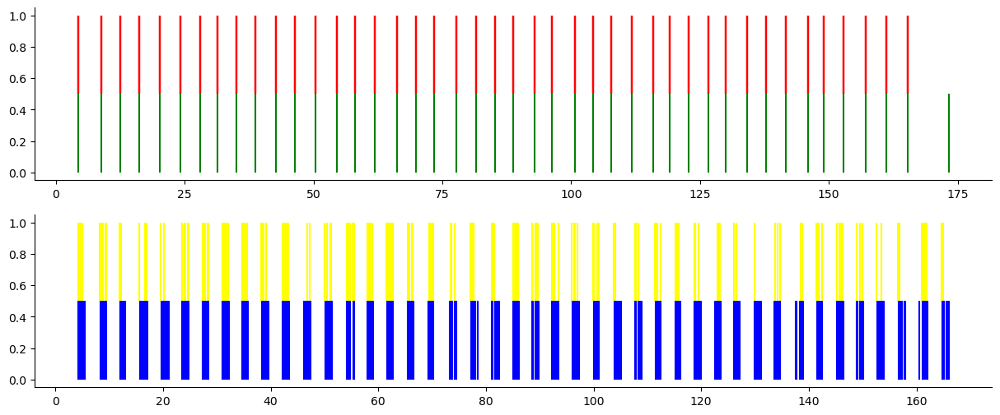

NAN percentage: 22%
7


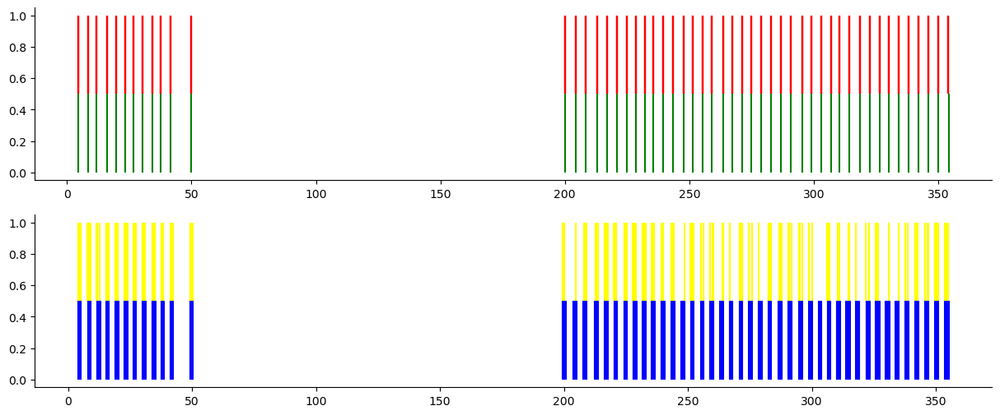

NAN percentage: 22%
8


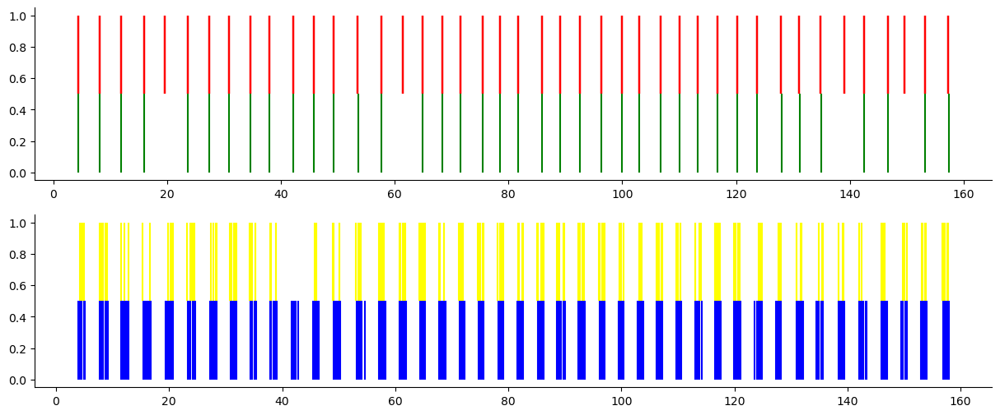

NAN percentage: 22%
9


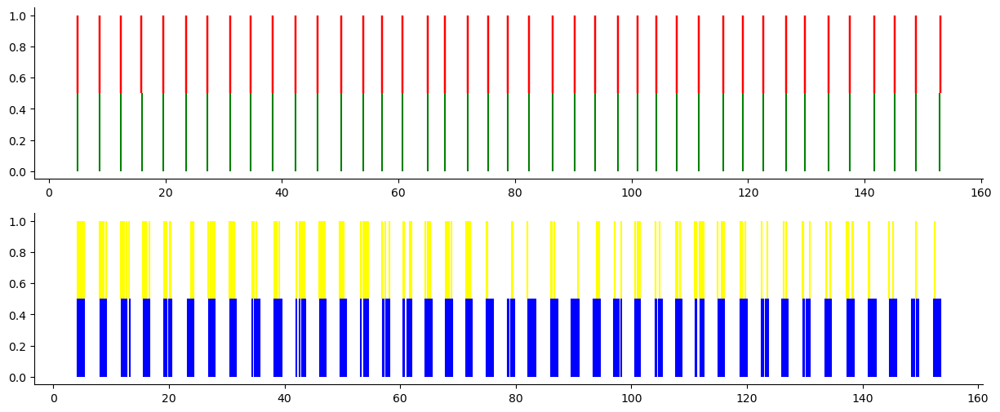

NAN percentage: 22%
10


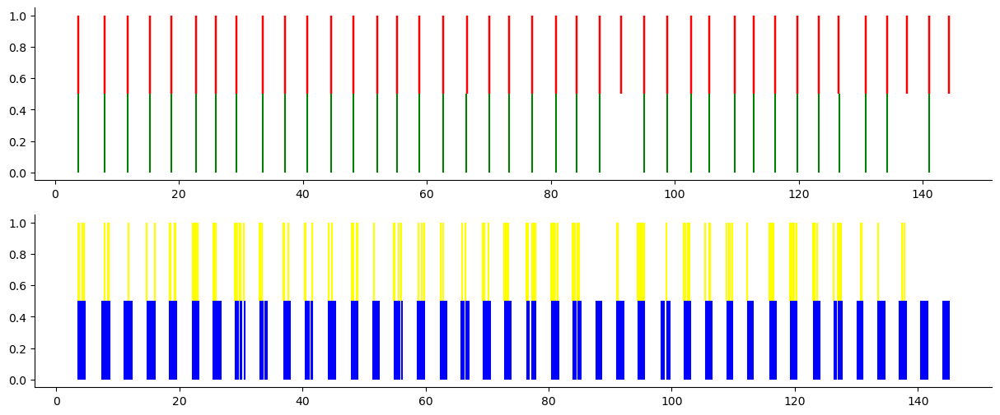

NAN percentage: 22%
P08 A2
1


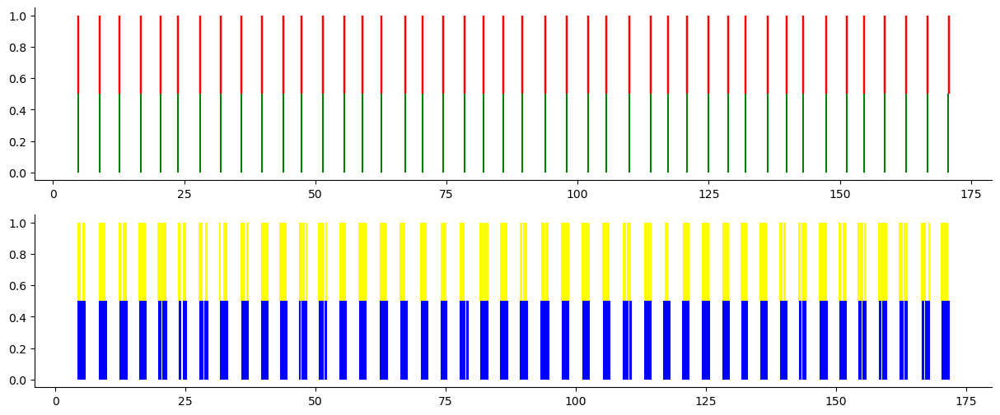

NAN percentage: 10%
2


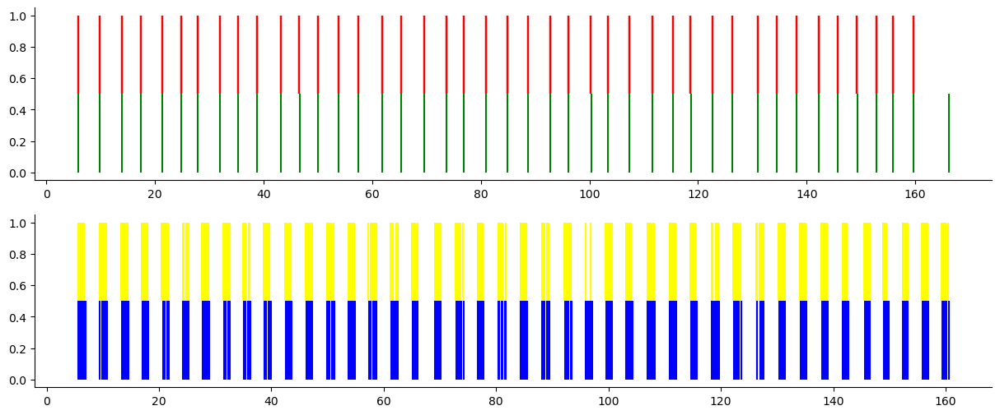

NAN percentage: 10%
3


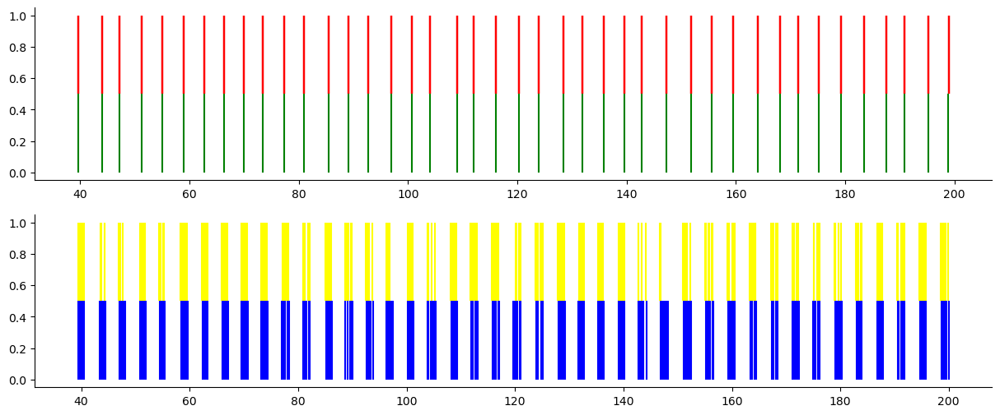

NAN percentage: 10%
4


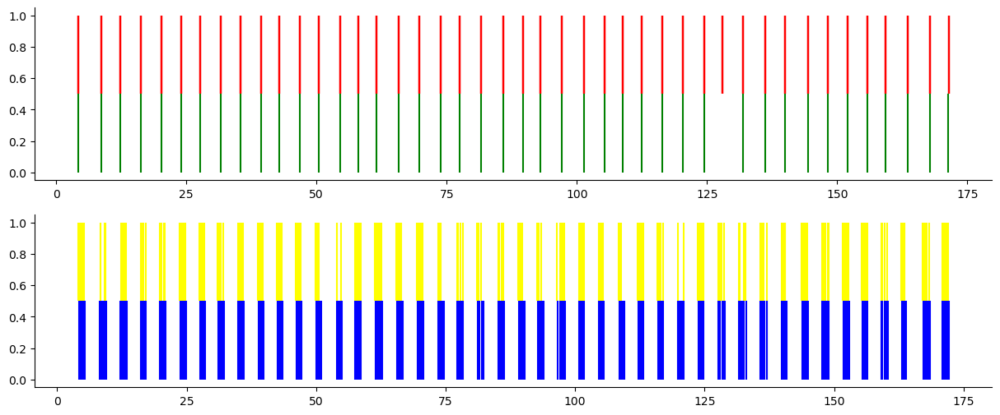

NAN percentage: 10%
5


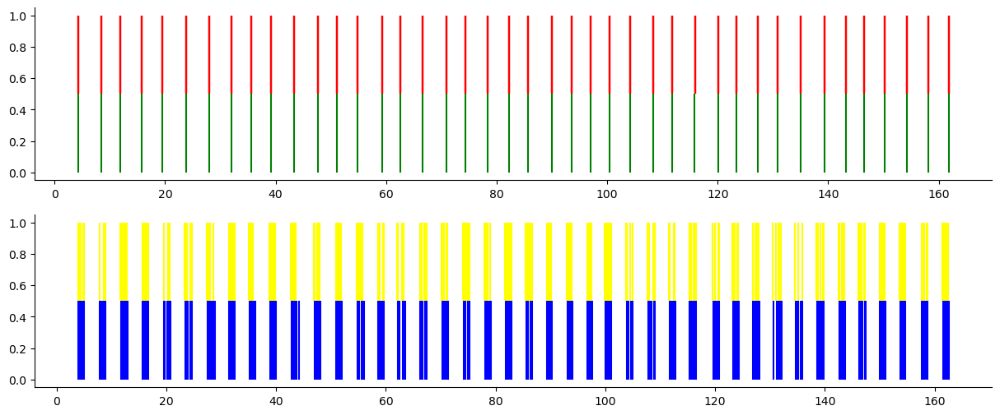

NAN percentage: 10%
6


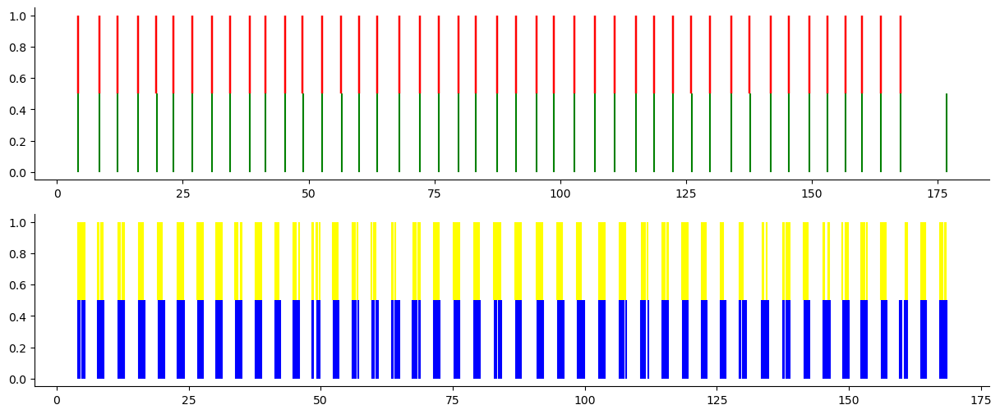

NAN percentage: 10%
7


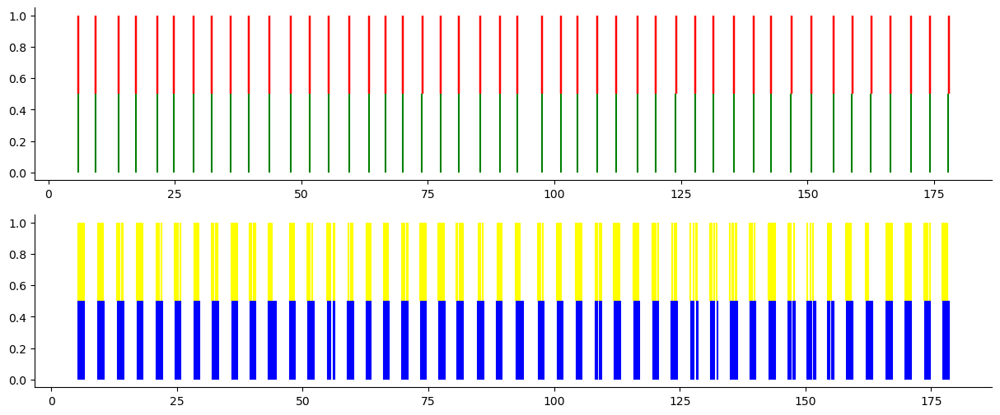

NAN percentage: 10%
8


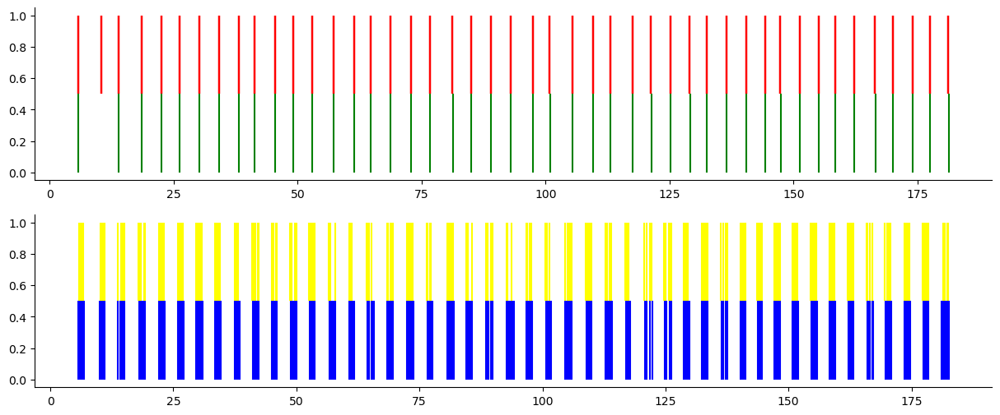

NAN percentage: 10%
9


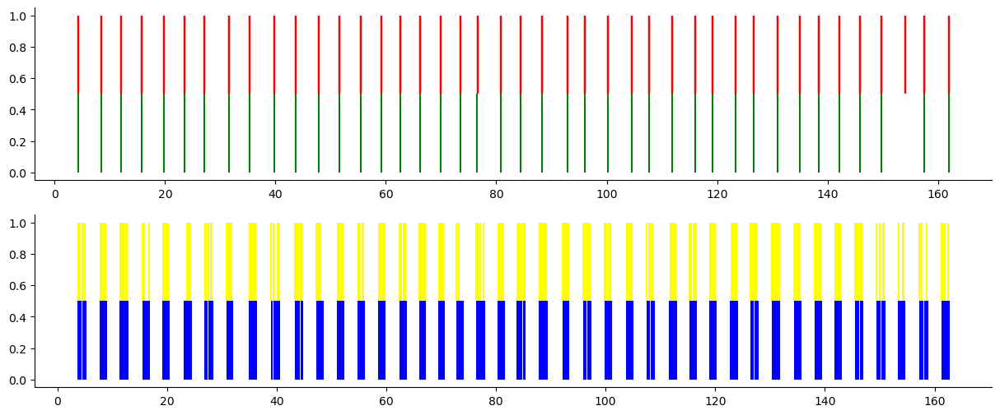

NAN percentage: 10%
10


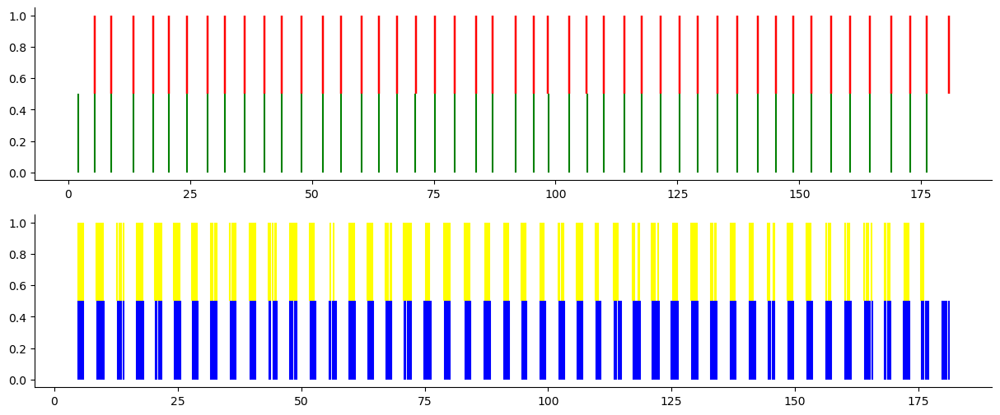

NAN percentage: 10%
P09 A1
1


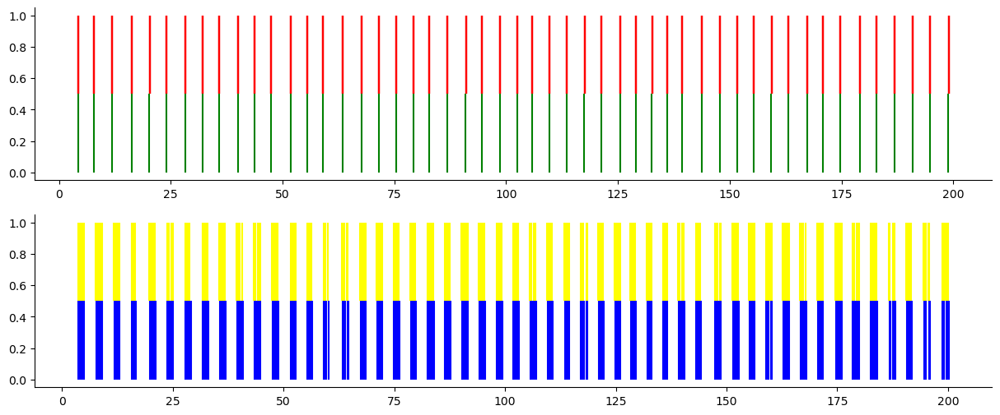

NAN percentage: 8%
2


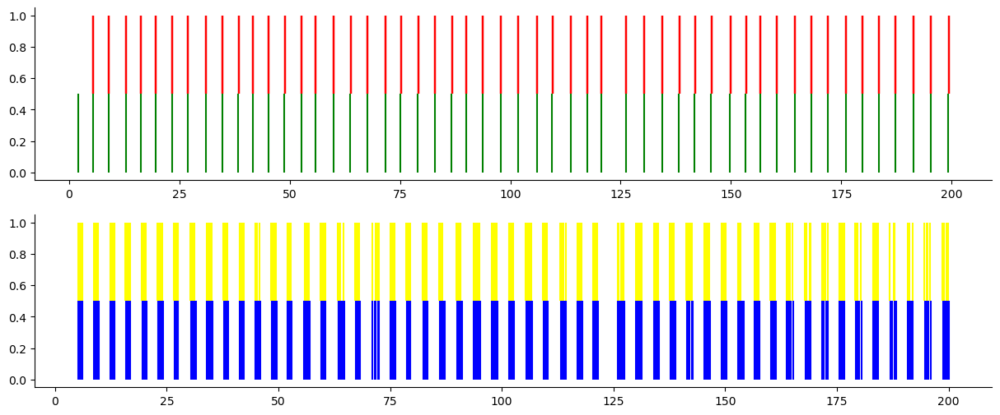

NAN percentage: 8%
3


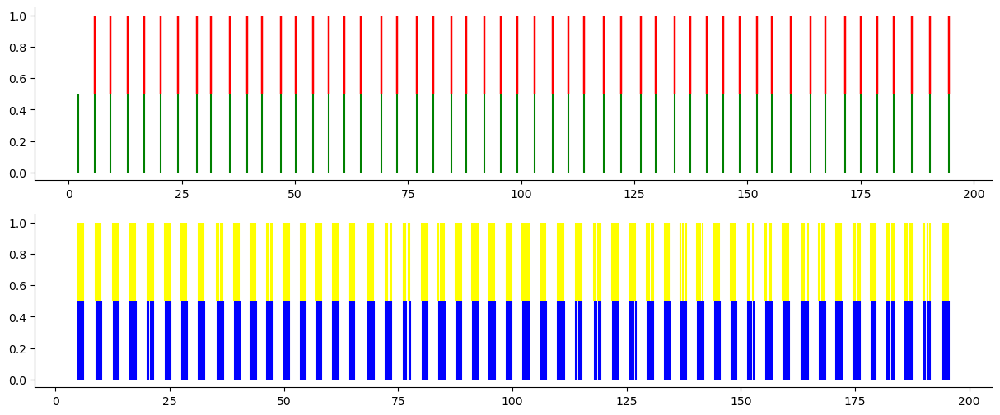

NAN percentage: 8%
4


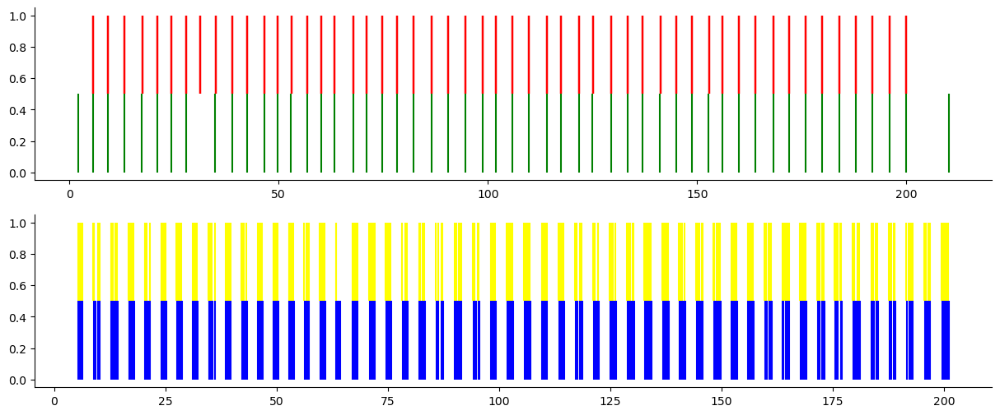

NAN percentage: 8%
5


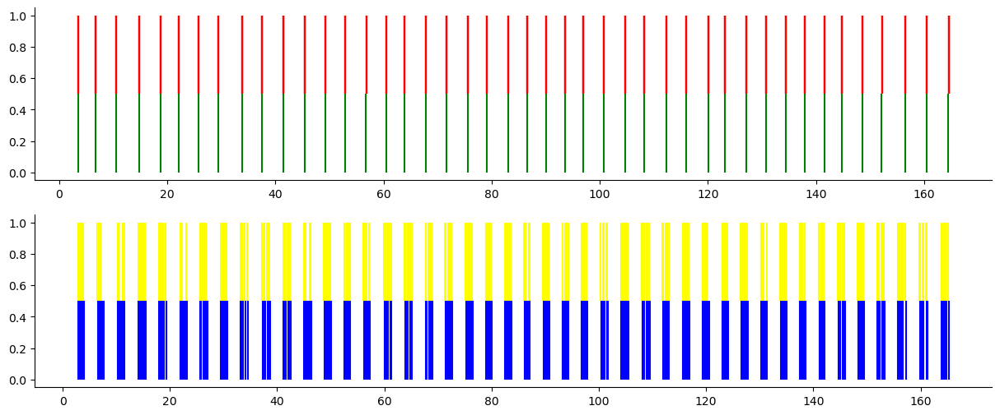

NAN percentage: 8%
6


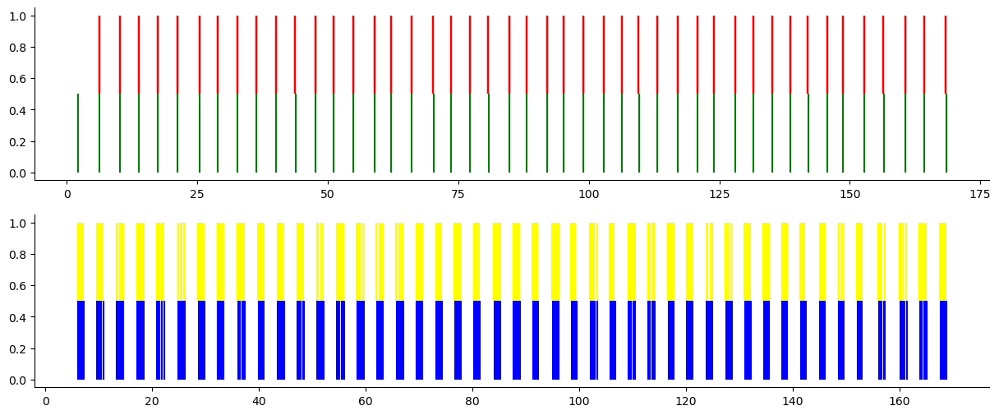

NAN percentage: 8%
7


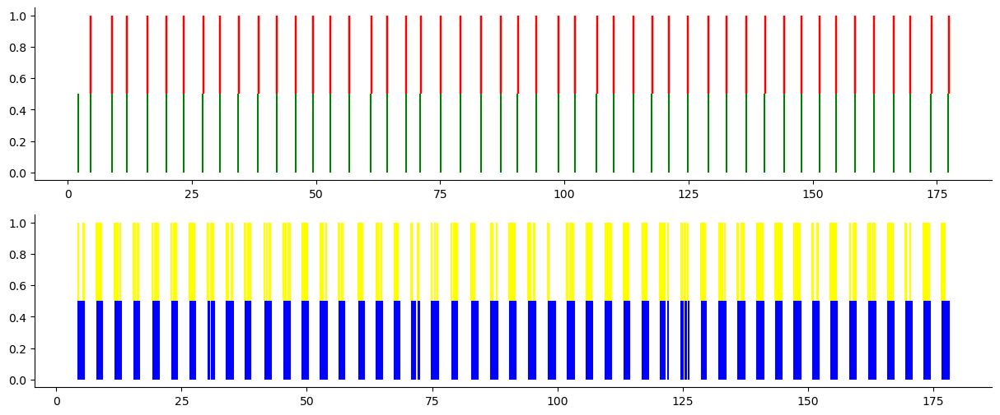

NAN percentage: 8%
8


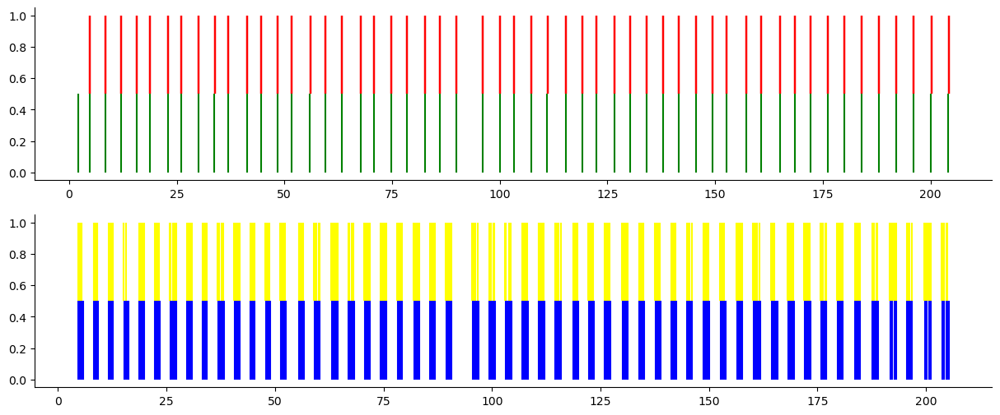

NAN percentage: 8%
9


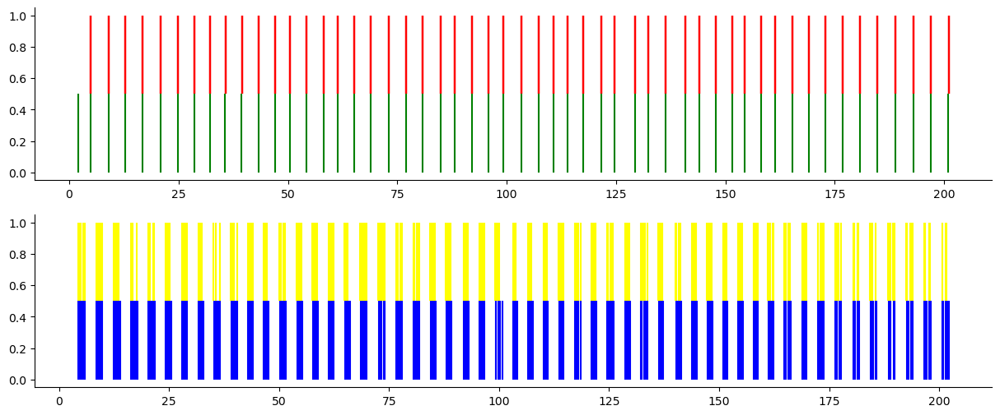

NAN percentage: 8%
10


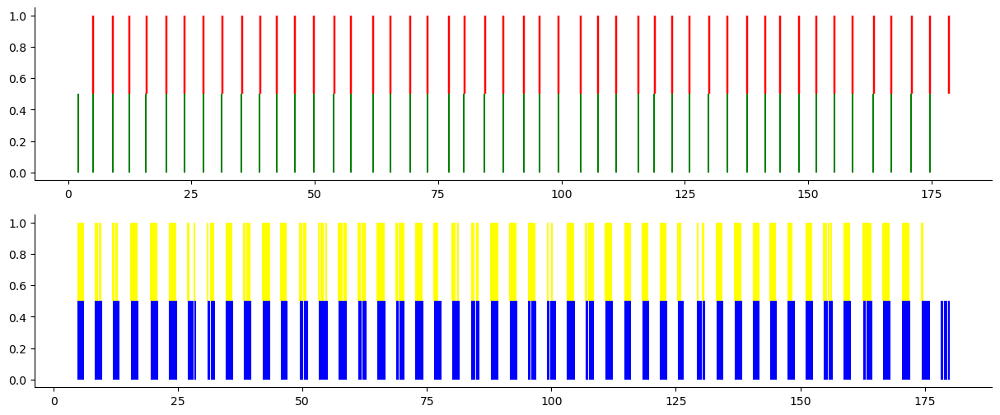

NAN percentage: 8%
P09 A2
1


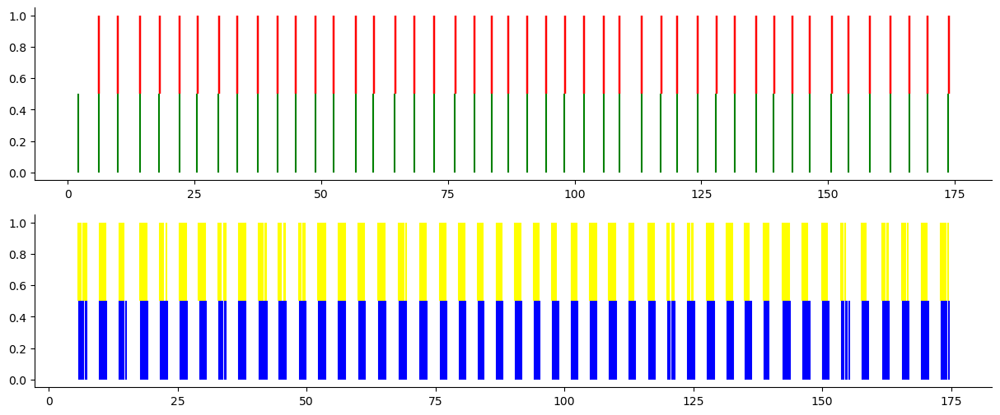

NAN percentage: 11%
2


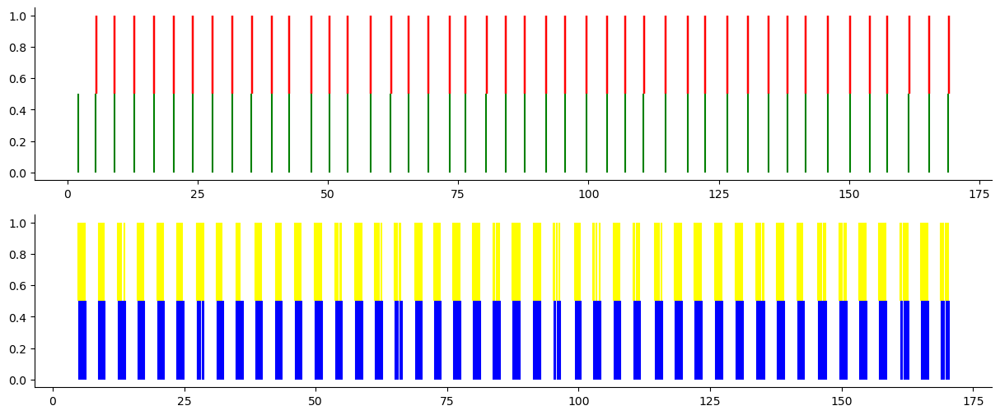

NAN percentage: 11%
3


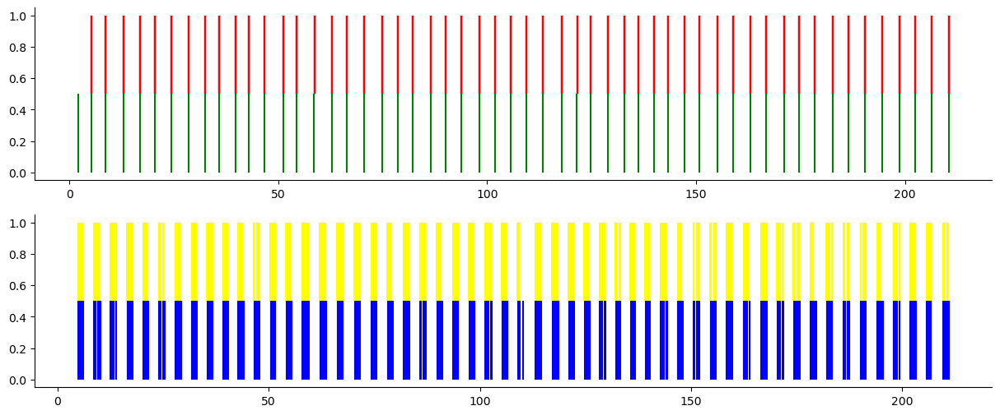

NAN percentage: 11%
4


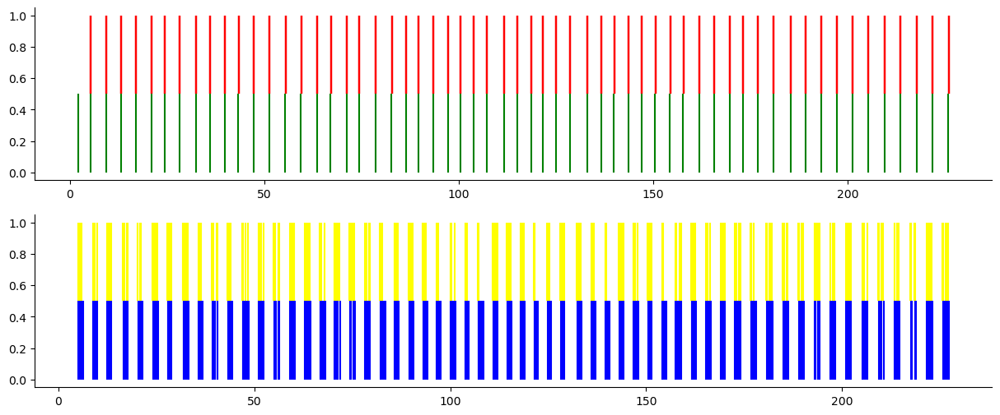

NAN percentage: 11%
5


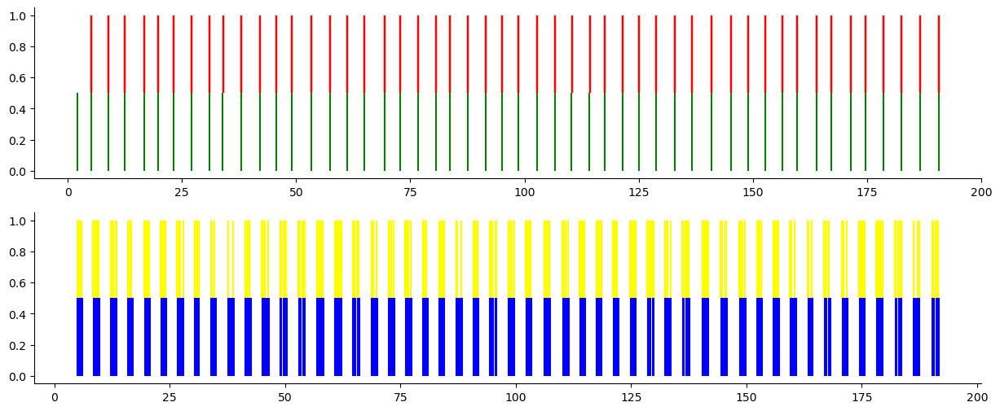

NAN percentage: 11%
6


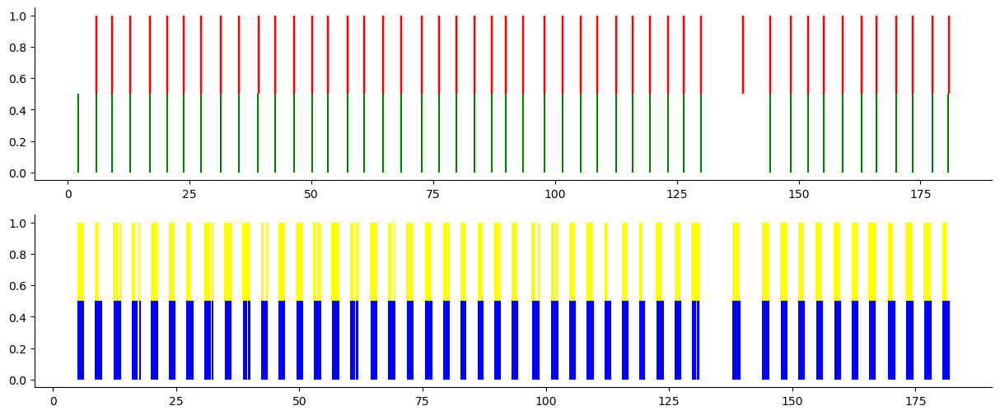

NAN percentage: 11%
7


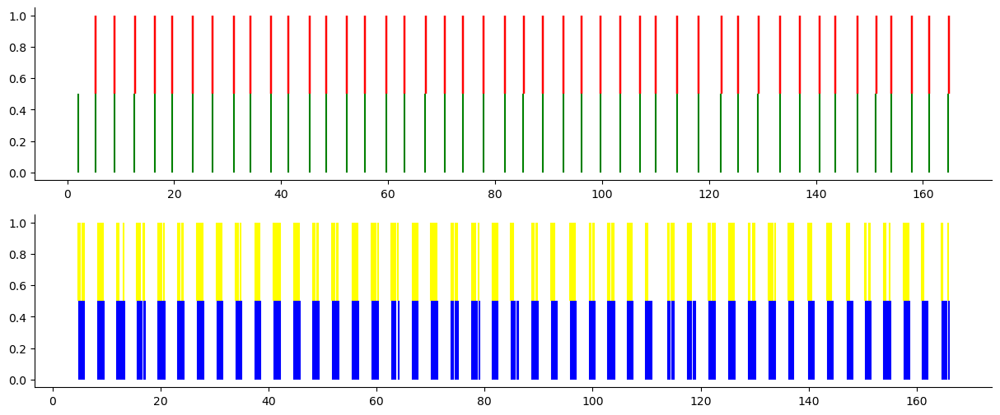

NAN percentage: 11%
8


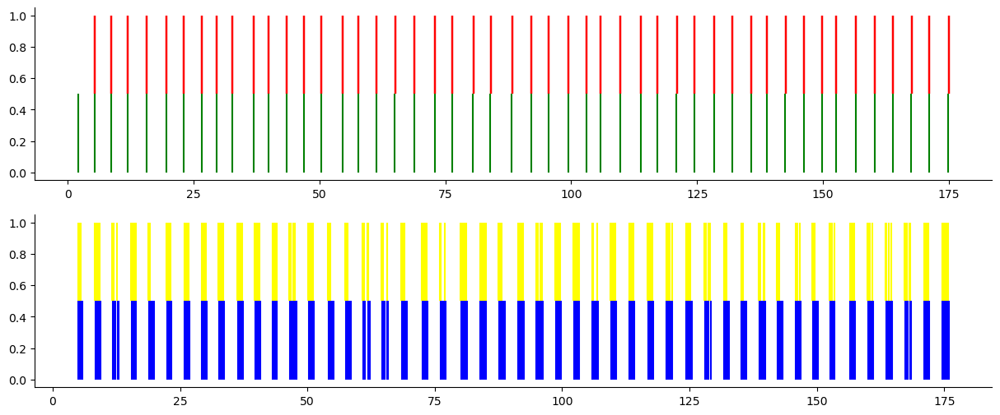

NAN percentage: 11%
9


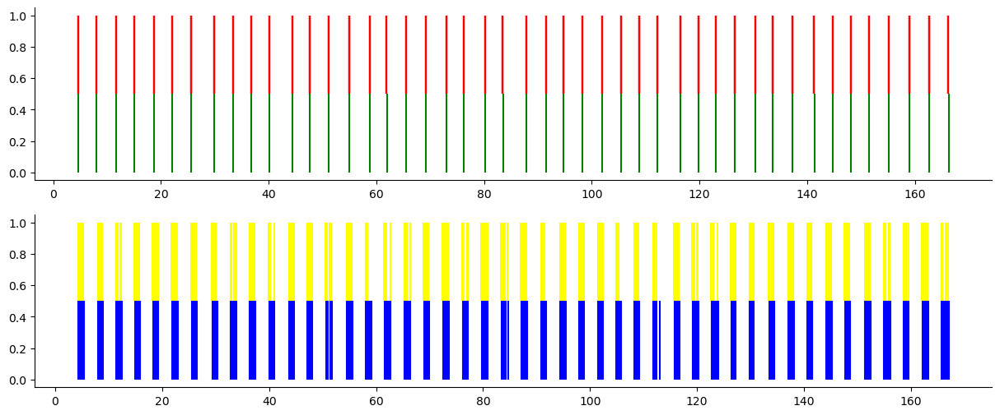

NAN percentage: 11%
10


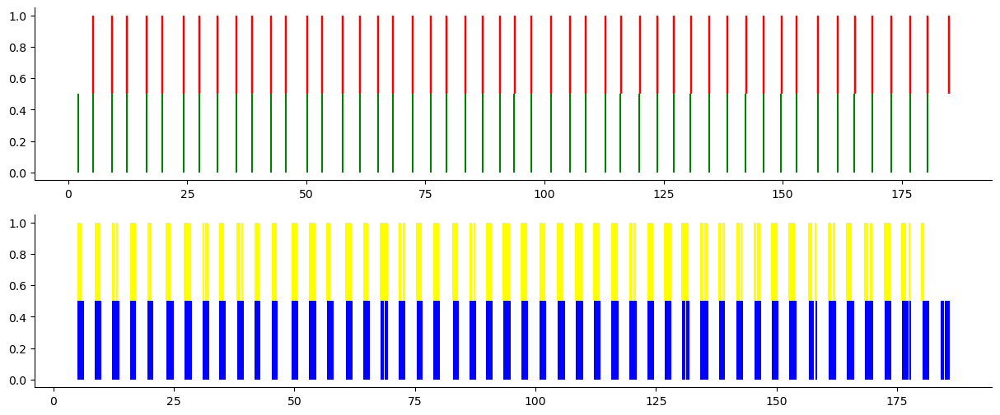

NAN percentage: 11%
P10 A1
1


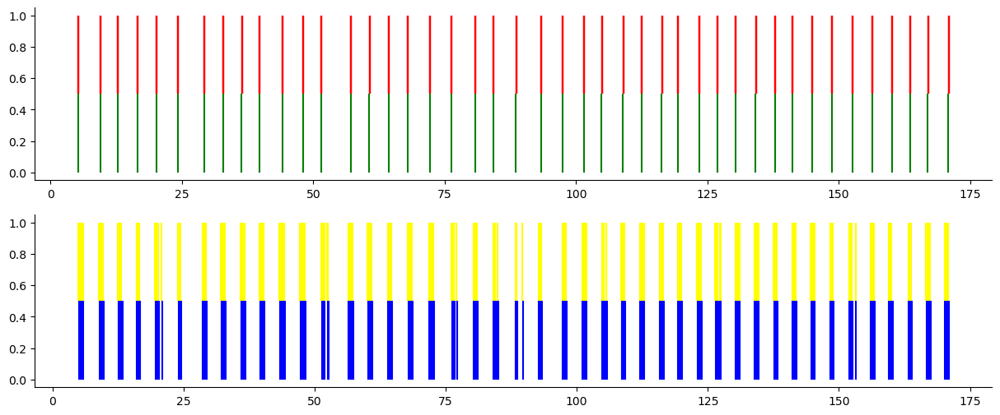

NAN percentage: 10%
2


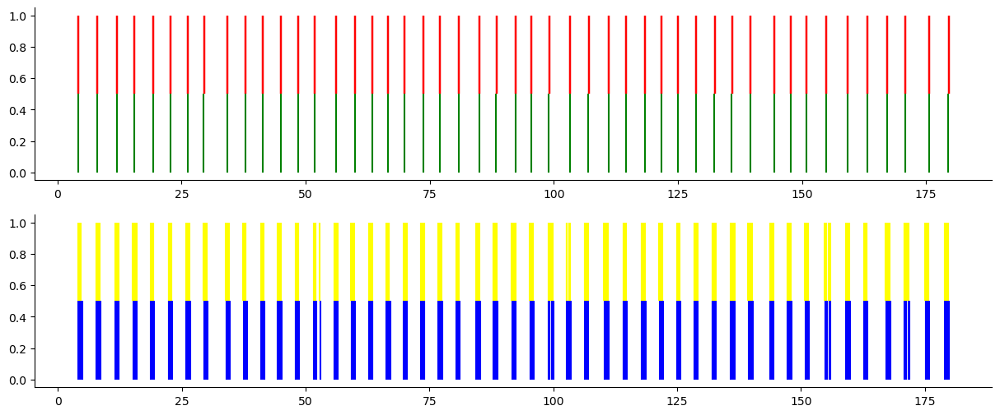

NAN percentage: 10%
3


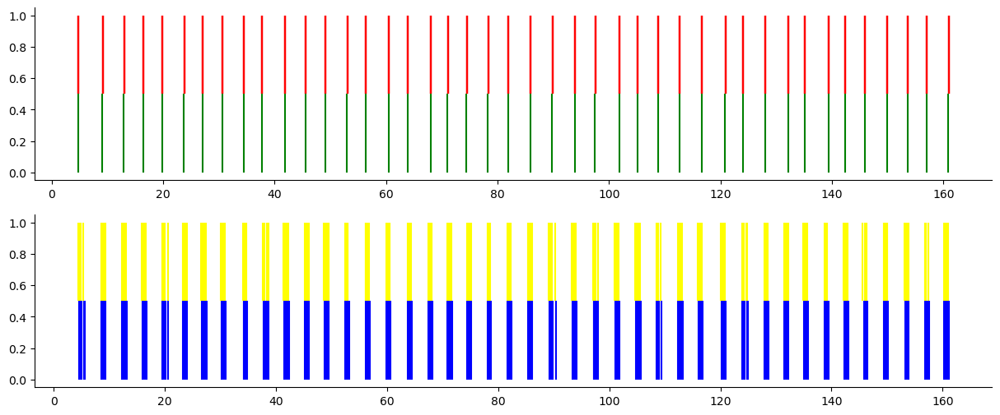

NAN percentage: 10%
4


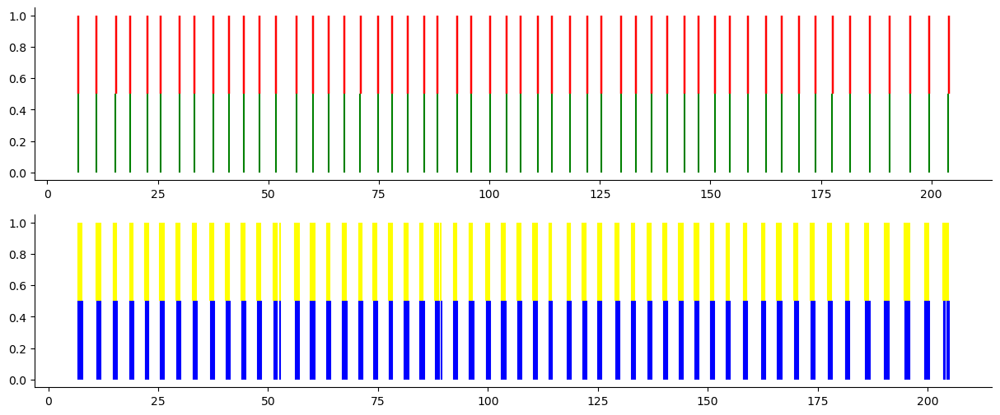

NAN percentage: 10%
5


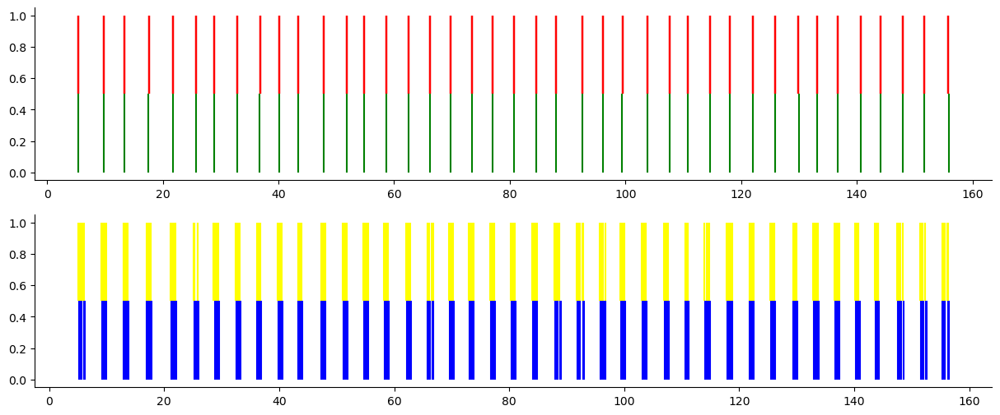

NAN percentage: 10%
6


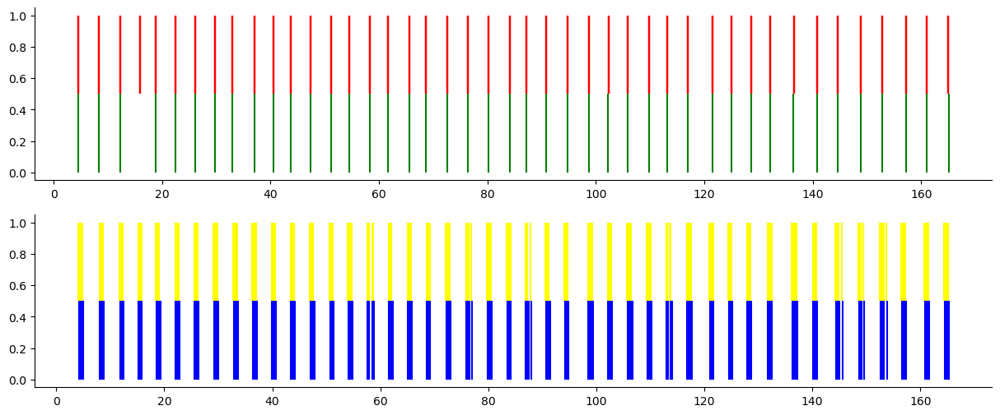

NAN percentage: 10%
7
Must have equal len keys and value when setting with an iterable


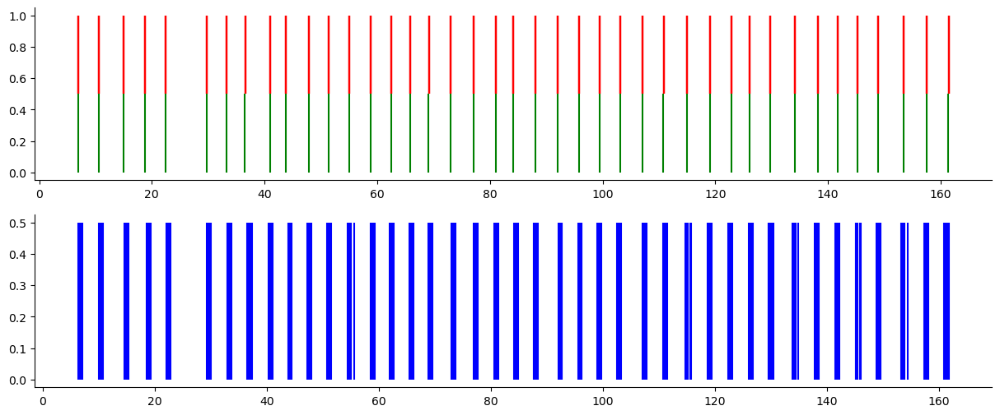

NAN percentage: 10%
8


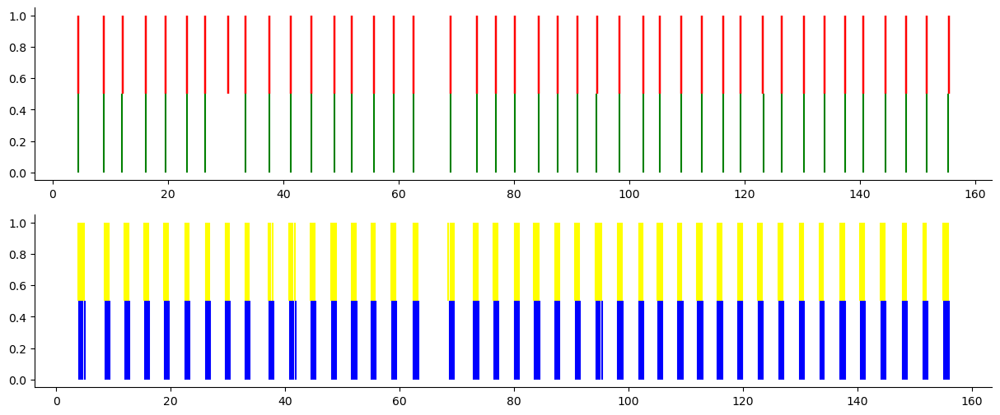

NAN percentage: 10%
9


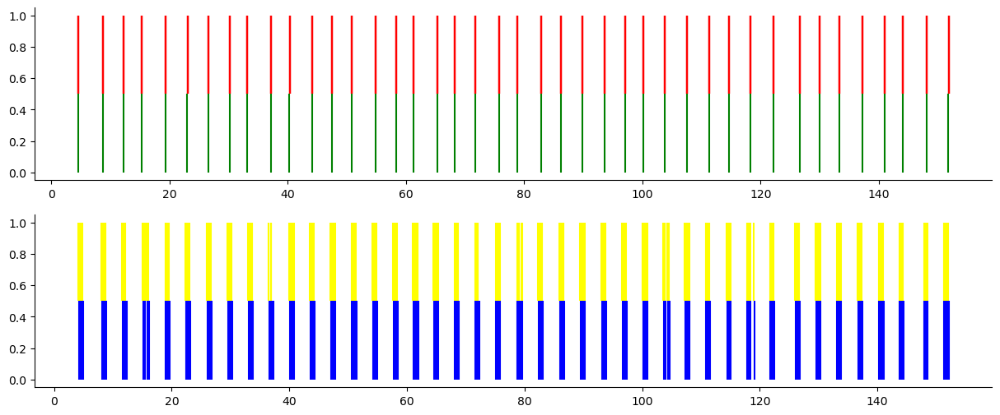

NAN percentage: 10%
10


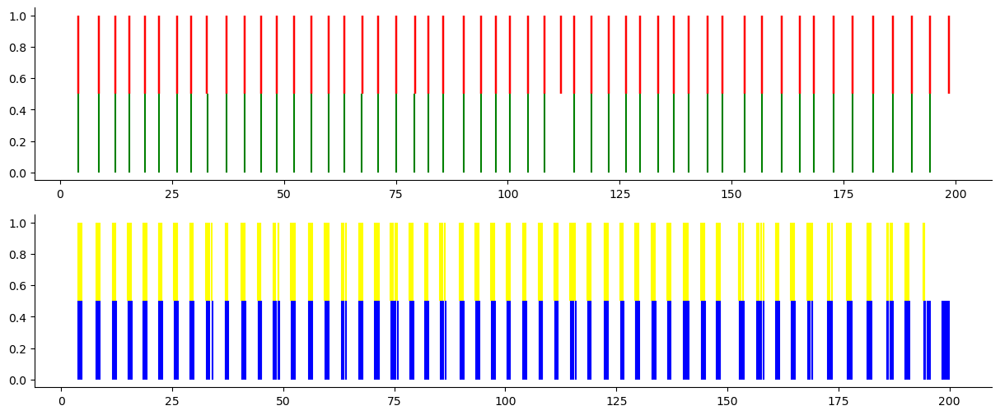

NAN percentage: 10%
P10 A2
1


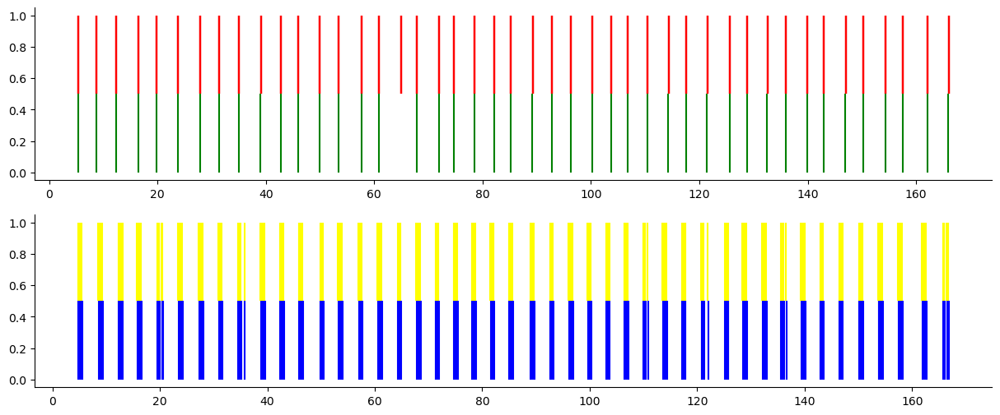

NAN percentage: 0%
2


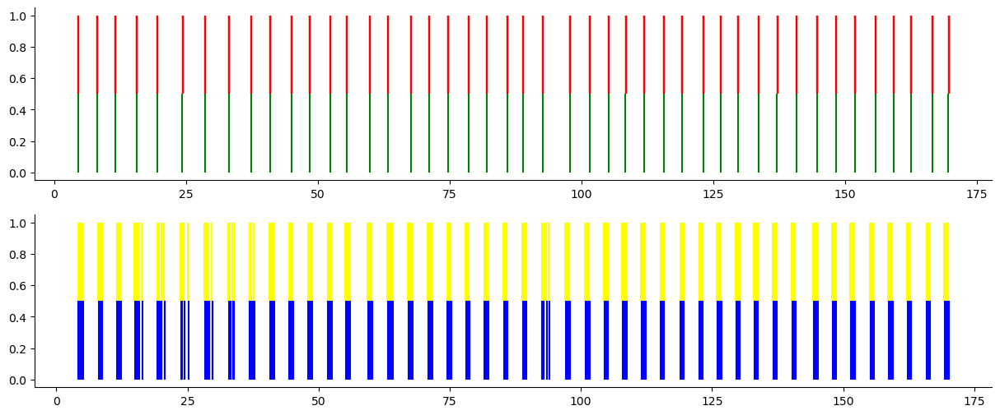

NAN percentage: 0%
3


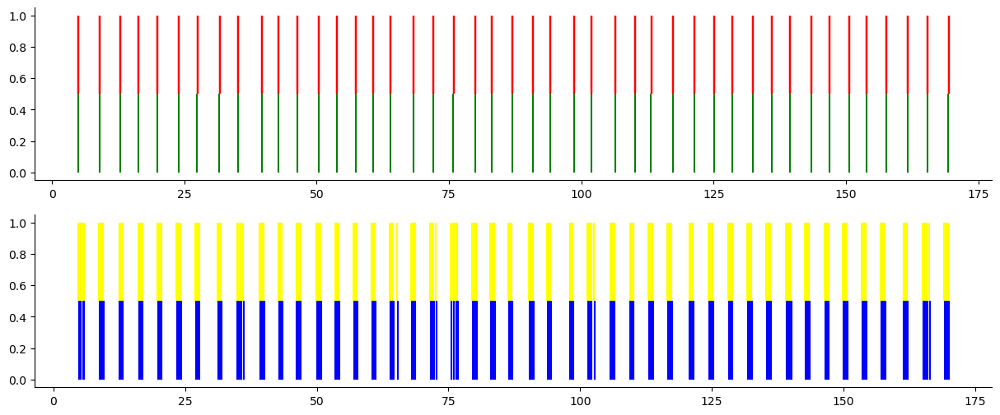

NAN percentage: 0%
4


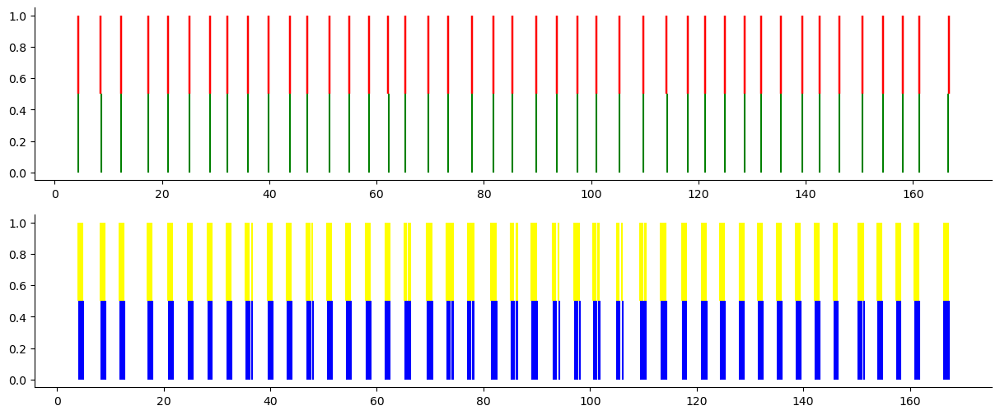

NAN percentage: 0%
5


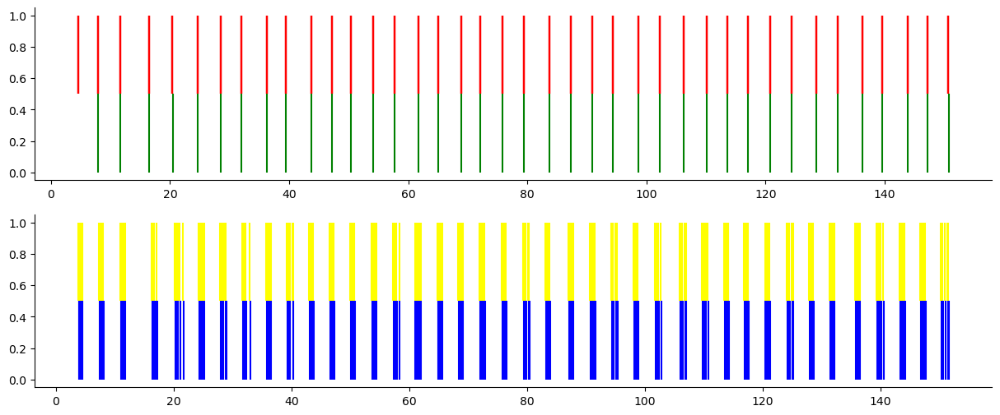

NAN percentage: 0%
6


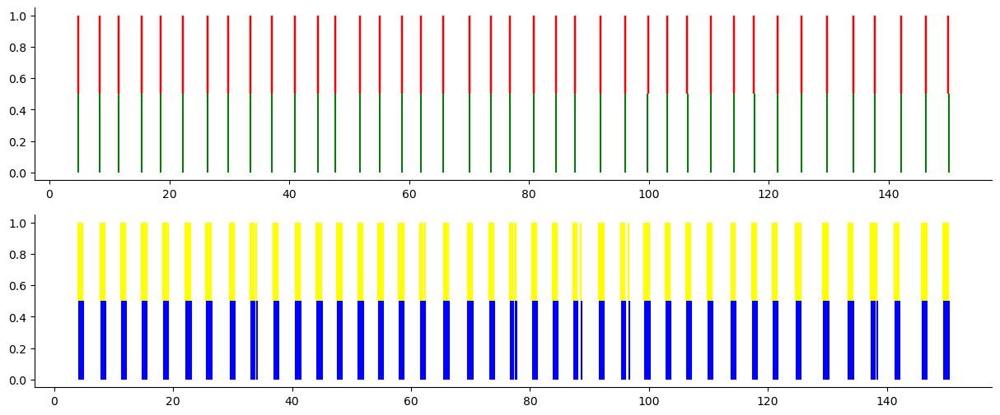

NAN percentage: 0%
7


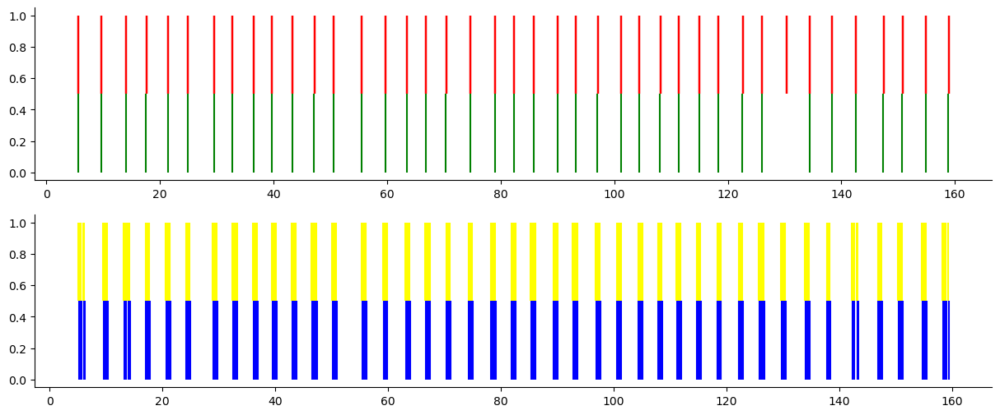

NAN percentage: 0%
8


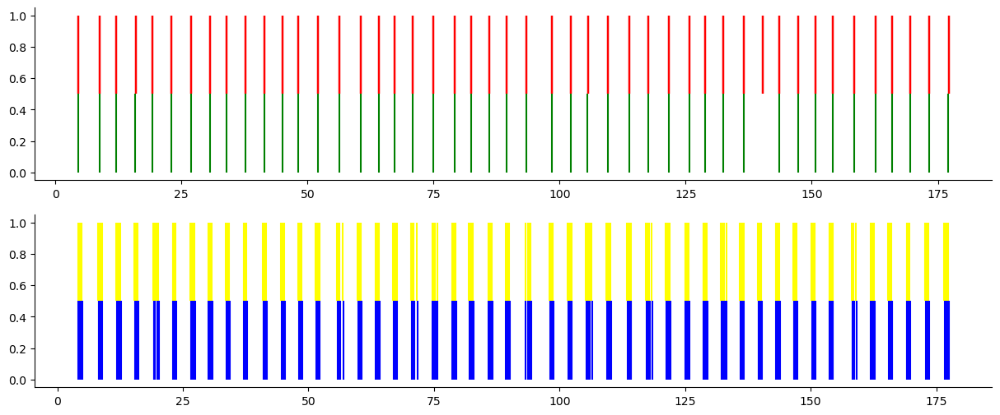

NAN percentage: 0%
9


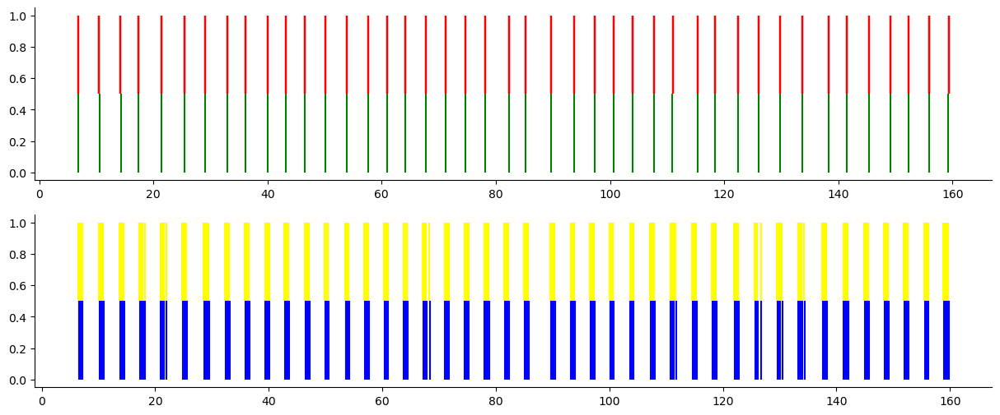

NAN percentage: 0%
10


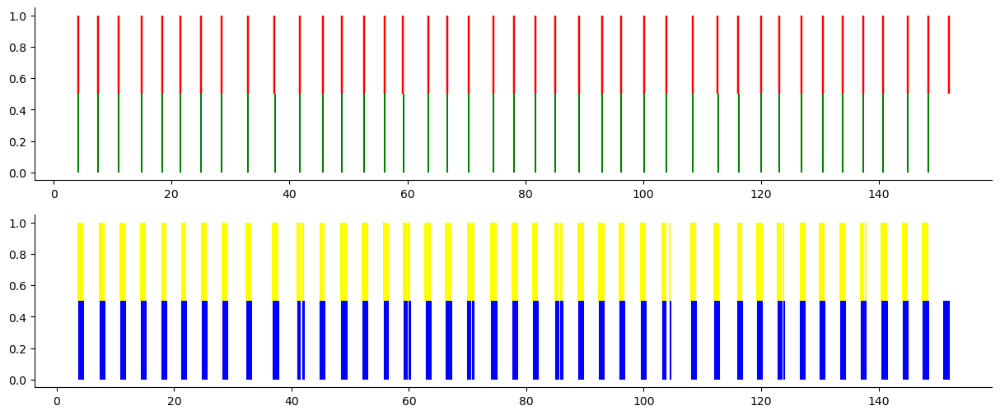

NAN percentage: 0%
P11 A1
1


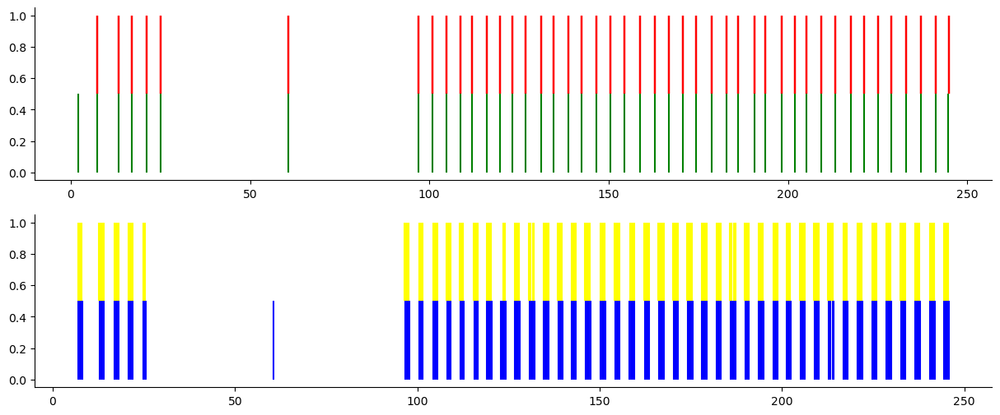

NAN percentage: 6%
2


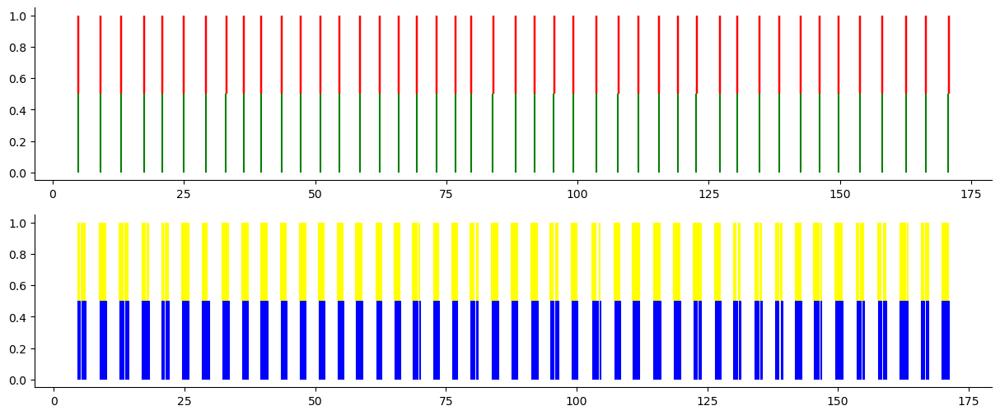

NAN percentage: 6%
3


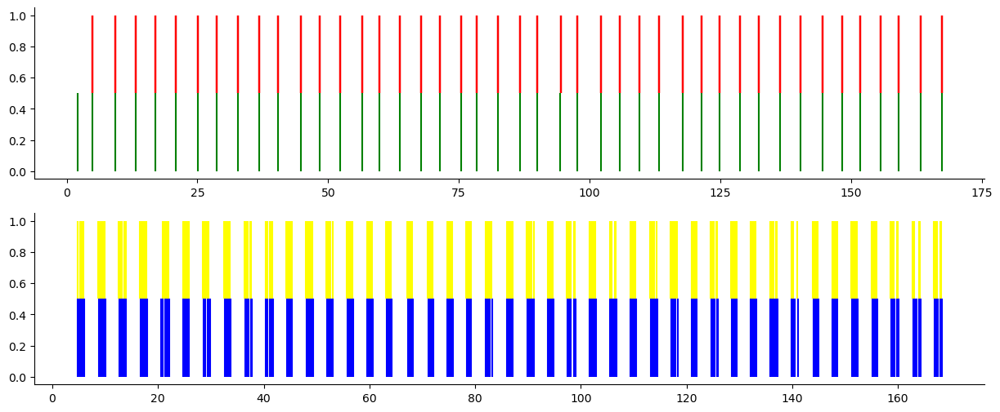

NAN percentage: 6%
4


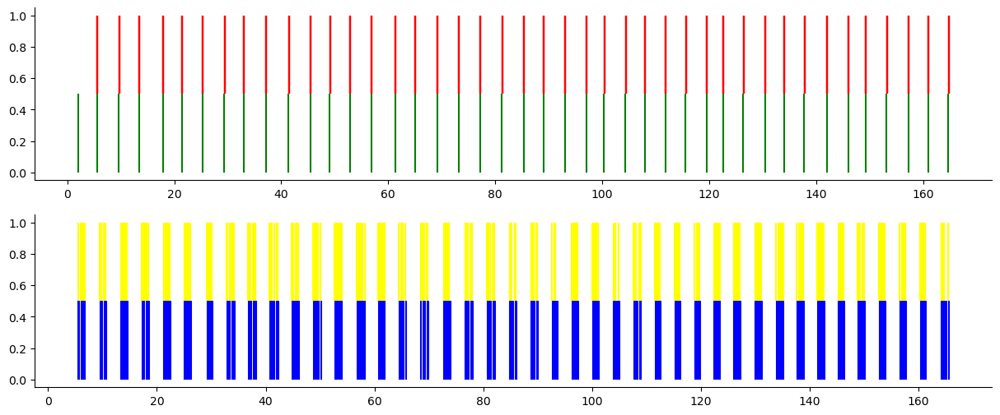

NAN percentage: 6%
5


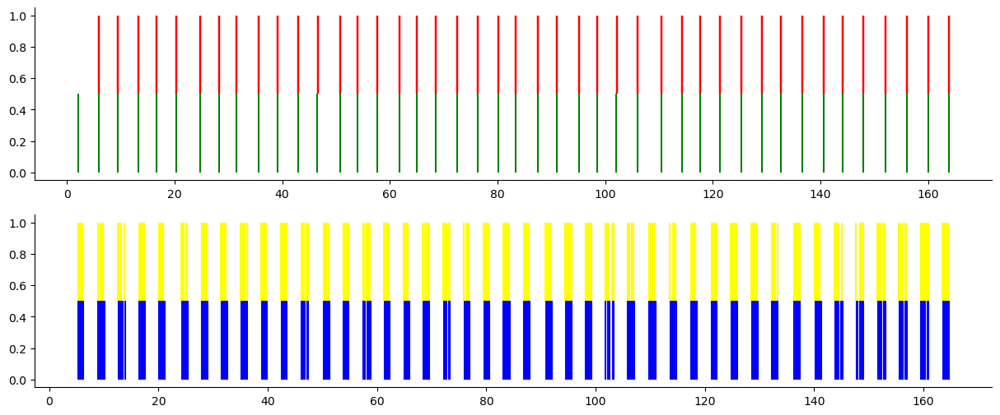

NAN percentage: 6%
6


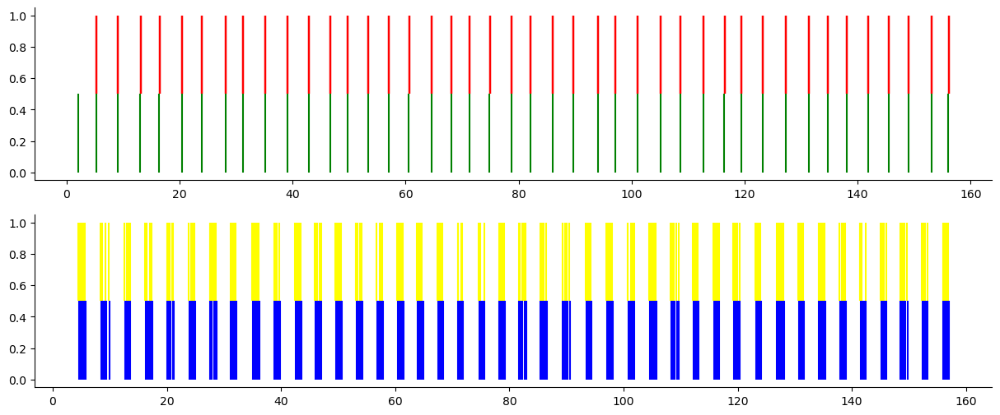

NAN percentage: 6%
7


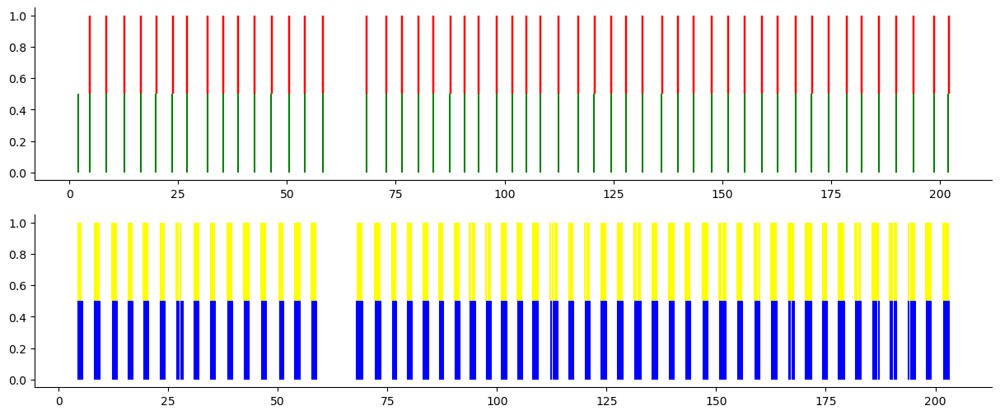

NAN percentage: 6%
8


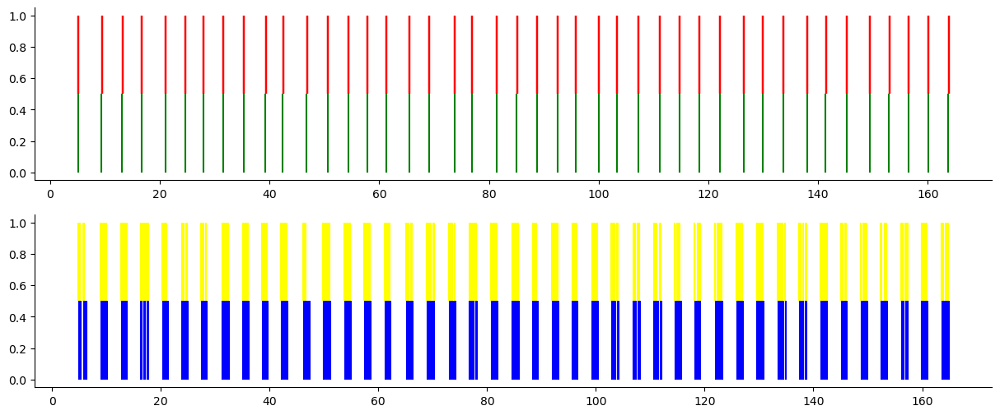

NAN percentage: 6%
9


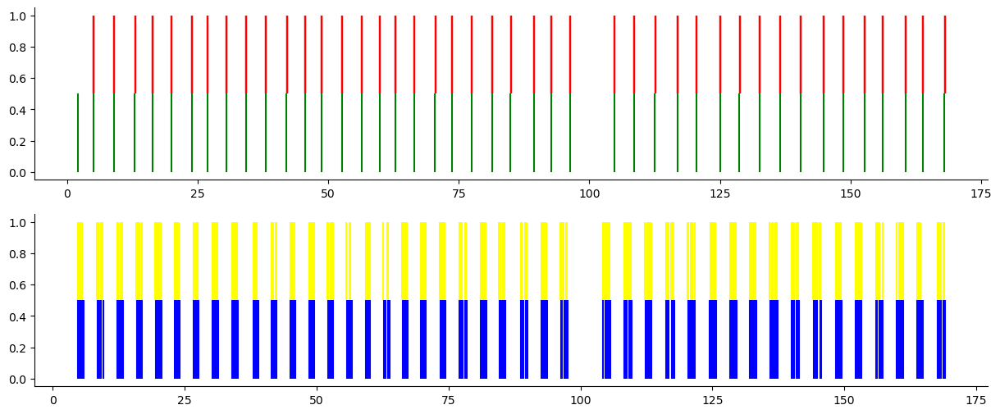

NAN percentage: 6%
10


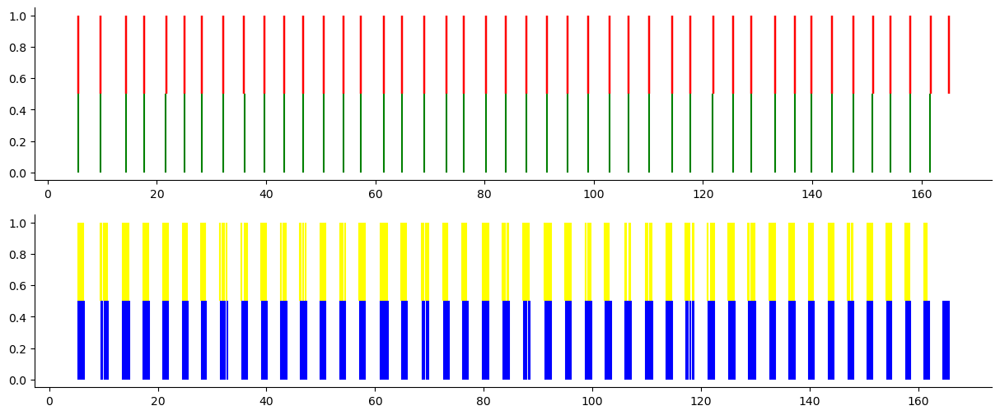

NAN percentage: 6%
P11 A2
2


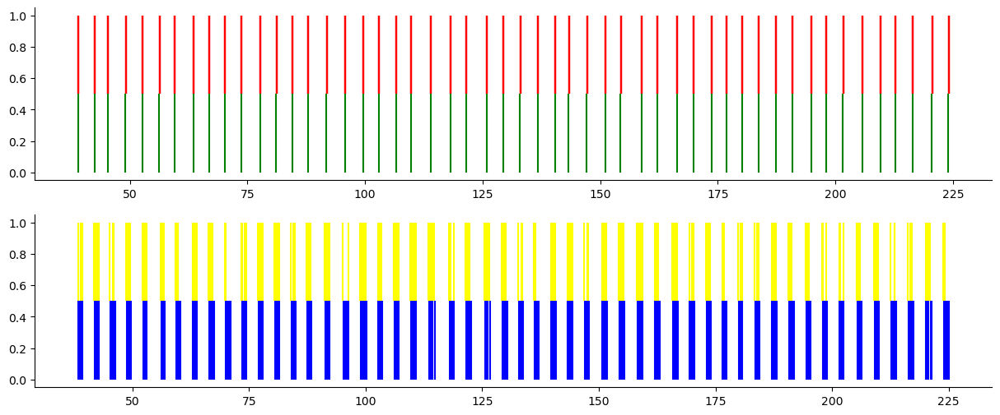

NAN percentage: 30%
3


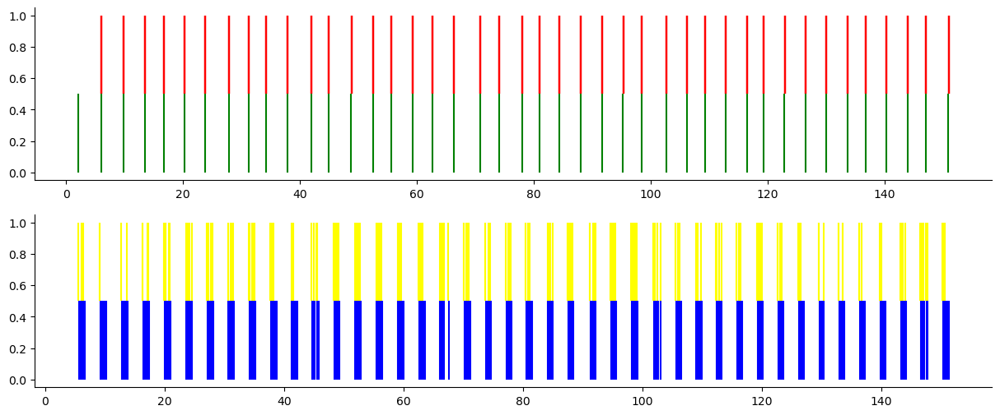

NAN percentage: 30%
4


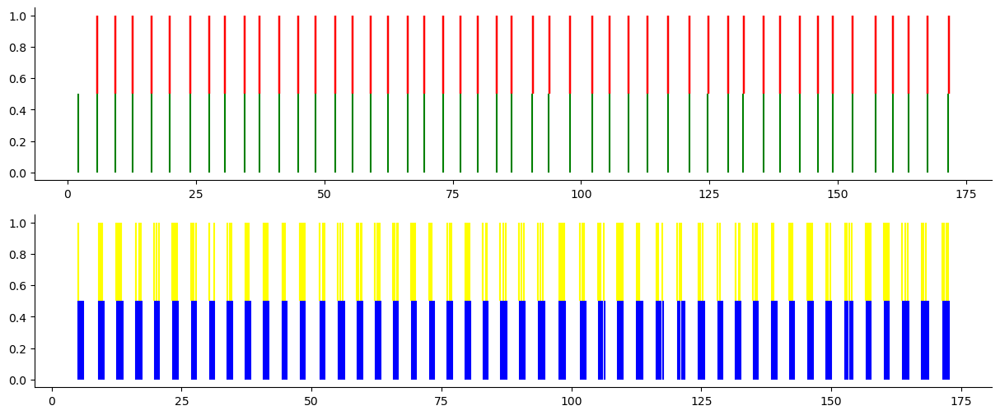

NAN percentage: 30%
5


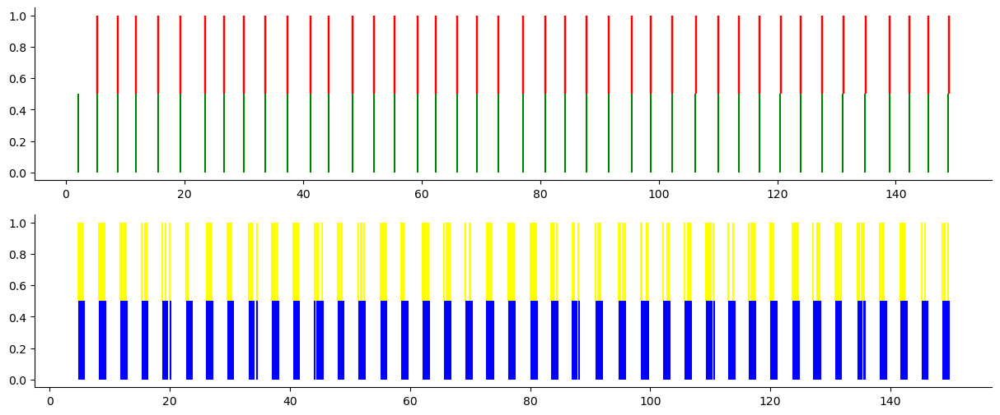

NAN percentage: 30%
6


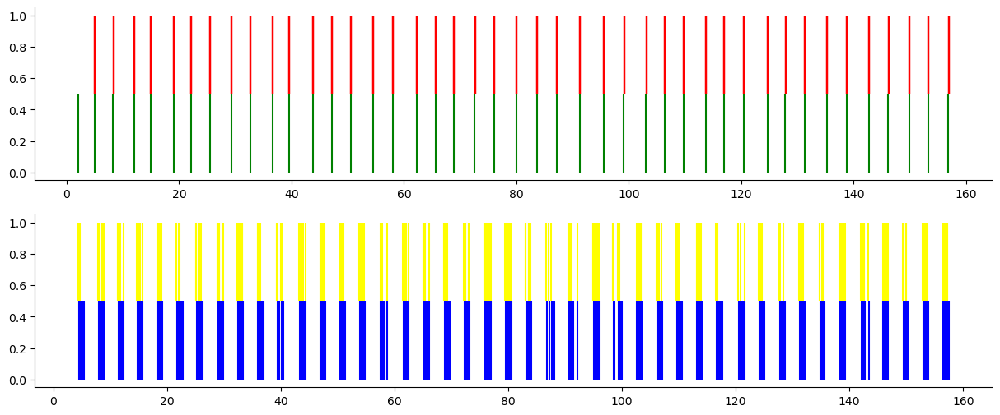

NAN percentage: 30%
7


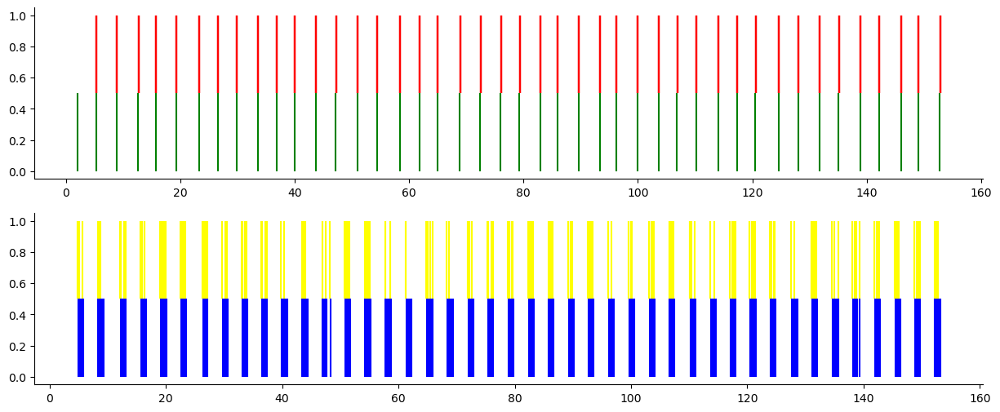

NAN percentage: 30%
8


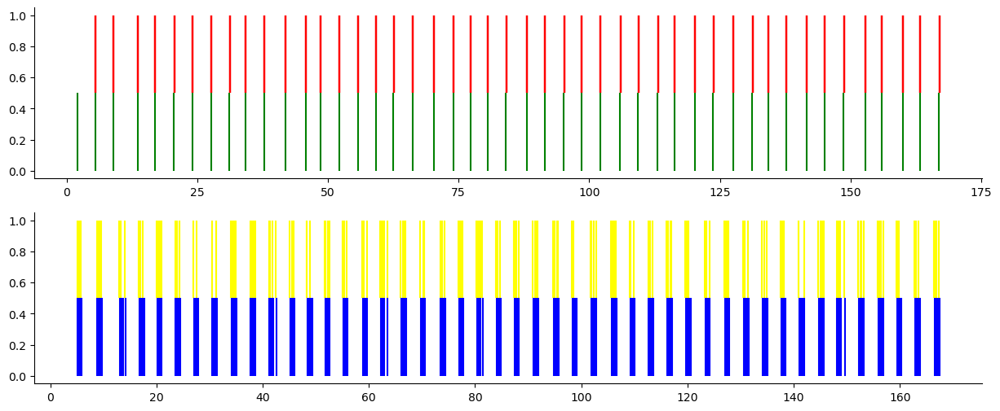

NAN percentage: 30%
9


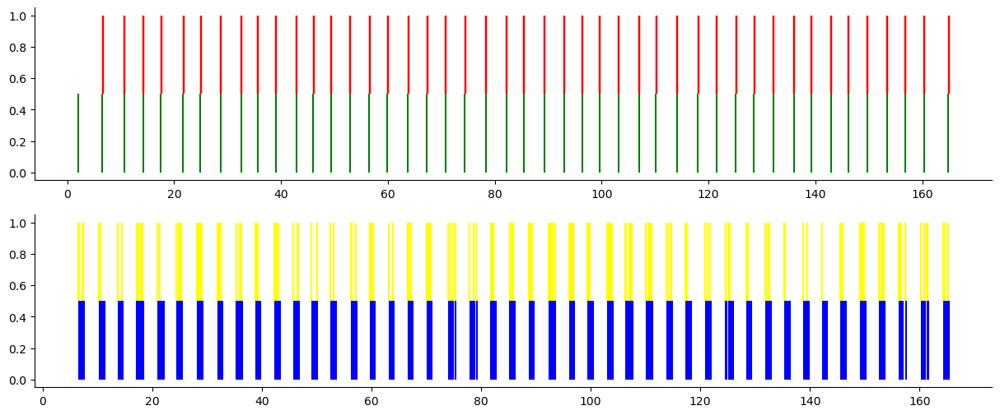

NAN percentage: 30%
10


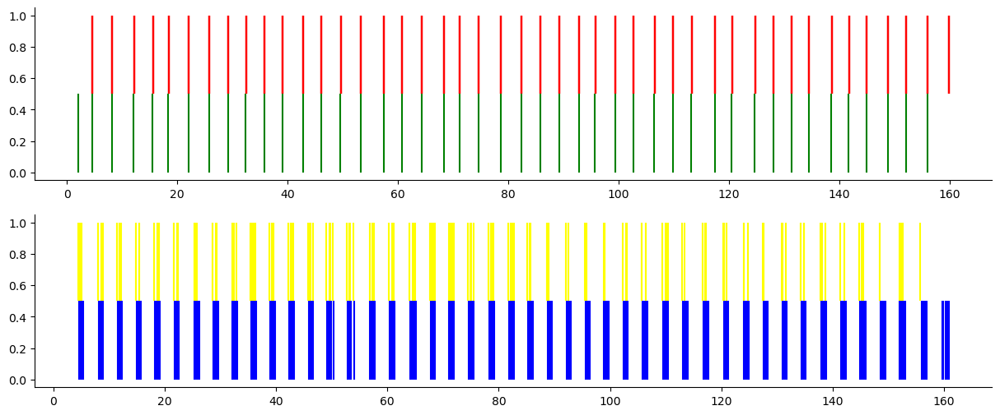

NAN percentage: 30%
P12 A1
1


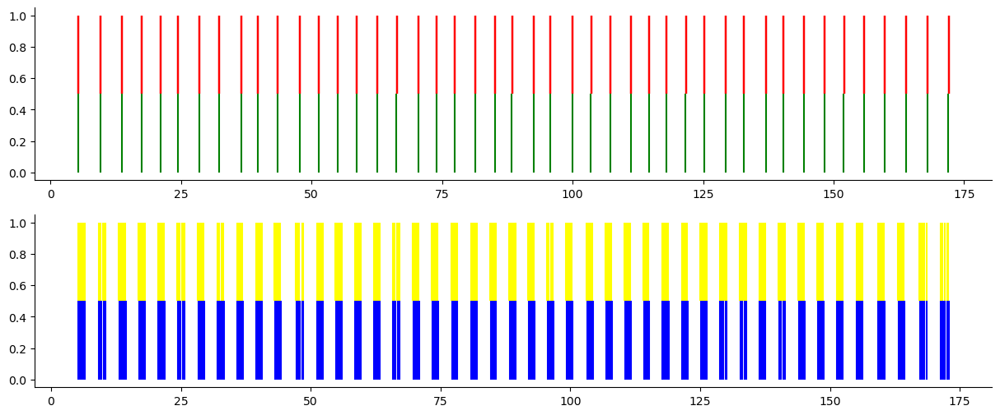

NAN percentage: 4%
2


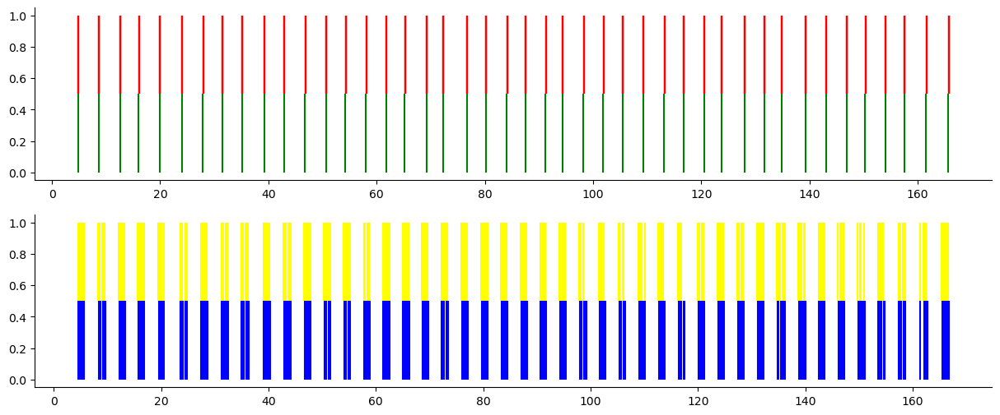

NAN percentage: 4%
3


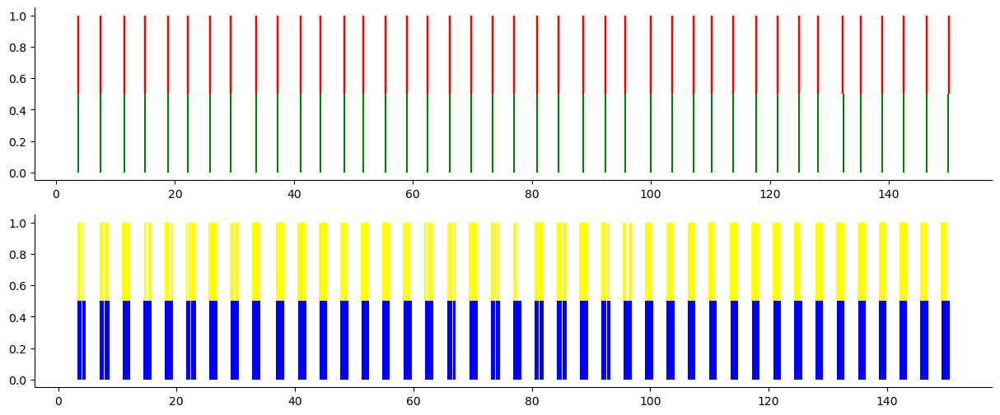

NAN percentage: 4%
4


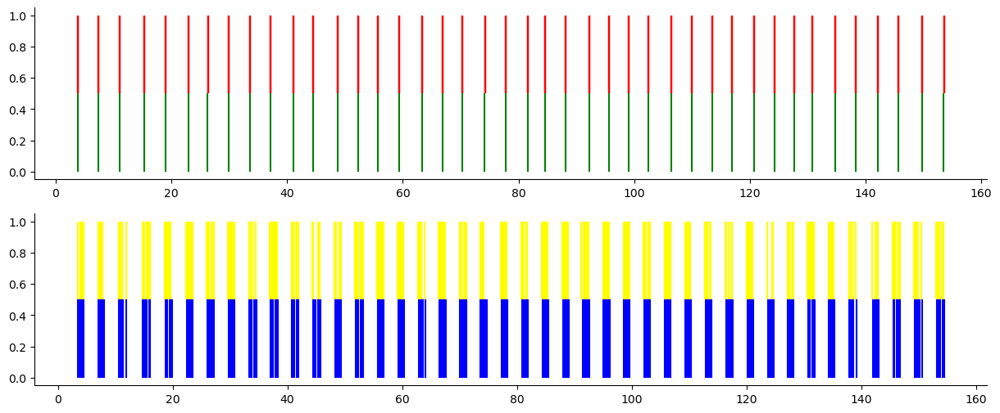

NAN percentage: 4%
5


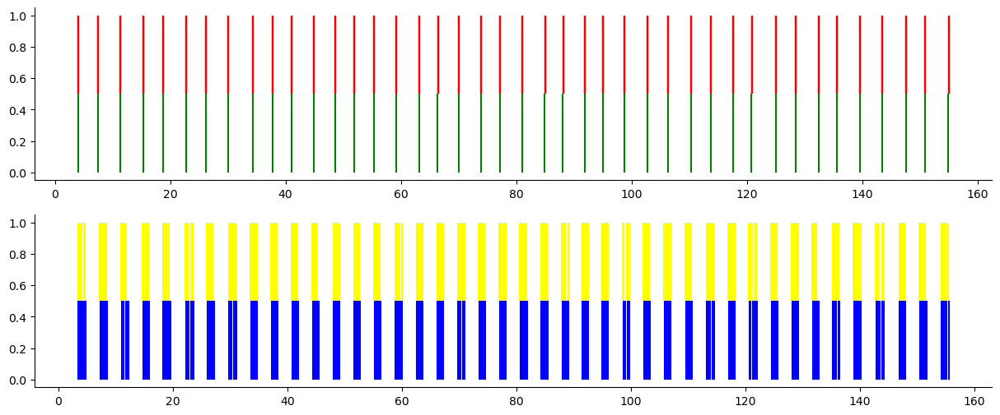

NAN percentage: 4%
6


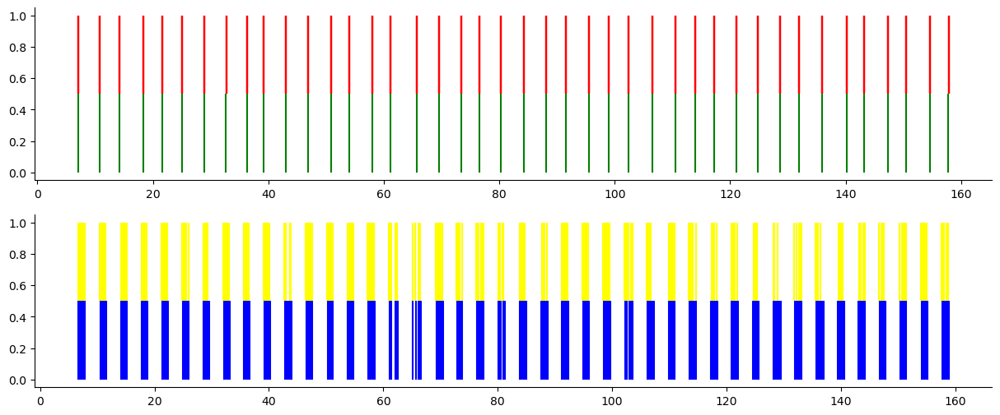

NAN percentage: 4%
7


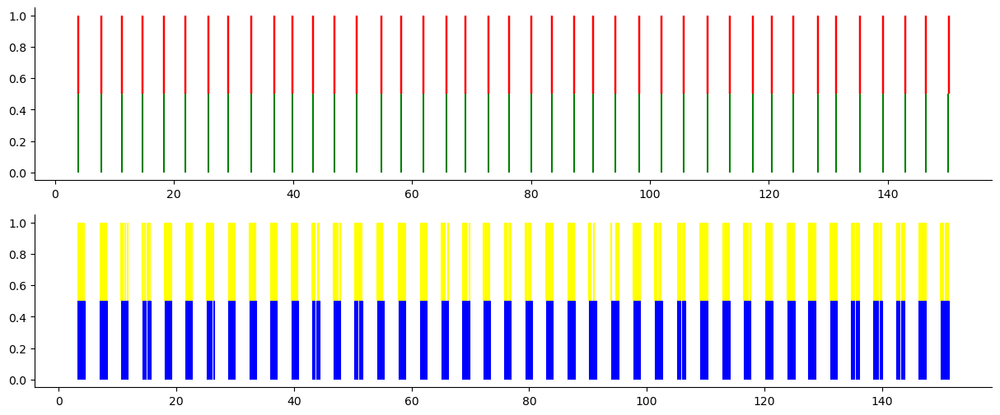

NAN percentage: 4%
8


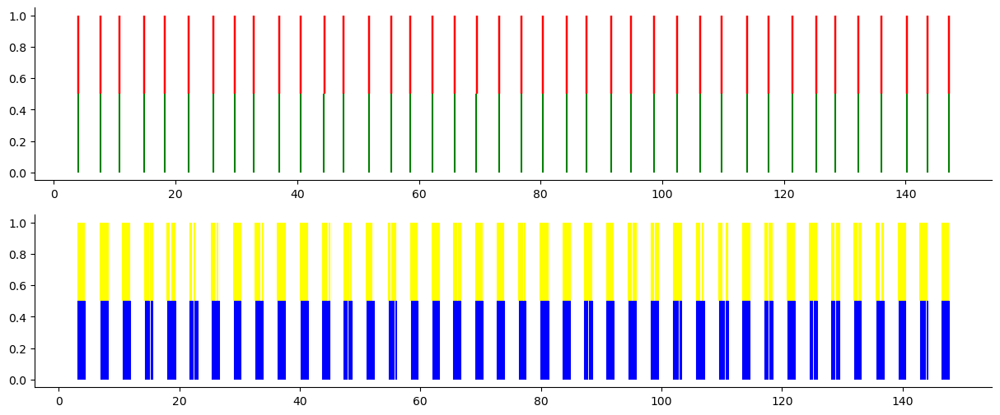

NAN percentage: 4%
9


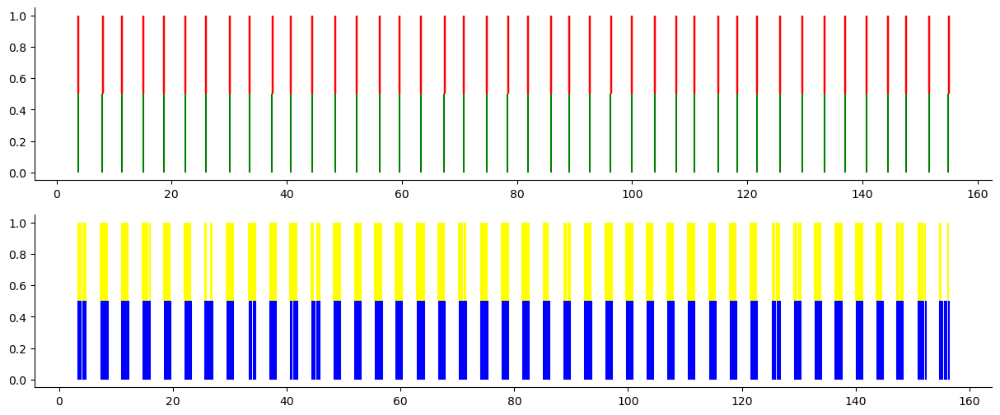

NAN percentage: 4%
10


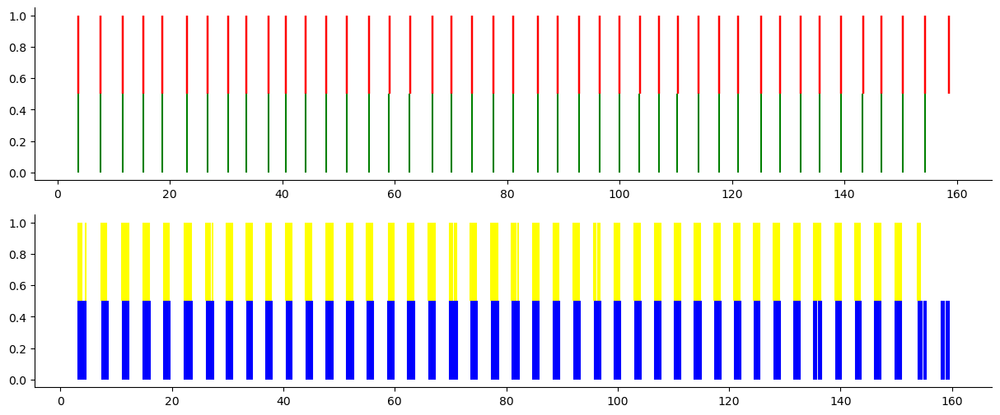

NAN percentage: 4%
P12 A2
2


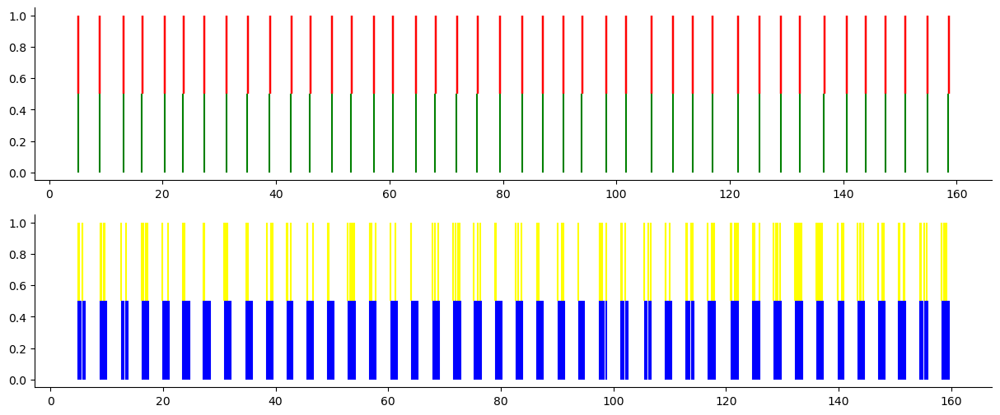

NAN percentage: 28%
3


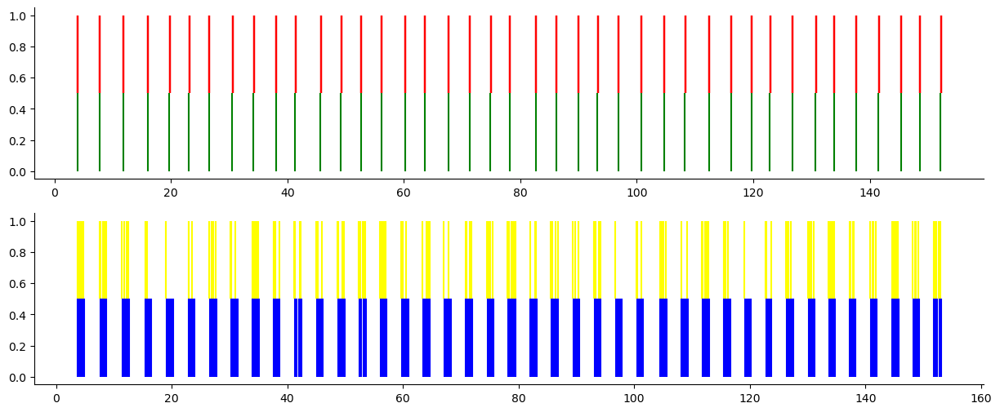

NAN percentage: 28%
4


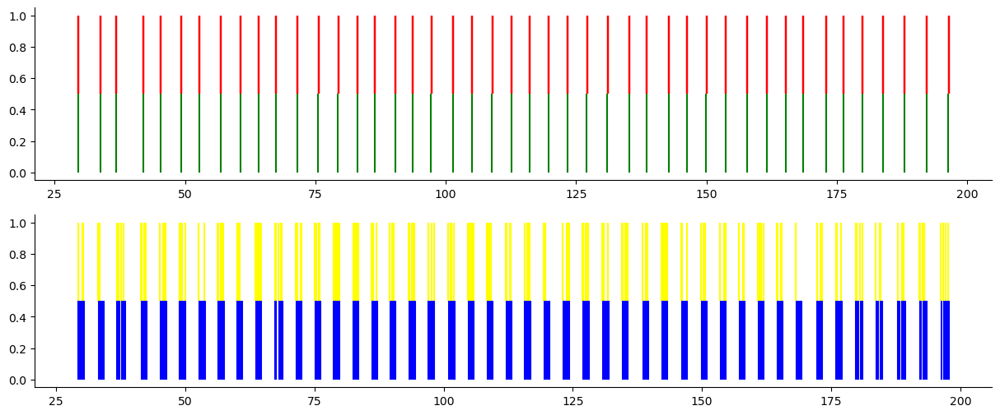

NAN percentage: 28%
5


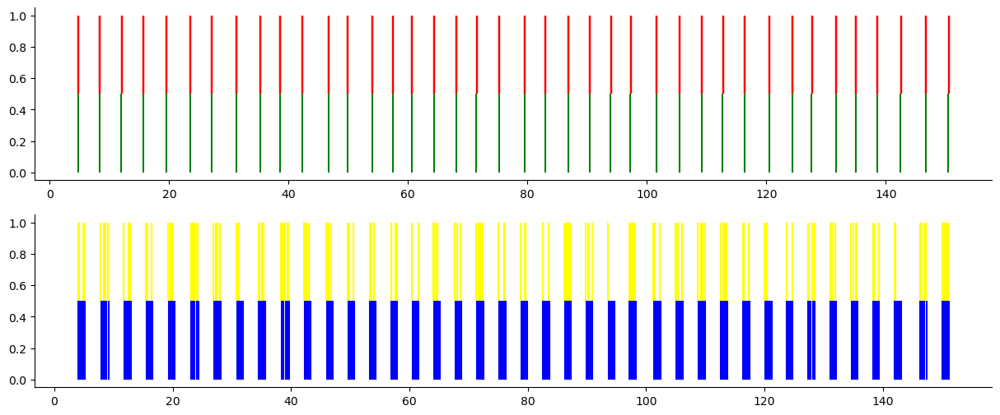

NAN percentage: 28%
6


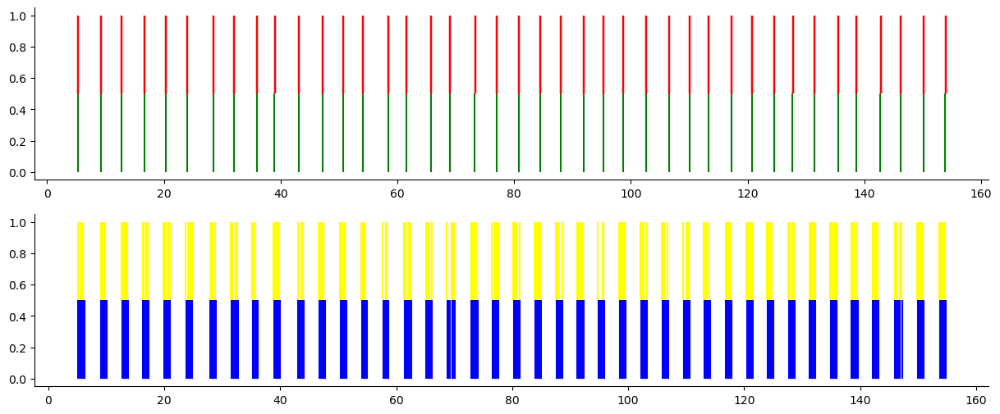

NAN percentage: 28%
7


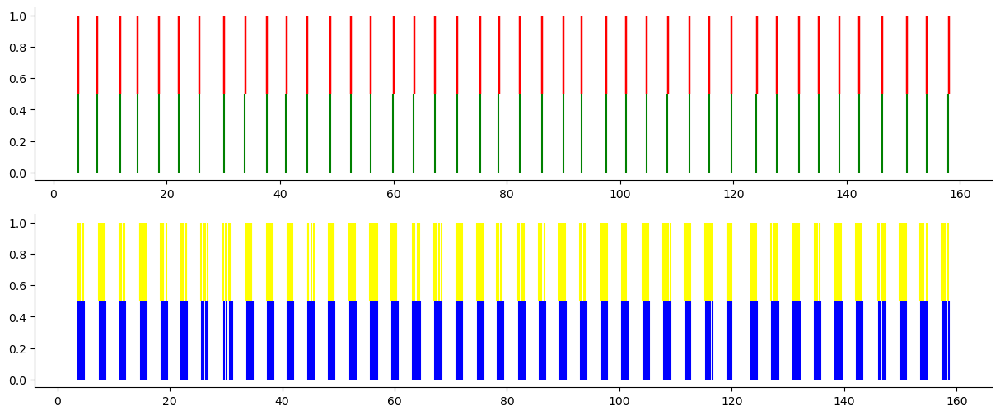

NAN percentage: 28%
8


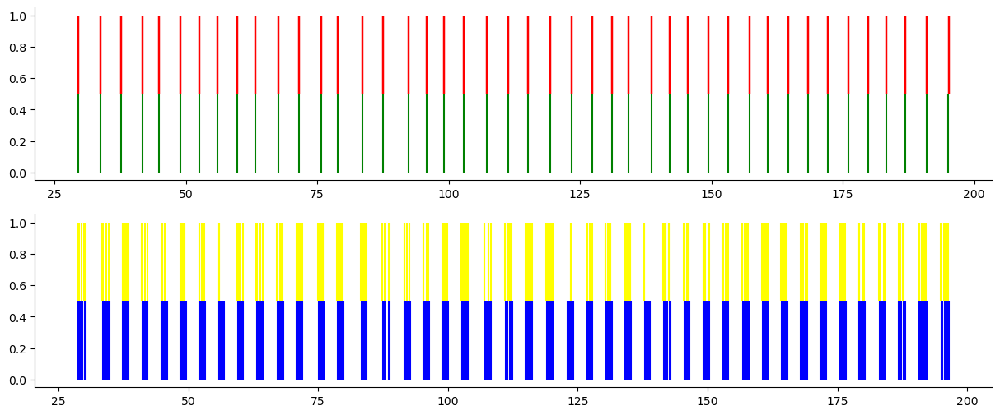

NAN percentage: 28%
9


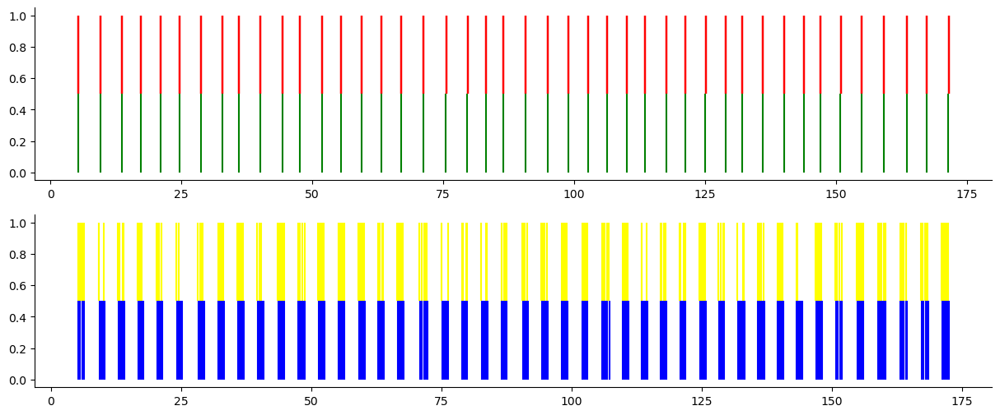

NAN percentage: 28%
10


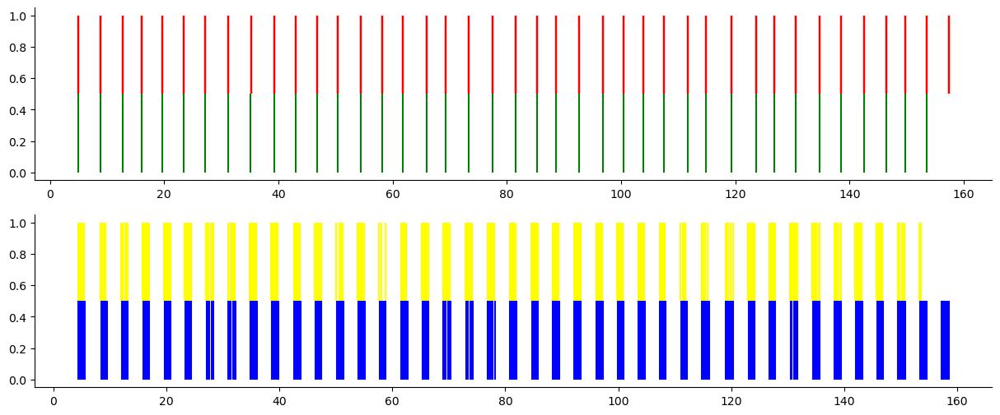

NAN percentage: 28%
P13 A1
1


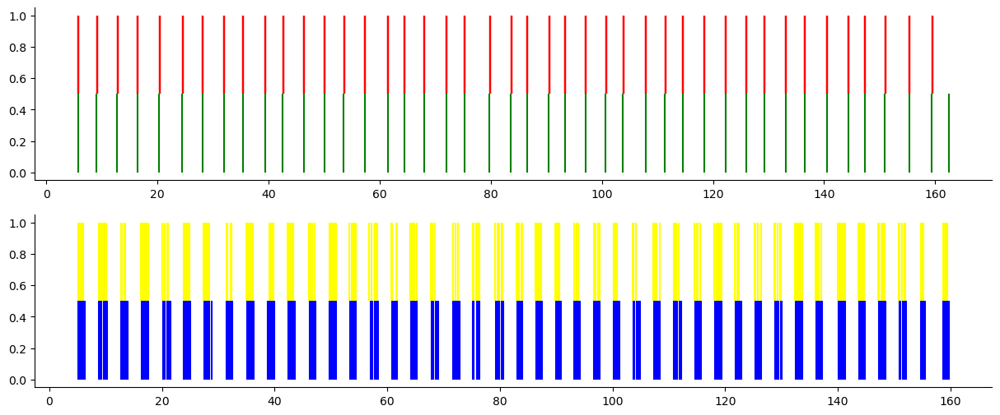

NAN percentage: 11%
2


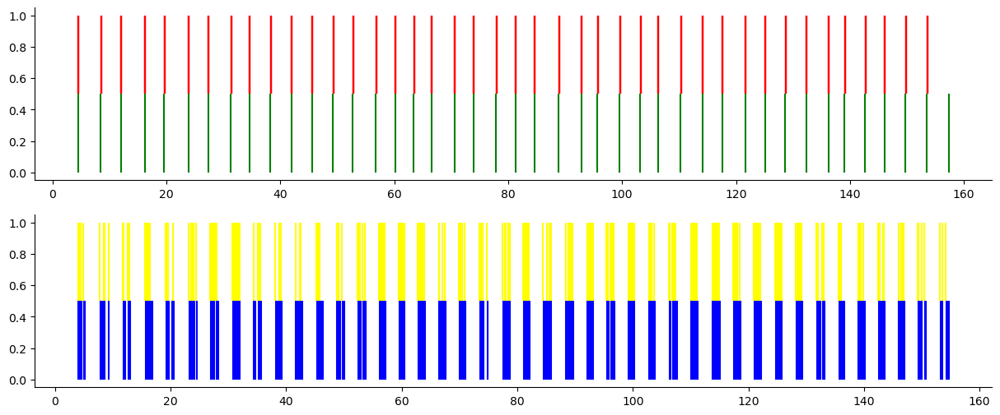

NAN percentage: 11%
3


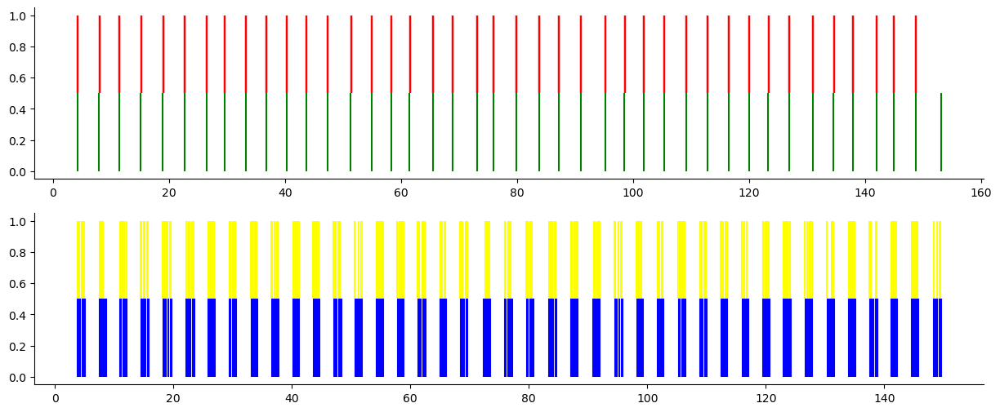

NAN percentage: 11%
4


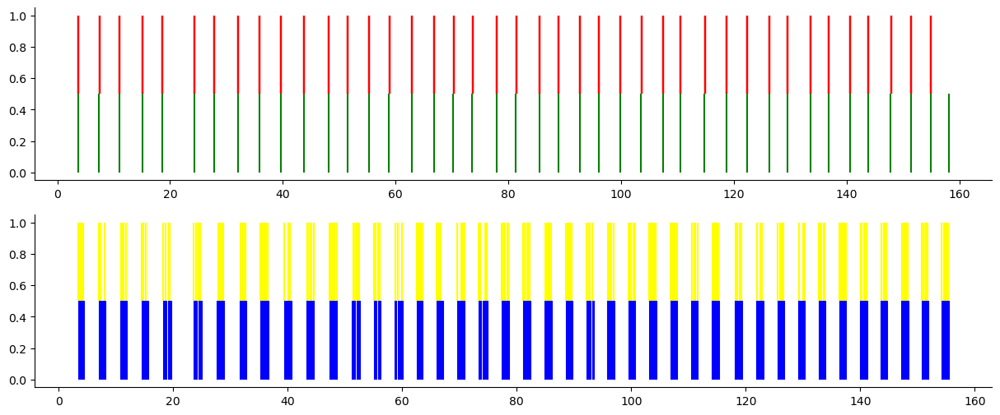

NAN percentage: 11%
5


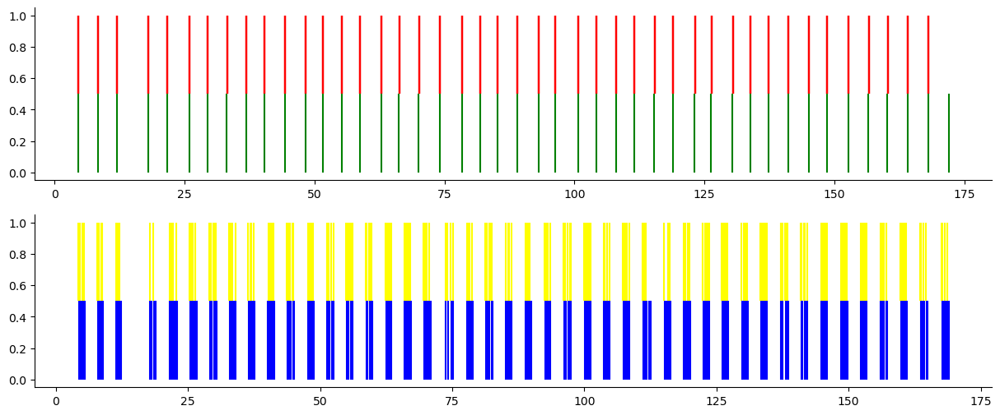

NAN percentage: 11%
6


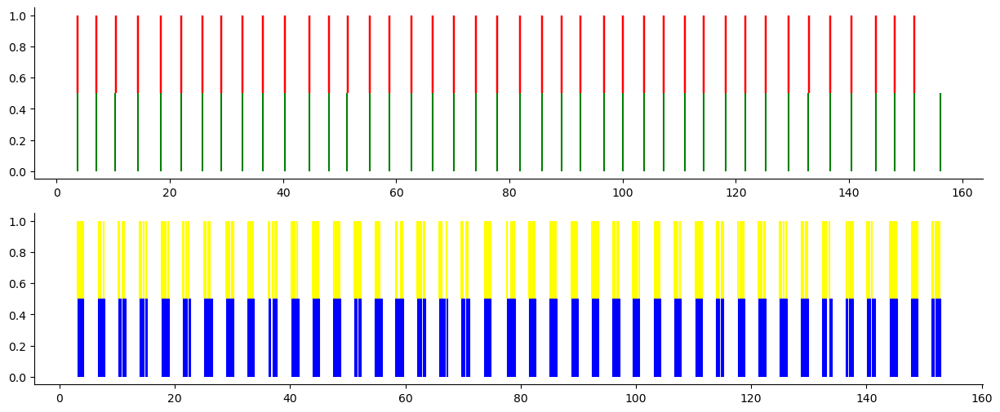

NAN percentage: 11%
7


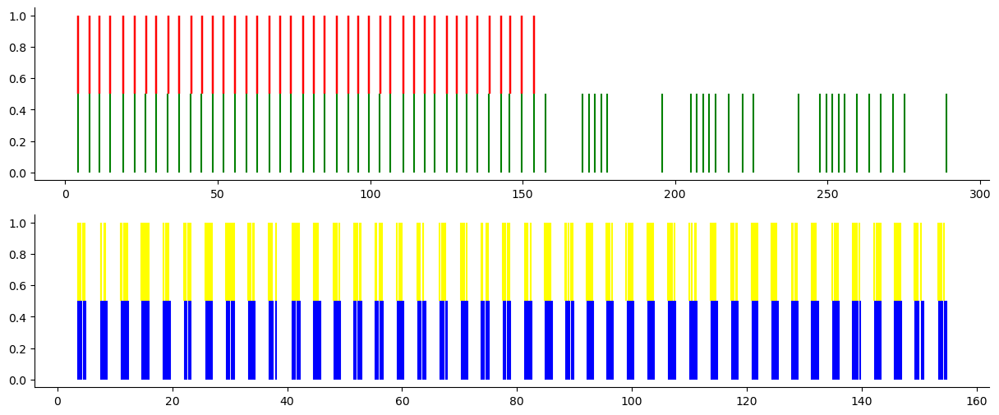

NAN percentage: 11%
8


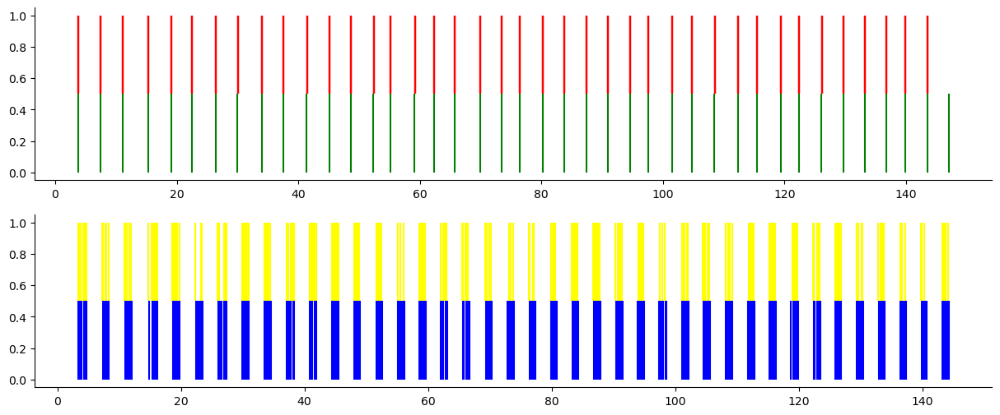

NAN percentage: 11%
9


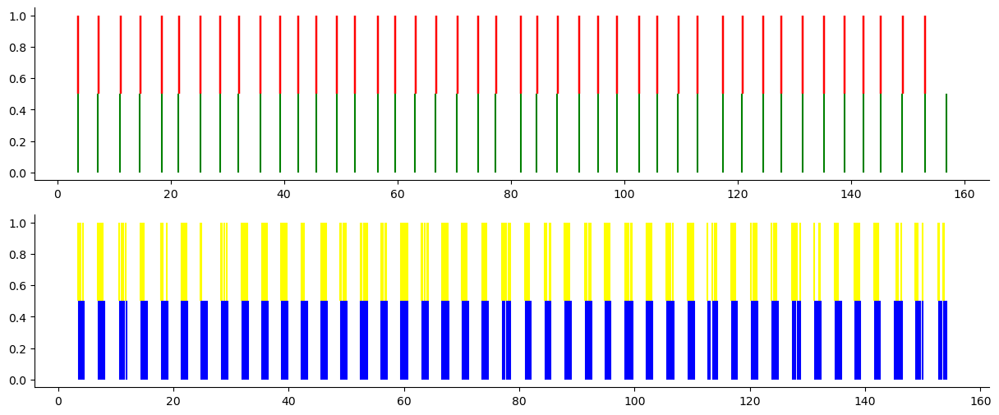

NAN percentage: 11%
10


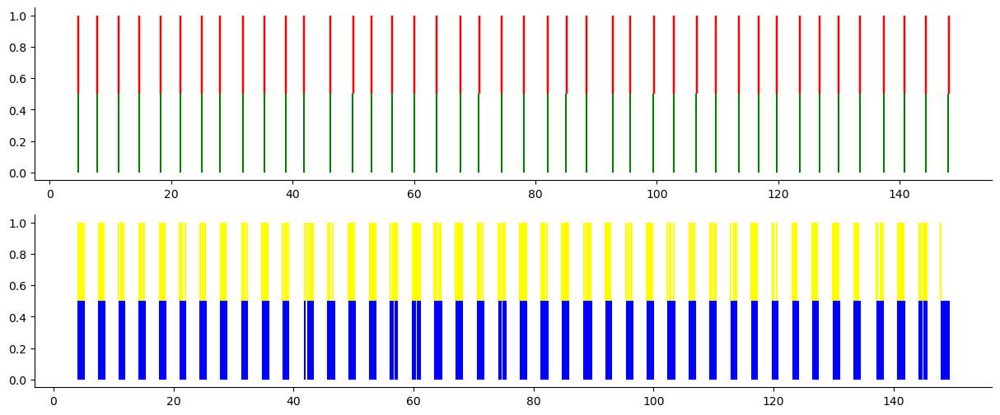

NAN percentage: 11%
P13 A2
1


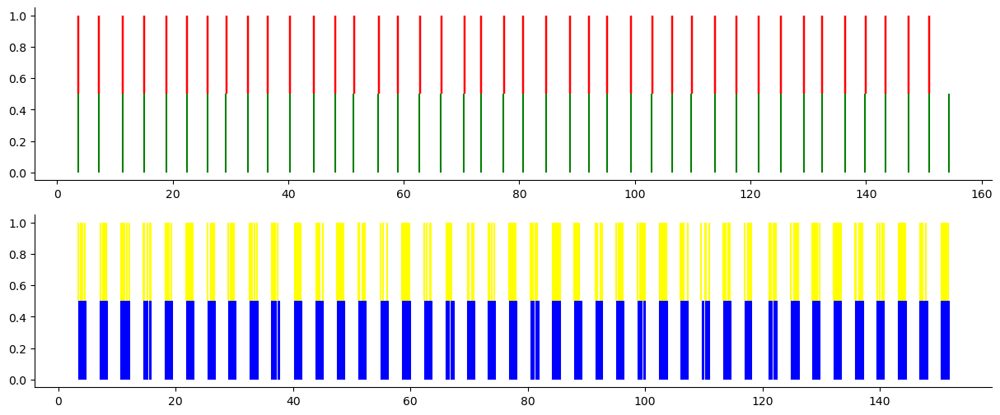

NAN percentage: 8%
2


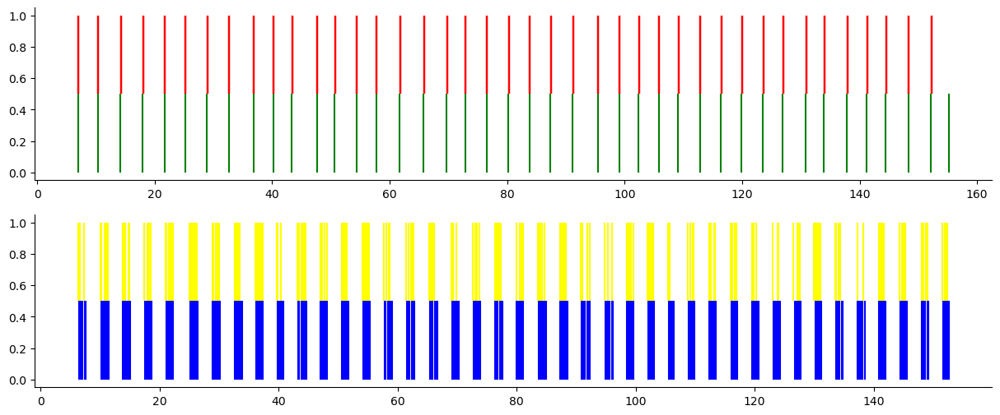

NAN percentage: 8%
3


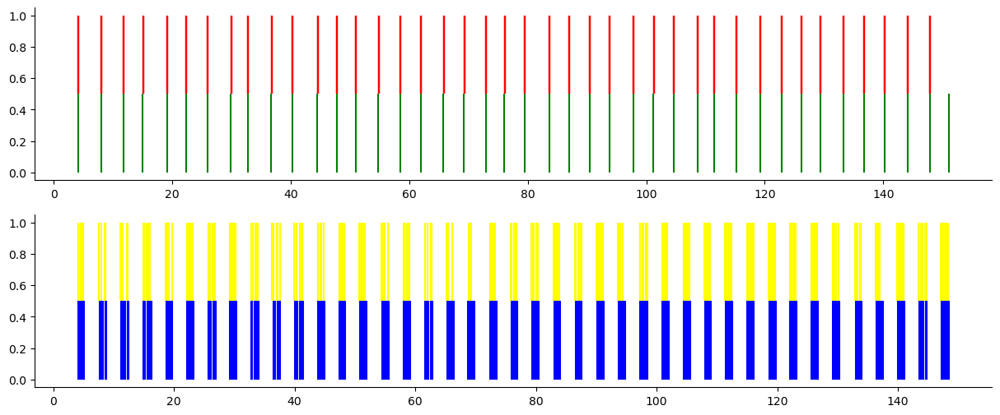

NAN percentage: 8%
4


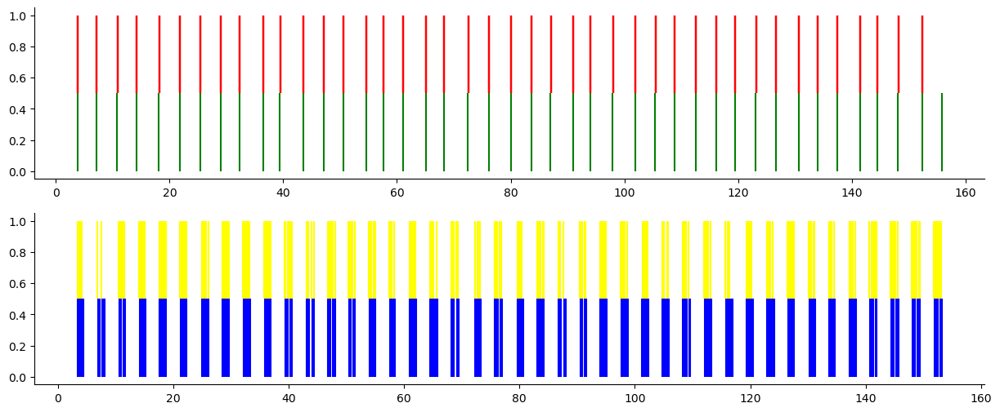

NAN percentage: 8%
5


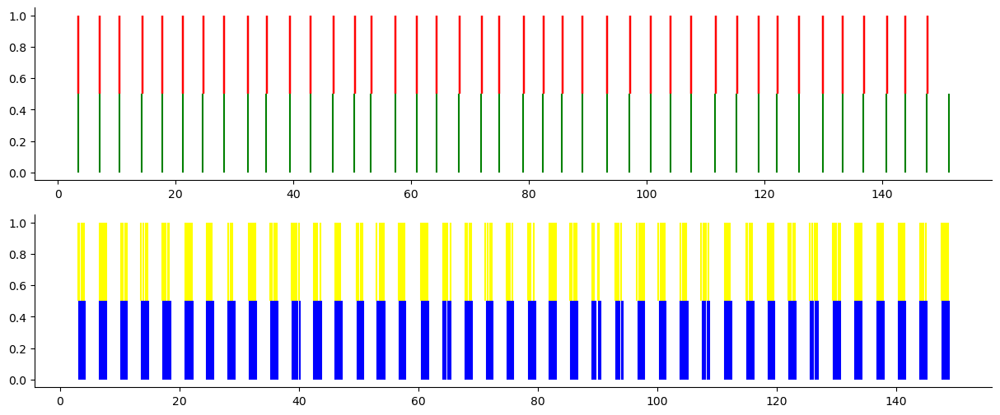

NAN percentage: 8%
6


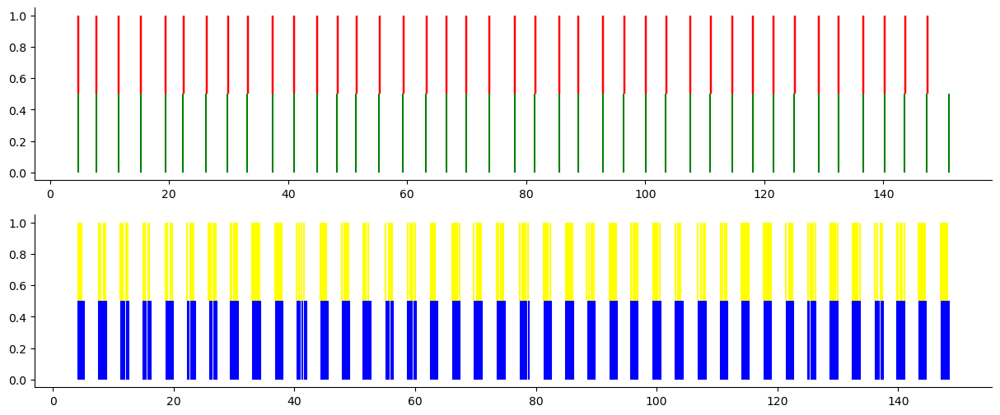

NAN percentage: 8%
7


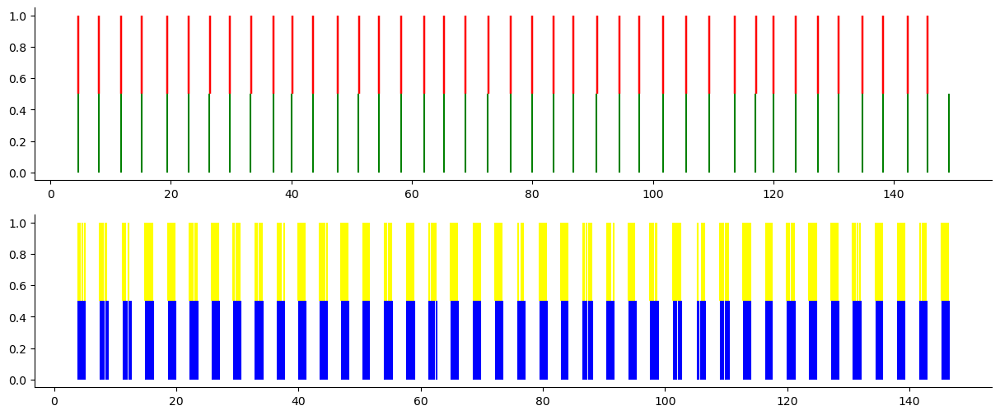

NAN percentage: 8%
8


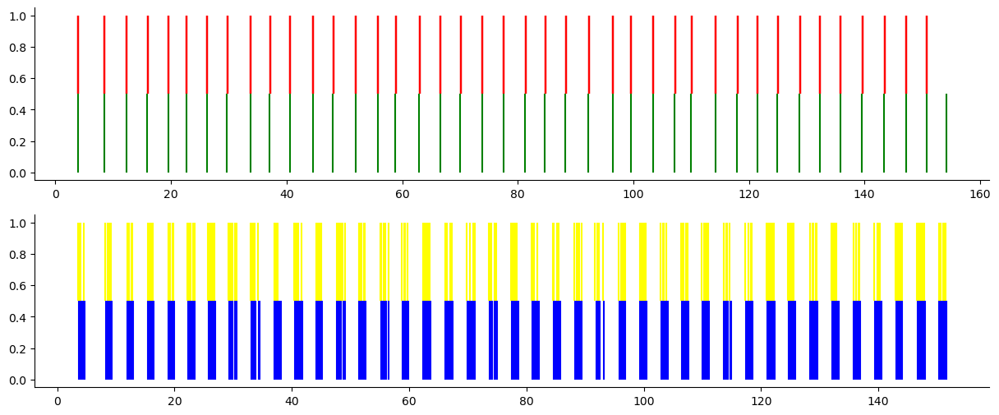

NAN percentage: 8%
9


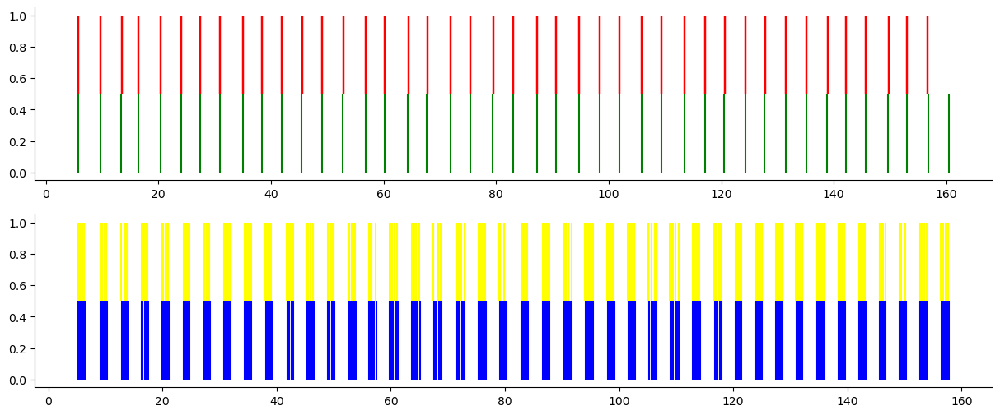

NAN percentage: 8%
10


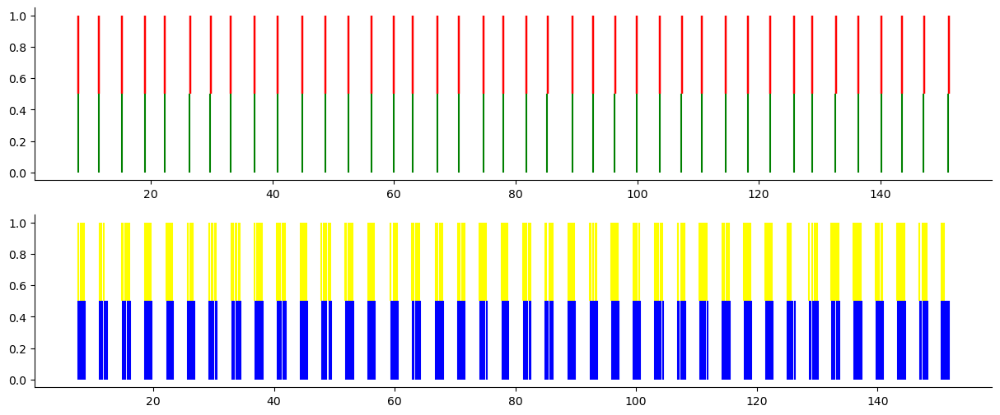

NAN percentage: 8%
P14 A1
1


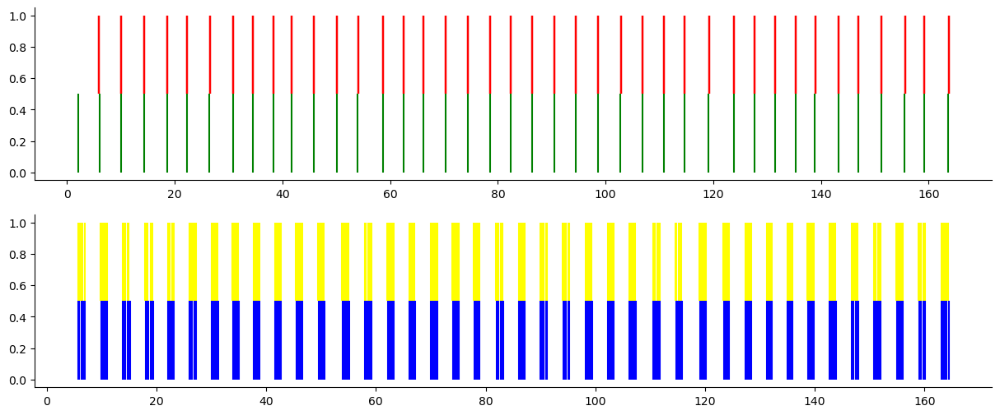

NAN percentage: 5%
2


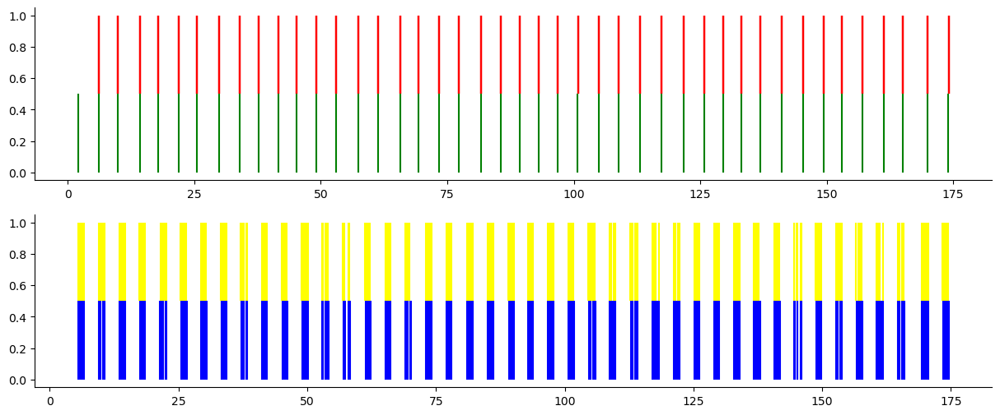

NAN percentage: 5%
3


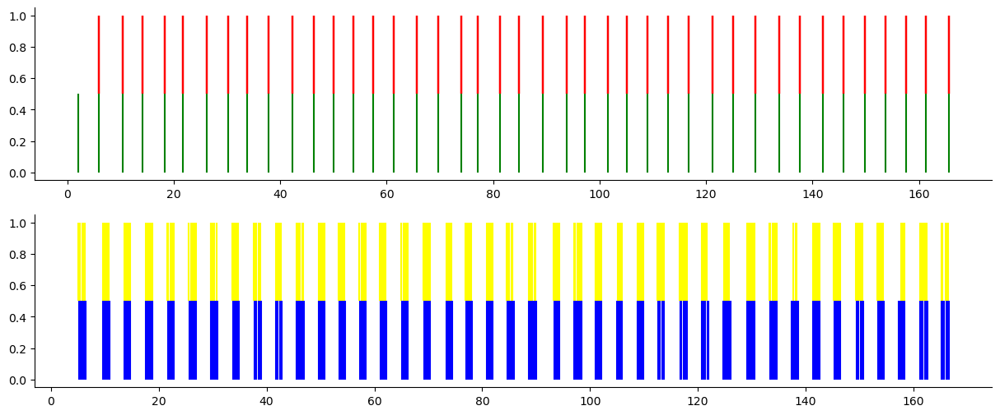

NAN percentage: 5%
4


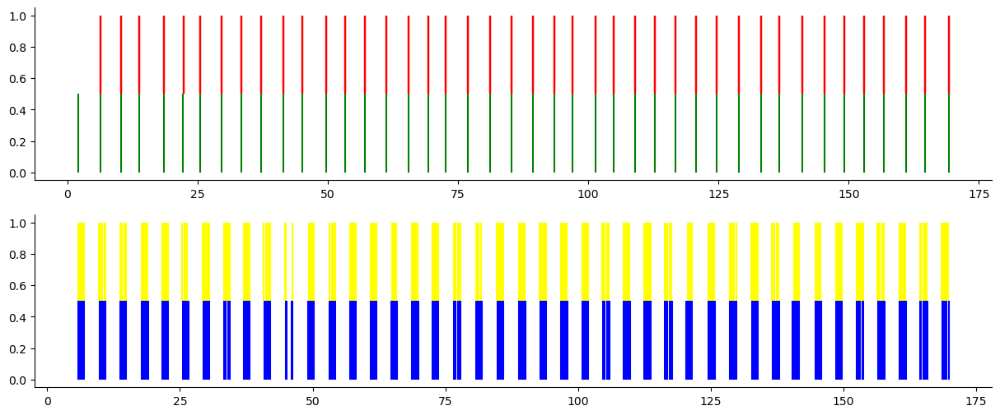

NAN percentage: 5%
5


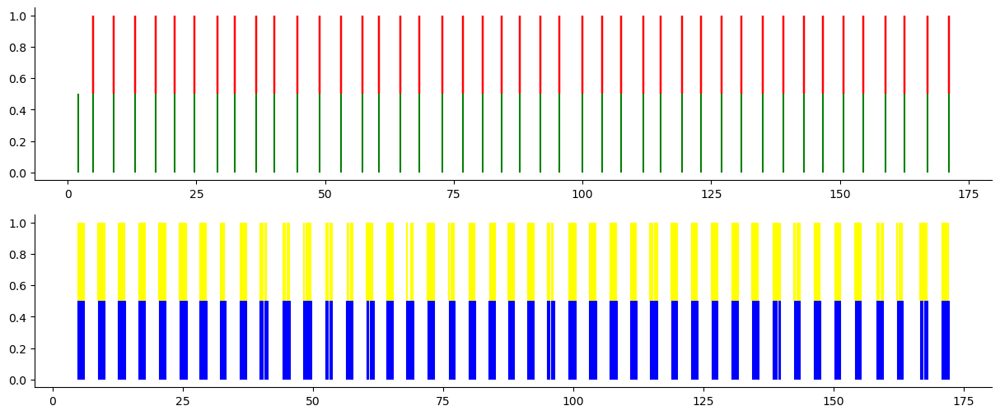

NAN percentage: 5%
6


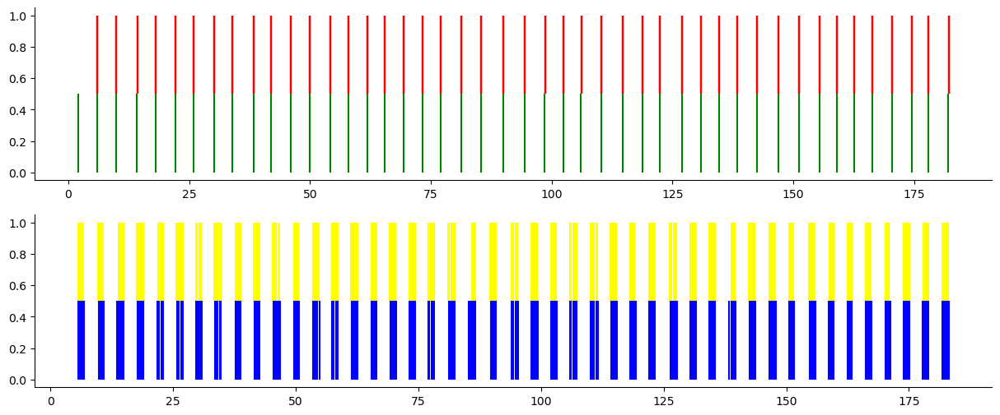

NAN percentage: 5%
7


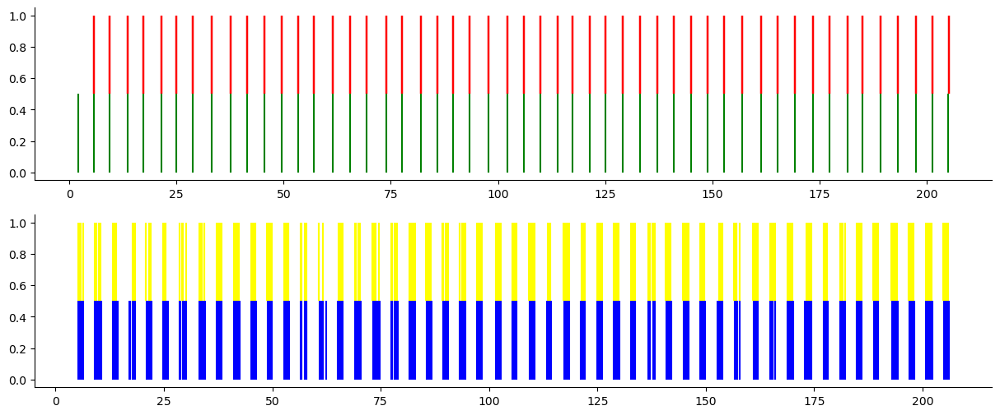

NAN percentage: 5%
8


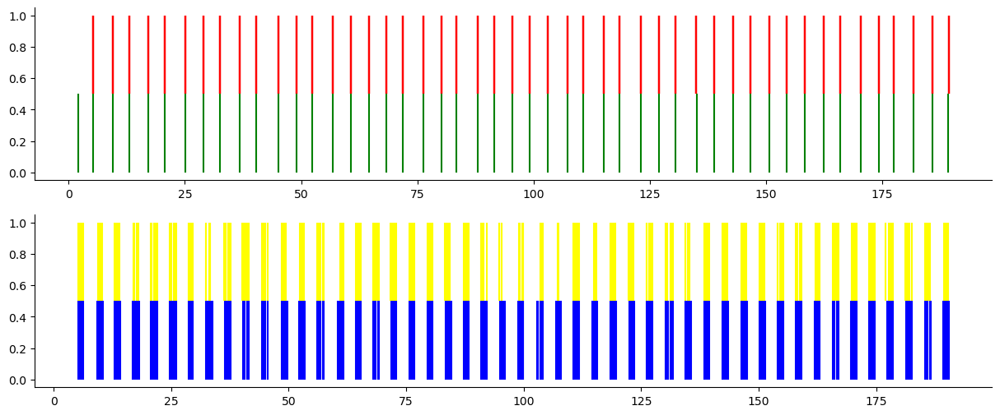

NAN percentage: 5%
9


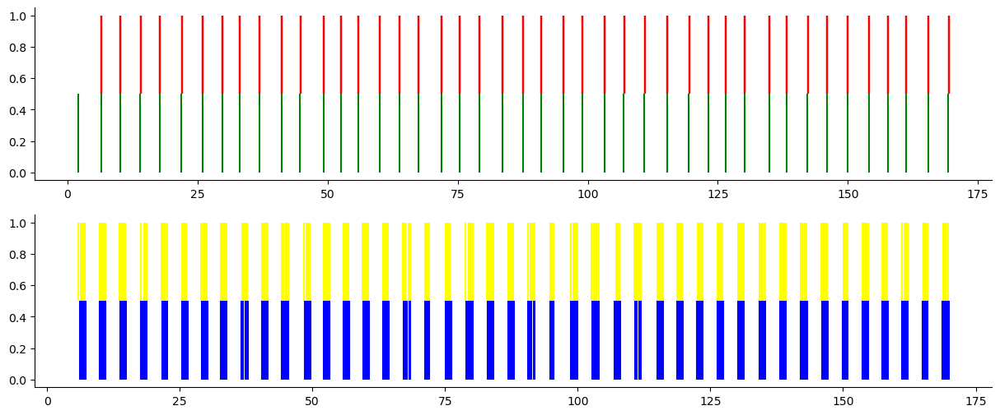

NAN percentage: 5%
10


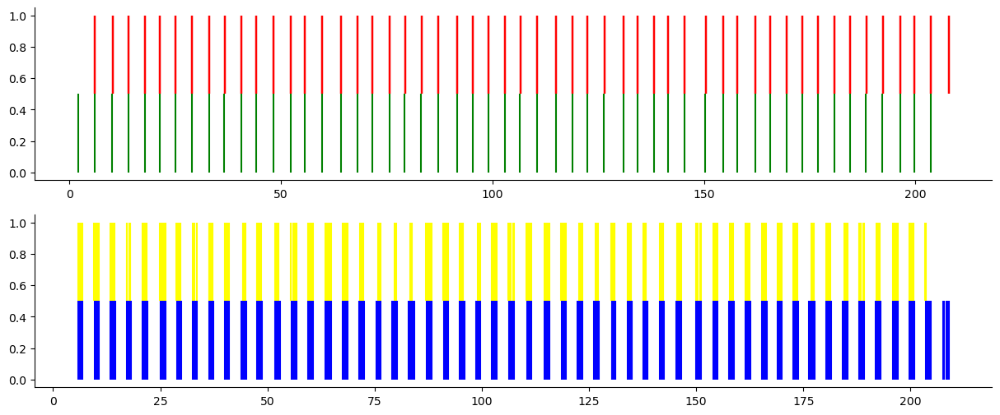

NAN percentage: 5%
P14 A2
1


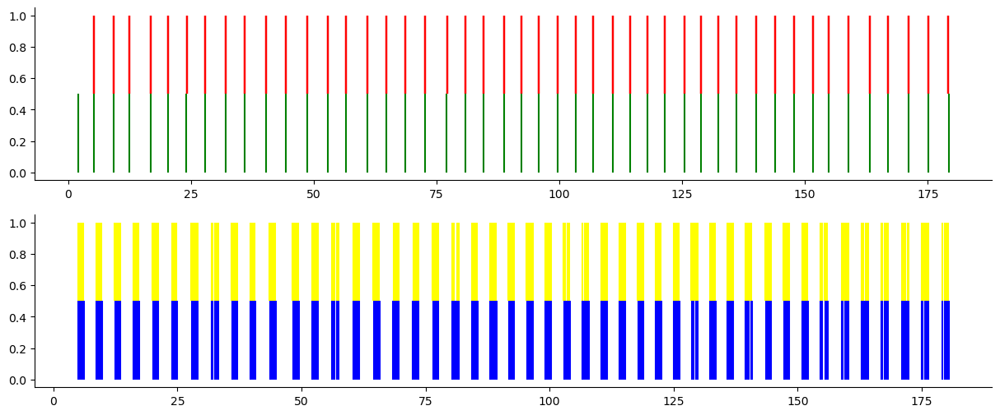

NAN percentage: 2%
2


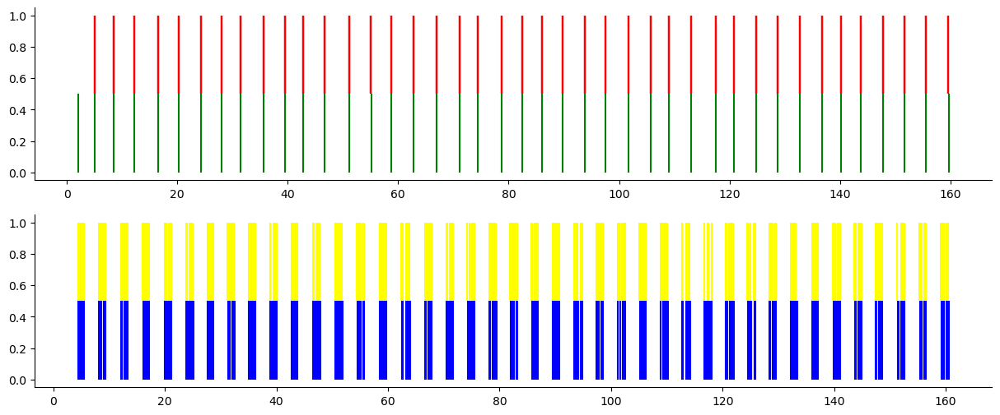

NAN percentage: 2%
3


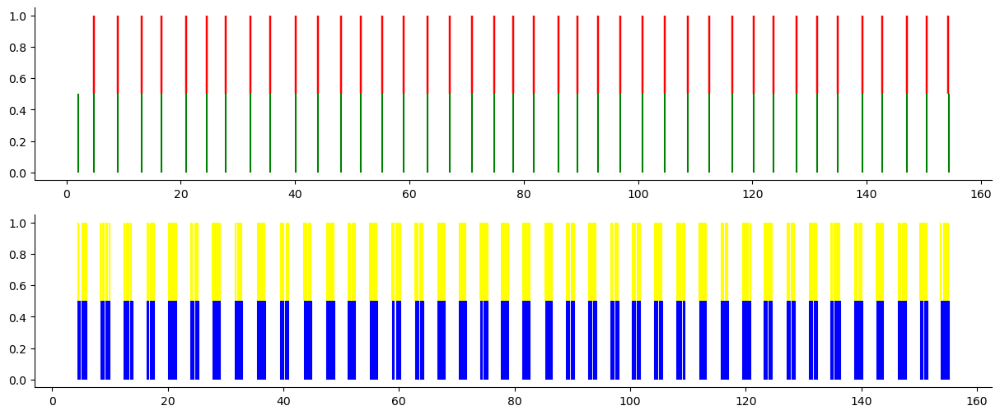

NAN percentage: 2%
4


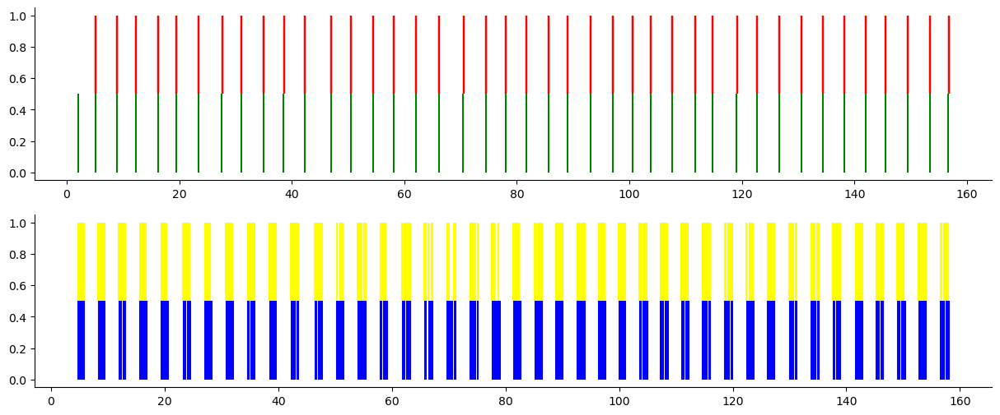

NAN percentage: 2%
5


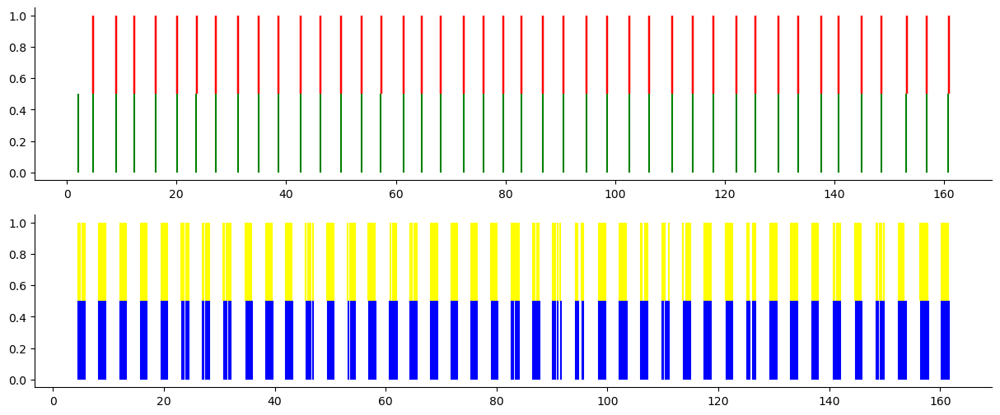

NAN percentage: 2%
6


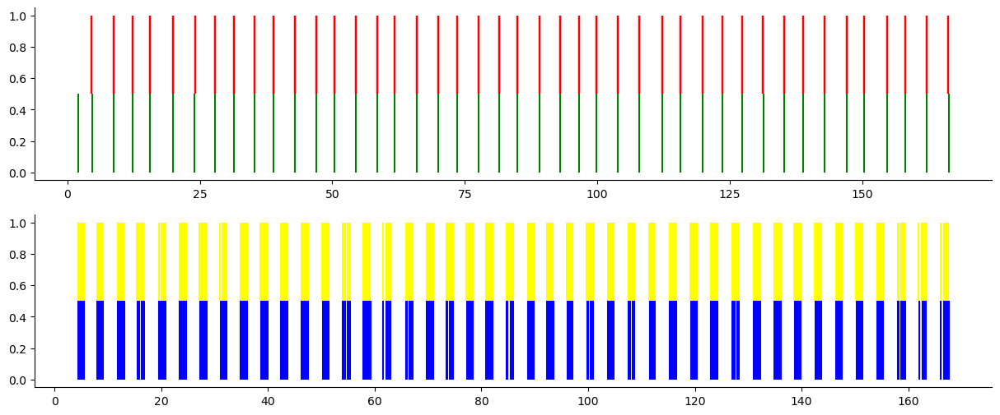

NAN percentage: 2%
7


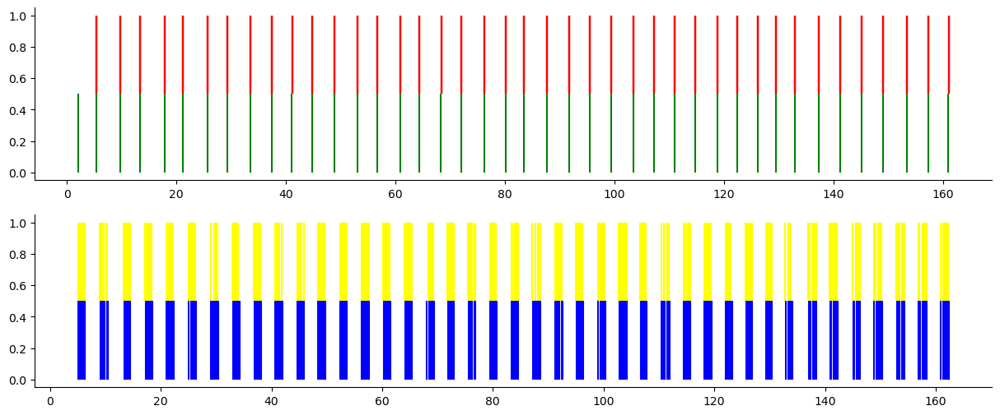

NAN percentage: 2%
8


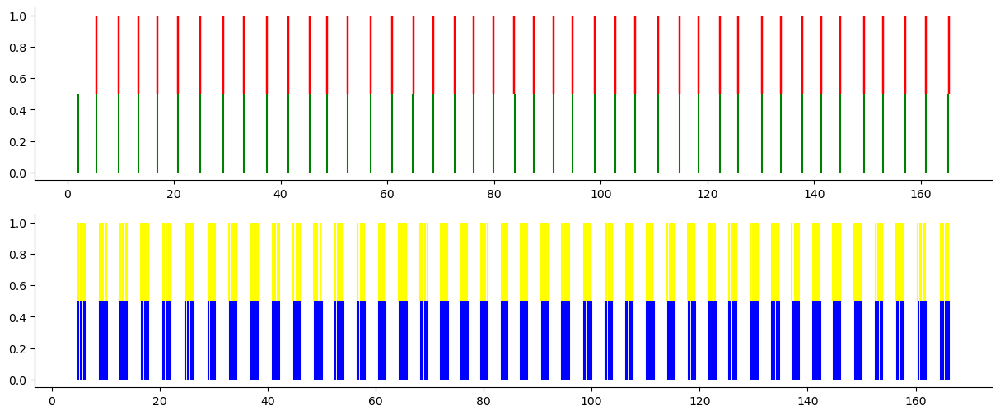

NAN percentage: 2%
9


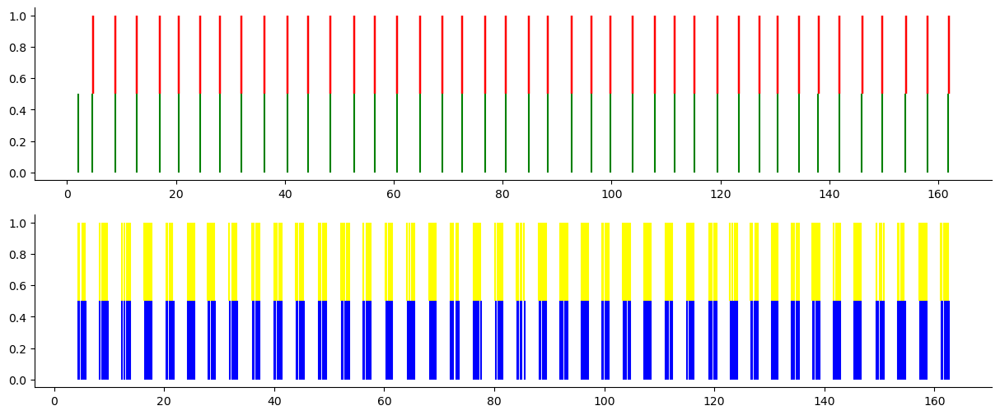

NAN percentage: 2%
10


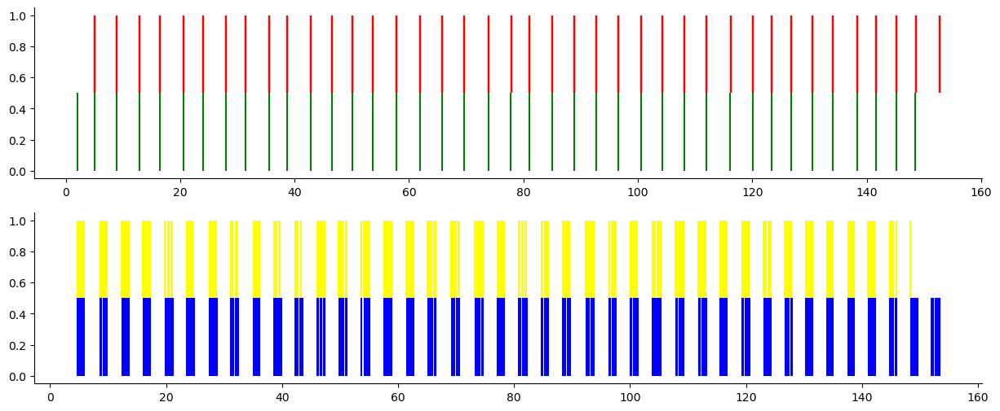

NAN percentage: 2%
P15 A1
1


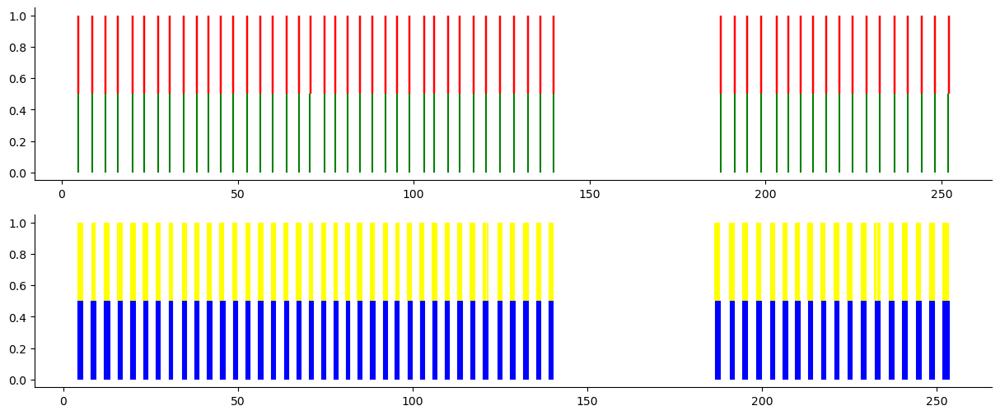

NAN percentage: 14%
2


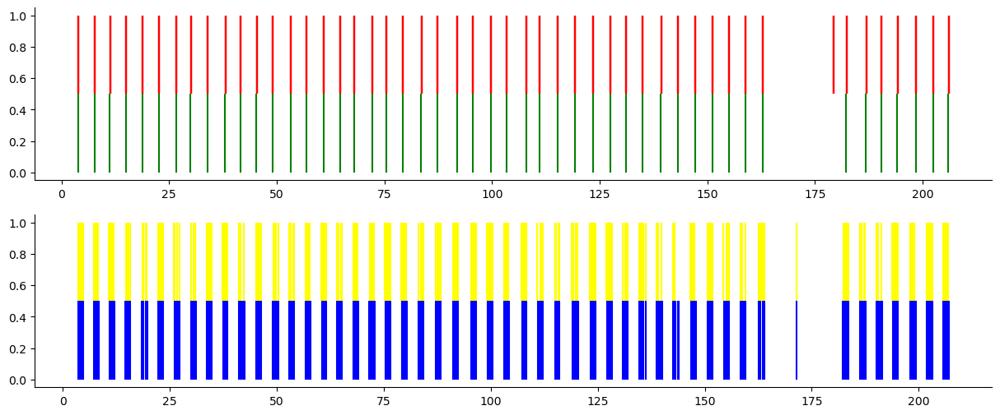

NAN percentage: 14%
3


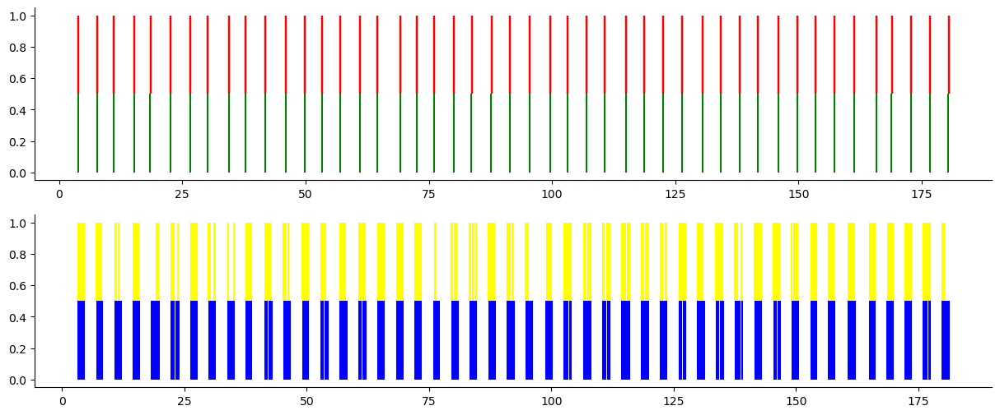

NAN percentage: 14%
4


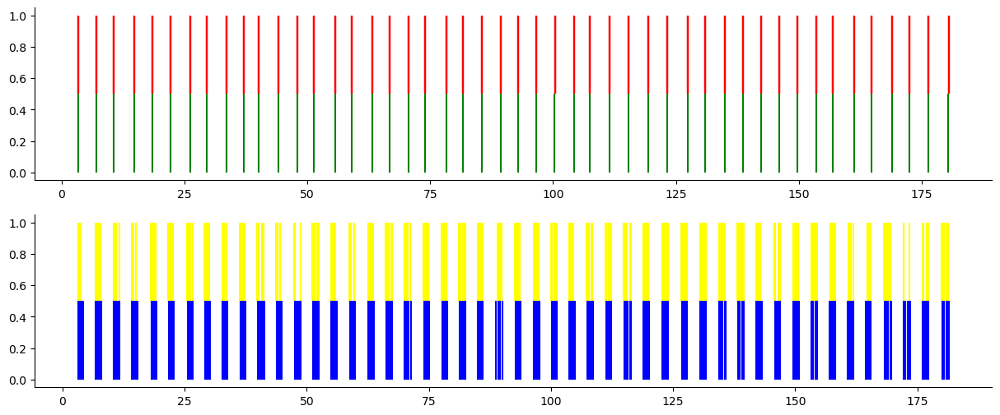

NAN percentage: 14%
5


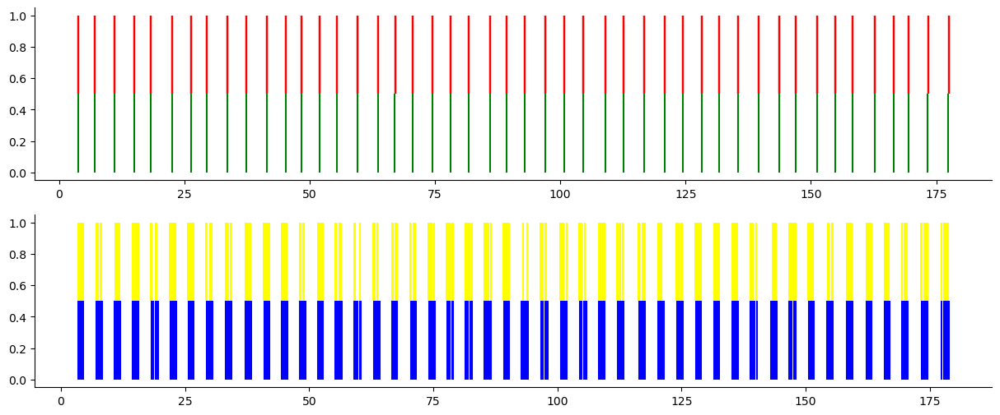

NAN percentage: 14%
6


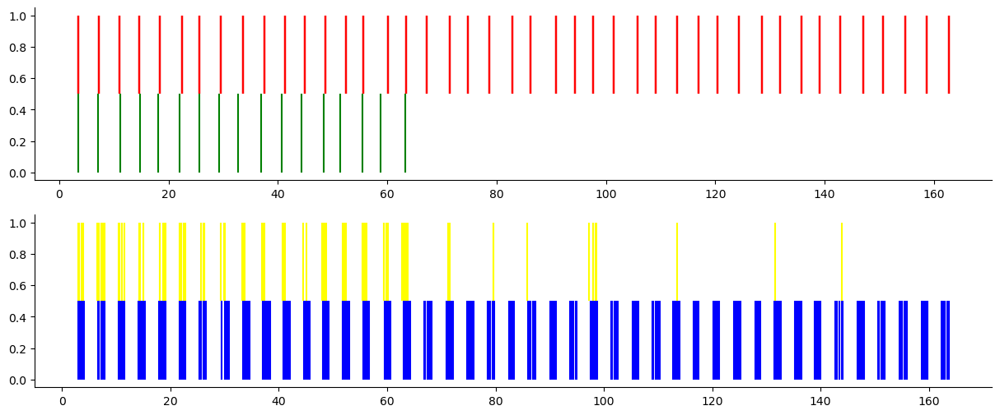

NAN percentage: 14%
7


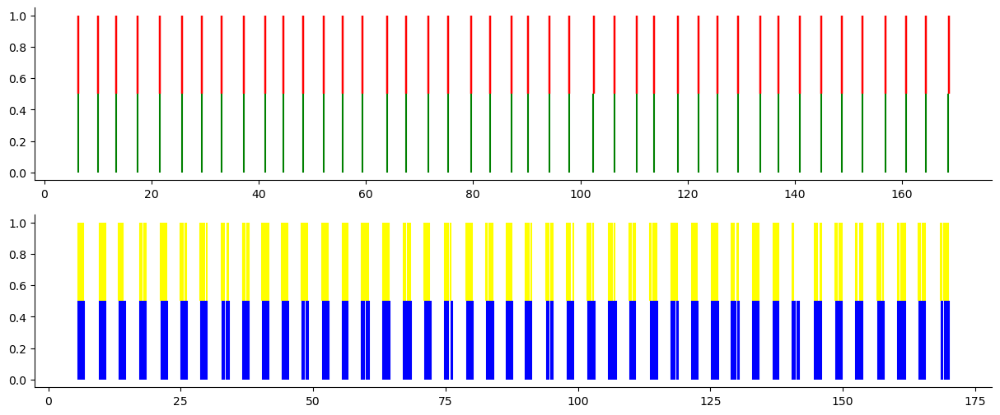

NAN percentage: 14%
8


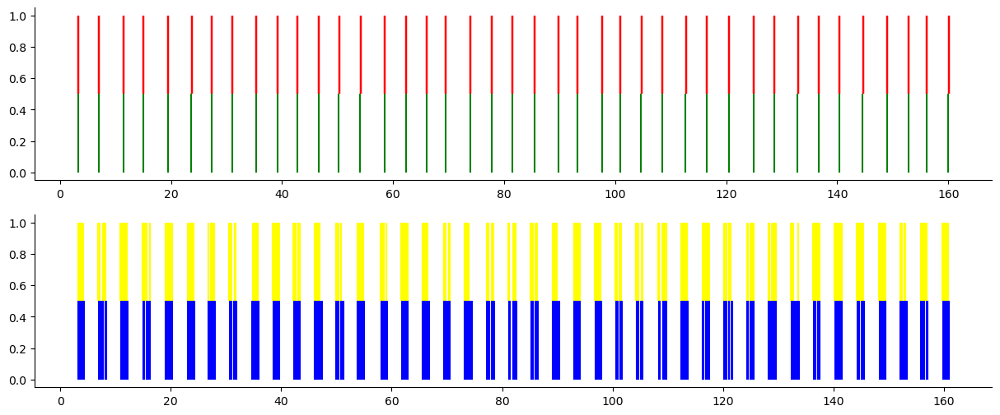

NAN percentage: 14%
9


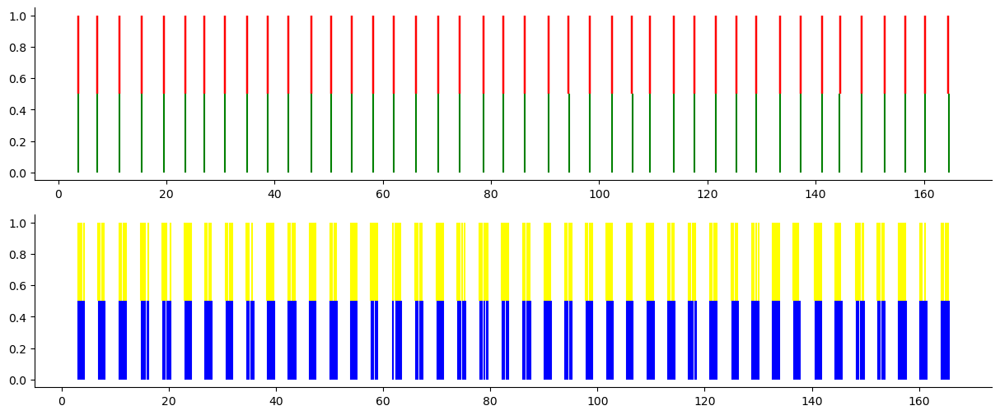

NAN percentage: 14%
10


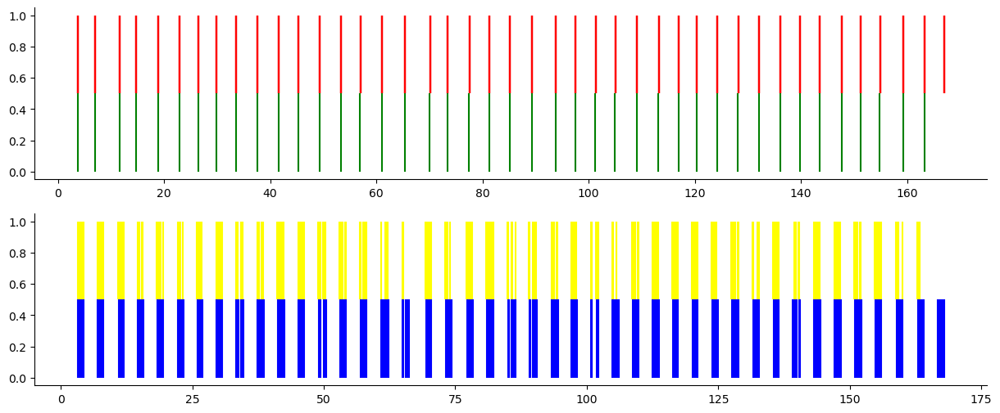

NAN percentage: 14%
P15 A2
2
P15, A2, 2, is unparsable.
NAN percentage: 100%
3
P15, A2, 3, is unparsable.
NAN percentage: 100%
4
P15, A2, 4, is unparsable.
NAN percentage: 100%
5
P15, A2, 5, is unparsable.
NAN percentage: 100%
6
P15, A2, 6, is unparsable.
NAN percentage: 100%
7
P15, A2, 7, is unparsable.
NAN percentage: 100%
8
P15, A2, 8, is unparsable.
NAN percentage: 100%
9
P15, A2, 9, is unparsable.
NAN percentage: 100%
10
P15, A2, 10, is unparsable.
NAN percentage: 100%
P16 A1
1


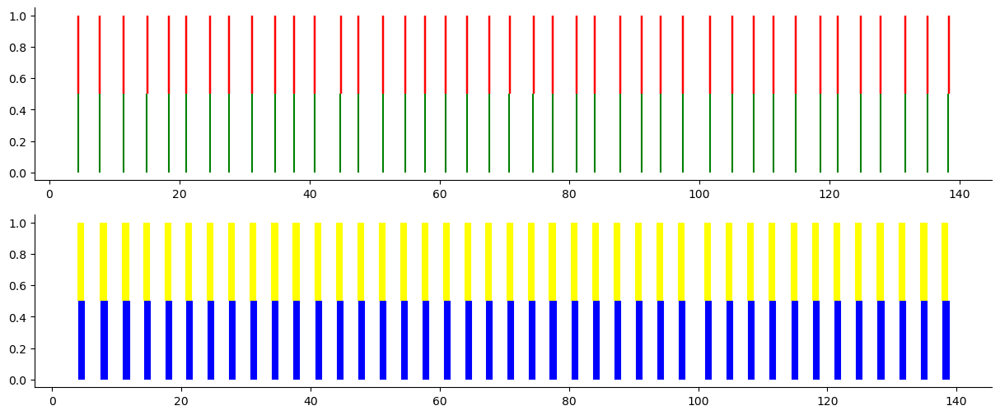

NAN percentage: 0%
2


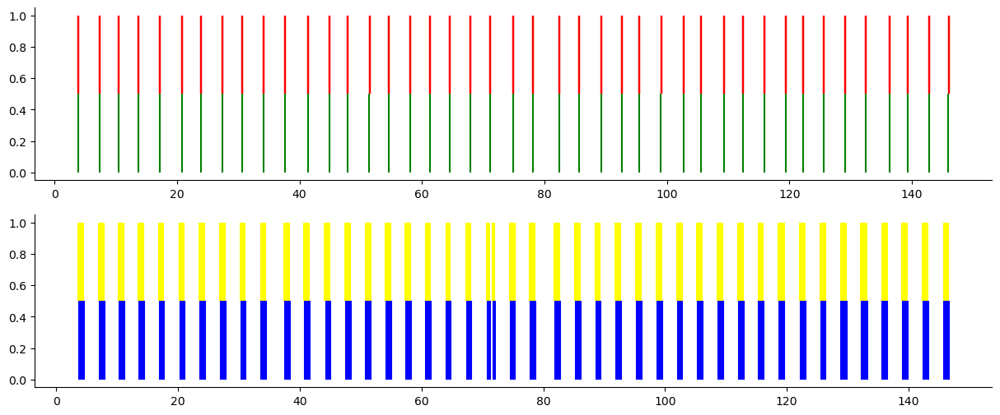

NAN percentage: 0%
3


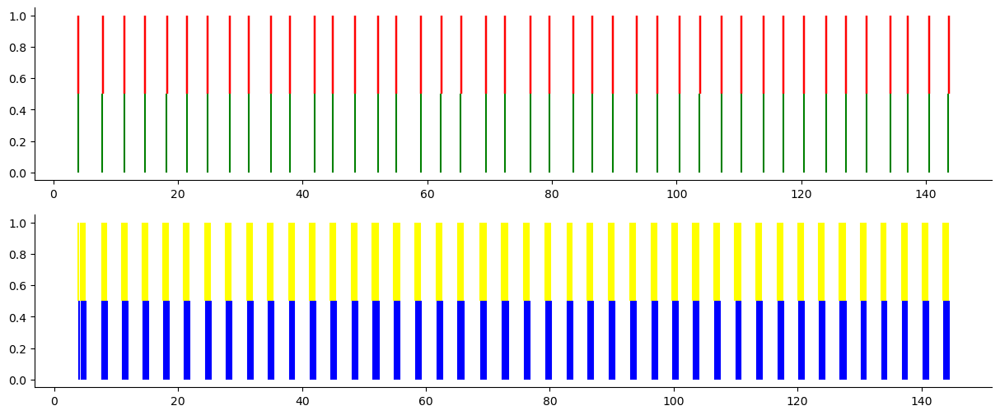

NAN percentage: 0%
4


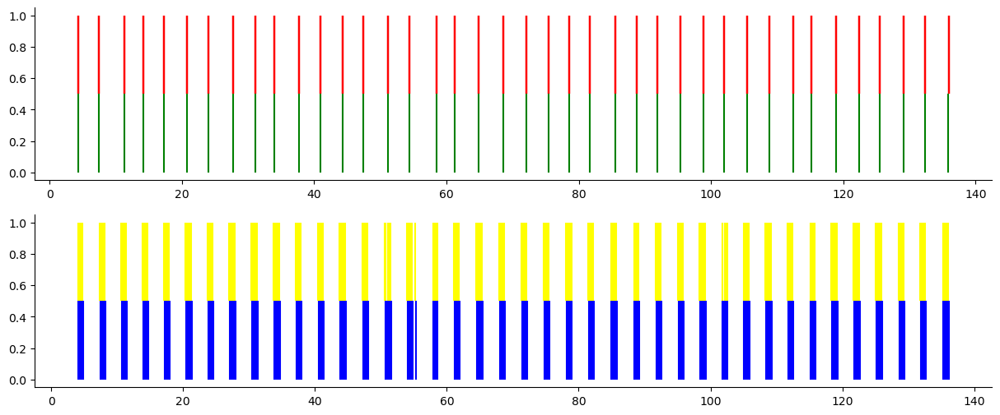

NAN percentage: 0%
5


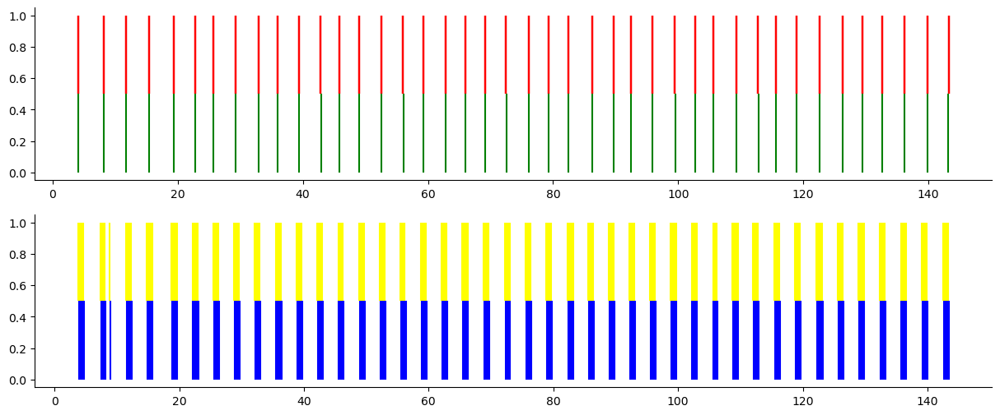

NAN percentage: 0%
6


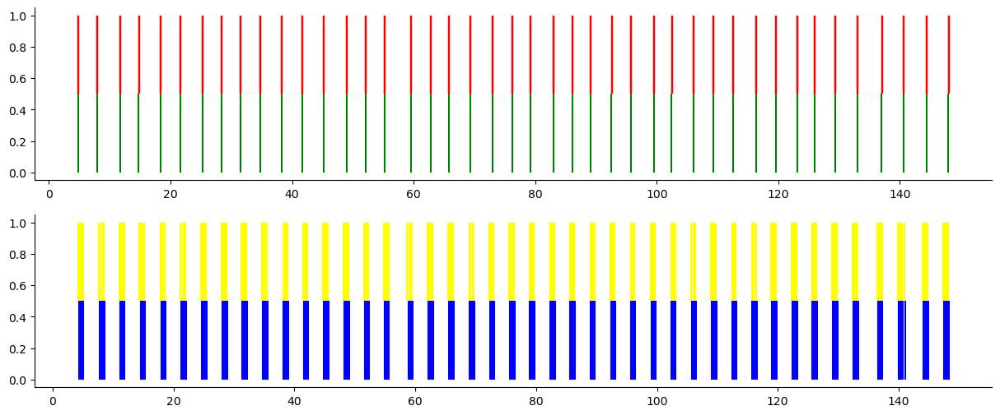

NAN percentage: 0%
7


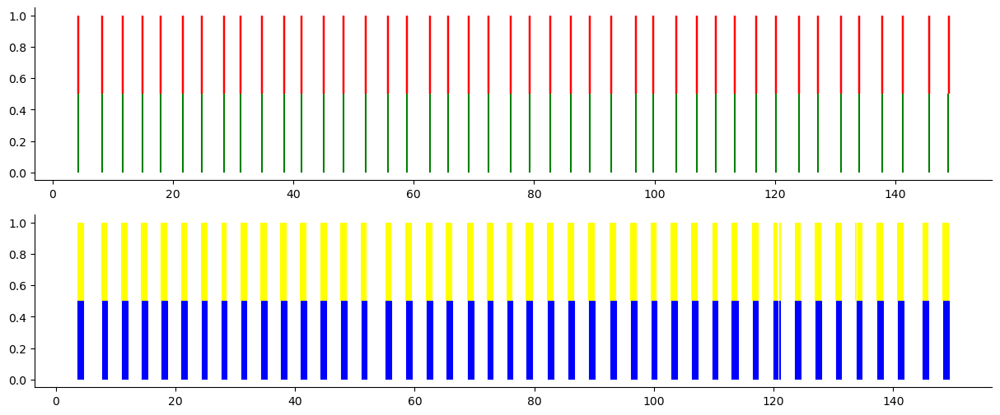

NAN percentage: 0%
8


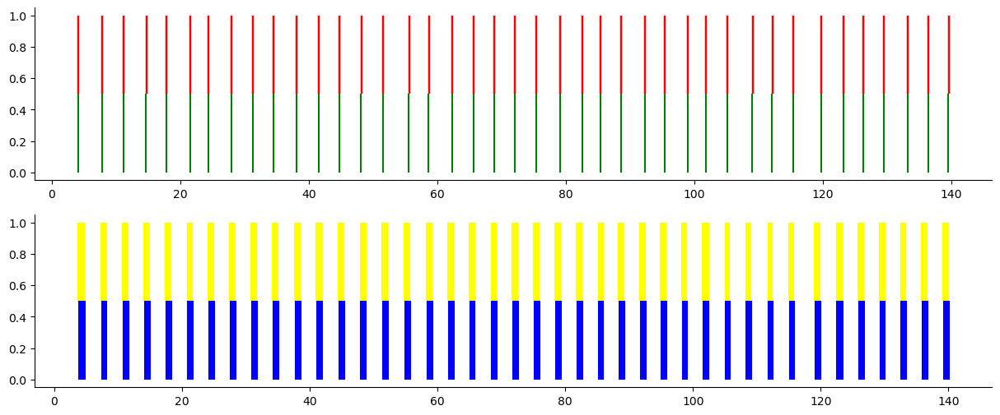

NAN percentage: 0%
9


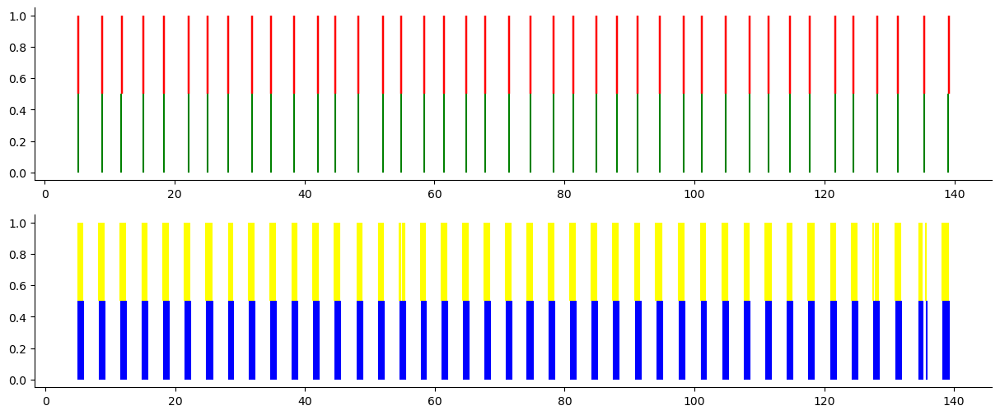

NAN percentage: 0%
10


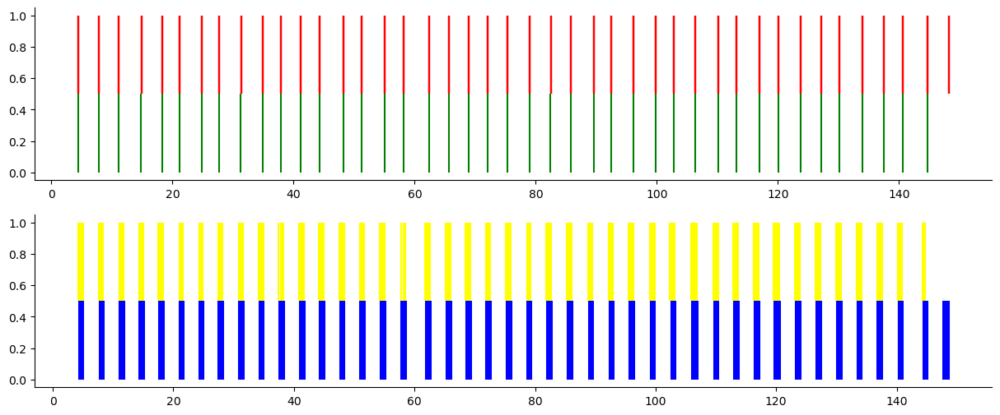

NAN percentage: 0%
P16 A2
1


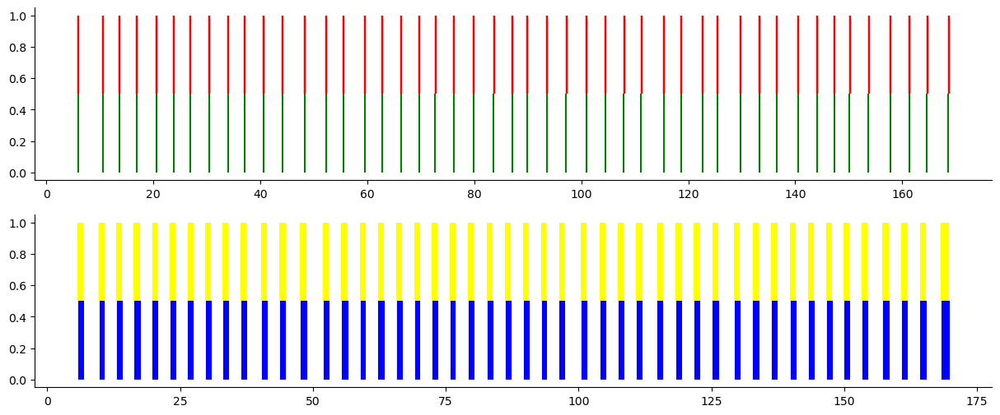

NAN percentage: 1%
2


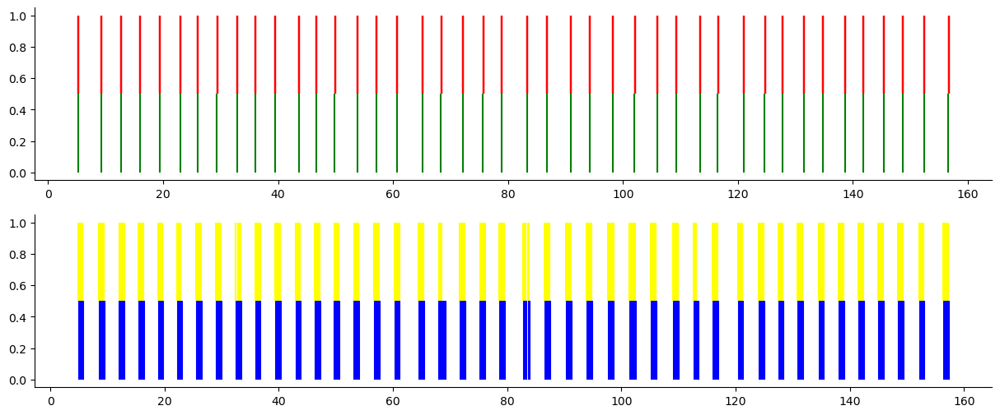

NAN percentage: 1%
3


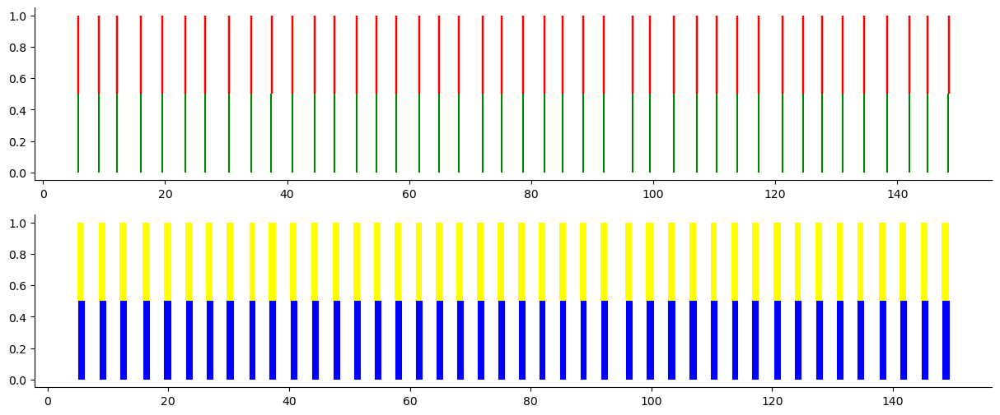

NAN percentage: 1%
4


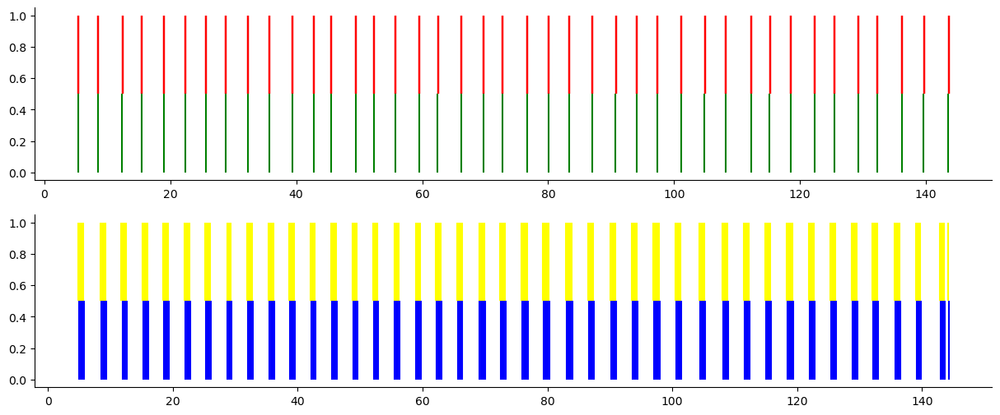

NAN percentage: 1%
5


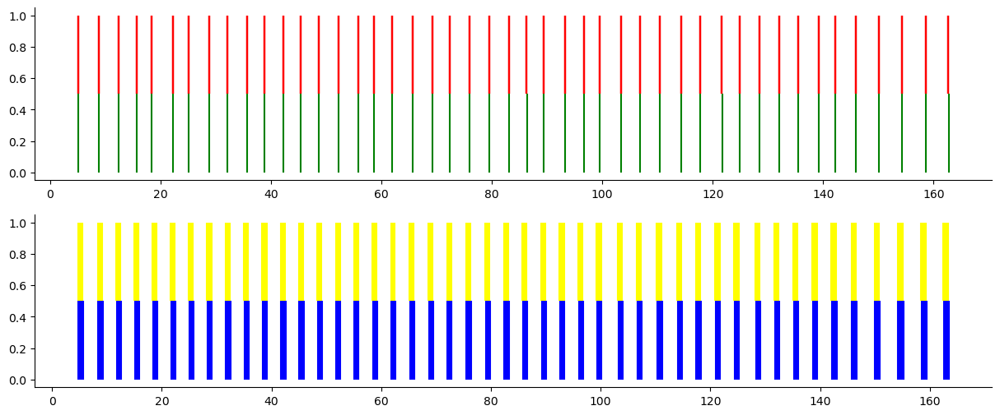

NAN percentage: 1%
6


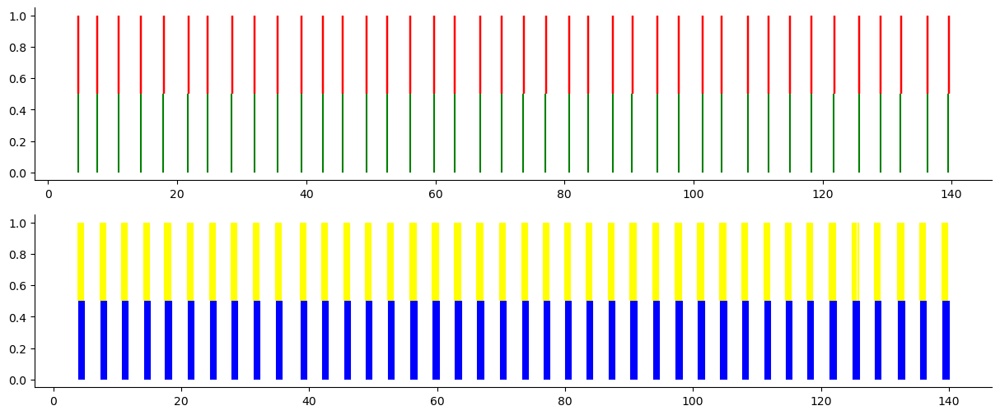

NAN percentage: 1%
7


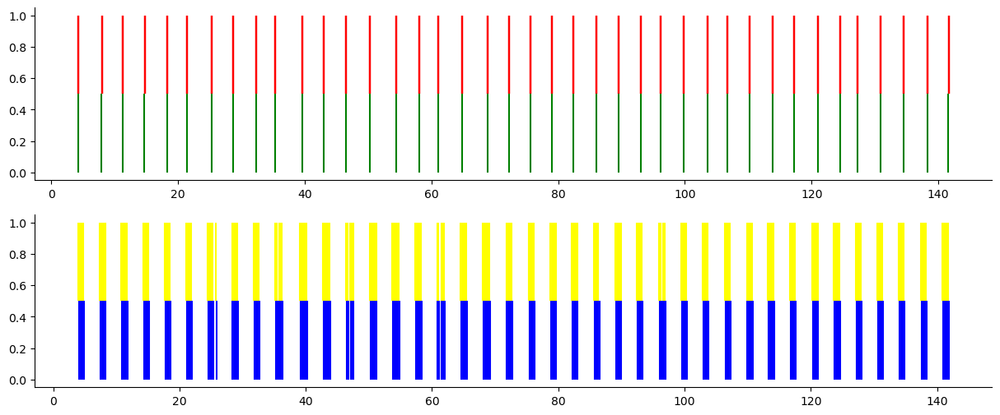

NAN percentage: 1%
8


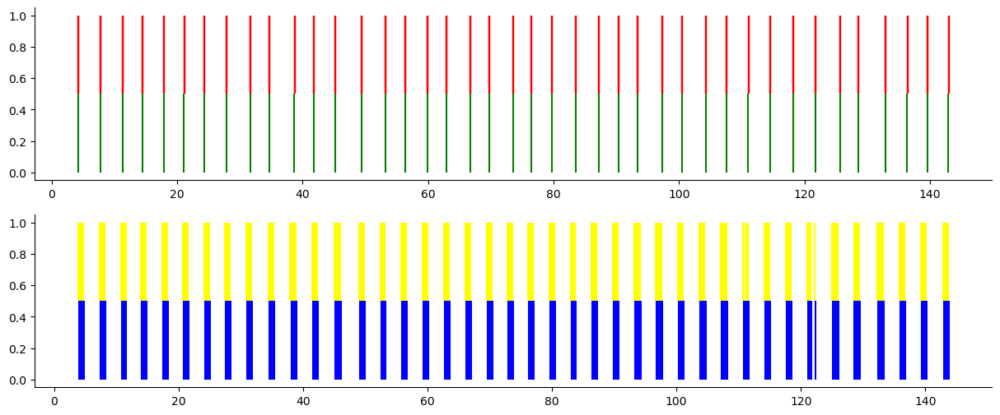

NAN percentage: 1%
9


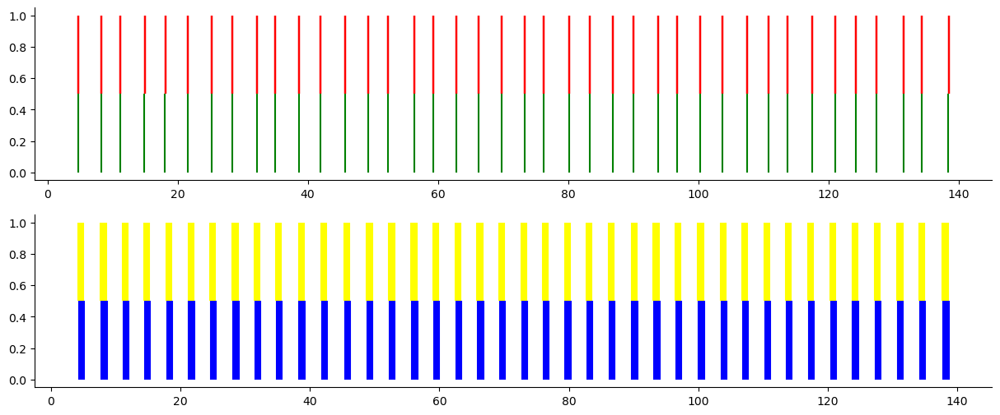

NAN percentage: 1%
10


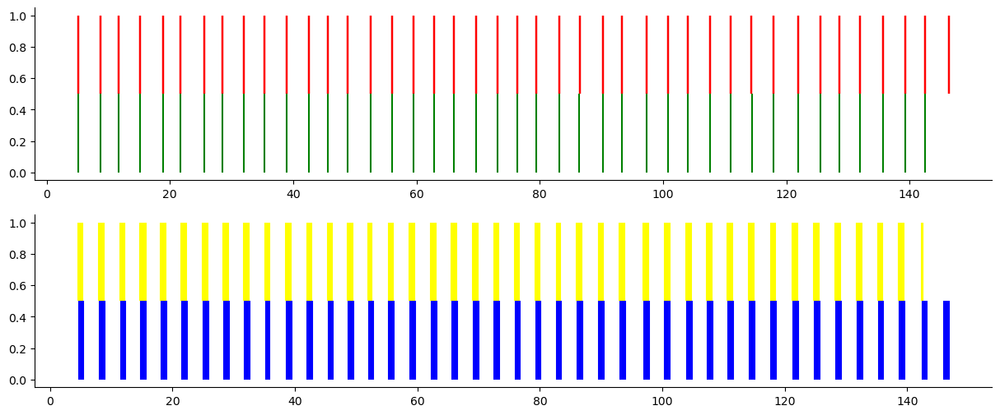

NAN percentage: 1%
P17 A1
1


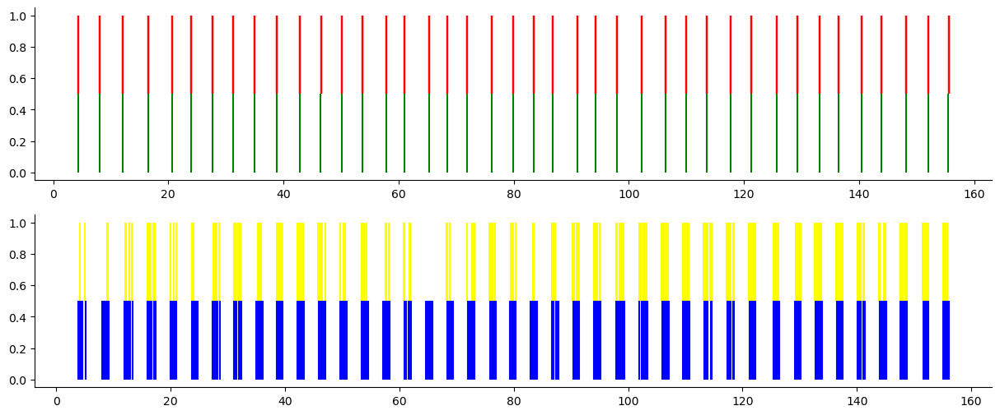

NAN percentage: 4%
2


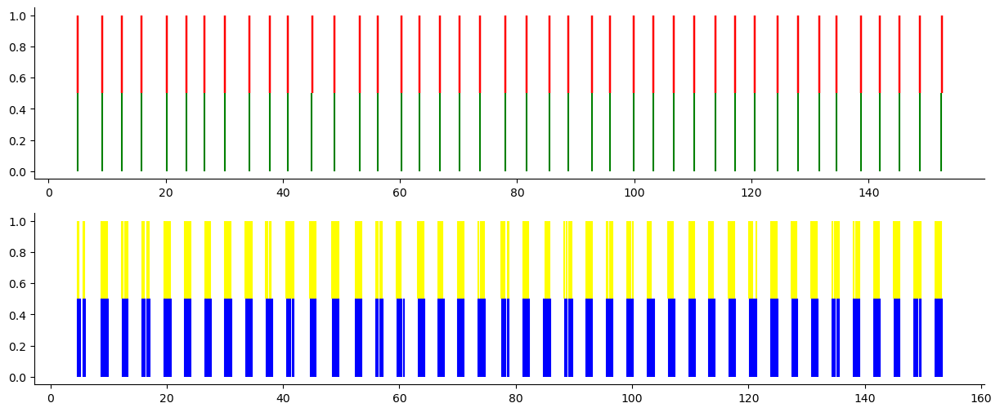

NAN percentage: 4%
3


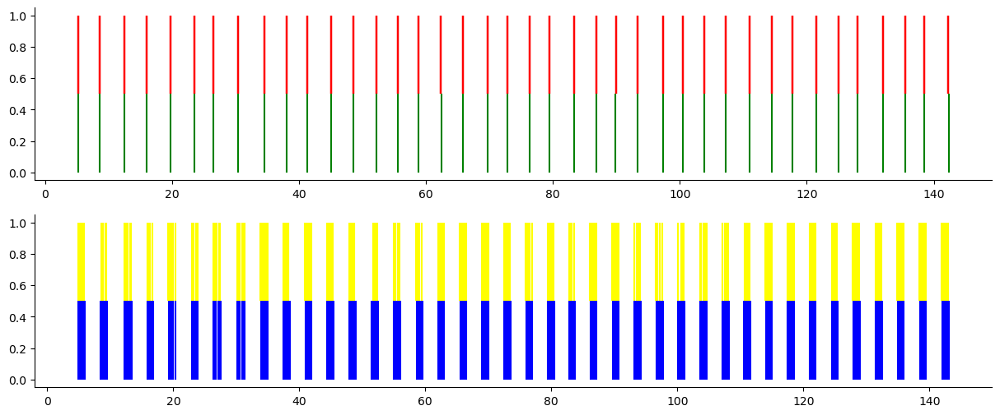

NAN percentage: 4%
4


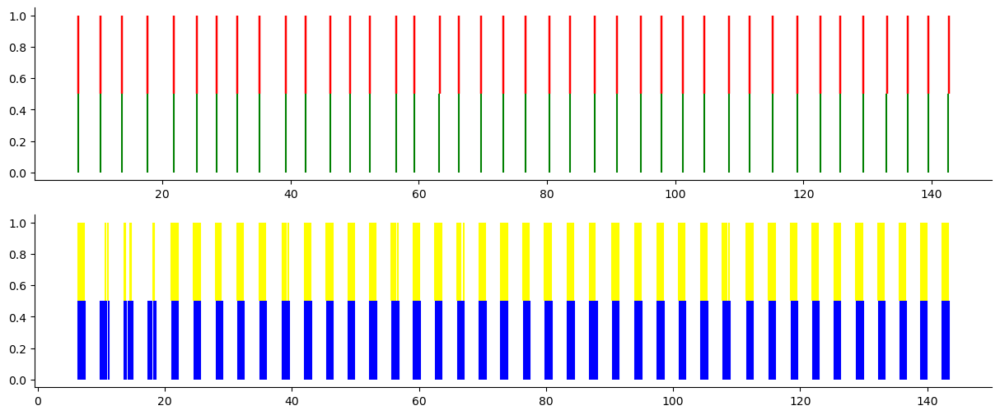

NAN percentage: 4%
5


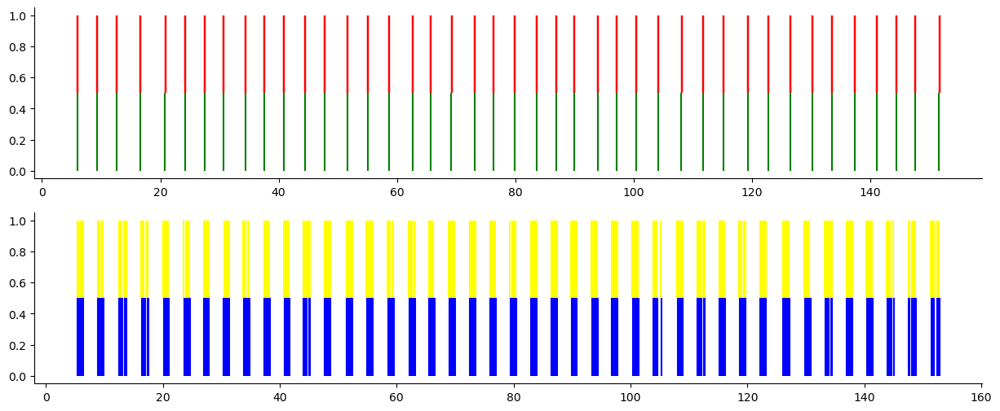

NAN percentage: 4%
6


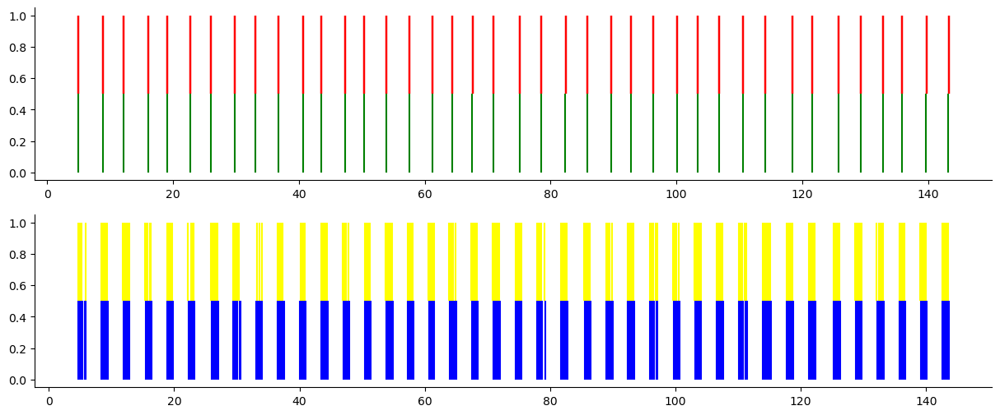

NAN percentage: 4%
7


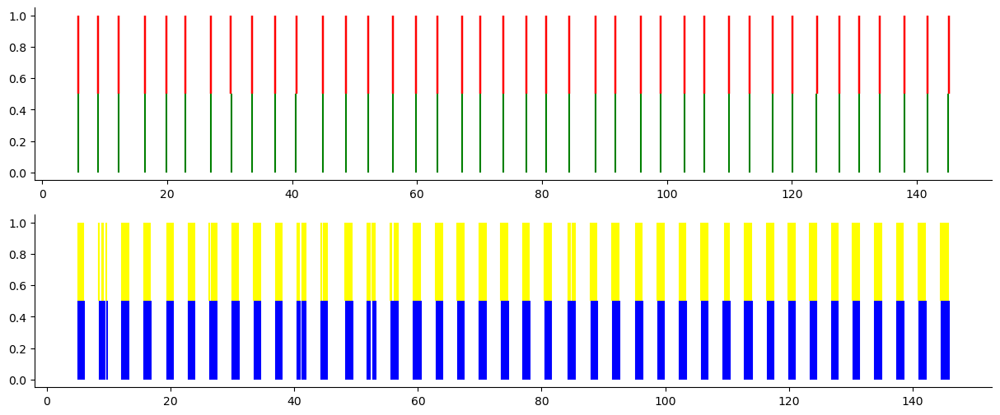

NAN percentage: 4%
8


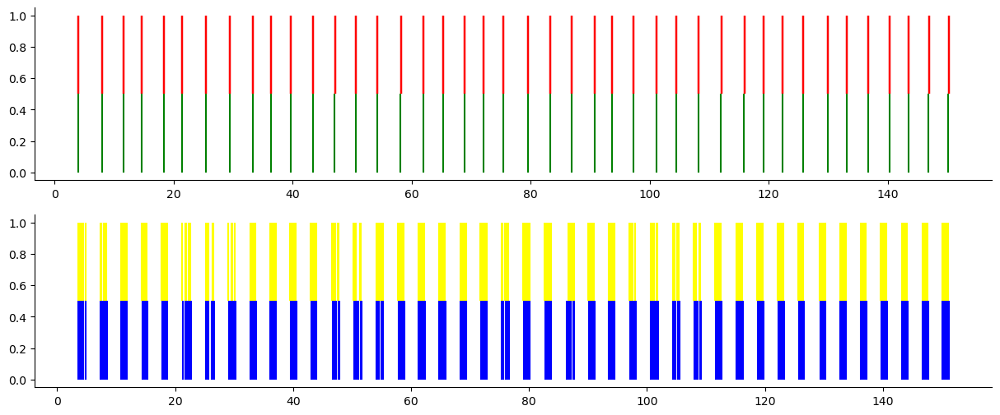

NAN percentage: 4%
9


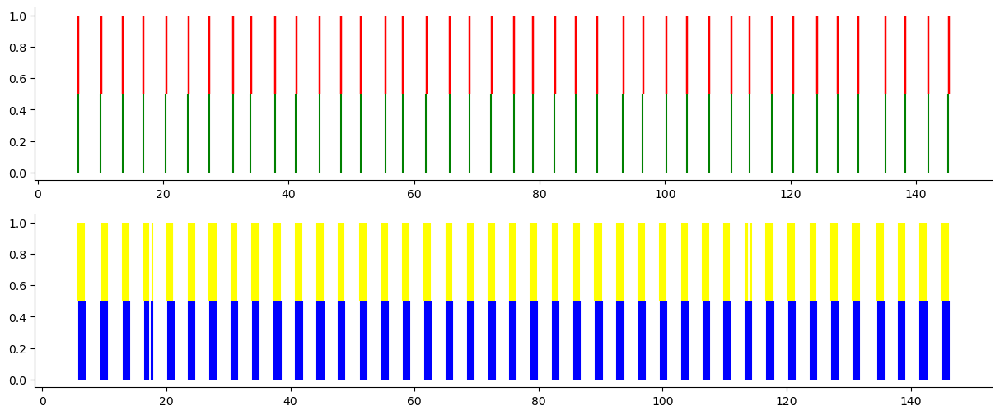

NAN percentage: 4%
10


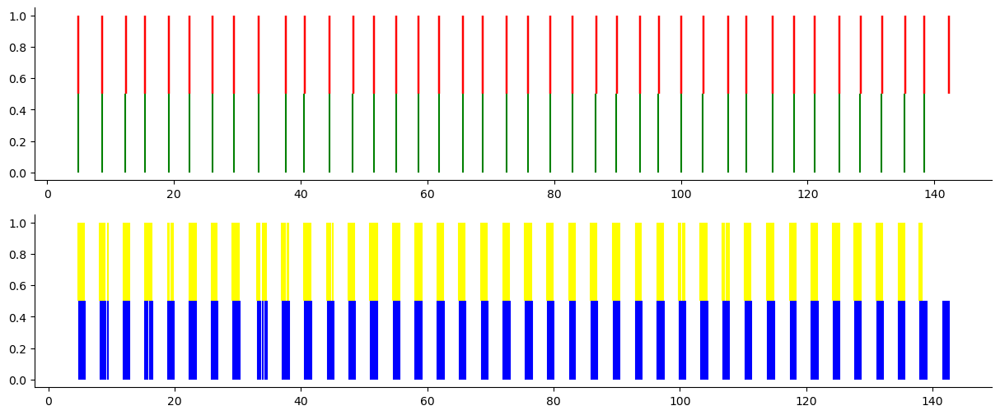

NAN percentage: 4%
P17 A2
2


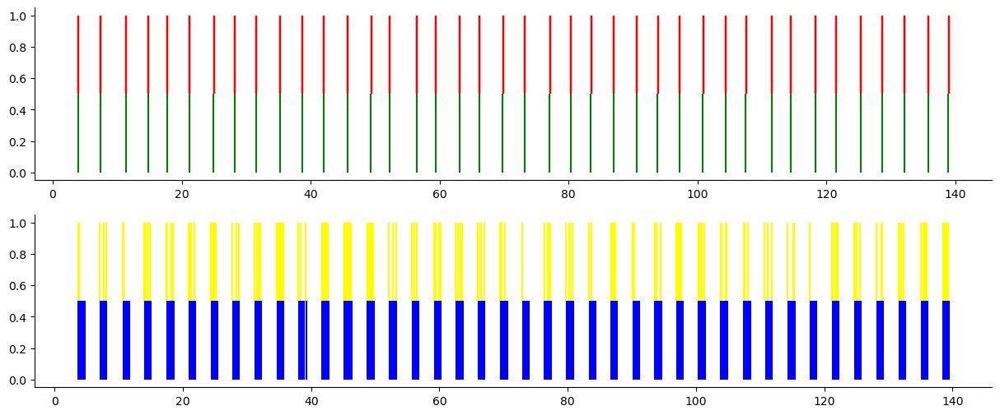

NAN percentage: 28%
3


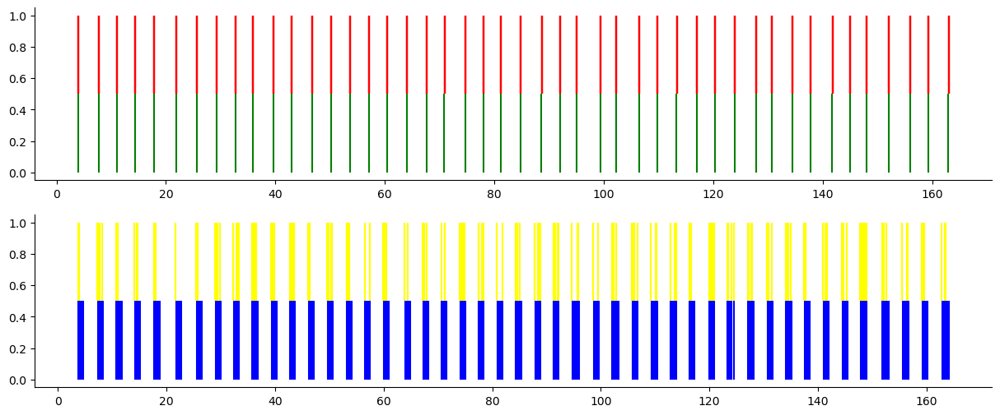

NAN percentage: 28%
4


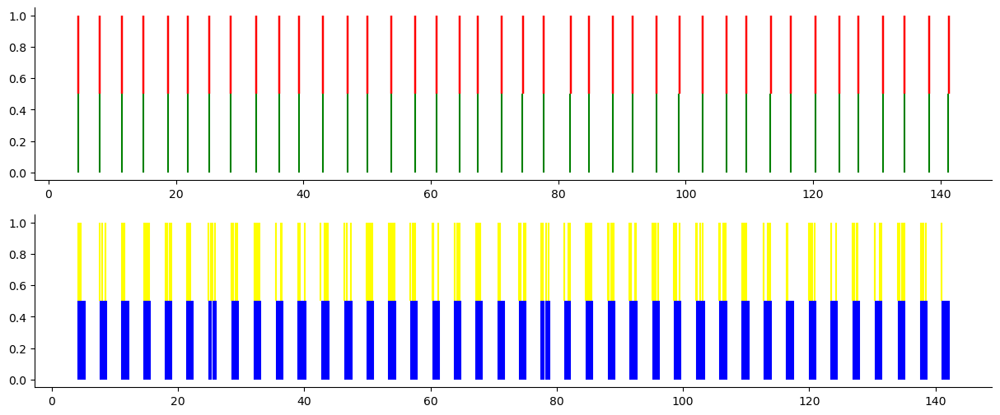

NAN percentage: 28%
5


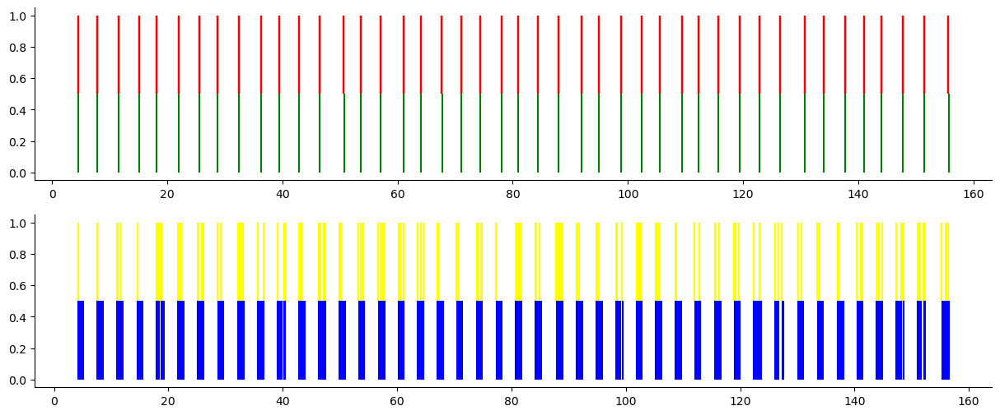

NAN percentage: 28%
6


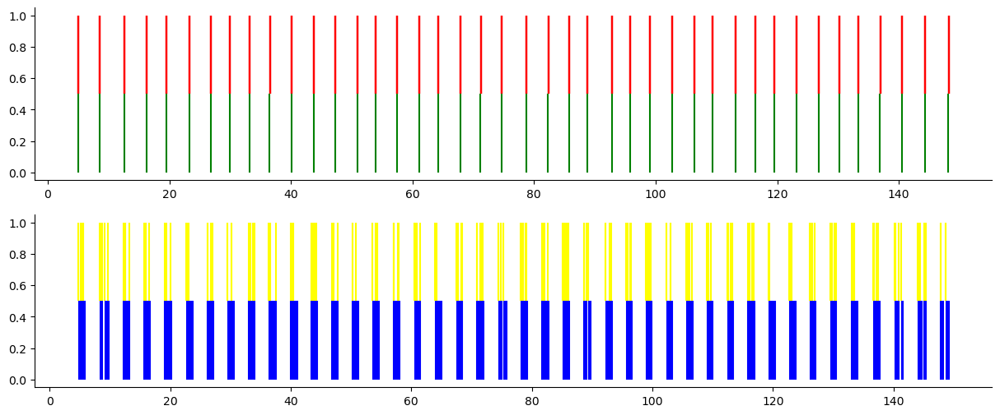

NAN percentage: 28%
7


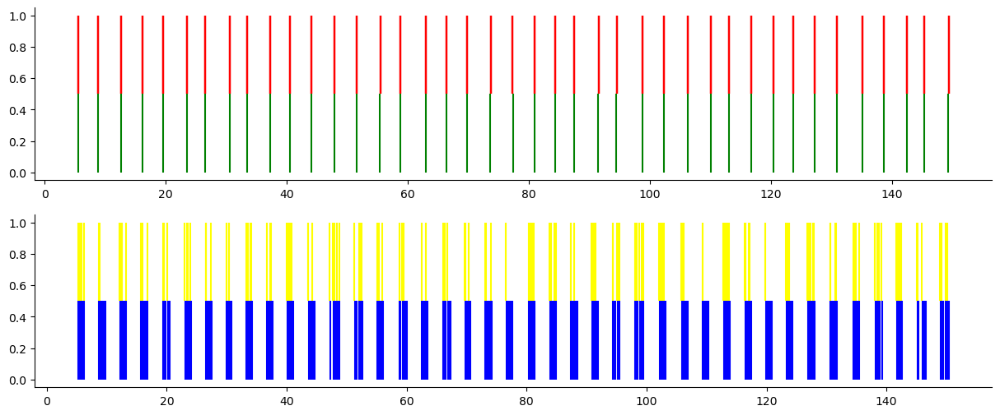

NAN percentage: 28%
8


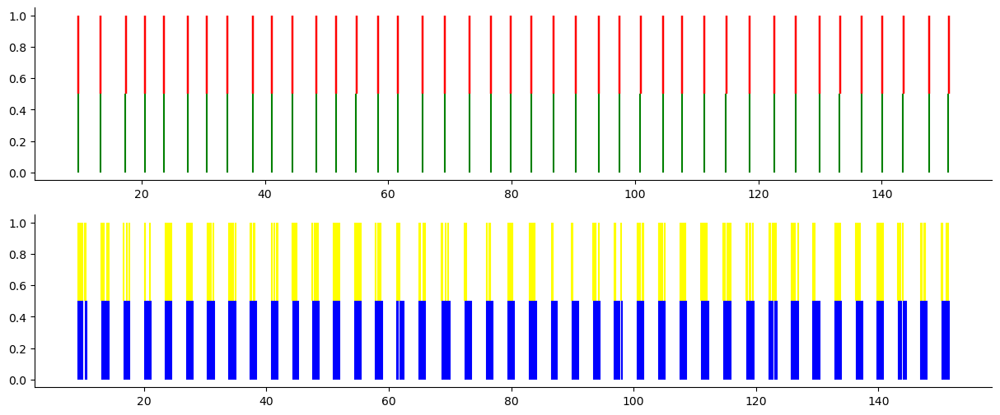

NAN percentage: 28%
9


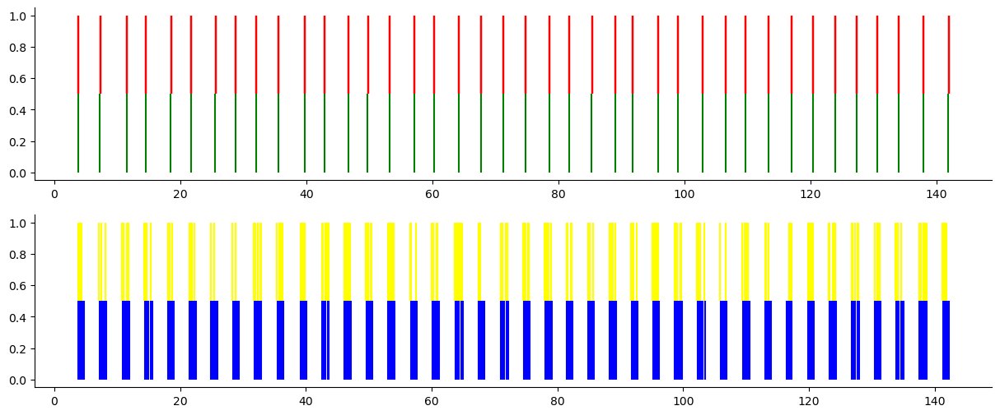

NAN percentage: 28%
10


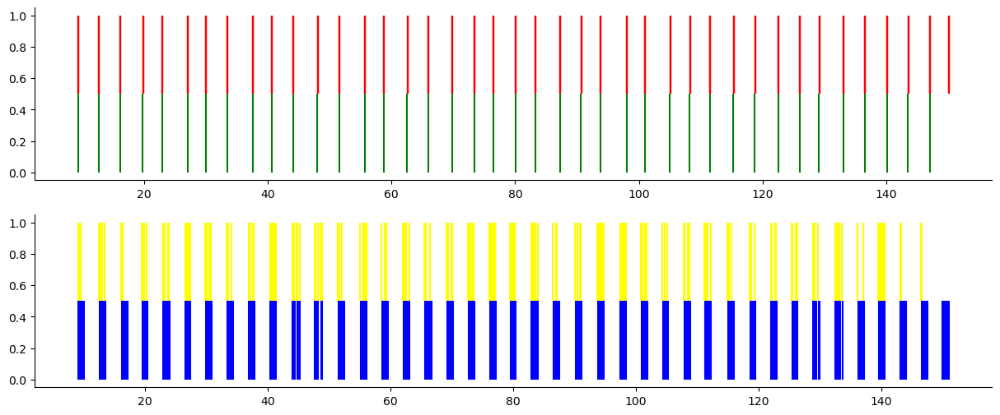

NAN percentage: 28%
P18 A1
2


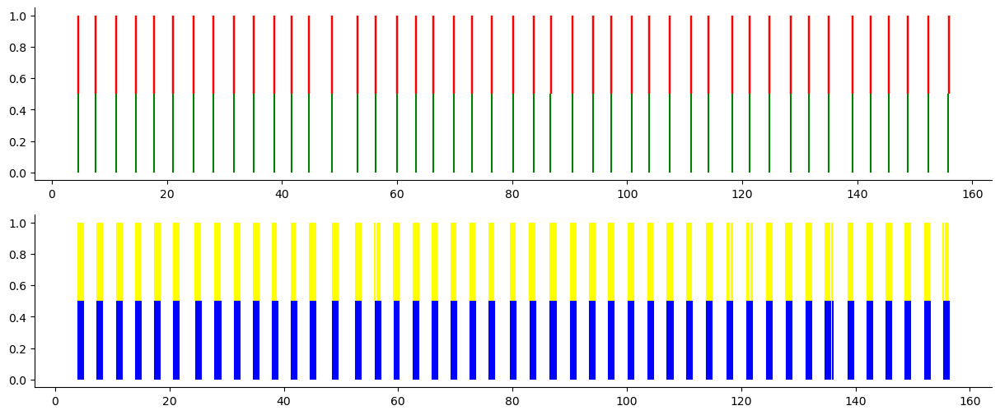

NAN percentage: 10%
3


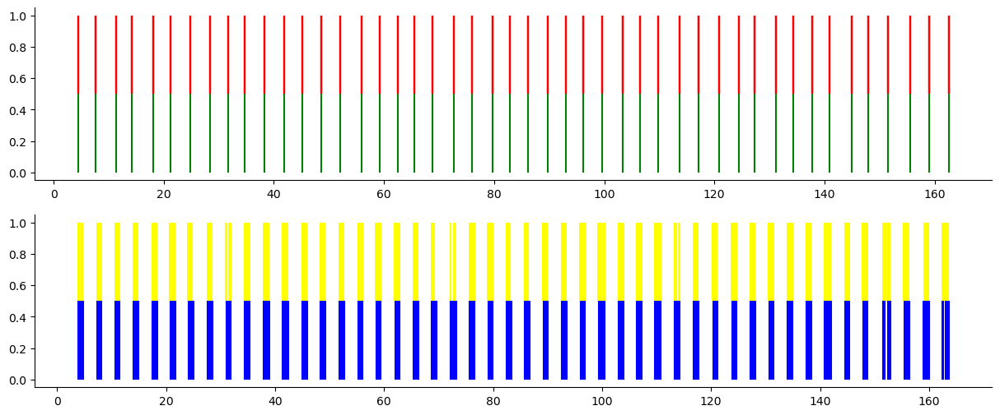

NAN percentage: 10%
4


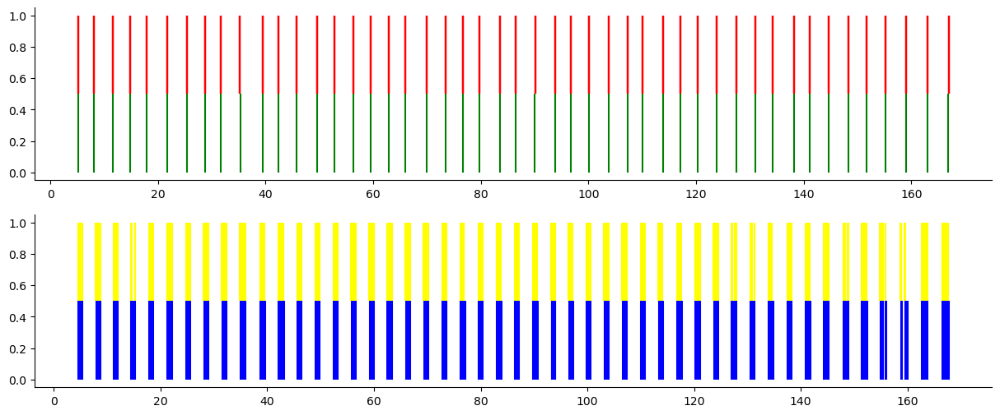

NAN percentage: 10%
5


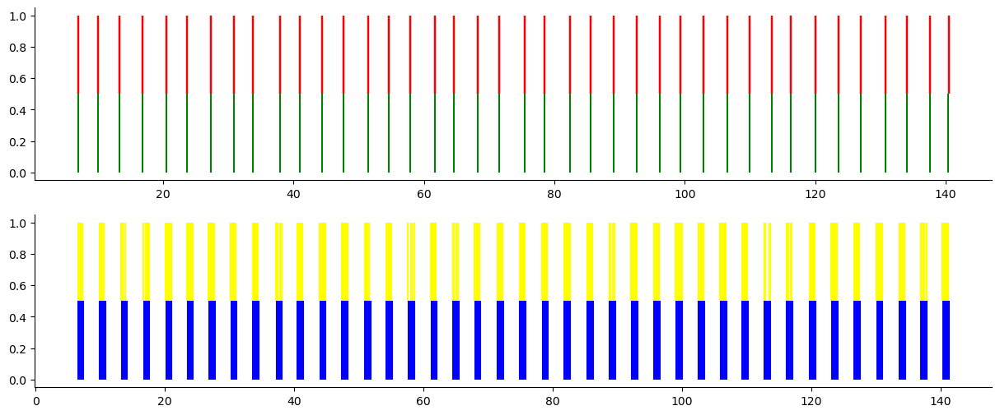

NAN percentage: 10%
6


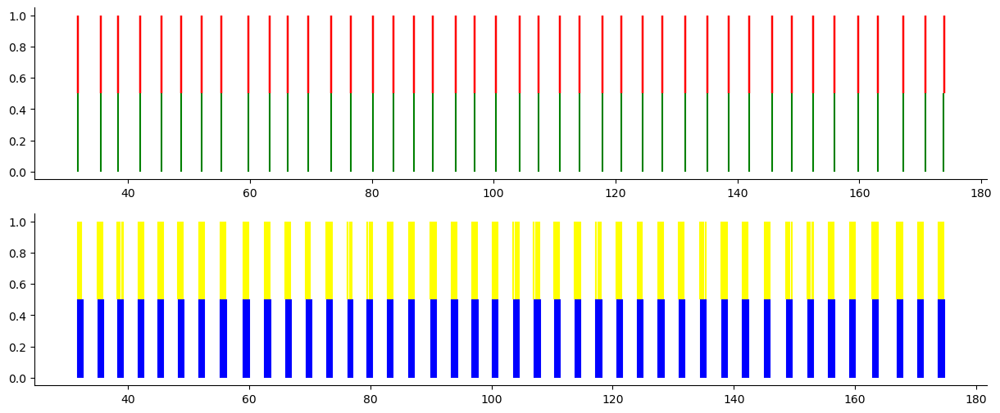

NAN percentage: 10%
7


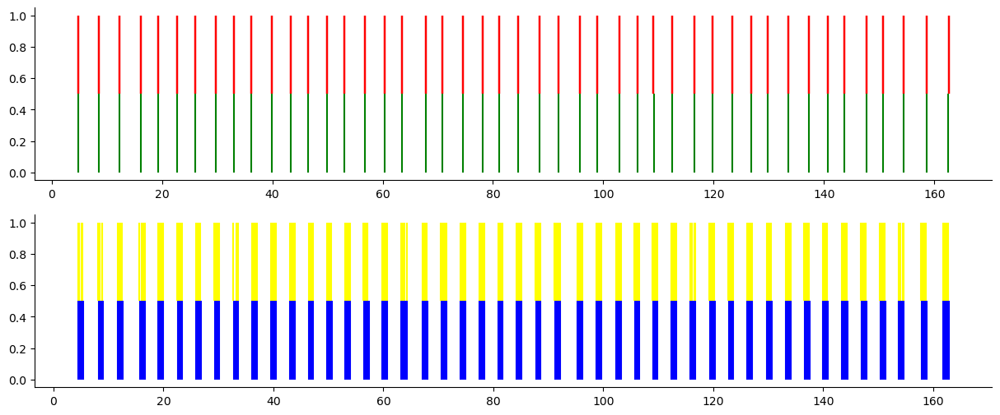

NAN percentage: 10%
8


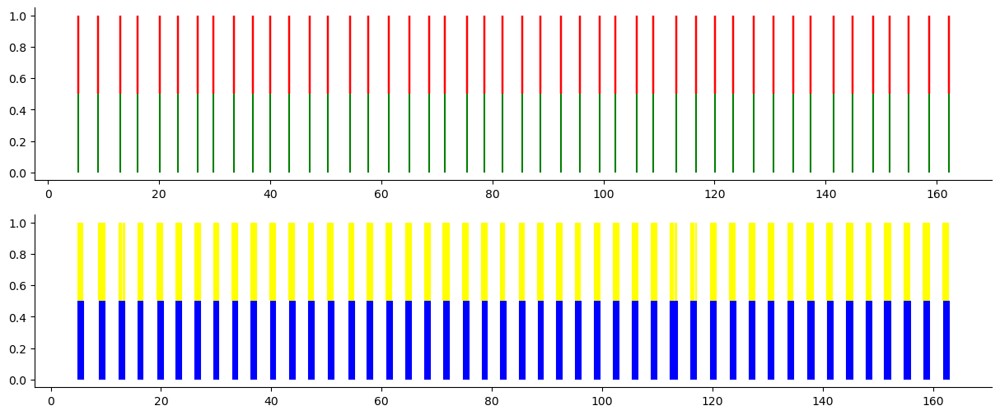

NAN percentage: 10%
9


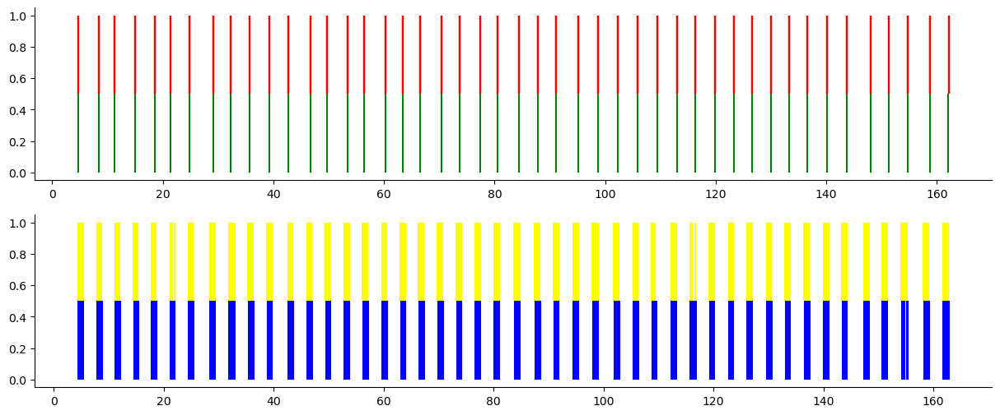

NAN percentage: 10%
10


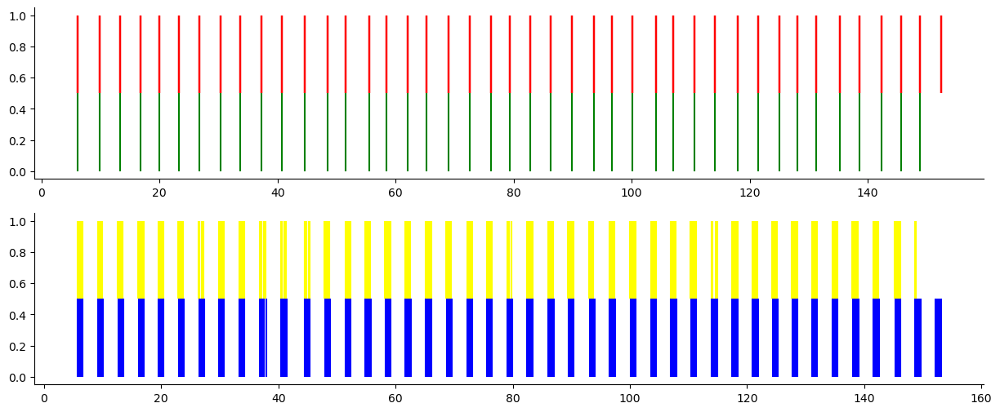

NAN percentage: 10%
P18 A2
2


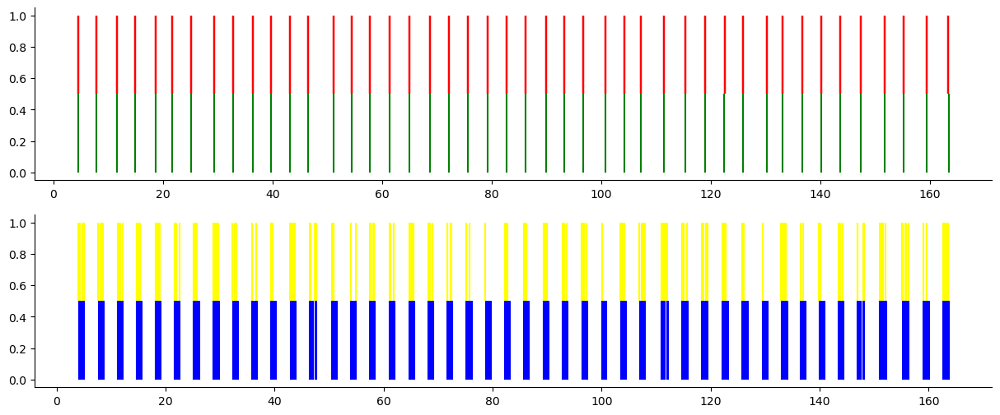

NAN percentage: 28%
3


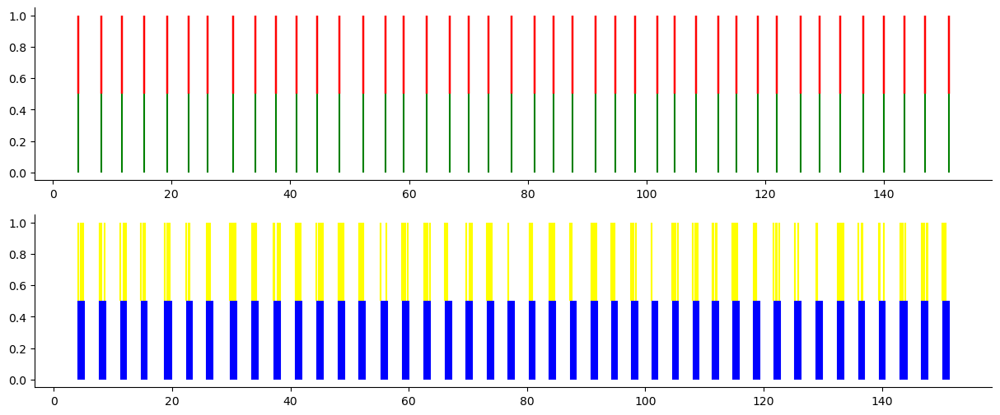

NAN percentage: 28%
4


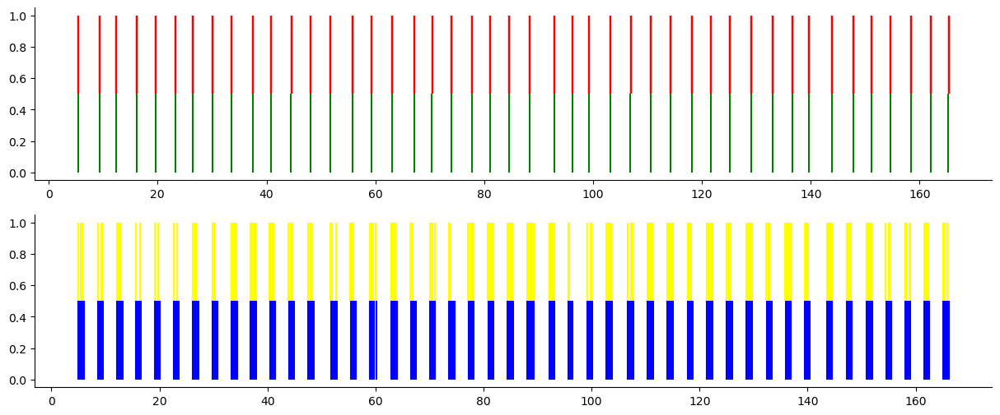

NAN percentage: 28%
5


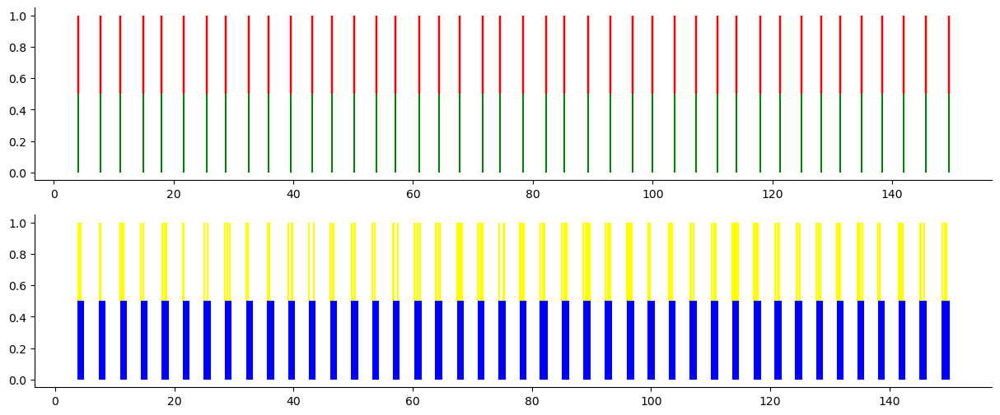

NAN percentage: 28%
6


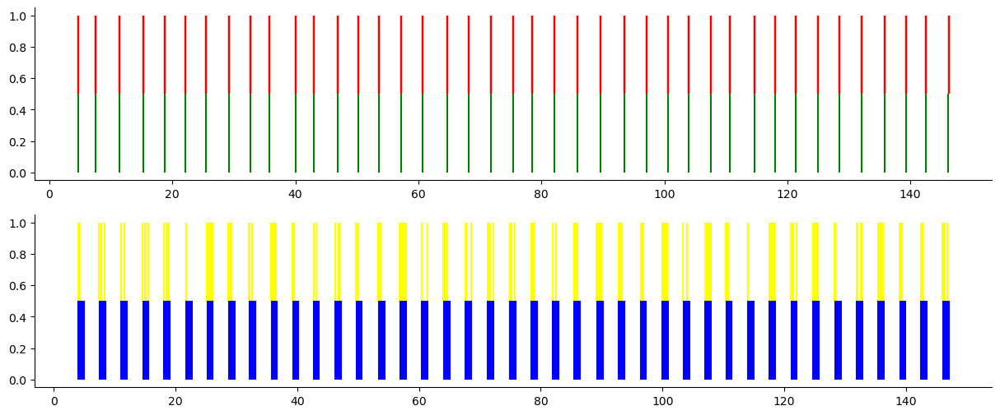

NAN percentage: 28%
7


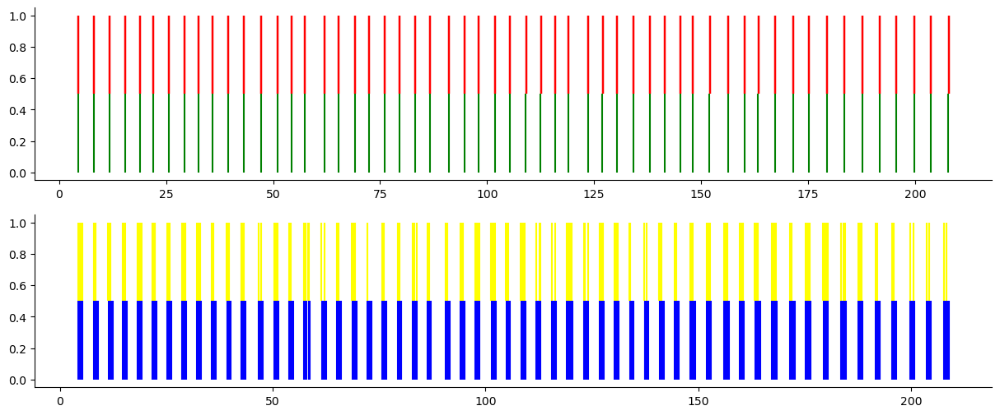

NAN percentage: 28%
8


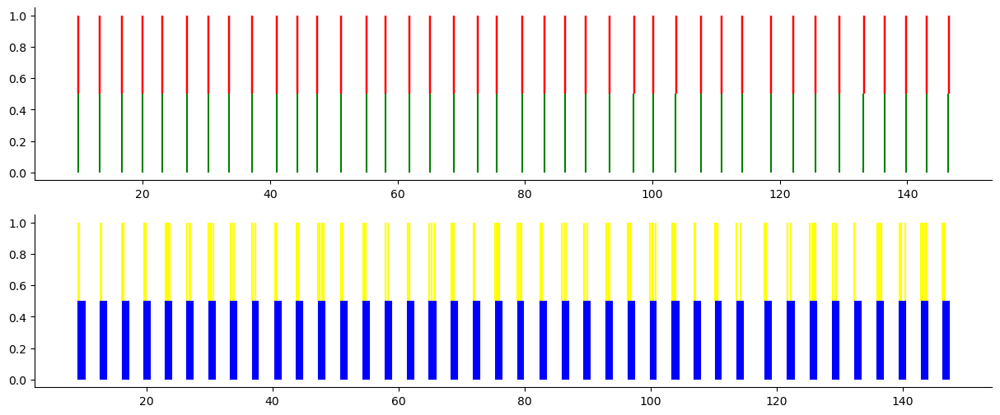

NAN percentage: 28%
9


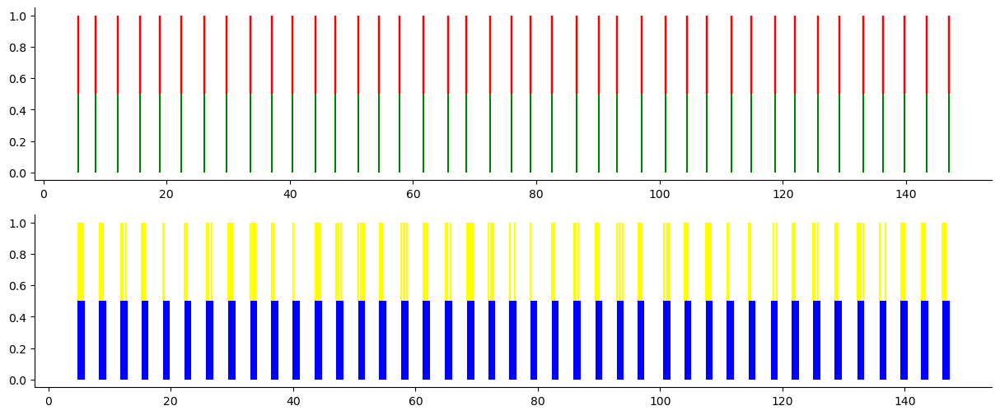

NAN percentage: 28%
10


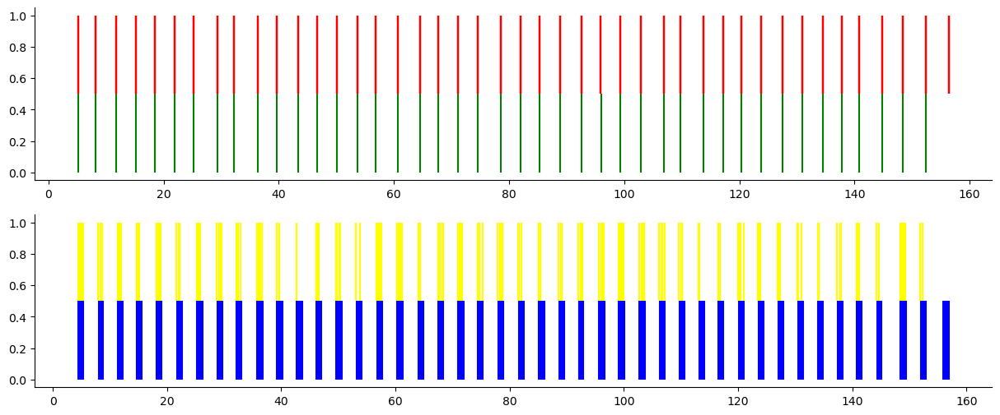

NAN percentage: 28%
P19 A1
1


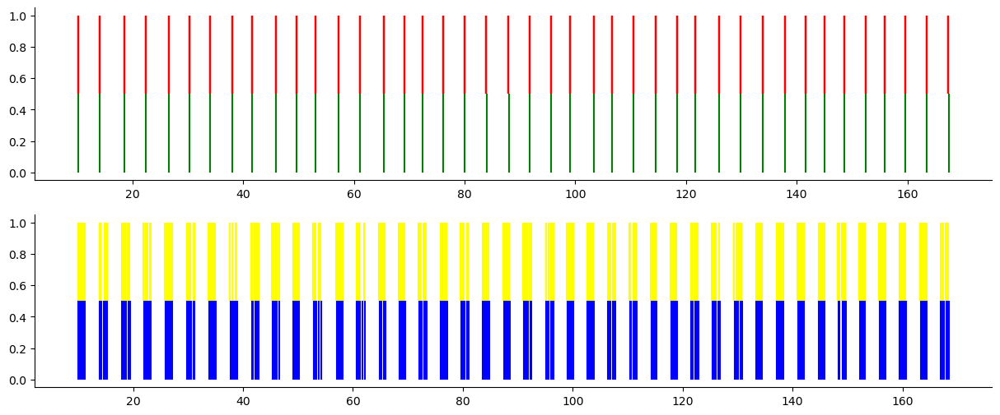

NAN percentage: 2%
2


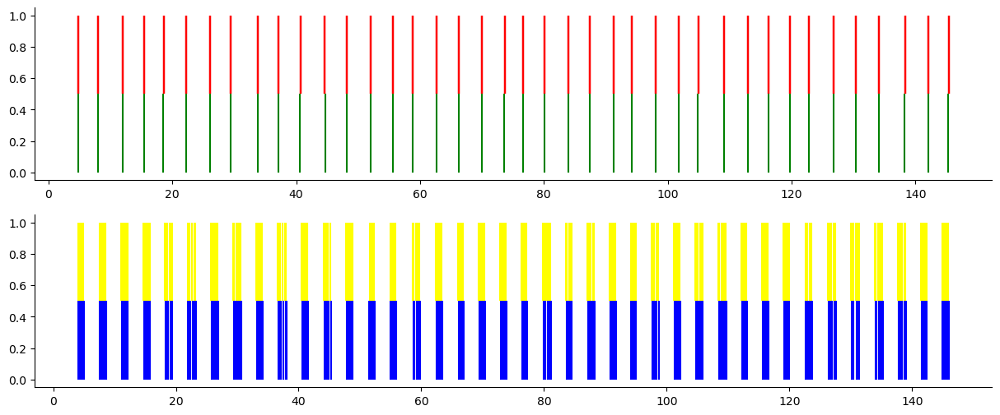

NAN percentage: 2%
3


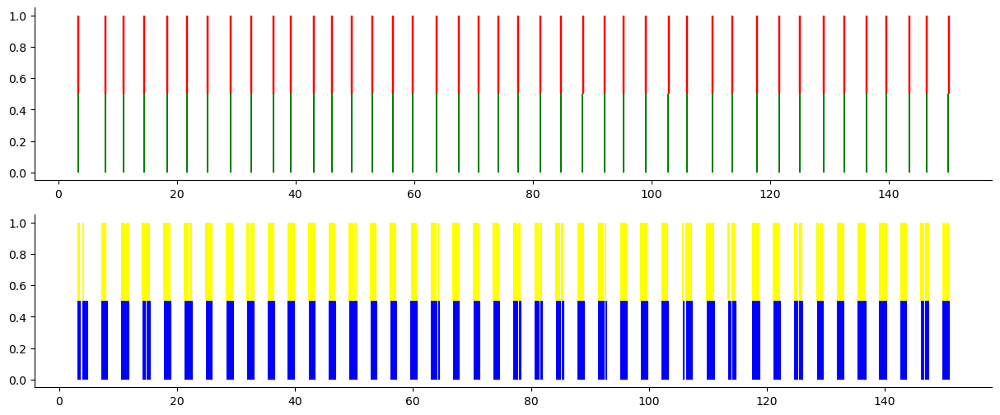

NAN percentage: 2%
4


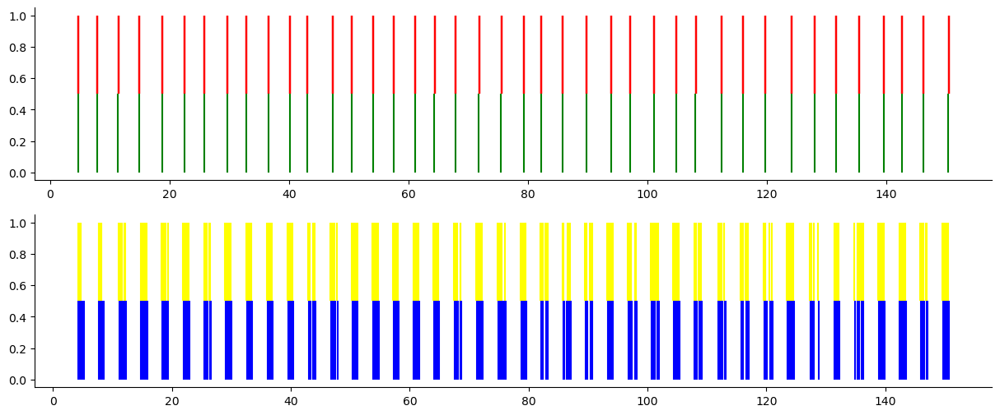

NAN percentage: 2%
5


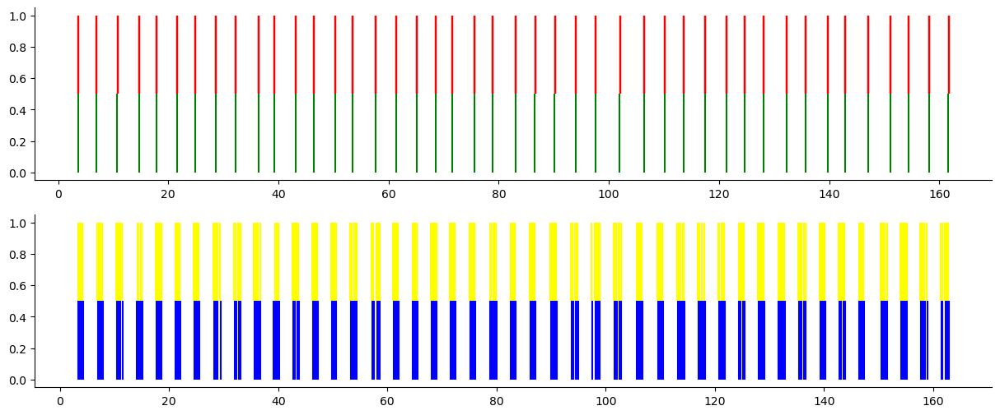

NAN percentage: 2%
6


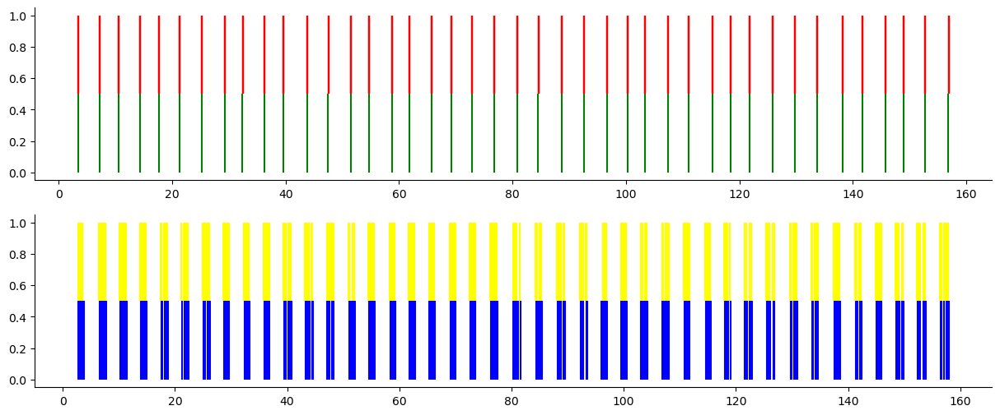

NAN percentage: 2%
7


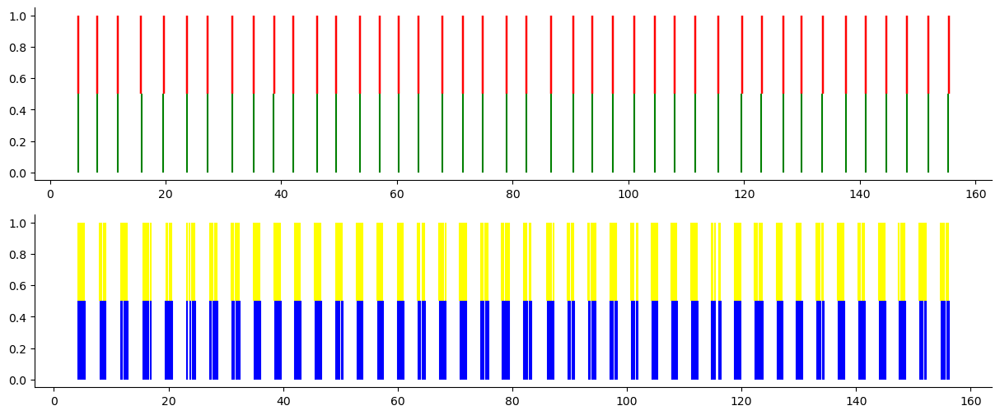

NAN percentage: 2%
8


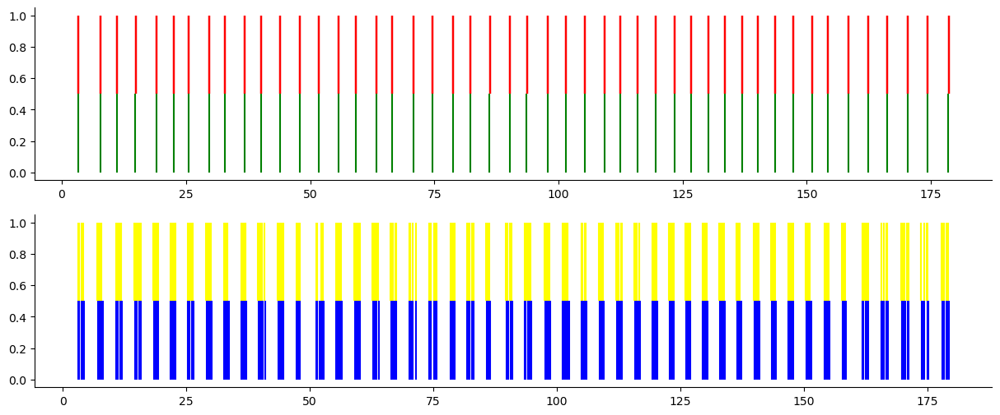

NAN percentage: 2%
9


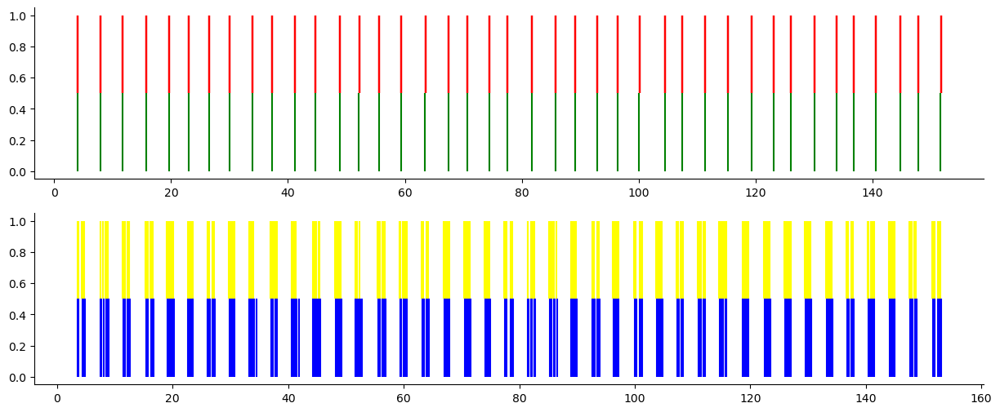

NAN percentage: 2%
10


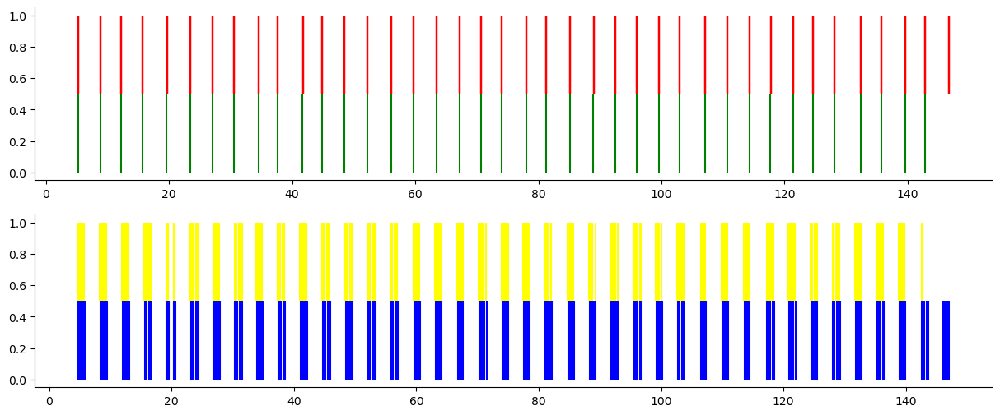

NAN percentage: 2%
P19 A2
1


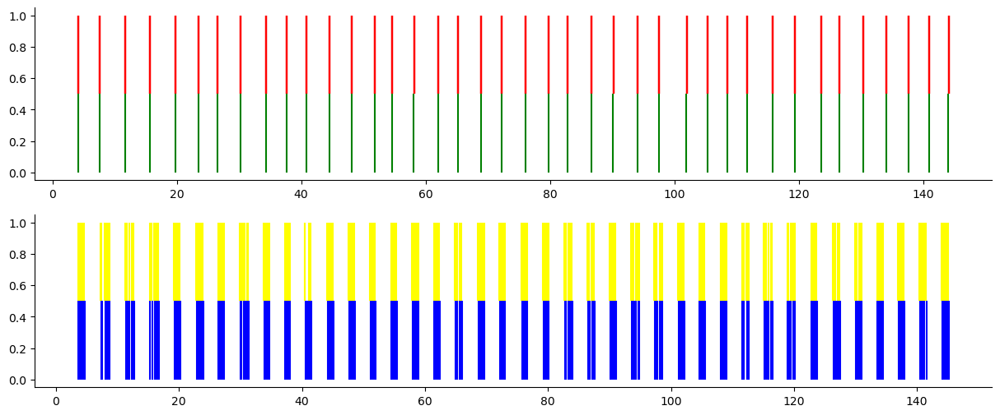

NAN percentage: 1%
2


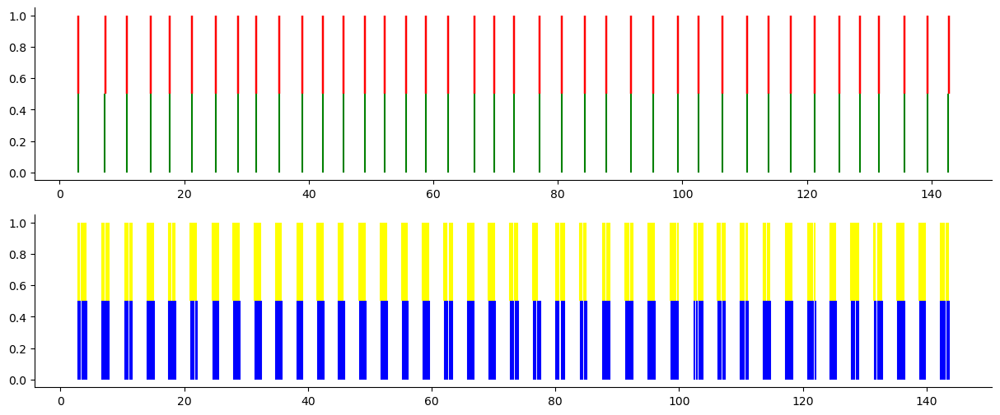

NAN percentage: 1%
3


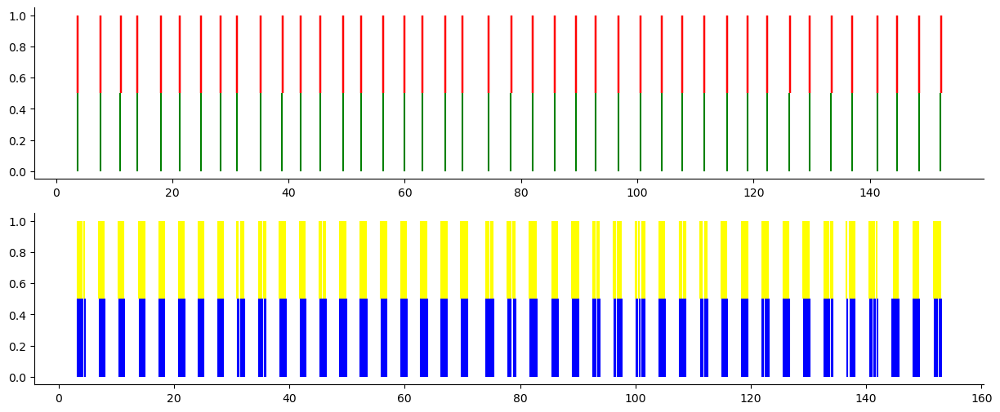

NAN percentage: 1%
4


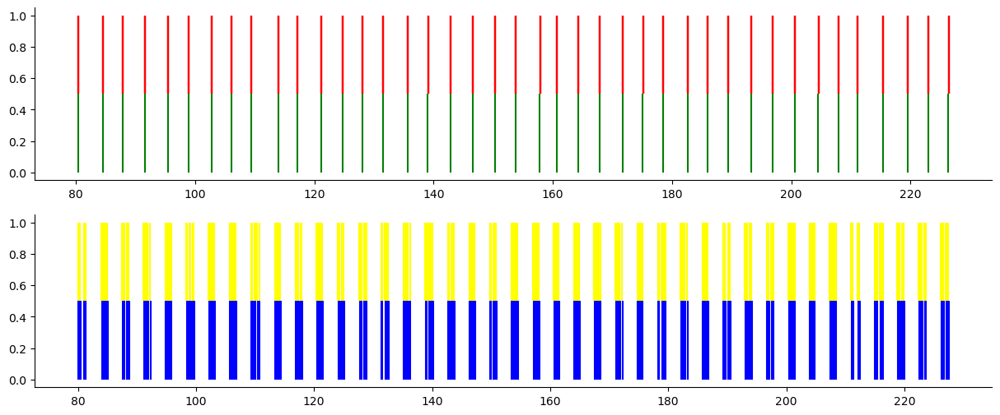

NAN percentage: 1%
5


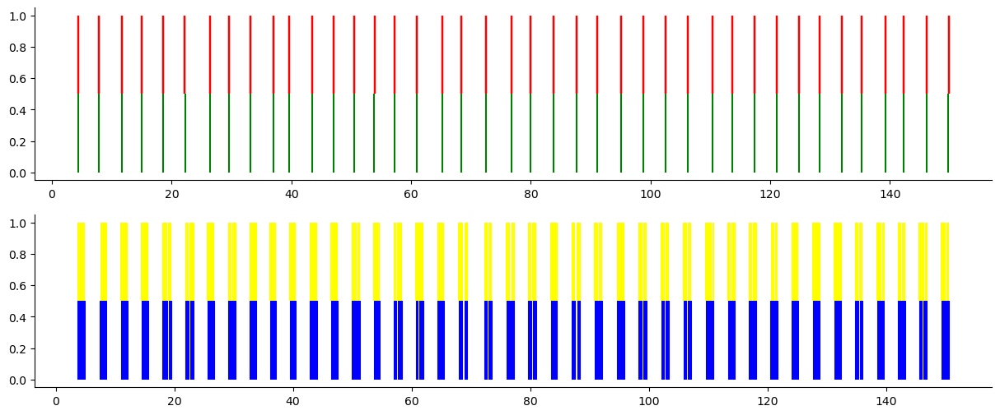

NAN percentage: 1%
6


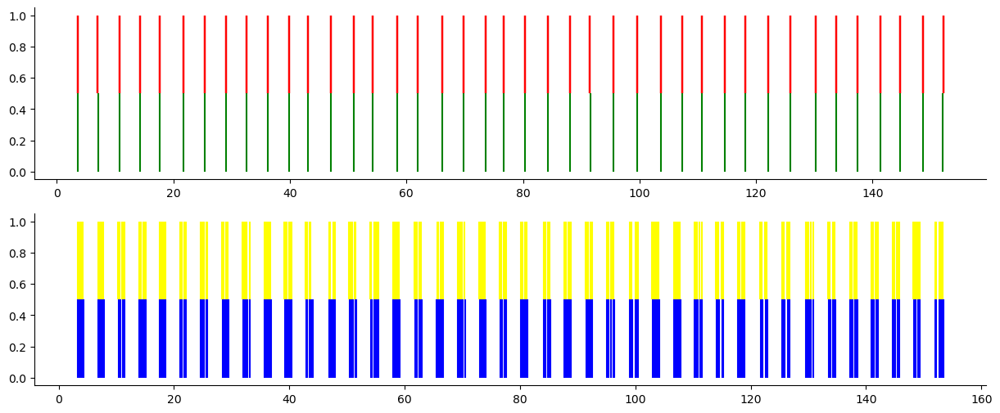

NAN percentage: 1%
7


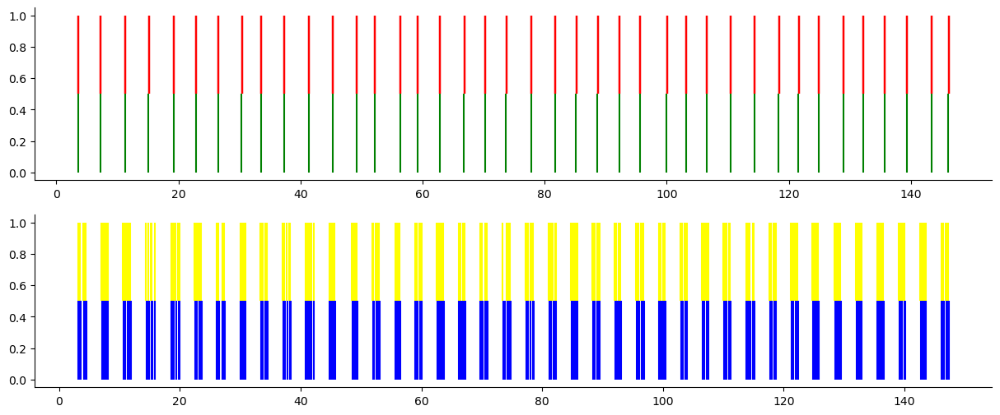

NAN percentage: 1%
8


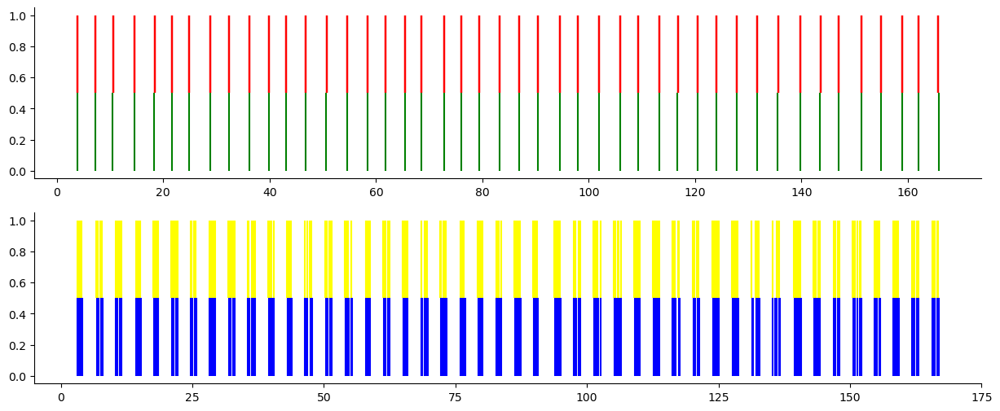

NAN percentage: 1%
9


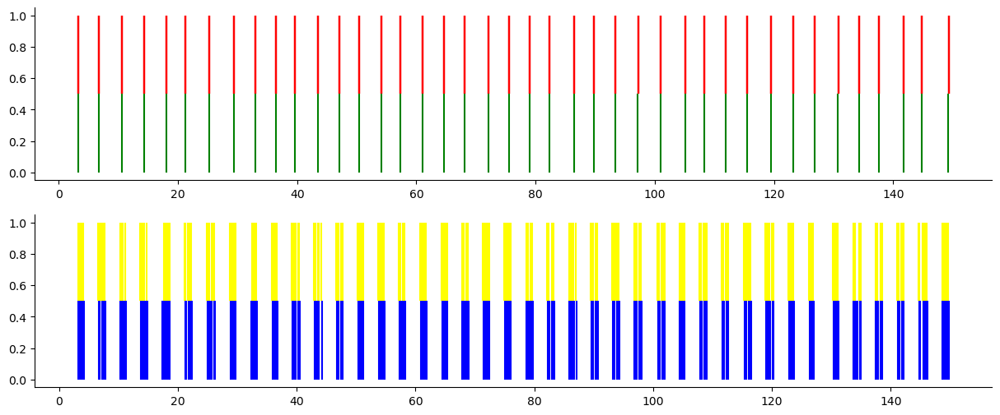

NAN percentage: 1%
10


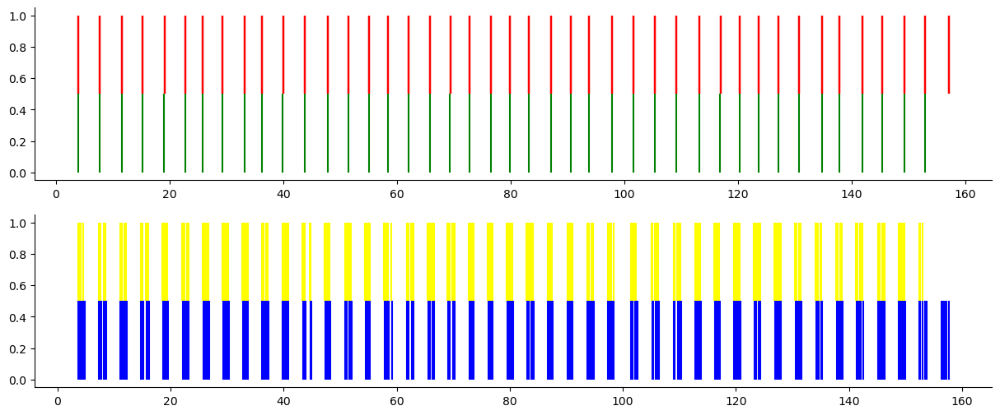

NAN percentage: 1%
P20 A1
1


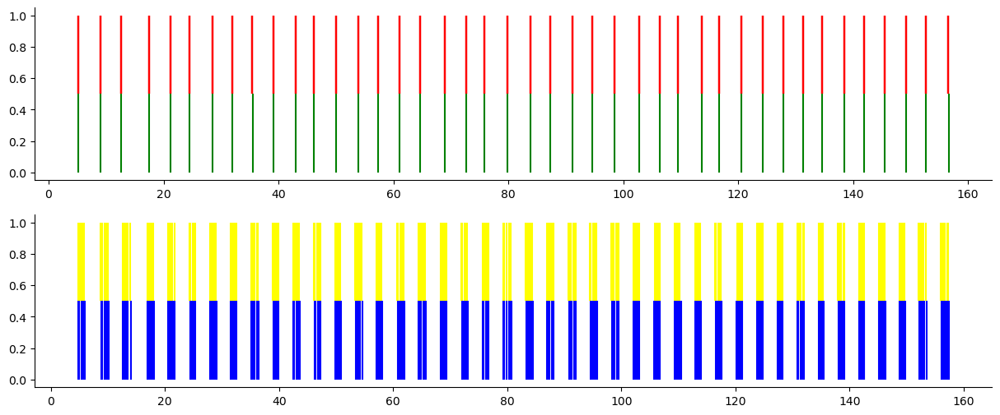

NAN percentage: 2%
2


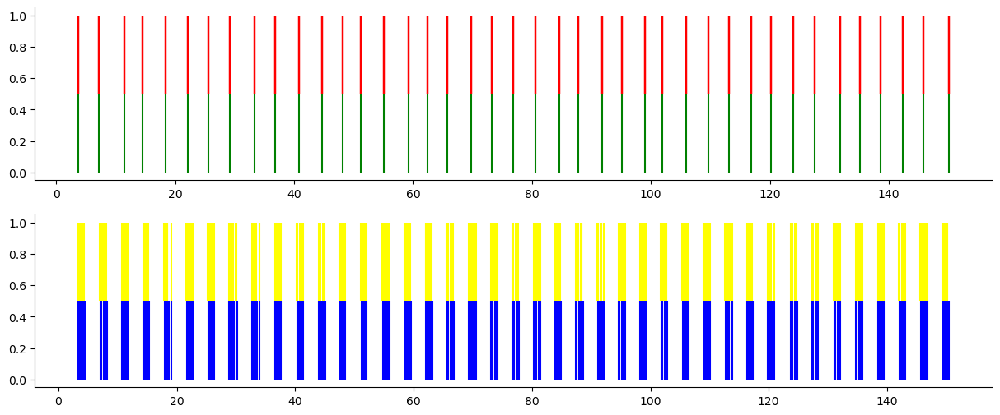

NAN percentage: 2%
3


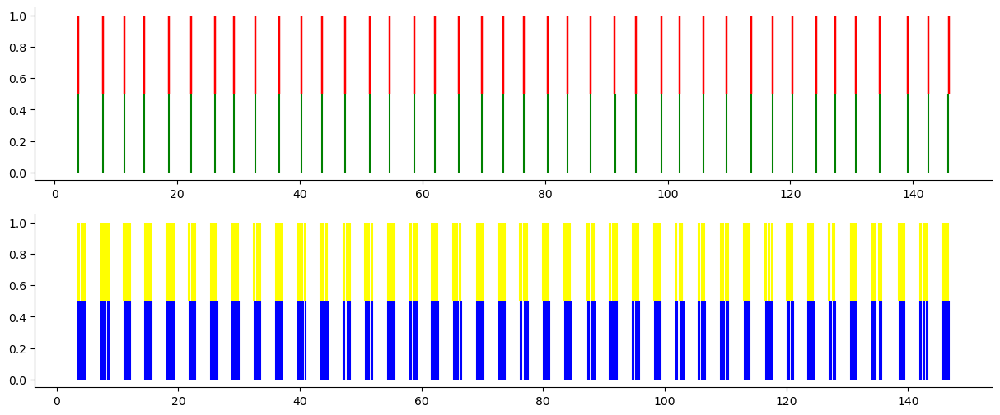

NAN percentage: 2%
4


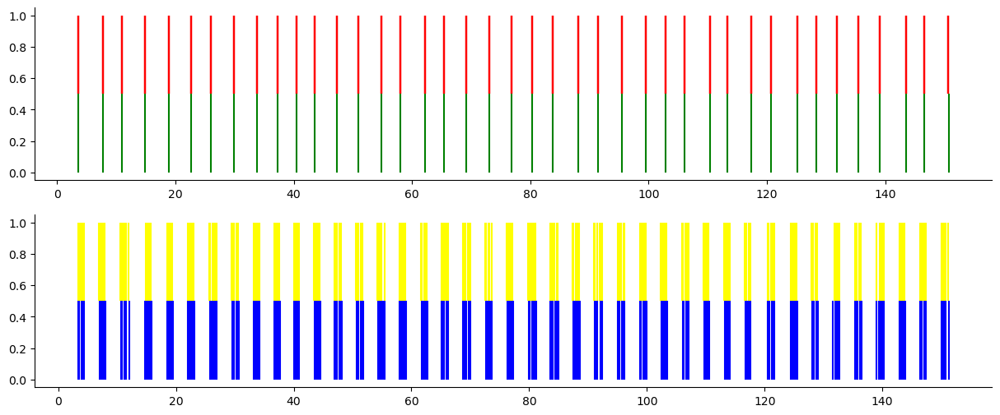

NAN percentage: 2%
5


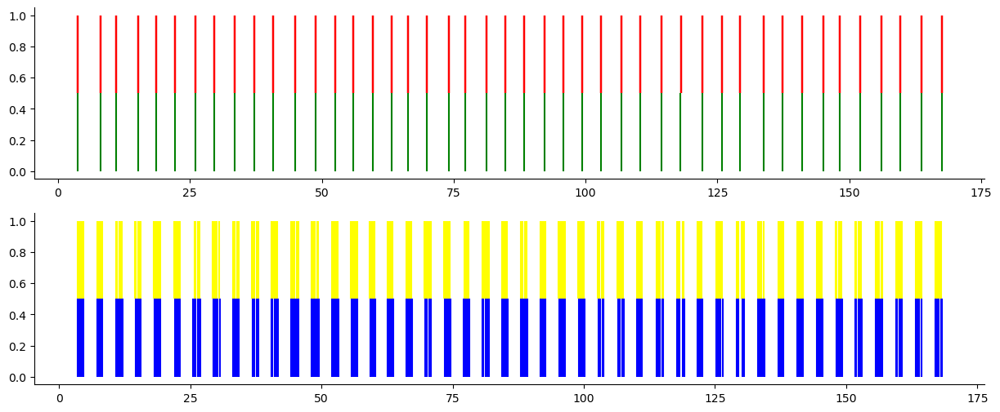

NAN percentage: 2%
6


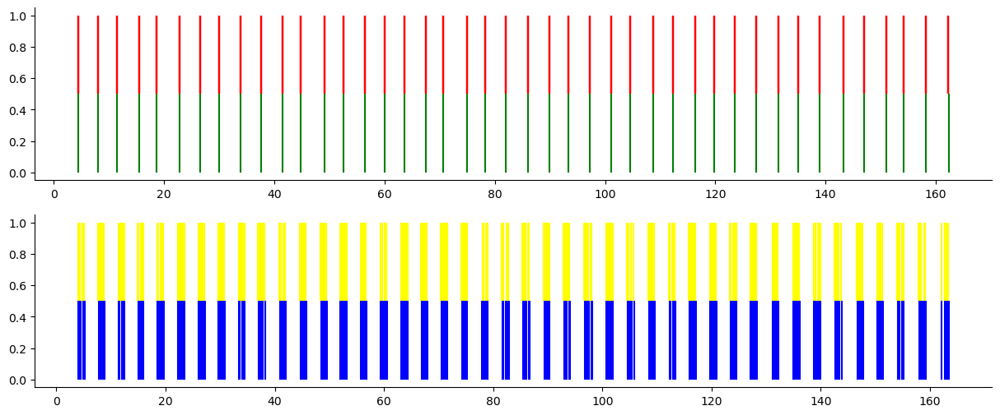

NAN percentage: 2%
7


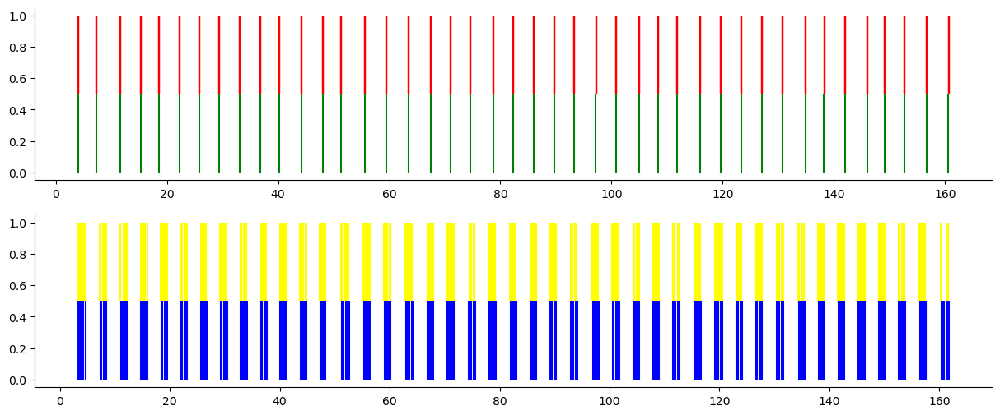

NAN percentage: 2%
8


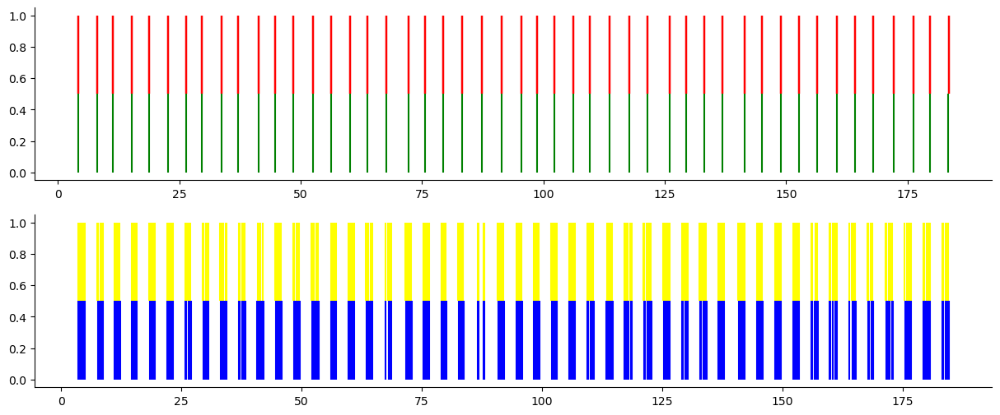

NAN percentage: 2%
9


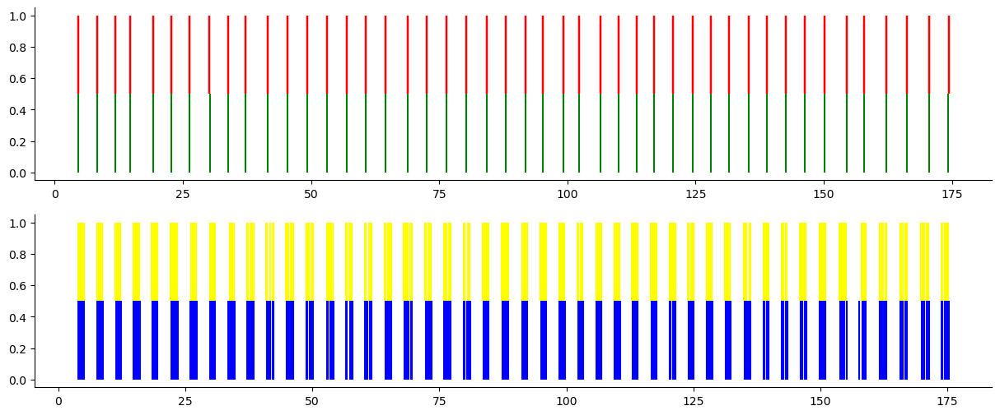

NAN percentage: 2%
10


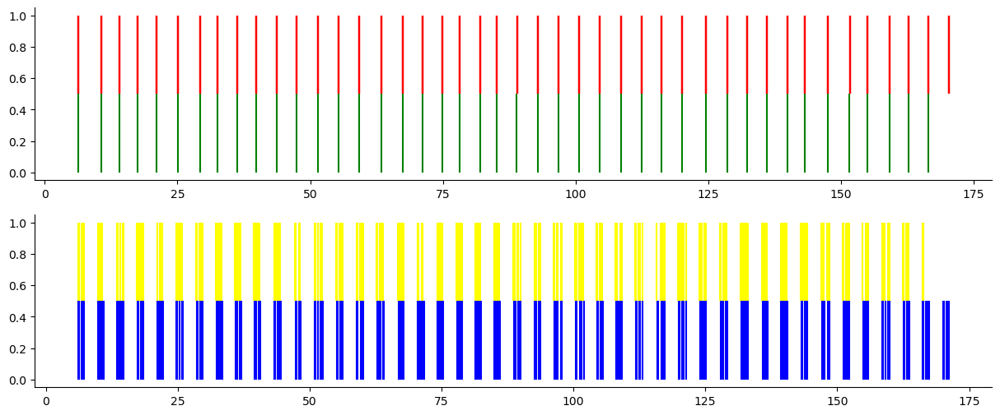

NAN percentage: 2%
P20 A2
2


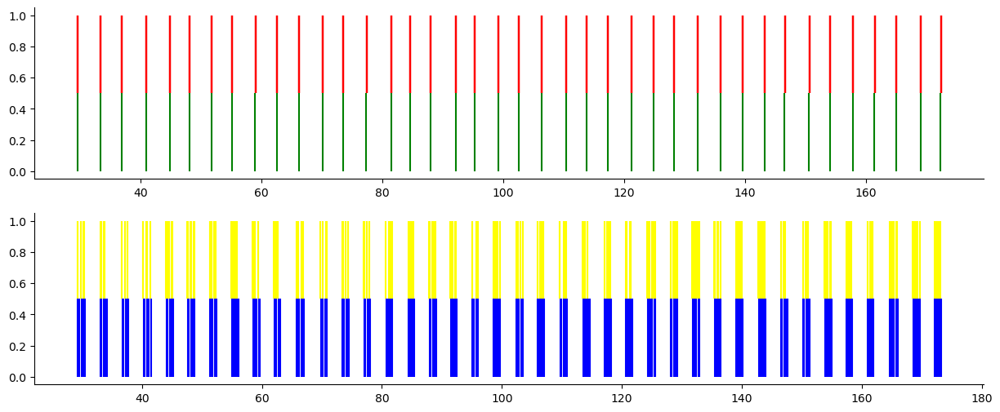

NAN percentage: 12%
3


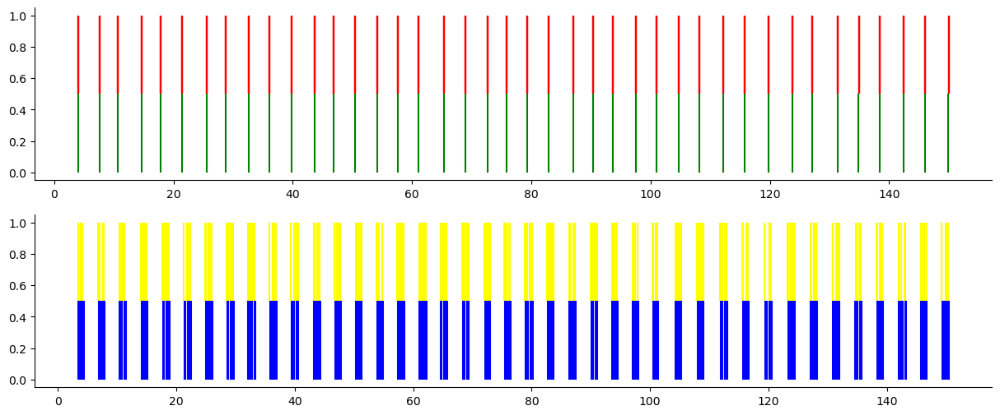

NAN percentage: 12%
4


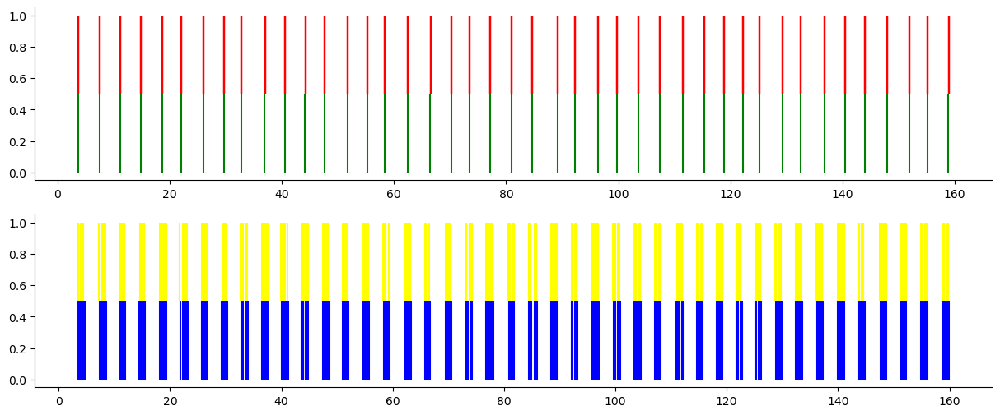

NAN percentage: 12%
5


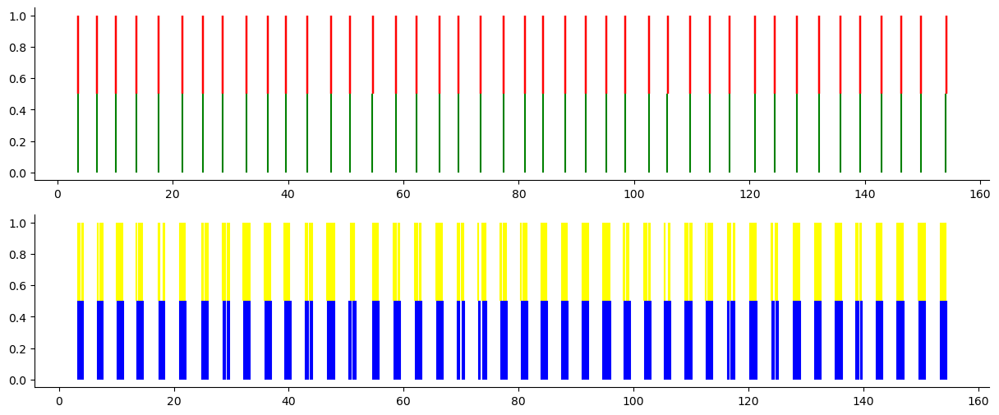

NAN percentage: 12%
6


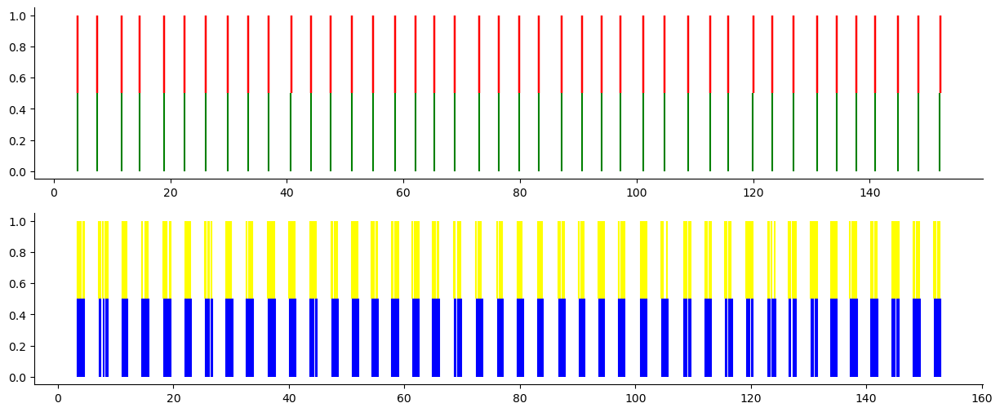

NAN percentage: 12%
7


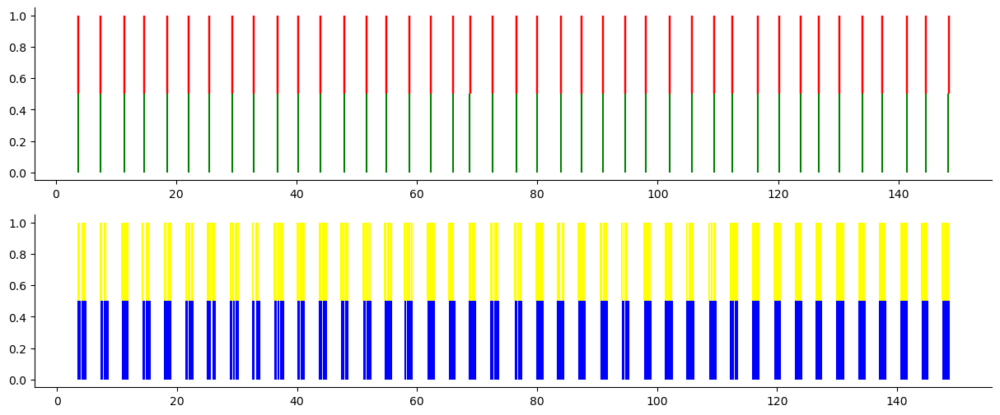

NAN percentage: 12%
8


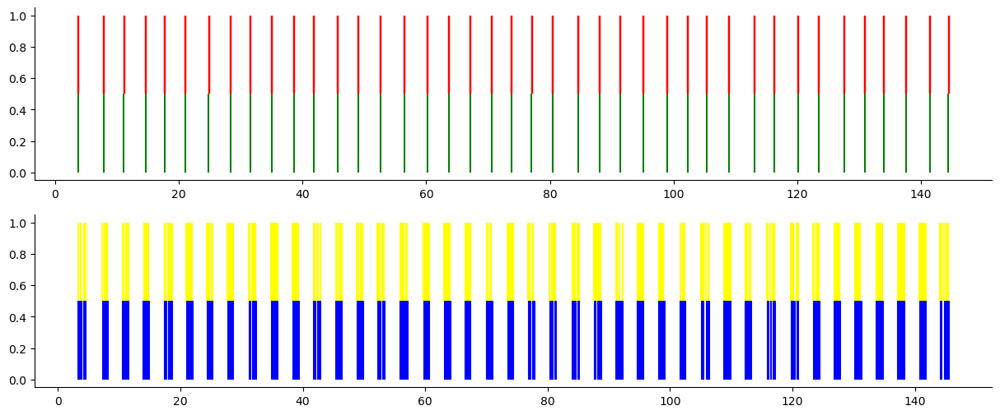

NAN percentage: 12%
9


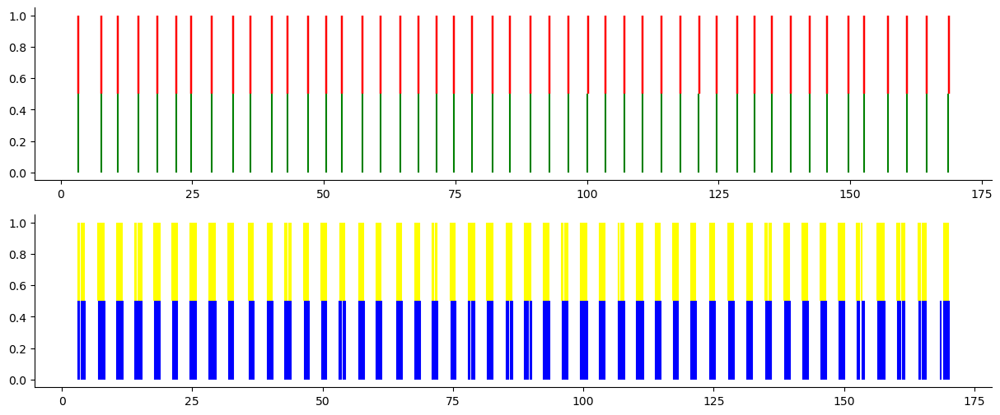

NAN percentage: 12%
10


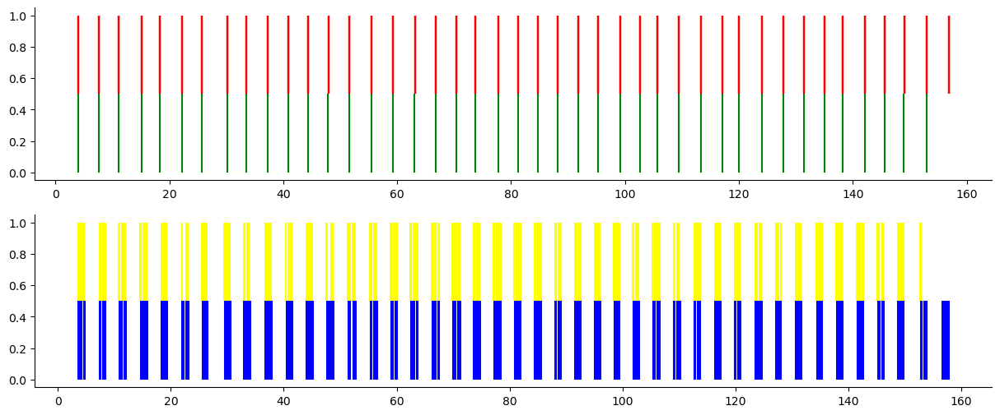

NAN percentage: 12%
P21 A1
1


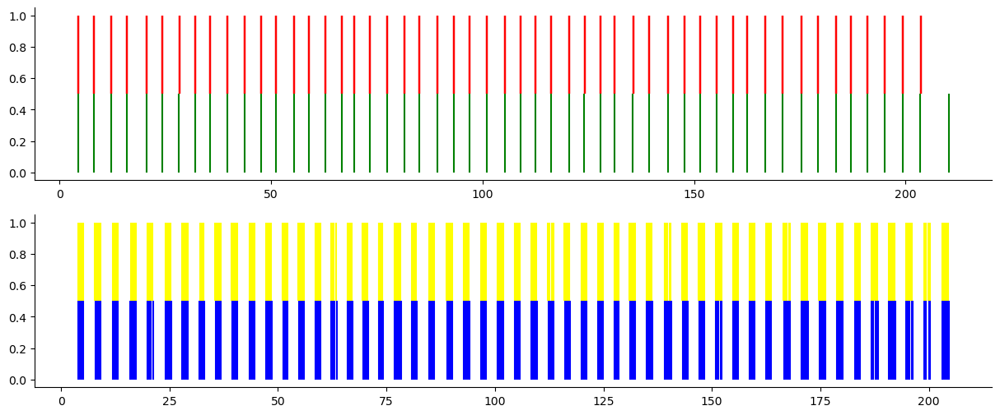

NAN percentage: 2%
2


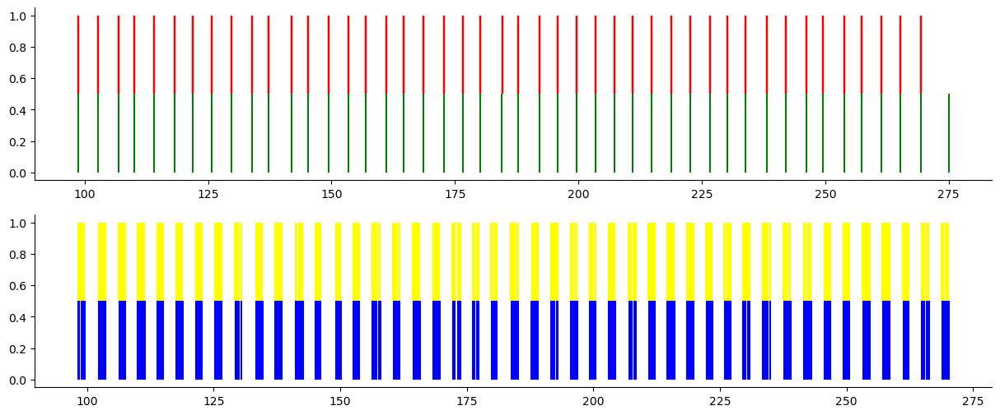

NAN percentage: 2%
3


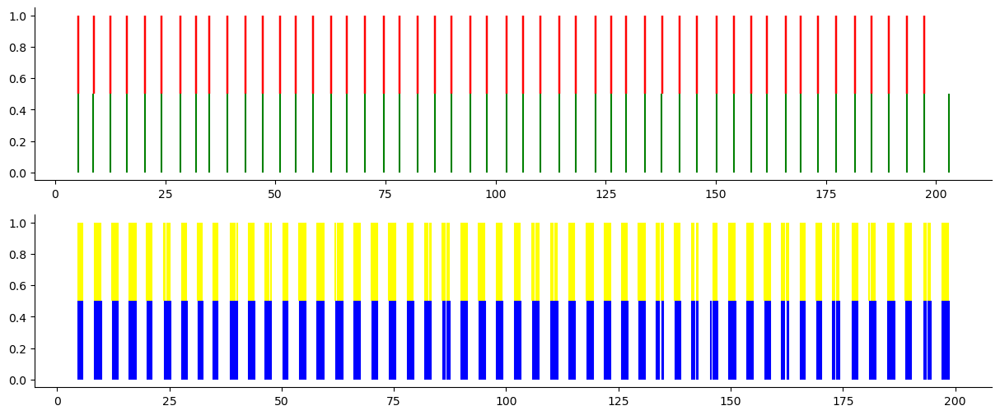

NAN percentage: 2%
4


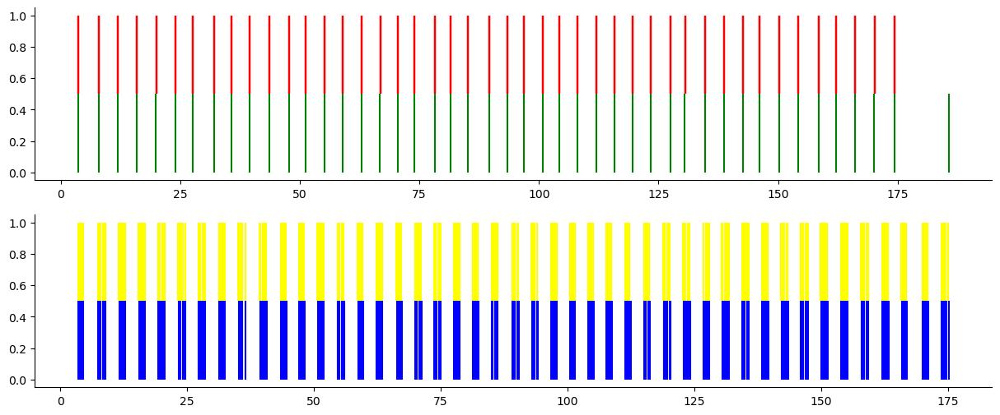

NAN percentage: 2%
5


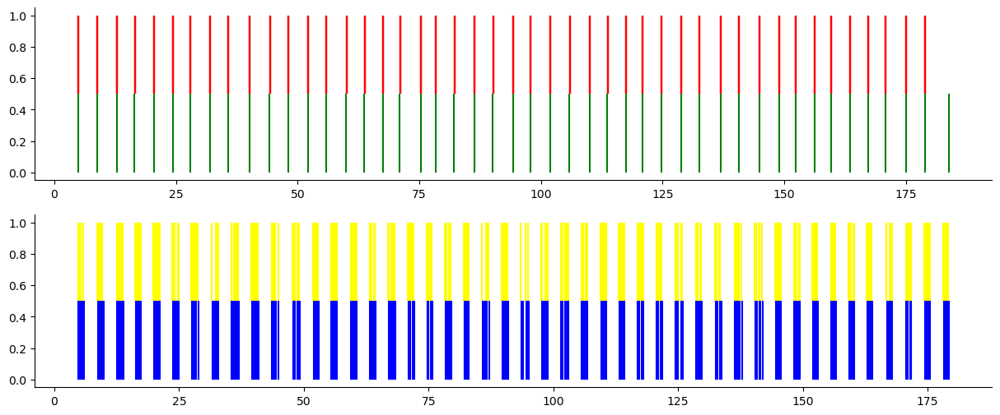

NAN percentage: 2%
6


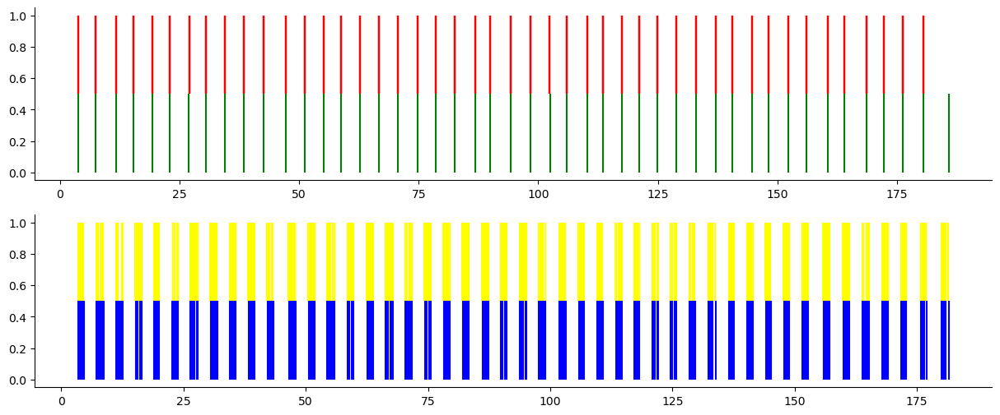

NAN percentage: 2%
7


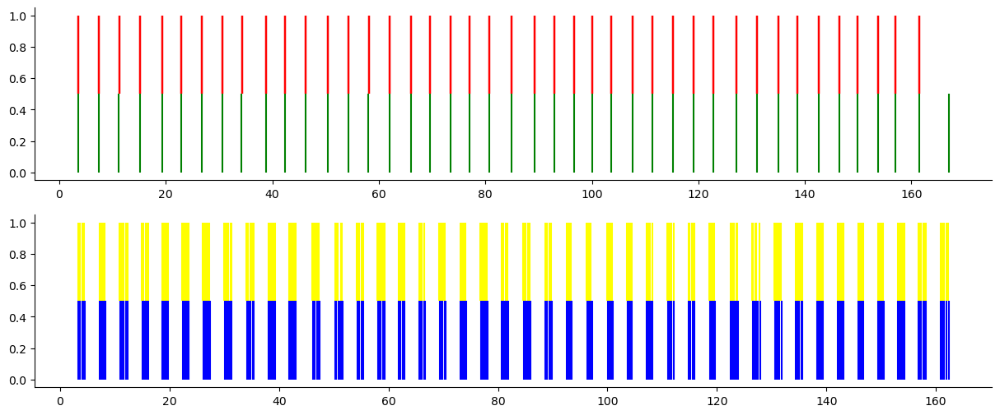

NAN percentage: 2%
8


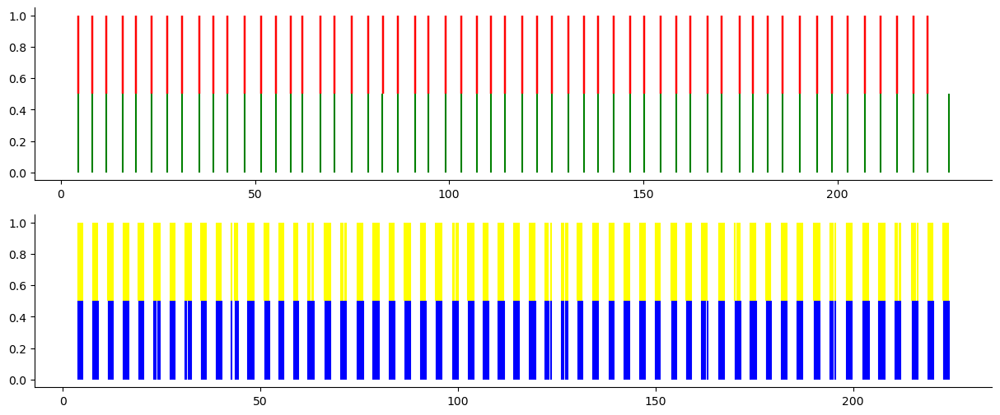

NAN percentage: 2%
9


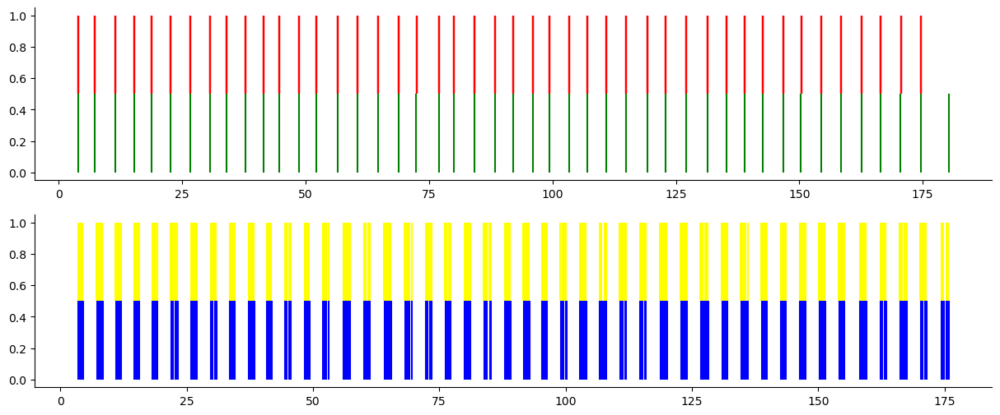

NAN percentage: 2%
10


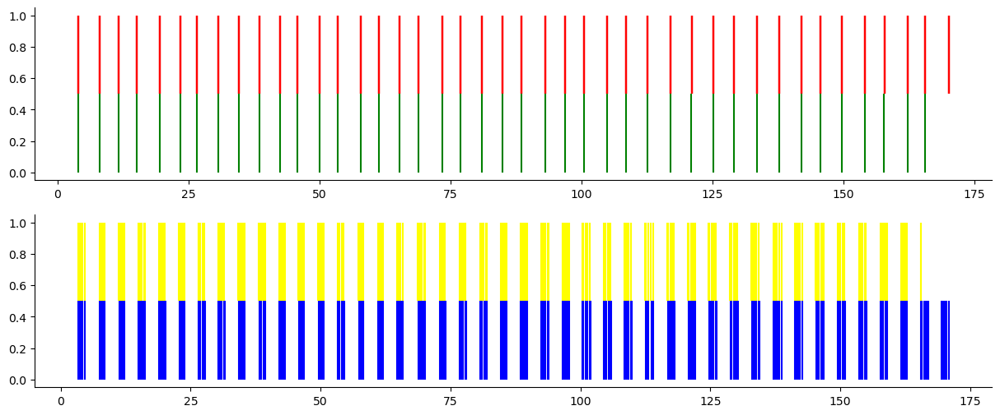

NAN percentage: 2%
P21 A2
1


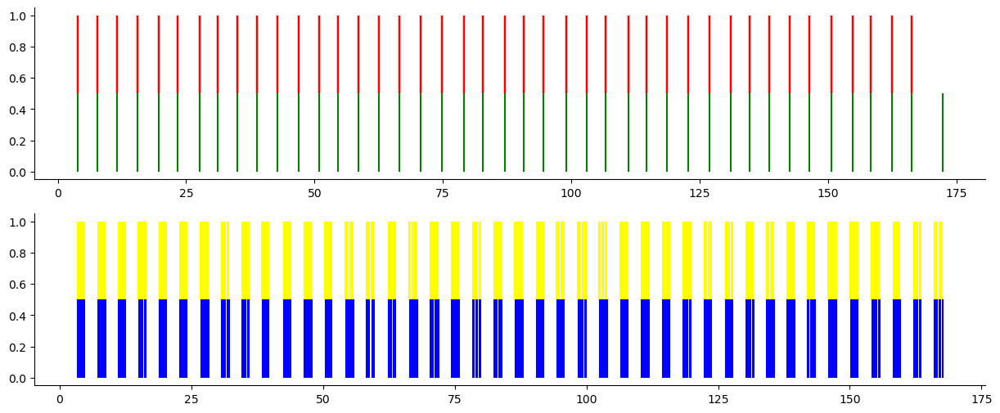

NAN percentage: 2%
2


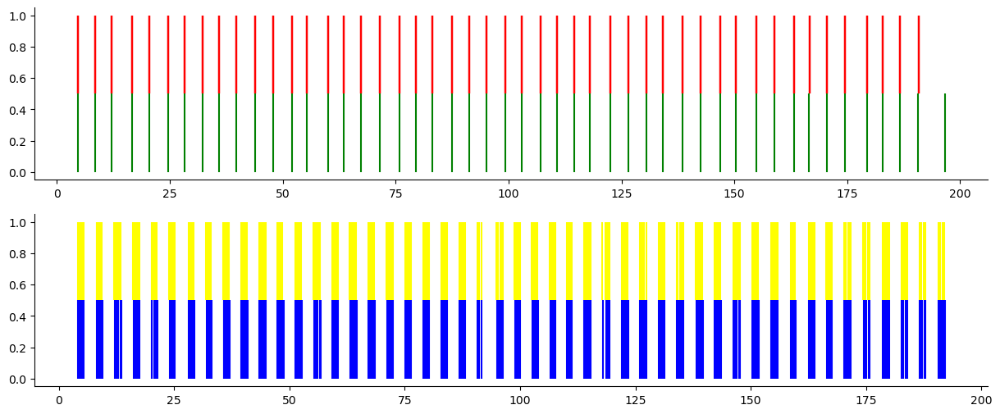

NAN percentage: 2%
3


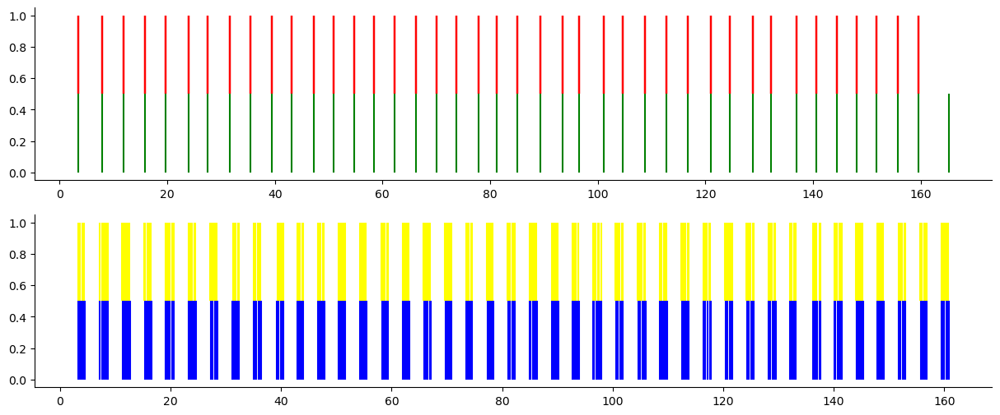

NAN percentage: 2%
4


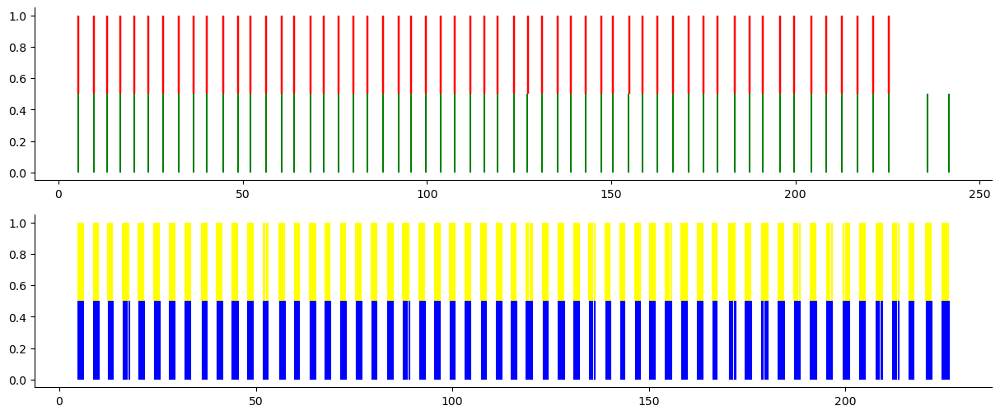

NAN percentage: 2%
5


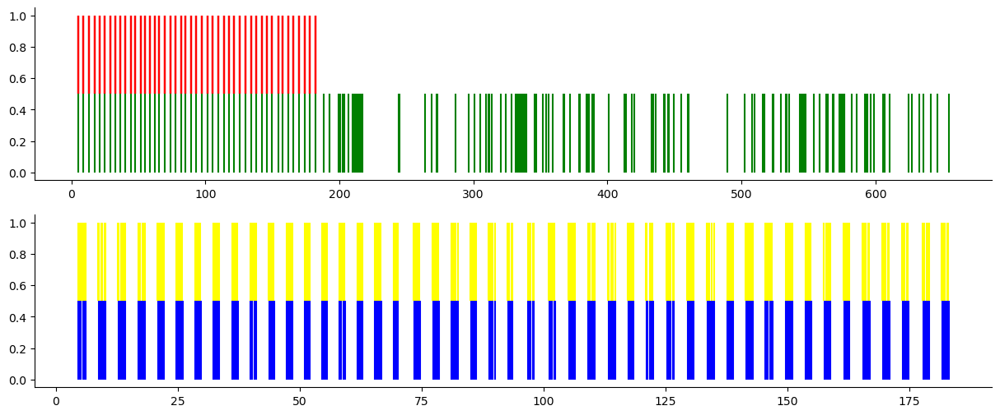

NAN percentage: 2%
6


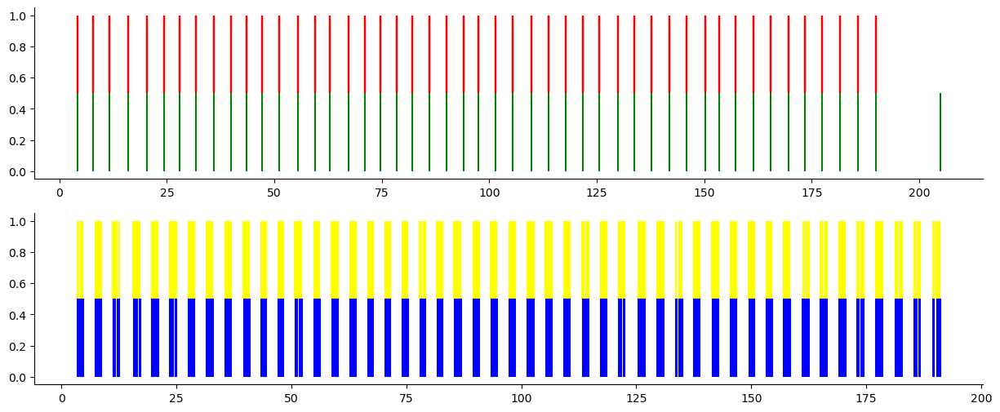

NAN percentage: 2%
7


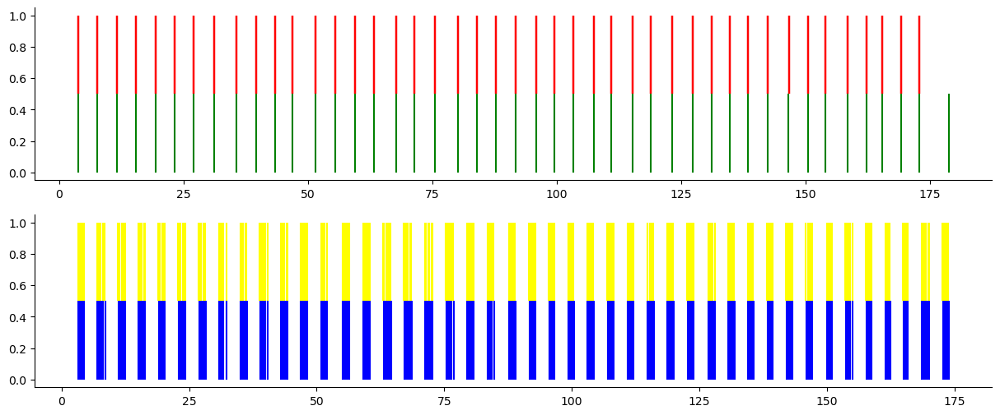

NAN percentage: 2%
8


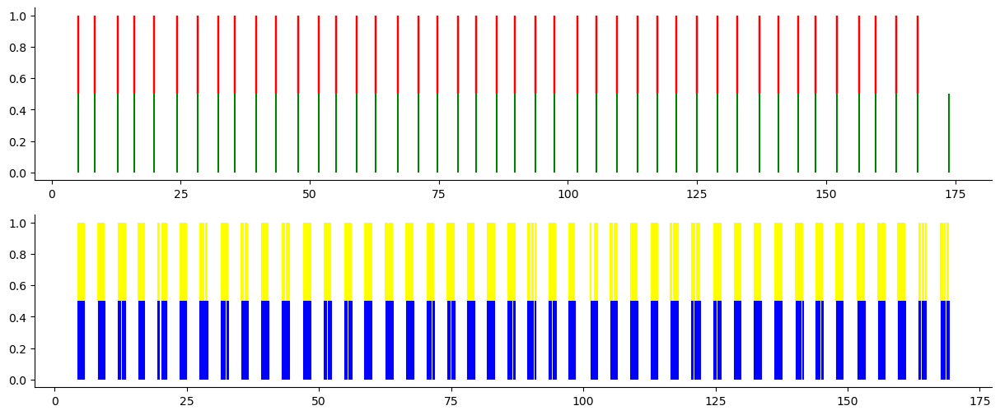

NAN percentage: 2%
9


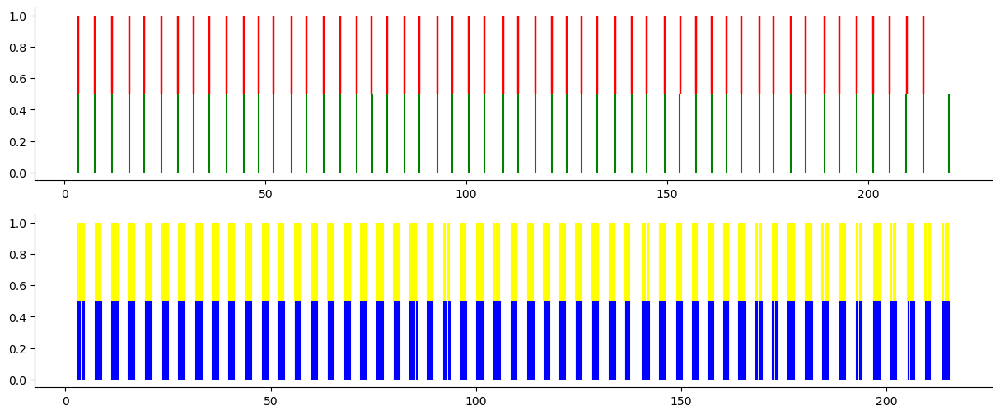

NAN percentage: 2%
10


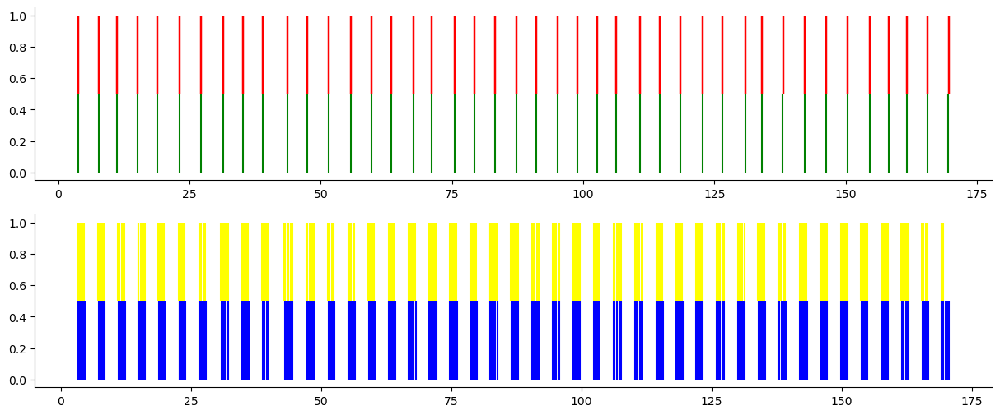

NAN percentage: 2%


In [41]:
for p in participants:
    p_code = p.split('P')[1]
    p_info = meta_info[meta_info.participant == p]
    # print(p_info)
    # loop through all sessions - this is one folder
    for s in sessions:
        print(p, s)
        s_code = s.split('A')[1]
        s_info = p_info[p_info.session == s]
        s_info = s_info.iloc[-1, :]

        if len(s_info) == 2:
            print(s_info)
        
        jatos_data = full_data[full_data.participant_id == int(p_code)]
        jatos_data = jatos_data[jatos_data.session_number == int(s_code)]

                    
        missing_blocks = s_info.missing_blocks
        original_block_list = np.arange(1, 11)
                    
        include_blocks = get_relevant_blocks(original_block_list, missing_blocks, s_info.reloaded_blocks)
                    
        
        for b, dt in enumerate(np.sort(np.unique(jatos_data.startup_datetime))):
            block_id = b+1
            
            if block_id in include_blocks:
                print(block_id)
                jatos_block_data = jatos_data[jatos_data.startup_datetime == dt]
                full_data.loc[jatos_block_data.index, 'block'] = block_id

                event_block_data = all_events[all_events.participant == p]
                event_block_data = event_block_data[event_block_data.session == s]
                event_block_data = event_block_data[event_block_data.block == block_id]

                diode_setup_block_data = diode_setup_data[diode_setup_data.participant_id == int(p_code)]
                diode_setup_block_data = diode_setup_block_data[diode_setup_block_data.session_number == int(s_code)]
                diode_setup_block_data = diode_setup_block_data[diode_setup_block_data.startup_datetime == dt]
                block_onset = s_info.use_block_onset
                if len(block_onset) > 1:
                    block_onset = block_onset.split(',')[b].strip(',')
                
                jatos_block_start = diode_setup_block_data.change_timestamps.iloc[0][int(block_onset)]

                block_info = all_blocks[all_blocks.participant == p]
                block_info = block_info[block_info.session == s]
                block_info = block_info[block_info.block_number == block_id]

                tap_block_data = all_taps[all_taps.participant == p]
                tap_block_data = tap_block_data[tap_block_data.session == s]
                tap_block_data = tap_block_data[tap_block_data.block_number == block_id]

                flash_ons_diode = []
                flash_ons_jatos  = []
                taps_on_sensor = []
                taps_jatos = []
                if len(block_info) == 0:
                    print(f'{p}, {s}, {block_id}, is unparsable.')
                
                if len(block_info) > 0:
                    flash_ons_jatos = (jatos_block_data.startTime - jatos_block_start + jatos_block_data.flashOnTime)/1000
                    flash_ons_diode = event_block_data.start_time - block_info['onset'].iloc[-1]
                    taps_on_sensor = tap_block_data.start_time - block_info['onset'].iloc[-1]
    
                    flash_ons_jatos = flash_ons_jatos[flash_ons_jatos>0]
                    flash_ons_diode = flash_ons_diode[flash_ons_diode>0]
                    taps_on_sensor = taps_on_sensor[taps_on_sensor>0]
    
                    taps_jatos =  (jatos_block_data.startTime - jatos_block_start + jatos_block_data.flashOnTime + jatos_block_data.touchOn)/1000
                    full_data.loc[flash_ons_jatos.index.values, 'event_onset_in_block'] = flash_ons_jatos.values
                    try:
                        full_data.loc[flash_ons_jatos.index.values, 'tap_onset_in_block'] = taps_jatos.values
                    except ValueError as e:
                        print(e)
                        pass
                        
                    for x in flash_ons_jatos.index.values:
                        jatos_onset = full_data.loc[x, 'event_onset_in_block']
                        try:
                            diode_onset = flash_ons_diode.values[np.argmin(abs(flash_ons_diode.values - jatos_onset))]
                        except ValueError as e:
                            print(e)
                            diode_onset = np.nan
                        jatos_tap = full_data.loc[x, 'tap_onset_in_block']
                        
                        if abs(diode_onset - jatos_onset) < 0.1:
                            full_data.loc[x, 'diode_onset_in_block'] = diode_onset
                        else:
                            pass
    
                        sound_onset = taps_on_sensor - jatos_tap
                        earlier_taps = sound_onset[sound_onset <= 0]
                        if len(earlier_taps) > 0:
                            sound_tap_idx = np.argmin(abs(earlier_taps))
                            sound_tap = earlier_taps.values[sound_tap_idx] 
                            sound_tap += jatos_tap
                            
                            if abs(earlier_taps.values[sound_tap_idx]) < 0.3:
                                full_data.loc[x, 'tap_sound_onset_in_block'] = sound_tap
                                jatos_block_data.loc[x, 'tap_sound_onset_in_block'] = sound_tap
                                
                            else:
                                pass
    
    
                    fig,axs = plt.subplots(2, 1, figsize = (15, 6))
                    axs[0].vlines(flash_ons_diode, 0, 0.5, color = 'green')
                    axs[0].vlines(flash_ons_jatos, 0.5, 1, color = 'red')
                    axs[1].vlines(taps_jatos, 0, 0.5, color = 'blue')
                    axs[1].vlines(jatos_block_data['tap_sound_onset_in_block'], 0.5, 1, color = 'yellow')
                    plt.show()
    
                
                jatos_data = full_data[full_data.participant_id == int(p_code)]
                jatos_data = jatos_data[jatos_data.session_number == int(s_code)]
                print(f"NAN percentage: {round(sum(np.isnan(jatos_data['tap_sound_onset_in_block']))/len(jatos_data) * 100)}%")
                

-95.0


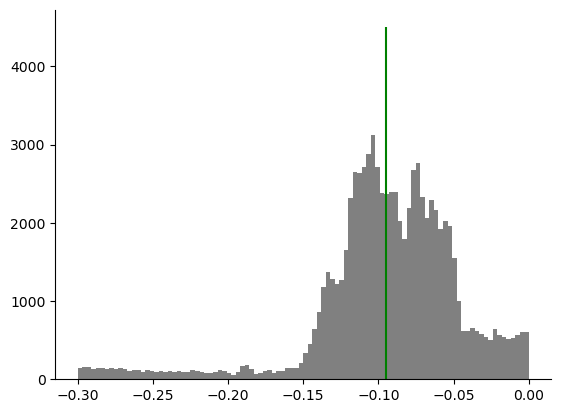

In [30]:
plt.hist(full_data.tap_sound_onset_in_block - full_data.tap_onset_in_block, bins = 100, color = 'grey')
plt.vlines(np.mean(full_data.tap_sound_onset_in_block - full_data.tap_onset_in_block), 0, 4500, color = 'green')

print(round(np.mean(full_data.tap_sound_onset_in_block - full_data.tap_onset_in_block), 3)*1000)

plt.savefig(f'{results_path}/sound_onset_delay_{study_name}.svg')

-12.0


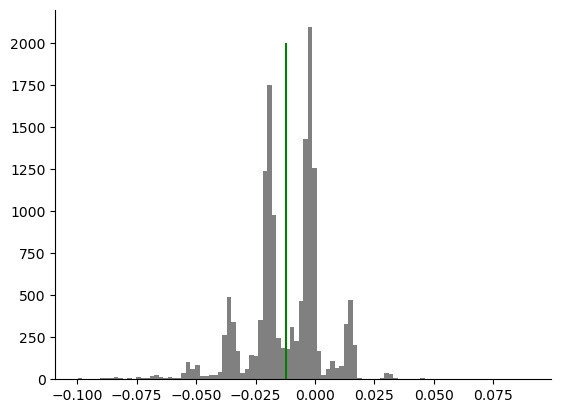

In [31]:
plt.hist(full_data[full_data.choiceOrder == 0].diode_onset_in_block - full_data[full_data.choiceOrder == 0].event_onset_in_block, bins = 100, color = 'grey')
plt.vlines(np.mean(full_data[full_data.choiceOrder == 0].diode_onset_in_block - full_data[full_data.choiceOrder == 0].event_onset_in_block), 0, 2000, color = 'green')
print(round(np.mean(full_data[full_data.choiceOrder == 0].diode_onset_in_block - full_data[full_data.choiceOrder == 0].event_onset_in_block), 3)*1000);
plt.savefig(f'{results_path}/light_onset_delay_{study_name}.svg')

In [32]:
full_data['start_event_in_block'] = full_data['event_onset_in_block']
full_data['start_trial_in_block'] = full_data['start_event_in_block'] - (full_data['flashOnTime']/1000)

full_data.to_csv(complete_output_path, index = False)

In [33]:
## Recreate the movement rates with sound and light data
noise_sound_df = full_data[full_data.success == 1].reset_index(drop = True)
noise_sound_df['relative_tap_onset'] = (noise_sound_df['tap_sound_onset_in_block'] - noise_sound_df['diode_onset_in_block']) * 1000
noise_sound_df['relative_tap_offset'] =  (noise_sound_df['relative_tap_onset'] + 70)

no flash no jump


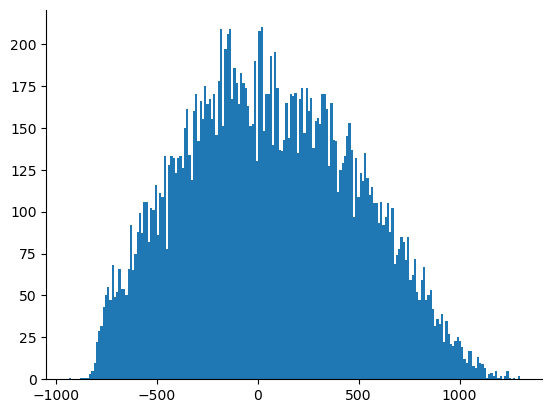

no flash jump


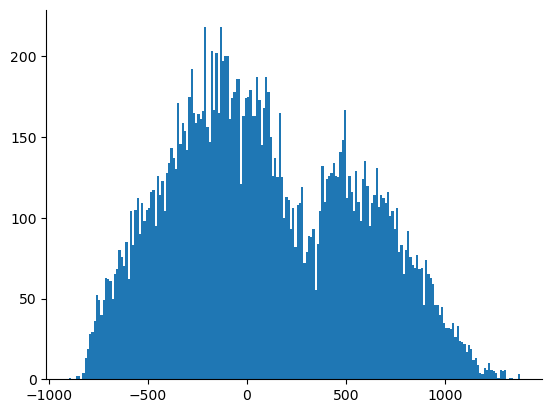

flash no jump


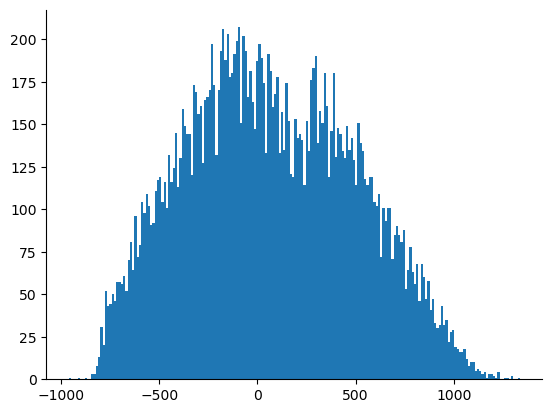

flash jump


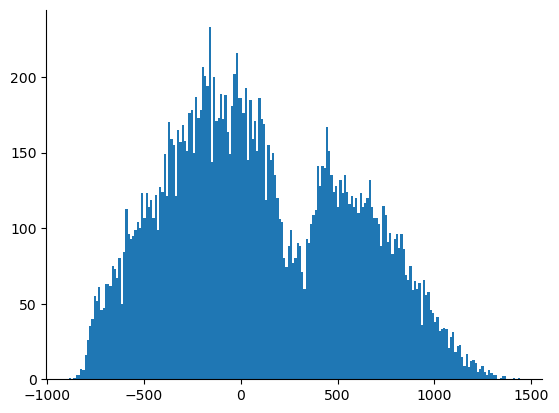

In [34]:
#plt.hist(noise_sound_df['relative_tap_onset'], bins = 100);

for flash in [0, 1]:
    for jump in [0, 1]:
        part_data = noise_sound_df[noise_sound_df.flashShown == flash]
        part_data = part_data[part_data.stimJumped == jump]
        print(['no flash', 'flash'][flash], ['no jump', 'jump'][jump])
        plt.hist(part_data['relative_tap_onset'], bins = 200)
        plt.show()

In [35]:
noise_sound_df = noise_sound_df.dropna(axis = 0, subset = 'relative_tap_onset')
noise_sound_df

,success,test_part,trial_type,trial_index,time_elapsed,internal_node_id,subject,component,startup_time,startup_datetime,...,session_number,event_onset_in_block,block,tap_onset_in_block,diode_onset_in_block,tap_sound_onset_in_block,start_event_in_block,start_trial_in_block,relative_tap_onset,relative_tap_offset
0,1.0,trial,canvas-mi-serial,4,24258,0.0-2.0-0.0-0.0,20412,Trials_Serial,505.7,1.675355e+09,...,2.0,3.906567,8.0,3.622299,3.867992,3.501156,3.906567,3.622299,-366.835268,-296.835268
1,1.0,trial,canvas-mi-serial,4,24258,0.0-2.0-0.0-0.0,20412,Trials_Serial,505.7,1.675355e+09,...,2.0,3.906567,8.0,3.821299,3.867992,3.810582,3.906567,3.622299,-57.409301,12.590699
2,1.0,trial,canvas-mi-serial,4,24258,0.0-2.0-0.0-0.0,20412,Trials_Serial,505.7,1.675355e+09,...,2.0,3.906567,8.0,4.020299,3.867992,3.903569,3.906567,3.622299,35.577840,105.577840
5,1.0,trial,canvas-mi-serial,4,24258,0.0-2.0-0.0-0.0,20412,Trials_Serial,505.7,1.675355e+09,...,2.0,3.906567,8.0,4.645299,3.867992,4.528226,3.906567,3.622299,660.234781,730.234781
6,1.0,trial,canvas-mi-serial,6,28866,0.0-2.0-0.1-0.1,20412,Trials_Serial,505.7,1.675355e+09,...,2.0,8.427078,8.0,8.242299,8.422339,8.235689,8.427078,8.242299,-186.650039,-116.650039
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95995,1.0,trial,canvas-mi-serial,82,159759,0.0-2.0-0.39-0.39,20412,Trials_Serial,507.3,1.675355e+09,...,2.0,145.617867,7.0,145.540776,145.605789,145.401101,145.617867,145.350776,-204.688181,-134.688181
95996,1.0,trial,canvas-mi-serial,82,159759,0.0-2.0-0.39-0.39,20412,Trials_Serial,507.3,1.675355e+09,...,2.0,145.617867,7.0,145.747776,145.605789,145.704423,145.617867,145.350776,98.633932,168.633932
95997,1.0,trial,canvas-mi-serial,82,159759,0.0-2.0-0.39-0.39,20412,Trials_Serial,507.3,1.675355e+09,...,2.0,145.617867,7.0,146.006776,145.605789,145.998733,145.617867,145.350776,392.944700,462.944700
95998,1.0,trial,canvas-mi-serial,82,159759,0.0-2.0-0.39-0.39,20412,Trials_Serial,507.3,1.675355e+09,...,2.0,145.617867,7.0,146.206776,145.605789,146.148916,145.617867,145.350776,543.126766,613.126766


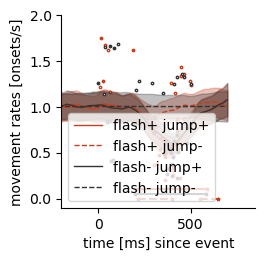

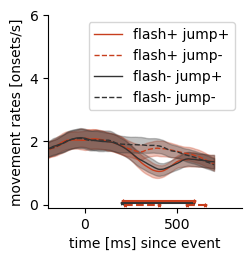

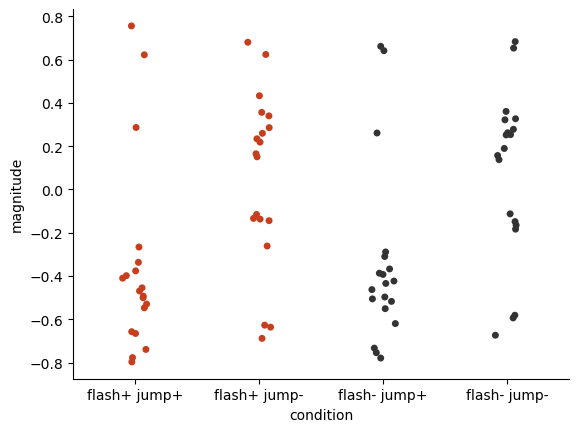

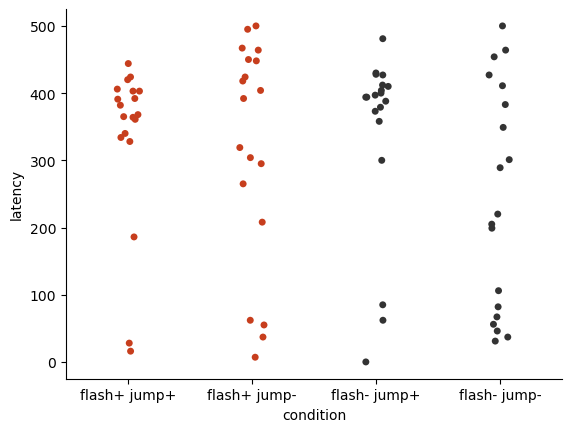

Results from ANOVA with 
DEPENDENT variable: MAGNITUDE; 
INDEPENDENT variables: ['FLASH_SHOWN', 'STIM_JUMPED'], 
GROUPED by: PARTICIPANT_ID


                        Anova
                        F Value Num DF  Den DF Pr > F
-----------------------------------------------------
flash_shown              2.1738 1.0000 18.0000 0.1577
stim_jumped             26.8811 1.0000 18.0000 0.0001
flash_shown:stim_jumped  0.0824 1.0000 18.0000 0.7773

Results from ANOVA with 
DEPENDENT variable: LATENCY; 
INDEPENDENT variables: ['FLASH_SHOWN', 'STIM_JUMPED'], 
GROUPED by: PARTICIPANT_ID


                        Anova
                        F Value Num DF  Den DF Pr > F
-----------------------------------------------------
flash_shown              3.6669 1.0000 18.0000 0.0715
stim_jumped              4.1201 1.0000 18.0000 0.0574
flash_shown:stim_jumped  5.0182 1.0000 18.0000 0.0379



In [36]:
movement_rate_metrics_path = f'{results_path}/movement_rate_metrics_sensors_{study_name}.csv' # here we put the path name for the rate metrics
movement_rate_figure_path = f'{results_path}/movement_rate_figure_sensors_{study_name}.svg' # here we put the path name for the rate metrics
movement_rate_test_path  = f'{data_path}/test_files/movement_rate_test_sensors_{study_name}.csv' # this is a test file we create manually by saving the first version of the analysis testing for validity
movement_rate_cluster_file = f'{results_path}/movement_rate_clusters_sensors_{study_name}.csv'
raw_movement_rate_file = f'{results_path}/raw_movement_rate_clusters_sensors_{study_name}.svg'

rate_analysis_parameters = {'window_start': -300,
                            'window_end': 700,
                            'search_start': 0,
                            'search_end': 500,
                            'baseline_start': -100,
                            'baseline_end': 0,
                            'alpha': 1/50}

analysis_rates(noise_sound_df,
               'relative_tap_onset',
               'relative_tap_offset',
               participant_col,
               rate_analysis_parameters,
               touch_order_col,
               conditions_rates, 
               color_rates,
               linestyles,
               movement_rate_metrics_path,
               movement_rate_figure_path,
               raw_movement_rate_file,
               dependent_variables,
               independent_variables,
               baseline_name,
               results_path,
               movement_rate_cluster_file)

## Saccades

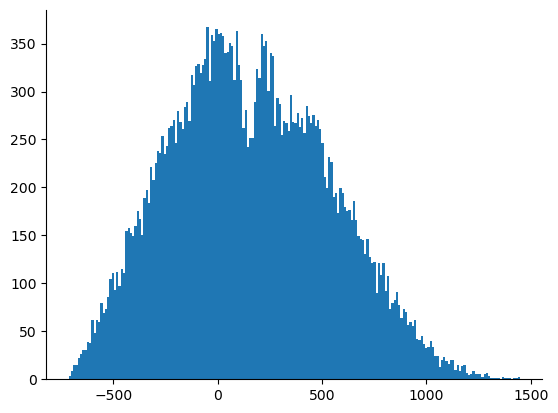

In [37]:
all_saccades = pd.read_csv('../../../results/inlab/all_saccades.csv')
target_saccades = all_saccades[all_saccades['condition'] == condition_code].reset_index(drop = True)

target_saccades['relative_eye_onset'] = target_saccades['relative_eye_movement_time'] * 1000
target_saccades.loc[target_saccades['relative_eye_onset']<= -1000, 'relative_eye_onset'] = np.nan
 
target_saccades['relative_eye_offset'] = target_saccades['relative_eye_onset'] + target_saccades['duration'] * 1000
target_saccades['flash'] = target_saccades['flash_shown']
target_saccades['shift'] = target_saccades['jump_shown']

plt.hist(target_saccades.relative_eye_onset, bins = 200);

In [38]:
for p in np.unique(target_saccades.participant):
    p_saccades = target_saccades[target_saccades.participant == p]
    for s in np.unique(p_saccades.session):
        s_saccades = p_saccades[p_saccades.session == s]
        for b in np.unique(s_saccades.block):
            b_saccades = s_saccades[s_saccades.block == b]
            for t in np.unique(b_saccades.trial_n):
                t_saccades = b_saccades[b_saccades.trial_n == t]
                for n, idx in enumerate(t_saccades.index):
                    target_saccades.loc[idx, 'choiceOrder'] = int(n + 1)

In [39]:
conditions_rates = {
    'flash+ jump+': {'flash': 1,
                  'shift': 1},
    'flash+ jump-': {'flash': 1,
                  'shift': 0},
    'flash- jump+': {'flash': 0,
                  'shift': 1},
    'flash- jump-': {'flash': 0,
                  'shift': 0},
}

gaze_metrics_path = f'{results_path}/gaze_rate_metrics_{study_name}.csv'
gaze_rate_figure_path = f'{results_path}/gaze_rate_figure_{study_name}.svg'
raw_gaze_rate_file = f'{results_path}/raw_gaze_rate_clusters_{study_name}.svg'
gaze_rate_cluster_file = f'{results_path}/gaze_rate_clusters_{study_name}.csv'

rate_analysis_parameters = {'window_start': -700,
                            'window_end': 1500,
                            'search_start': 0,
                            'search_end': 300,
                            'baseline_start': -100,
                            'baseline_end': 0,
                            'alpha': 1/50}

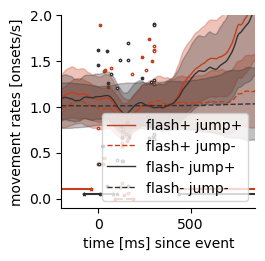

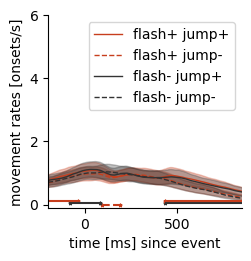

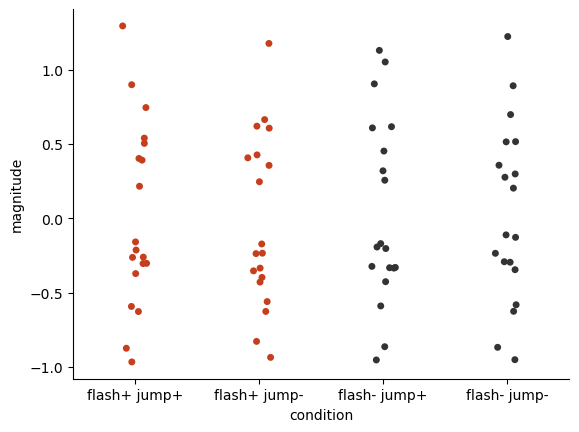

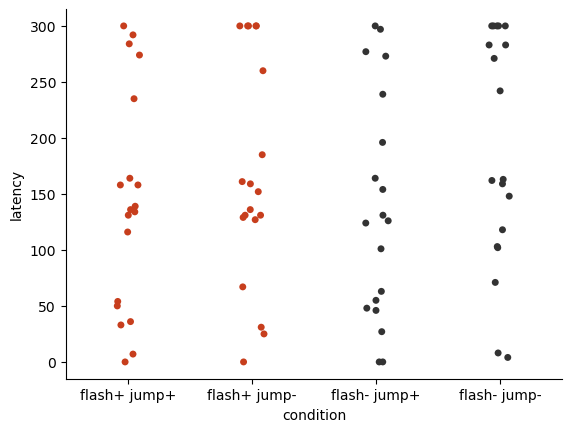

Results from ANOVA with 
DEPENDENT variable: MAGNITUDE; 
INDEPENDENT variables: ['FLASH_SHOWN', 'STIM_JUMPED'], 
GROUPED by: PARTICIPANT


                        Anova
                        F Value Num DF  Den DF Pr > F
-----------------------------------------------------
flash_shown              3.0140 1.0000 18.0000 0.0996
stim_jumped              0.2395 1.0000 18.0000 0.6305
flash_shown:stim_jumped  0.5954 1.0000 18.0000 0.4503

Results from ANOVA with 
DEPENDENT variable: LATENCY; 
INDEPENDENT variables: ['FLASH_SHOWN', 'STIM_JUMPED'], 
GROUPED by: PARTICIPANT


                        Anova
                        F Value Num DF  Den DF Pr > F
-----------------------------------------------------
flash_shown              0.2006 1.0000 18.0000 0.6596
stim_jumped              4.0104 1.0000 18.0000 0.0605
flash_shown:stim_jumped  0.5567 1.0000 18.0000 0.4652



In [40]:
analysis_rates(target_saccades,
               'relative_eye_offset',
               'relative_eye_onset',
               'participant',
               rate_analysis_parameters,
               touch_order_col,
               conditions_rates, 
               color_rates,
               linestyles,
               gaze_metrics_path,
               gaze_rate_figure_path,
               raw_gaze_rate_file,
               dependent_variables,
               independent_variables,
               baseline_name,
               results_path,
               gaze_rate_cluster_file)